# Telecom Churn Prediction - Actual Workbook

**Authors:** Badari and Saurabh

# Problem statement

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business
goal. To reduce customer churn, telecom companies need to predict which customers are at high risk of churn. In this project, you will analyze customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn, and identify the main indicators of churn.

In this competition, your goal is *to build a machine learning model that is able to predict churning customers based on the features provided for their usage.*

**Customer behaviour during churn:**

Customers usually do not decide to switch to another competitor instantly, but rather over a
period of time (this is especially applicable to high-value customers). In churn prediction, we
assume that there are three phases of customer lifecycle :

1. <u>The ‘good’ phase:</u> In this phase, the customer is happy with the service and behaves as usual.

2. <u>The ‘action’ phase:</u> The customer experience starts to sore in this phase, for e.g. he/she gets a compelling offer from a competitor, faces unjust charges, becomes unhappy with service quality etc. In this phase, the customer usually shows different behaviour than the ‘good’ months. It is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken at this point (such as matching the competitor’s offer/improving the service quality etc.)

3. <u>The ‘churn’ phase:</u> In this phase, the customer is said to have churned. In this case, since you are working over a four-month window, the first two months are the ‘good’ phase, the third month is the ‘action’ phase, while the fourth month (September) is the ‘churn’ phase.

# Business Goal
In this project, you will analyse customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn and identify the main indicators of churn.

We are going to follow the process called CRISP-DM.

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/b/b9/CRISP-DM_Process_Diagram.png/639px-CRISP-DM_Process_Diagram.png" style="height: 400px; width:400px;"/>

After Business and Data Understanding via EDA, we want to prepare data for modelling. Then evaluate and submit our predictions.

# Loading dependencies & datasets

Lets start by loading our dependencies. We can keep adding any imports to this cell block, as we write mode and mode code.

In [1]:
#Data Structures
import pandas as pd
import numpy as np
import re
import os
from datetime import datetime

### For installing missingno library, type this command in terminal
#pip install missingno

import missingno as msno

#Sklearn
from sklearn import metrics
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import confusion_matrix, precision_score, recall_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import ConfusionMatrixDisplay
import itertools
from sklearn.feature_selection import RFE
#from imblearn.over_sampling import SMOTE
#from imblearn.over_sampling import RandomOverSampler 
from imblearn.combine import SMOTETomek

#from sklearn.utils import resample 

from collections import Counter

#Plotting
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

#Others
import warnings
warnings.filterwarnings('ignore')

from IPython.display import Markdown ,display,HTML
sns.set(style="whitegrid")
pd.set_option('display.max_colwidth',None)
pd.set_option("display.max_columns", 300)
pd.set_option("display.max_rows", 300)
pd.options.display.float_format='{:20.2f}'.format

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

%matplotlib inline

#### DF to consolidate result

In [2]:
consolidate_summary = pd.DataFrame()

## Helper functions

In [3]:
def info_log(string):
    display(Markdown("> <span style='color:blue'>"+string+"</span>"))
    
def insert_line_break():
    display(Markdown("> <hr style='width: 80%;height: 5px;color: blue;'>"))
    

def header(string):
    display(Markdown("------- "))
    display(Markdown("### "+string))
    
def header_red(string):
    display(Markdown("> <span style='color:red'"+string))
    
def get_variable_type(element): #Checking if a column is Continuous or Categorical
    if element==0:
        return "Not Known"
    elif element<20 and element!=0:
        return "Categorical"
    elif element>=20 and element!=0:
        return "Continuous"

def add_to_global_summary(df) :
    global consolidate_summary
    #consolidate_summary = consolidate_summary.append(df,ignore_index=True)    
    consolidate_summary = pd.concat([consolidate_summary, df])

## Misc Helper functions

In [4]:
def remove_col(col):
    if col in cat_cols:
        cat_cols.remove(col)
    elif col in date_cols:
        date_cols.remove(col)
    elif col in num_cols:
        num_cols.remove(col)
    else:
        print(col," not present")
        return False
    return True

def rename_col(original, new):
    for i,col in enumerate(cat_cols):
        if col == original:
            cat_cols[i] = new
            return
    for i,col in enumerate(date_cols):
        if col == original:
            date_cols[i] = new
            return
    for i,col in enumerate(num_cols):
        if col == original:
            num_cols[i] = new
            return

#method to get difference in two dates in days fomart
def diffdates(date_str,lastdate_str):
    if pd.isnull(date_str):
        return -1
    else:
        date = datetime.strptime(date_str, "%m/%d/%Y")
        lastdate = datetime.strptime(lastdate_str, "%m/%d/%Y")
        return (lastdate - date).days

def heatmap(x,y,dataframe):
    plt.figure(figsize=(x,y))
    sns.heatmap(dataframe.corr(),cmap="OrRd",annot=True)
    plt.show()
    
def eloborate(col):
    arr = col.split("_")
    new_col = ""
    for i in arr:
        if i in list(data_dict.Acronyms):
            new_col+=data_dict[data_dict.Acronyms == i].Description.values[0]+"_"
        else:
            new_col+=i+"_"
    return new_col[0:-1]


def print_fetch_null_percentage(data, threshold, printList=False):
    missing_data_cols = data.columns[data.isnull().mean()*100 >= threshold]
    display(missing_data_cols)
    
    missing_data = (data.isnull().mean()*100).sort_values(ascending=False)
    if printList:
        print("List of missing data in %  terms:")
        display(missing_data)
        
    return missing_data, missing_data_cols

## TODO can remove below fucntion
def get_null_percentage_cols(data, threshold):
    missing_data, missing_data_cols =  print_fetch_null_percentage(data, threshold, False)
    percent_missing = data.isnull().mean()*100
    missing_value_df = pd.DataFrame({'column_name': data.columns,
                                 'percent_missing': percent_missing})
    
    display(missing_value_df.sort_values('percent_missing', inplace=True, ascending=False))
    
    missing_value_df = missing_value_df[missing_value_df.percent_missing > 70]
    
    display(missing_value_df)
    
    return missing_value_df
    
def fill_null_na(data,cols_to_fillna):
    #data[cols_to_fillna] = data[cols_to_fillna].fillna(value=0)
    for col in cols_to_fillna:
        if (col in data.columns):
            data[col].fillna(value=0, inplace = True)

def remove_unique_val_cols(df):
    for col in df.columns:
        if df[col].value_counts().count() == 1:
            print("Droping ",col)
            if(remove_col(col)):
                df.drop(col,axis=1,inplace=True)


### Functions to remove outliers

In [5]:
def cap_outliers(array, k=3):
    upper_limit = array.mean() + k*array.std()
    lower_limit = array.mean() - k*array.std()
    array[array<lower_limit] = lower_limit
    array[array>upper_limit] = upper_limit
    return array

def drop_outliers_from_series(colname, data):
    # calculate the Q1 and Q3
    Q1 = data[colname].quantile(0.25)
    Q3 = data[colname].quantile(0.75)

    # calculate the IQR
    IQR = Q3 - Q1
    
    # filter out the outliers
    df_no_outliers = data[(data[colname] > Q1 - 1.5 * IQR) & (data[colname] < Q3 + 1.5 * IQR)]
    
    return df_no_outliers, Q1, Q3
        
def drop_outliers_from_dataframe(data):
    for column in data.columns:
        data = drop_outliers_from_series(data[column], data)
    return data



In [6]:
def get_high_value_customers(data):
    data['total_data_rech_6'] = data.total_rech_data_6 * data.av_rech_amt_data_6
    data['total_data_rech_7'] = data.total_rech_data_7 * data.av_rech_amt_data_7
    data['total_data_rech_8'] = data.total_rech_data_8 * data.av_rech_amt_data_8
    
    # calculate total recharge amount for June, July and August--> call recharge amount + data recharge amount
    data['amt_data_6'] = data.total_rech_amt_6 + data.total_data_rech_6
    data['amt_data_7'] = data.total_rech_amt_7 + data.total_data_rech_7
    data['amt_data_8'] = data.total_rech_amt_8 + data.total_data_rech_8
    
    total_amt = (data.amt_data_6 + data.amt_data_7+data.amt_data_8).sum()
    
    # calculate average recharge done by customer in June and July
    data['av_amt_data_6_7_8'] = (data.amt_data_6 + data.amt_data_7+data.amt_data_8)/3
    
    # look at the 70th percentile recharge amount
    print("Recharge amount at 70th percentile: {0}".format(data.av_amt_data_6_7_8.quantile(0.70)))
    
    # retain only those customers who have recharged their mobiles with more than or equal to 70th percentile amount
    data_filtered = data.loc[data.av_amt_data_6_7_8 >= data.av_amt_data_6_7_8.quantile(0.70), :]
    data_filtered = data_filtered.reset_index(drop=True)
    
    print("Total amount : ",total_amt)
    print("Total amount for high value customers : ",total_amt)
    print("Percent : ",(data_filtered.amt_data_6 + data_filtered.amt_data_7+data_filtered.amt_data_8).sum()/total_amt*100)
    
    # delete variables created to filter high-value customers
    data_filtered = data_filtered.drop(['total_data_rech_6', 'total_data_rech_7', 'total_data_rech_8', 'amt_data_6', 'amt_data_7', 'amt_data_8', 'av_amt_data_6_7_8'], axis=1)
    data = data.drop(['total_data_rech_6', 'total_data_rech_7', 'total_data_rech_8', 'amt_data_6', 'amt_data_7', 'amt_data_8', 'av_amt_data_6_7_8'], axis=1)
    
    return data,data_filtered

In [7]:
#method to get impute data preprocessing
def impute_churn_data(data):
    
    # create a list of recharge columns where we will impute missing values with zeroes
    print("Imputing data with 0")
    zero_impute = ['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8',
                   'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 
                   'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8']
    data[zero_impute] = data[zero_impute].apply(lambda x: x.fillna(0))
    
    remove_unique_val_cols(data)
    
     # Converting the date columns to number of days from last date of the month
    print("Converting date columns to days from last date of the month")
    last_date_of_month_6 = "6/30/2014"
    last_date_of_month_7 = "7/31/2014"
    last_date_of_month_8 = "8/31/2014"
    
    data.date_of_last_rech_6 = data.date_of_last_rech_6.apply(lambda date : diffdates(date,last_date_of_month_6))
    data.date_of_last_rech_7 = data.date_of_last_rech_7.apply(lambda date : diffdates(date,last_date_of_month_7))
    data.date_of_last_rech_8 = data.date_of_last_rech_8.apply(lambda date : diffdates(date,last_date_of_month_8))
    data.date_of_last_rech_data_6 = data.date_of_last_rech_data_6.apply(lambda date : diffdates(date,last_date_of_month_6))
    data.date_of_last_rech_data_7 = data.date_of_last_rech_data_7.apply(lambda date : diffdates(date,last_date_of_month_7))
    data.date_of_last_rech_data_8 = data.date_of_last_rech_data_8.apply(lambda date : diffdates(date,last_date_of_month_8))
    
    # Sachet recharge are Service schemes with validity smaller than a month. 
    # This means that the days of recahrge in sachet recharge should be less than 30. 
    # Any service schemes beyond 29 days should mean that the client has done a monyhly recharge or the entry is wrong. 
    # Let us cap the values beyond 29 days by the highest number of days recharge below 30 days.
    
    data['sachet_2g_6'] = data['sachet_2g_6'].clip(0,28)
    data['sachet_2g_7'] = data['sachet_2g_7'].clip(0,29)
    data['sachet_2g_8'] = data['sachet_2g_8'].clip(0,29)
    data['sachet_3g_7'] = data['sachet_3g_7'].clip(0,24)
    data['sachet_3g_8'] = data['sachet_3g_8'].clip(0,29)
    
    _,cols_to_drop = print_fetch_null_percentage(data, 70, True)
    
    # Drop columns with more then 73% Null (which is actually 70% here)
    display(cols_to_drop)
    display(len(cols_to_drop))
    data.drop(cols_to_drop, axis=1, inplace=True)
    
    _,_ = print_fetch_null_percentage(data, 1, True)
    
     # replace missing values with '-1' in categorical columns
    print("Imputing data with -1")
    negative_impute = ['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8']
    for col in negative_impute:
        if (col in data.columns):
            data[col].fillna(-1,  inplace = True)
                
    #lets look at columns with missing data for month 6,7 and 8 and impute with zero
    print("Imputing the other columns of the month with 0")
    for col in data.columns:
        if data[col].isnull().sum() > 0 and (col[-1] == '6' or col[-1] == '7' or col[-1] == '8'):
            data[col] = data[col].fillna(0)
            
    #renaming columns
    print("renaming columns")
    data.rename(columns = {'aug_vbc_3g':'vbc_3g_6','jul_vbc_3g':'vbc_3g_7','jun_vbc_3g':'vbc_3g_8'}, inplace = True)
    rename_col('aug_vbc_3g','vbc_3g_6')
    rename_col('jul_vbc_3g','vbc_3g_7')
    rename_col('jun_vbc_3g','vbc_3g_8')
    
    # Fill 0 in place of nan / na
    fill_null_na(data, num_cols)
    
    _,_ = print_fetch_null_percentage(data, 1, True)
    
    display(data.shape)
    
    # Drop rows with all Null values
    data.dropna(how='all',axis=0, inplace=True) 
    
    return data

### Functions for EDA

### Function for Univariate Analysis

In [8]:
def create_boxplot_and_distplot(col, data, boxplot_orientation="v"):
    fig, ax = plt.subplots(figsize=(20, 5))
    try :
        #Box plot
        sns.boxplot(data[col], ax=ax, orient=boxplot_orientation, palette=("plasma"))
        plt.title("Boxplot for "+col)
        plt.show()
    except Exception as err:
        print ("Exception caught for col {0} error {1} cannot continue".format(col, err))
        return

    #Distribution plot
    try :
        fig, ax = plt.subplots(figsize=(20, 5))
        sns.distplot(data[col], ax=ax, color="red")
        plt.title("Density Histogram for "+col)
        plt.show()
    except Exception as err:
        print ("Exception caught for col {0} error {1} cannot continue".format(col, err))
        return
    print(data[col].describe())

### Fucntions for Bivariate Analysis

In [9]:
# Bivaraite function
def default_percentage(data, col, col2):
    return data[data[col2] == True][col].value_counts()/data[col].value_counts()*100

def chart_with_and_without_outliers(col_1, col_2, data):
    fig, axs = plt.subplots(ncols=2, figsize=(20, 5))
    sns.boxplot(x=col_1, y=col_2, data=data, ax=axs[0], palette=("plasma"))
    plt.title(f"Bivariate Analysis with out removing outliers : Boxplot for {col_1} and {col_2}")

    churndata_orig_new_value, q1, q3 = drop_outliers_from_series(col_2, data)
    
    #churndata_orig_new_value = churndata_orig[churndata_orig[col_2] <= churndata_orig[col_2].describe()["75%"]]
        
    # Plotting boxplot for churn_probability and annual_inc columns
    sns.boxplot(x=col_1, y=col_2, data=churndata_orig_new_value, ax=axs[1], palette=("plasma"))
    plt.title(f"Bivariate Analysis after removing outliers Boxplot for {col_1} and {col_2}")
    
    plt.xlabel(col_1.capitalize())
    plt.ylabel(col_2.capitalize())
    plt.show()

    churn_true = churndata_orig_new_value[churndata_orig_new_value[col_1] == 1]
    churn_true_describe = churn_true[col_2].describe()
    q1_churn_true = round(churn_true_describe["25%"],2)
    q3_churn_true = round(churn_true_describe["75%"],2)
    
    
#     print(f"Quantile details for Churn Cust has {col_2} ranging between Q1 = {q1_churn_true} and Q3 = {q3_churn_true}\n")
#     print(f"Quantile details for all with {col_2} ranging between Q1 = {round(q1,2)} and Q3 = {round(q3,2)}\n")
    
    # Define the table text
    table_text = f"|<center> **Quantile** | **Churn Customers** | **All Customers** |\n|----------------------|----------------|---------|\n| **{col_2}** | Q1 = {q1_churn_true} | Q1 = {round(q1,2)} |\n|                                      | Q3 = {q3_churn_true} | Q3 = {round(q3,2)} </center>|"

    # Display the table using Markdown
    display(Markdown(table_text))
#     display(Markdown("<center>" + table_text + "</center>"))

    insert_line_break()


### Function for multivariate analysis

In [10]:
def create_categorical_boxplot_multivariate(file, df, cat, num):
    if cat not in df.columns:
        print("Cat Columns {0} not present in churned df cannot continue".format(cat))
    return
    
    if num not in df.columns:
        print("Num Columns {0} not present in churned df cannot continue".format(num))
    return

    fig, axs = plt.subplots(ncols=1, figsize=(18,6))
    new_df_num, q1, q3  = drop_outliers_from_series(num, data)
    new_df_num = new_df_num[new_df_num.churn_probability != 0]
    
    sns.boxplot(y=num, x=cat, hue=new_df_num["churn_probability"], data=new_df_num.sort_values(cat))
    plt.title(f"Multivariat Analysis : Boxplot for {cat} and {num}")
    plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc='lower left')
    plt.ylabel(num)    
    plt.show()
    
    churned = new_df_num[new_df_num.churn_probability == 1]
    columns = new_df_num[cat].value_counts().index.values
    for col in columns:
        multi_new_df = churned[df[cat] == col]
        churned_describe = multi_new_df[num].describe()
        q1_churned = round(churned_describe["25%"], 2)
        q3_churned = round(churned_describe["75%"], 2)
        
        q1_normal = q1 - q1_churned
        q3_normal = q3 - q3_churned
    
        file.write(f"""Churn Customers with {cat} as {col} have {num} ranges between {q1_churned} and {q3_churned}\n""")
        file.write(f"""Non Churn Customers with {cat} as {col} have {num} ranges between {q1_normal} and {q3_normal}\n""")
        file.write("-----------------------------\n")
        print(f"""Churn Customers with {cat} as {col} have {num} ranges between {q1_churned} and {q3_churned}\n""")



### Loading data sets

Next, we load our datasets and the data dictionary file.

The **train.csv** file contains both dependent and independent features, while the **test.csv** contains only the independent variables. 

So, for model selection, I will create our own train/test dataset from the **train.csv** and use the model to predict the solution using the features in unseen test.csv data for submission.

In [11]:
churndata_orig = pd.read_csv("train.csv")
churn_test = pd.read_csv("test.csv")
sample = pd.read_csv("sample.csv")
data_dict = pd.read_csv("data_dictionary.csv")

#churndata_orig = pd.read_csv("/kaggle/input/telecom-churn-case-study-hackathon-c53/train.csv")
#churn_test = pd.read_csv("/kaggle/input/telecom-churn-case-study-hackathon-c53/test.csv")
#sample = pd.read_csv("/kaggle/input/telecom-churn-case-study-hackathon-c53/sample.csv")
#data_dict = pd.read_csv("/kaggle/input/telecom-churn-case-study-hackathon-c53/data_dictionary.csv")

#### Create a copy and work on the copy

In [12]:
data = churndata_orig.copy()
print(data.shape)
print(churn_test.shape)
print(sample.shape)
print(data_dict.shape)

(69999, 172)
(30000, 171)
(30000, 2)
(36, 2)


1. Lets analyze the data dictionary versus the churn dataset.
2. The data dictonary contains a list of abbrevations which provide you all the information you need to understand what a specific feature/variable in the churn dataset represents
3. Example: 

> "arpu_7" -> Average revenue per user + KPI for the month of July
>
> "onnet_mou_6" ->  All kind of calls within the same operator network + Minutes of usage voice calls + KPI for the month of June
>
>"night_pck_user_8" -> Scheme to use during specific night hours only + Prepaid service schemes called PACKS + KPI for the month of August
>
>"max_rech_data_7" -> Maximum + Recharge + Mobile internet + KPI for the month of July

Its important to understand the definitions of each feature that you are working with, take notes on which feature you think might impact the churn rate of a user, and what sort of analysis could you do to understand the distribution of the feature better.

## Data information and Description

In [13]:
data.head(10)

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,31.28,87.01,7.53,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.00,0.00,0.00,0.00,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.00,0.00,0.00,0.00,0.00,0.00,0.00,65.09,204.99,1.01,0.00,0.00,0.00,8.20,0.63,0.00,0.38,0.00,0.00,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.00,0.00,0.00,0.00,0.00,0.00,7.46,27.58,15.18,11.84,53.04,40.56,0.00,0.00,0.66,0.00,0.00,0.00,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,6/22/2014,7/10/2014,8/24/2014,65,65,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,0.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1958,0.00,0.00,0.00,0
1,1,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,0.00,122.79,42.95,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,30.73,31.66,0.00,0.00,0.00,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.44,39.44,25.04,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,6/12/2014,7/10/2014,8/26/2014,0,0,0,NaN,7/8/2014,

In [14]:
data.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 172 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    id                        int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    arpu_6                    float64
 9    arpu_7                    float64
 10   arpu_8                    float64
 11   onnet_mou_6               float64
 12   onnet_mou_7               float64
 13   onnet_mou_8               float64
 14   offnet_mou_6              float64
 15   offnet_mou_7              float64
 16   offnet_mou_8              float64
 17   roam_ic_mou_6             float64
 18   roam_ic_mou_7             float64
 19   roam_ic_mou_8             float64
 20   roam

## Peek at Data Statistics

In [15]:
#data.describe(percentiles=[], include='all')
data.describe(include='all')

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.00,69999.00,69297.00,69297.00,69297.00,69999,69600,69266,69999.00,69999.00,69999.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,69999.00,69999.00,69999.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,69999.00,69999.00,69999.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,67231.00,67312.00,66296.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,68898,68765,67538,69999.00,69999.00,69999.00,17568,17865,18417,17568.00,17865.00,18417.00,17568.00,17865.00,18417.00,17568.00,17865.00,18417.00,17568.00,17865.00,18417.00,17568.00,17865.00,18417.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,17568.00,17865.00,18417.00,17568.00,17865.00,18417.00,17568.00,17865.00,18417.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,6

## Loading data description and eloborate the column name

In [16]:
data_dict

,Acronyms,Description
0,CIRCLE_ID,Telecom circle area to which the customer belongs to
1,LOC,Local calls within same telecom circle
2,STD,STD calls outside the calling circle
3,IC,Incoming calls
4,OG,Outgoing calls
5,T2T,Operator T to T ie within same operator mobile to mobile
6,T2M,Operator T to other operator mobile
7,T2O,Operator T to other operator fixed line
8,T2F,Operator T to fixed lines of T
9,T2C,Operator T to its own call center


In [17]:
#removing the extra spaces
data_dict.Acronyms = data_dict.Acronyms.apply(lambda x : x.lower().strip())
data_dict.Description = data_dict.Description.apply(lambda x : x.lower().strip())
data_dict.set_index("Acronyms").head()

,Description
Acronyms,
circle_id,telecom circle area to which the customer belongs to
loc,local calls within same telecom circle
std,std calls outside the calling circle
ic,incoming calls
og,outgoing calls


In [18]:
for col in data.columns:
    newname = eloborate(col)
    display(newname)
    

'id'

'circle_id'

'local calls  within same telecom circle_outgoing calls_operator t to other operator fixed line_minutes of usage  voice calls'

'std calls  outside the calling circle_outgoing calls_operator t to other operator fixed line_minutes of usage  voice calls'

'local calls  within same telecom circle_incoming calls_operator t to other operator fixed line_minutes of usage  voice calls'

'last_date_of_month_6'

'last_date_of_month_7'

'last_date_of_month_8'

'average revenue per user_6'

'average revenue per user_7'

'average revenue per user_8'

'all kind of calls within the same operator network_minutes of usage  voice calls_6'

'all kind of calls within the same operator network_minutes of usage  voice calls_7'

'all kind of calls within the same operator network_minutes of usage  voice calls_8'

'all kind of calls outside the operator t network_minutes of usage  voice calls_6'

'all kind of calls outside the operator t network_minutes of usage  voice calls_7'

'all kind of calls outside the operator t network_minutes of usage  voice calls_8'

'indicates that customer is in roaming zone during the call_incoming calls_minutes of usage  voice calls_6'

'indicates that customer is in roaming zone during the call_incoming calls_minutes of usage  voice calls_7'

'indicates that customer is in roaming zone during the call_incoming calls_minutes of usage  voice calls_8'

'indicates that customer is in roaming zone during the call_outgoing calls_minutes of usage  voice calls_6'

'indicates that customer is in roaming zone during the call_outgoing calls_minutes of usage  voice calls_7'

'indicates that customer is in roaming zone during the call_outgoing calls_minutes of usage  voice calls_8'

'local calls  within same telecom circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_6'

'local calls  within same telecom circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_7'

'local calls  within same telecom circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_8'

'local calls  within same telecom circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_6'

'local calls  within same telecom circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_7'

'local calls  within same telecom circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_8'

'local calls  within same telecom circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_6'

'local calls  within same telecom circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_7'

'local calls  within same telecom circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_8'

'local calls  within same telecom circle_outgoing calls_operator t to its own call center_minutes of usage  voice calls_6'

'local calls  within same telecom circle_outgoing calls_operator t to its own call center_minutes of usage  voice calls_7'

'local calls  within same telecom circle_outgoing calls_operator t to its own call center_minutes of usage  voice calls_8'

'local calls  within same telecom circle_outgoing calls_minutes of usage  voice calls_6'

'local calls  within same telecom circle_outgoing calls_minutes of usage  voice calls_7'

'local calls  within same telecom circle_outgoing calls_minutes of usage  voice calls_8'

'std calls  outside the calling circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_6'

'std calls  outside the calling circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_7'

'std calls  outside the calling circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_8'

'std calls  outside the calling circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_6'

'std calls  outside the calling circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_7'

'std calls  outside the calling circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_8'

'std calls  outside the calling circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_6'

'std calls  outside the calling circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_7'

'std calls  outside the calling circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_8'

'std calls  outside the calling circle_outgoing calls_operator t to its own call center_minutes of usage  voice calls_6'

'std calls  outside the calling circle_outgoing calls_operator t to its own call center_minutes of usage  voice calls_7'

'std calls  outside the calling circle_outgoing calls_operator t to its own call center_minutes of usage  voice calls_8'

'std calls  outside the calling circle_outgoing calls_minutes of usage  voice calls_6'

'std calls  outside the calling circle_outgoing calls_minutes of usage  voice calls_7'

'std calls  outside the calling circle_outgoing calls_minutes of usage  voice calls_8'

'isd calls_outgoing calls_minutes of usage  voice calls_6'

'isd calls_outgoing calls_minutes of usage  voice calls_7'

'isd calls_outgoing calls_minutes of usage  voice calls_8'

'special calls_outgoing calls_minutes of usage  voice calls_6'

'special calls_outgoing calls_minutes of usage  voice calls_7'

'special calls_outgoing calls_minutes of usage  voice calls_8'

'outgoing calls_others_6'

'outgoing calls_others_7'

'outgoing calls_others_8'

'total_outgoing calls_minutes of usage  voice calls_6'

'total_outgoing calls_minutes of usage  voice calls_7'

'total_outgoing calls_minutes of usage  voice calls_8'

'local calls  within same telecom circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_6'

'local calls  within same telecom circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_7'

'local calls  within same telecom circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_8'

'local calls  within same telecom circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_6'

'local calls  within same telecom circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_7'

'local calls  within same telecom circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_8'

'local calls  within same telecom circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_6'

'local calls  within same telecom circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_7'

'local calls  within same telecom circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_8'

'local calls  within same telecom circle_incoming calls_minutes of usage  voice calls_6'

'local calls  within same telecom circle_incoming calls_minutes of usage  voice calls_7'

'local calls  within same telecom circle_incoming calls_minutes of usage  voice calls_8'

'std calls  outside the calling circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_6'

'std calls  outside the calling circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_7'

'std calls  outside the calling circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_8'

'std calls  outside the calling circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_6'

'std calls  outside the calling circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_7'

'std calls  outside the calling circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_8'

'std calls  outside the calling circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_6'

'std calls  outside the calling circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_7'

'std calls  outside the calling circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_8'

'std calls  outside the calling circle_incoming calls_operator t to other operator fixed line_minutes of usage  voice calls_6'

'std calls  outside the calling circle_incoming calls_operator t to other operator fixed line_minutes of usage  voice calls_7'

'std calls  outside the calling circle_incoming calls_operator t to other operator fixed line_minutes of usage  voice calls_8'

'std calls  outside the calling circle_incoming calls_minutes of usage  voice calls_6'

'std calls  outside the calling circle_incoming calls_minutes of usage  voice calls_7'

'std calls  outside the calling circle_incoming calls_minutes of usage  voice calls_8'

'total_incoming calls_minutes of usage  voice calls_6'

'total_incoming calls_minutes of usage  voice calls_7'

'total_incoming calls_minutes of usage  voice calls_8'

'special calls_incoming calls_minutes of usage  voice calls_6'

'special calls_incoming calls_minutes of usage  voice calls_7'

'special calls_incoming calls_minutes of usage  voice calls_8'

'isd calls_incoming calls_minutes of usage  voice calls_6'

'isd calls_incoming calls_minutes of usage  voice calls_7'

'isd calls_incoming calls_minutes of usage  voice calls_8'

'incoming calls_others_6'

'incoming calls_others_7'

'incoming calls_others_8'

'total_recharge_number_6'

'total_recharge_number_7'

'total_recharge_number_8'

'total_recharge_amount in local currency_6'

'total_recharge_amount in local currency_7'

'total_recharge_amount in local currency_8'

'maximum_recharge_amount in local currency_6'

'maximum_recharge_amount in local currency_7'

'maximum_recharge_amount in local currency_8'

'date_of_last_recharge_6'

'date_of_last_recharge_7'

'date_of_last_recharge_8'

'last_day_rch_amount in local currency_6'

'last_day_rch_amount in local currency_7'

'last_day_rch_amount in local currency_8'

'date_of_last_recharge_mobile internet_6'

'date_of_last_recharge_mobile internet_7'

'date_of_last_recharge_mobile internet_8'

'total_recharge_mobile internet_6'

'total_recharge_mobile internet_7'

'total_recharge_mobile internet_8'

'maximum_recharge_mobile internet_6'

'maximum_recharge_mobile internet_7'

'maximum_recharge_mobile internet_8'

'count_recharge_g network_6'

'count_recharge_g network_7'

'count_recharge_g network_8'

'count_recharge_g network_6'

'count_recharge_g network_7'

'count_recharge_g network_8'

'average_recharge_amount in local currency_mobile internet_6'

'average_recharge_amount in local currency_mobile internet_7'

'average_recharge_amount in local currency_mobile internet_8'

'mobile internet usage volume in mb_g network_mb_6'

'mobile internet usage volume in mb_g network_mb_7'

'mobile internet usage volume in mb_g network_mb_8'

'mobile internet usage volume in mb_g network_mb_6'

'mobile internet usage volume in mb_g network_mb_7'

'mobile internet usage volume in mb_g network_mb_8'

'average revenue per user_g network_6'

'average revenue per user_g network_7'

'average revenue per user_g network_8'

'average revenue per user_g network_6'

'average revenue per user_g network_7'

'average revenue per user_g network_8'

'scheme to use during specific night hours only_prepaid service schemes called  packs_user_6'

'scheme to use during specific night hours only_prepaid service schemes called  packs_user_7'

'scheme to use during specific night hours only_prepaid service schemes called  packs_user_8'

'service schemes with validity equivalent to a month_g network_6'

'service schemes with validity equivalent to a month_g network_7'

'service schemes with validity equivalent to a month_g network_8'

'service schemes with validity smaller than a month_g network_6'

'service schemes with validity smaller than a month_g network_7'

'service schemes with validity smaller than a month_g network_8'

'service schemes with validity equivalent to a month_g network_6'

'service schemes with validity equivalent to a month_g network_7'

'service schemes with validity equivalent to a month_g network_8'

'service schemes with validity smaller than a month_g network_6'

'service schemes with validity smaller than a month_g network_7'

'service schemes with validity smaller than a month_g network_8'

'fb_user_6'

'fb_user_7'

'fb_user_8'

'age on network  number of days the customer is using the operator t network'

'aug_volume based cost  when no specific scheme is not purchased and paid as per usage_g network'

'jul_volume based cost  when no specific scheme is not purchased and paid as per usage_g network'

'jun_volume based cost  when no specific scheme is not purchased and paid as per usage_g network'

'churn_probability'

## Categorizing Columns

In [19]:
date_cols = ['last_date_of_month_6',
             'last_date_of_month_7',
             'last_date_of_month_8',
             'date_of_last_rech_6',
             'date_of_last_rech_7',
             'date_of_last_rech_8',
             'date_of_last_rech_data_6',
             'date_of_last_rech_data_7',
             'date_of_last_rech_data_8']

churn_col = ["churn_probability"]

In [20]:
#lets get the numerical variables from the list
num_cols =  []
for col in data.columns:
    if col not in date_cols + churn_col and data[col].nunique() > 30 and (data[col].dtype == np.int64 or data[col].dtype == np.float64):
        num_cols.append(col)
        #print('"',col,'"',end=",",sep="")
        #print("Name :",col,"- >", df[col].nunique(),"- >", df[col].dtype)


In [21]:
#lets get the categorical variables from the list
cat_cols = []
for col in data.columns:
    if col not in date_cols + churn_col and data[col].nunique() <= 30 :
        cat_cols.append(col)
        #print('"',col,'"',end=",",sep="")
        #print("Name :",col,"- >", df[col].nunique()


In [22]:
       
# print the number of columns in each list
print("Date Columns :",len(date_cols))
print("Categorical Columns :",len(cat_cols))
print("Numerical Columns :",len(num_cols))
print("Total",len(date_cols)+len(cat_cols)+len(num_cols)+len(churn_col))

Date Columns : 9
Categorical Columns : 30
Numerical Columns : 132
Total 172


In [23]:
date_cols

['last_date_of_month_6',
 'last_date_of_month_7',
 'last_date_of_month_8',
 'date_of_last_rech_6',
 'date_of_last_rech_7',
 'date_of_last_rech_8',
 'date_of_last_rech_data_6',
 'date_of_last_rech_data_7',
 'date_of_last_rech_data_8']

In [24]:
cat_cols

['circle_id',
 'loc_og_t2o_mou',
 'std_og_t2o_mou',
 'loc_ic_t2o_mou',
 'std_og_t2c_mou_6',
 'std_og_t2c_mou_7',
 'std_og_t2c_mou_8',
 'std_ic_t2o_mou_6',
 'std_ic_t2o_mou_7',
 'std_ic_t2o_mou_8',
 'count_rech_2g_6',
 'count_rech_3g_6',
 'count_rech_3g_7',
 'count_rech_3g_8',
 'night_pck_user_6',
 'night_pck_user_7',
 'night_pck_user_8',
 'monthly_2g_6',
 'monthly_2g_7',
 'monthly_2g_8',
 'sachet_2g_6',
 'monthly_3g_6',
 'monthly_3g_7',
 'monthly_3g_8',
 'sachet_3g_6',
 'sachet_3g_7',
 'sachet_3g_8',
 'fb_user_6',
 'fb_user_7',
 'fb_user_8']

In [25]:
num_cols

['id',
 'arpu_6',
 'arpu_7',
 'arpu_8',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'spl_og_mou_6',
 'spl_og_mou_7',
 'spl_og_mou_8',
 'og_others_6',
 'og_others_7',
 'og_others_8',
 'total_og_mou_6',
 'total_og_mou_7',
 'total_og_mou_8',
 'l

## Imputing missing values

<Axes: >

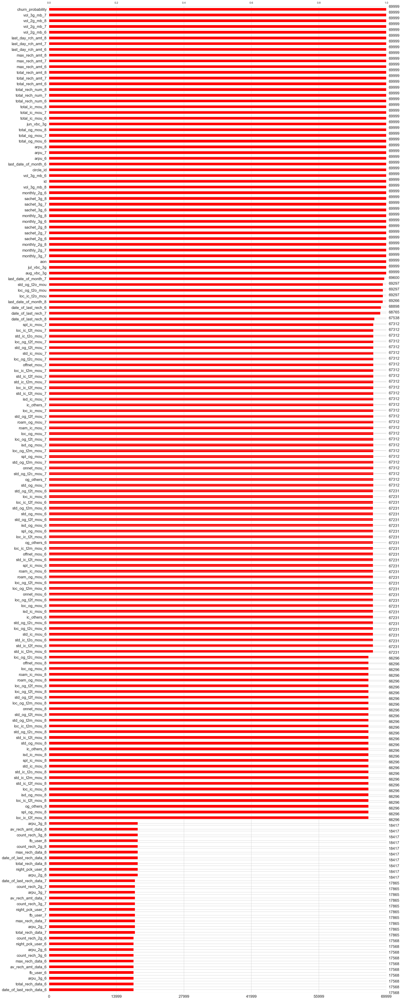

In [26]:
display(msno.bar(data, sort="ascending", color='red'))

<Axes: >

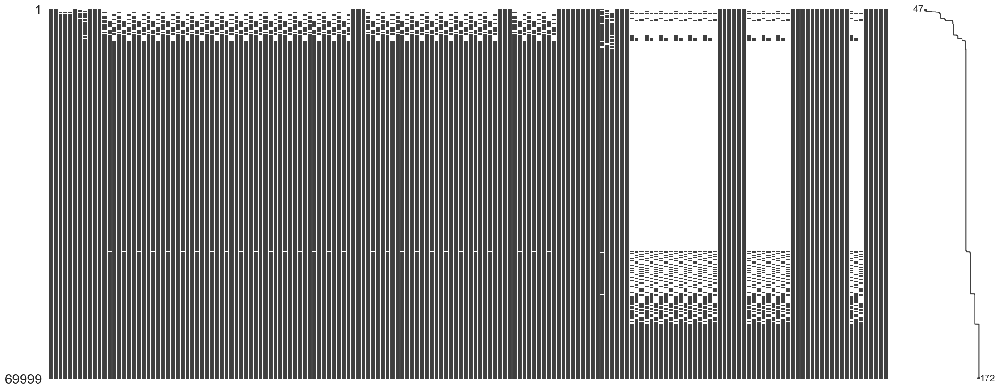

In [27]:
display(msno.matrix(data, sort="ascending"))

In [28]:
data = impute_churn_data(data)

Imputing data with 0
Droping  circle_id
Droping  loc_og_t2o_mou
Droping  std_og_t2o_mou
Droping  loc_ic_t2o_mou
Droping  last_date_of_month_6
Droping  last_date_of_month_7
Droping  last_date_of_month_8
Droping  std_og_t2c_mou_6
Droping  std_og_t2c_mou_7
Droping  std_og_t2c_mou_8
Droping  std_ic_t2o_mou_6
Droping  std_ic_t2o_mou_7
Droping  std_ic_t2o_mou_8
Converting date columns to days from last date of the month


Index(['count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8',
       'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'arpu_3g_6',
       'arpu_3g_7', 'arpu_3g_8', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8',
       'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'fb_user_6',
       'fb_user_7', 'fb_user_8'],
      dtype='object')

List of missing data in %  terms:


night_pck_user_6                          74.90
arpu_2g_6                                 74.90
arpu_3g_6                                 74.90
count_rech_2g_6                           74.90
fb_user_6                                 74.90
count_rech_3g_6                           74.90
count_rech_3g_7                           74.48
arpu_2g_7                                 74.48
arpu_3g_7                                 74.48
count_rech_2g_7                           74.48
fb_user_7                                 74.48
night_pck_user_7                          74.48
night_pck_user_8                          73.69
fb_user_8                                 73.69
arpu_2g_8                                 73.69
count_rech_3g_8                           73.69
arpu_3g_8                                 73.69
count_rech_2g_8                           73.69
roam_ic_mou_8                              5.29
std_ic_t2t_mou_8                           5.29
std_og_t2m_mou_8                        

Index(['count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8',
       'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'arpu_3g_6',
       'arpu_3g_7', 'arpu_3g_8', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8',
       'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'fb_user_6',
       'fb_user_7', 'fb_user_8'],
      dtype='object')

18

Index(['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6',
       'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7',
       'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8',
       'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8',
       'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8',
       'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8',
       'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8',
       'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6',
       'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6',
       'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6',
       'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7',
       'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8',
       'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6',
       'og_others_7', 'og_others_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7',
       'lo

List of missing data in %  terms:


loc_ic_mou_8                               5.29
std_ic_t2t_mou_8                           5.29
isd_og_mou_8                               5.29
std_og_t2m_mou_8                           5.29
spl_og_mou_8                               5.29
std_og_t2t_mou_8                           5.29
og_others_8                                5.29
loc_og_mou_8                               5.29
loc_ic_t2t_mou_8                           5.29
loc_og_t2c_mou_8                           5.29
loc_ic_t2m_mou_8                           5.29
loc_og_t2f_mou_8                           5.29
loc_ic_t2f_mou_8                           5.29
loc_og_t2m_mou_8                           5.29
std_og_mou_8                               5.29
loc_og_t2t_mou_8                           5.29
std_og_t2f_mou_8                           5.29
std_ic_t2m_mou_8                           5.29
ic_others_8                                5.29
std_ic_t2f_mou_8                           5.29
roam_ic_mou_8                           

Imputing data with -1
Imputing the other columns of the month with 0
renaming columns


Index([], dtype='object')

List of missing data in %  terms:


id                                         0.00
max_rech_amt_6                             0.00
total_rech_num_6                           0.00
total_rech_num_7                           0.00
total_rech_num_8                           0.00
total_rech_amt_6                           0.00
total_rech_amt_7                           0.00
total_rech_amt_8                           0.00
max_rech_amt_7                             0.00
ic_others_7                                0.00
max_rech_amt_8                             0.00
date_of_last_rech_6                        0.00
date_of_last_rech_7                        0.00
date_of_last_rech_8                        0.00
last_day_rch_amt_6                         0.00
last_day_rch_amt_7                         0.00
ic_others_8                                0.00
ic_others_6                                0.00
std_ic_t2m_mou_7                           0.00
total_ic_mou_6                             0.00
std_ic_t2f_mou_6                        

(69999, 141)

In [29]:
data.shape

(69999, 141)

In [30]:
data.head(10)

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_6,vbc_3g_7,vbc_3g_8,churn_probability
0,0,31.28,87.01,7.53,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.00,0.00,0.00,0.00,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.00,0.00,0.00,0.00,65.09,204.99,1.01,0.00,0.00,0.00,8.20,0.63,0.00,0.38,0.00,0.00,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.00,0.00,0.00,7.46,27.58,15.18,11.84,53.04,40.56,0.00,0.00,0.66,0.00,0.00,0.00,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,8,21,7,65,65,0,-1,-1,-1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,1958,0.00,0.00,0.00,0
1,1,0.00,122.79,42.95,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,30.73,31.66,0.00,0.00,0.00,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.44,39.44,25.04,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,18,21,5,0,0,0,-1,23,-1,0.00,1.00,0.00,0.00,145.00,0.00,0.00,145.00,0.00,0.00,352.91,0.00,0.00,3.96,0.00,0,0,0,0,0,0,0,1,0,0,0,0,710,0.00,0.00,0.00,0
2,2,60.81,103.18,0.00,0.53,15.93,0.00,53.99,82.05,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.00,0.00,0.00,0.00,28.94,84.99,0.00,0.00,0.00,0.00,2.89,1.38,0.00,0.00,0.00,0.00,56.49,99.36,0.00,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.00,0.00,0.00,29.91,2.48,6.38,124.29,33.83,36.64,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.25,2,4,2,70,120,0,70,70,0,19,9,7,70,50,0,-1,-1,-1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0

## Filtering High Value Customers

In [31]:
churn_imputed, churn_filtered = get_high_value_customers(data)

Recharge amount at 70th percentile: 484.3333333333333
Total amount :  102871412.69999999
Total amount for high value customers :  102871412.69999999
Percent :  70.12202329753757


In [32]:
churn_imputed.shape

(69999, 141)

In [33]:
churn_filtered.shape

(21001, 141)

In [34]:
churn_filtered.describe(include='all')

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_6,vbc_3g_7,vbc_3g_8,churn_probability
count,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00,21001.00
mean,35010.02,538.23,554.88,548.39,249.03,266.20,253.32,358.43,374.80,359.46,15.43,12.23,12.54,26.40,19.65,20.19,82.00,85.09,81.71,158.18,160.02,156.76,6.20,6.39,6.10,1.54,1.86,1.85,246.39,251.51,244.58,156.57,173.32,163.81,169.76,188.00,175.59,1.68,1.69,1.63,328.02,363.01,341.03,2.29,2.25,2.31,5.60,7.10,7.21,0.64,0.03,0.07,582.95,623.90,595.21,63.29,65.02,64.29,146.33,149.21,149.82,15.29,16.26,14.95,224.92,230.50,229.07,14.02,15.09,14.61,28.02,30.13,29.06,2.62,2.74,2.50,44.67,47.96,46.17,281.39,291.64,288.21,0.06,0.02,0.03,10.54,11.61,11.62,1.19,1.55,1.31,11.41,11.69,10.86,634.71,650.92,640.86,163.59,168.31,172.77,3.73,3.66,3.

<Axes: >

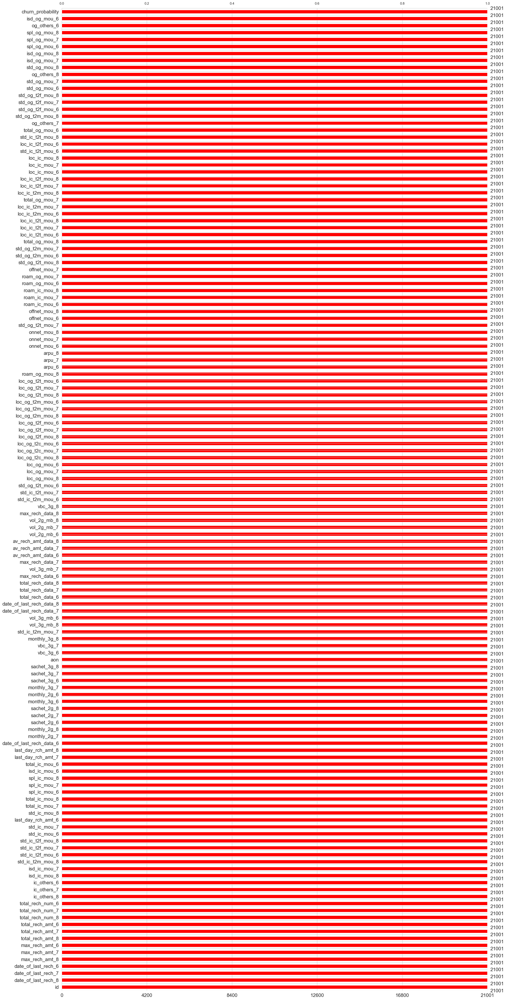

In [35]:
msno.bar(churn_filtered,  sort="ascending", color='red')

<Axes: >

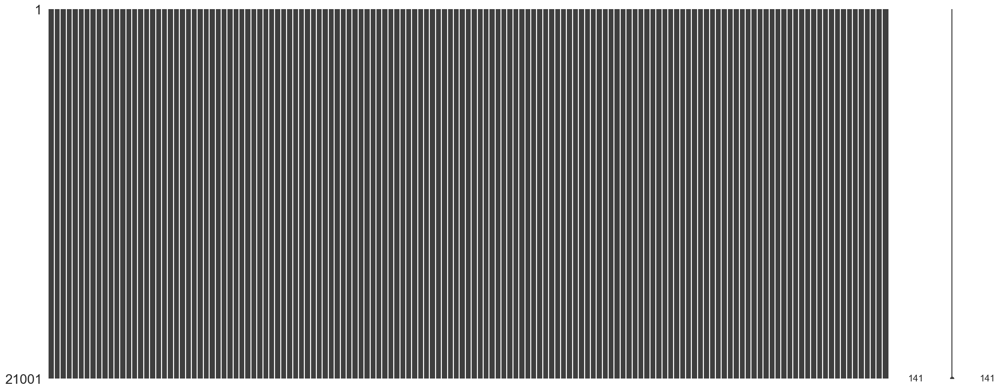

In [36]:
msno.matrix(churn_filtered, sort="ascending")

## EDA - Exploratory data analysis

In [37]:
corrmat = data.corr()
display(corrmat)

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_6,vbc_3g_7,vbc_3g_8,churn_probability,total_data_rech_6,total_data_rech_7,total_data_rech_8,amt_data_6,amt_data_7,amt_data_8,av_amt_data_6_7_8
id,1.00,0.00,0.00,0.00,0.00,0.01,0.00,-0.01,-0.01,-0.00,-0.00,-0.00,0.01,-0.01,-0.01,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,-0.00,0.00,-0.00,0.00,0.01,0.00,0.00,0.00,0.00,-0.01,-0.01,-0.01,0.00,0.01,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.01,0.01,0.00,0.00,0.00,0.01,0.01,0.00,0.00,0.00,0.00,0.01,0.01,0.01,0.00,0.01,-0.00,0.01,0.00,0.01,0.01,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,0.01,0.01,-0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.01,-0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.01,0.00,-0.00,0.00,0.00,0.00,0.01,-0.00,0.00,0.00,-0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,-0.00,-0.00,0.01,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00
arpu_6,0.00,1.00,0.74,0.64,0.45,0.32,0.26,0.62,0.46,0.36,0.13,0.09,0.09,0.24,0.17,0.14,0.24,0.20,0.18,0.44,0.36,0.31,0.19,0.16,0.15,0.07,0.03,0.02,0.43,0.36,0.32,0.36,0.25,0.19,0.39,0.27,0.18,0.09,0.07,0.06,0.49,0.34,0.24,0.41,0.38,0.37,0.12,0.07,0.06,0.05,0.01,0.00,0.67,0.49,0.39,0.11,0.09,0.08,0.24,0.20,0.17,0.07,0.06,0.06,0.24,0.19,0.17,0.11,0.08,0.06,0.12,0.08,0.07,0.04,0.04,0.03,0.15,0.10,0.09,0.27,0.22,0.19,0.04,-0.08,-0.05,0.09,0.06,0.06,0.02,0.03,0.02,0.50,0.29,0.20,0.95,0.73,0.63,0.45,0.37,0.32,-0.25,-0.13,-0.10,0.35,0.31,0.22,0.14,0.10,0.10,0.14,0.09,0.08,0.27,0.19,0.18,0.30,0.21,0.20,0.09,0.05,0.04,0.25,0.20,0.19,0.10,0.06,0.05,0.05,0.03,0.03,0.26,0.19,0.18,0.09,0.07,0.05,0.03,0.17,0.18,0.22,0.03,0.19,0.13,0.11,0.58,0.40,0.33,0.51
arpu_7,0.00,0.74,1.00,0.78,0.32,0.43,0.34,0.47,0.60,0.47,0.10,0.10,0.09,0.17,0.21,0.17,0.18,0.23,0.19,0.33,0.42,0.35,0.16,0.20,0.17,0.04,0.06,0.05,0.33,0.42,0.35,0.25,0.35,0.27,0.28,0.39,0.28,0.07,0.09,0.07,0.35,0.49,0.37,0.38,0.45,0.40,0.09,0.11,0.09,0.02,0.01,0.01,0.4

In [38]:

k = 25 #number of variables for heatmap
plt.figure(figsize=(20,16))
nlargest_cols = corrmat.nlargest(k, 'churn_probability')['churn_probability'].index
nlargest_cols

<Figure size 2000x1600 with 0 Axes>

Index(['churn_probability', 'std_og_mou_6', 'date_of_last_rech_7',
       'std_og_t2t_mou_6', 'roam_og_mou_7', 'std_og_t2m_mou_6',
       'date_of_last_rech_8', 'roam_og_mou_8', 'roam_ic_mou_7',
       'roam_og_mou_6', 'roam_ic_mou_8', 'onnet_mou_6', 'roam_ic_mou_6',
       'total_og_mou_6', 'total_rech_num_6', 'arpu_6', 'date_of_last_rech_6',
       'total_rech_amt_6', 'offnet_mou_6', 'std_og_t2t_mou_7', 'std_og_mou_7',
       'std_ic_t2t_mou_6', 'og_others_6', 'spl_og_mou_6', 'isd_og_mou_6'],
      dtype='object')

<Figure size 2000x1600 with 0 Axes>

### Univariate Analysis

Name of col std_og_mou_6


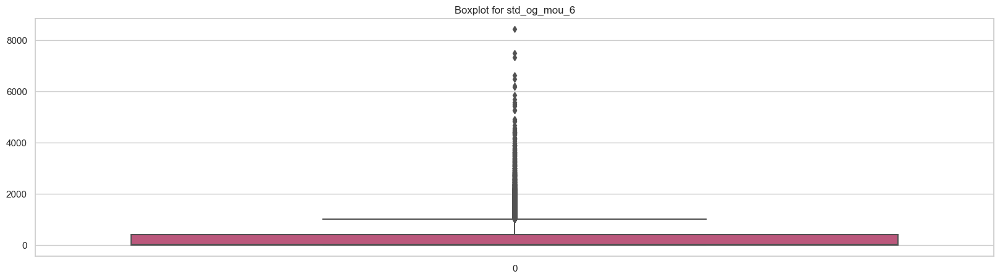

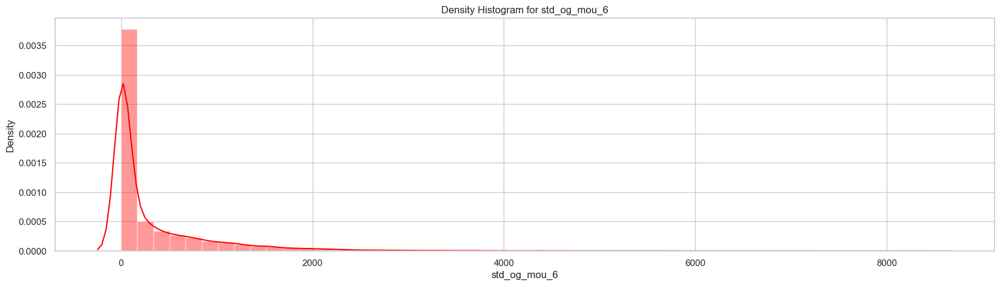

count               21001.00
mean                  328.02
std                   599.36
min                     0.00
25%                     0.00
50%                    36.73
75%                   408.06
max                  8432.99
Name: std_og_mou_6, dtype: float64


Now drop outliers from the col series and check the plots




43

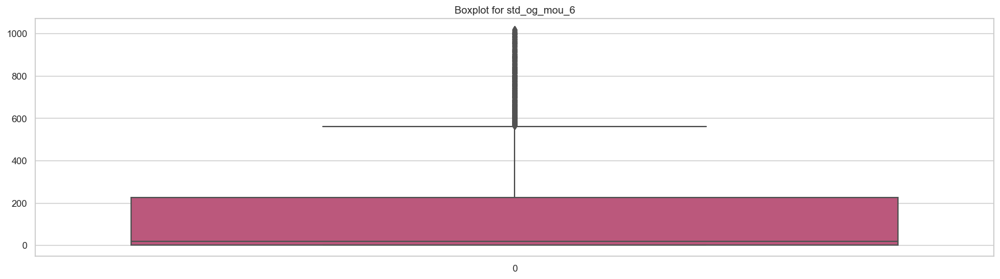

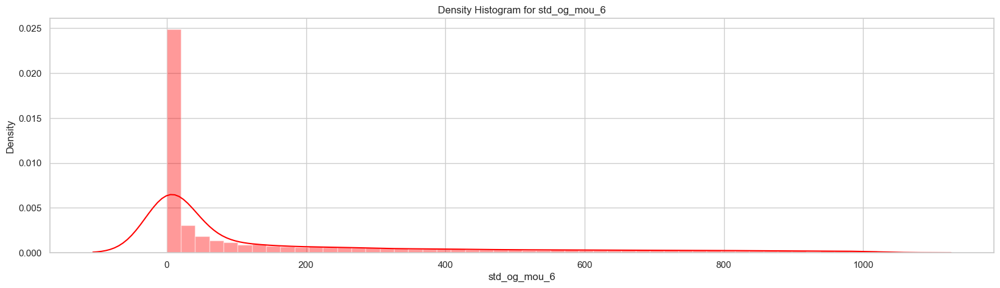

count               18758.00
mean                  159.72
std                   252.96
min                     0.00
25%                     0.00
50%                    18.68
75%                   224.70
max                  1020.14
Name: std_og_mou_6, dtype: float64
Customers Std_og_mou_6 ranges between 0.0 and 408.06



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col date_of_last_rech_7


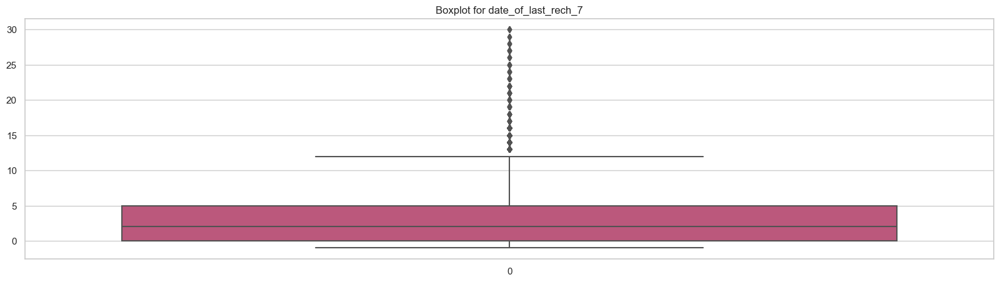

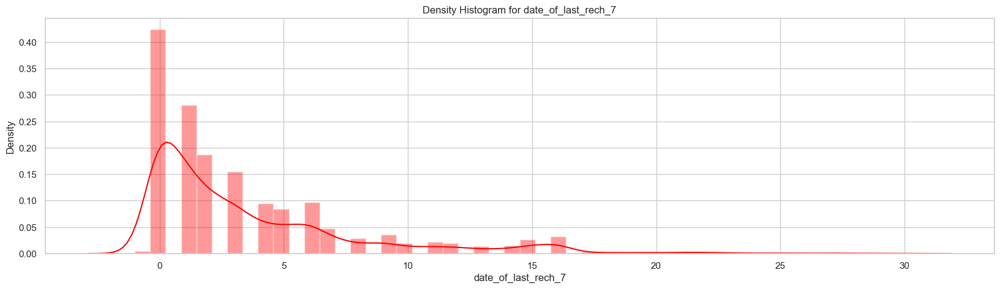

count               21001.00
mean                    3.66
std                     4.58
min                    -1.00
25%                     0.00
50%                     2.00
75%                     5.00
max                    30.00
Name: date_of_last_rech_7, dtype: float64


Now drop outliers from the col series and check the plots




47

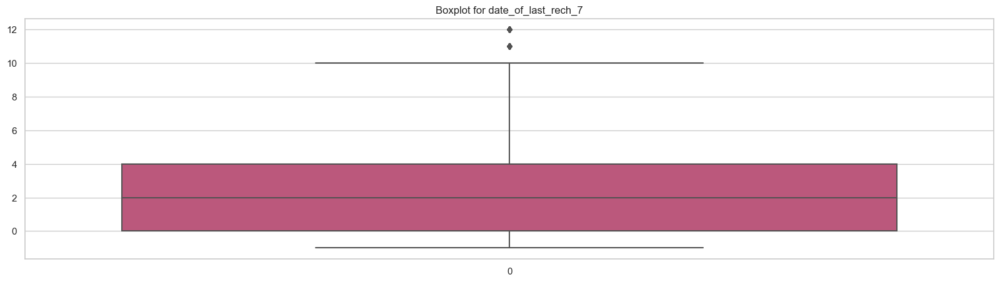

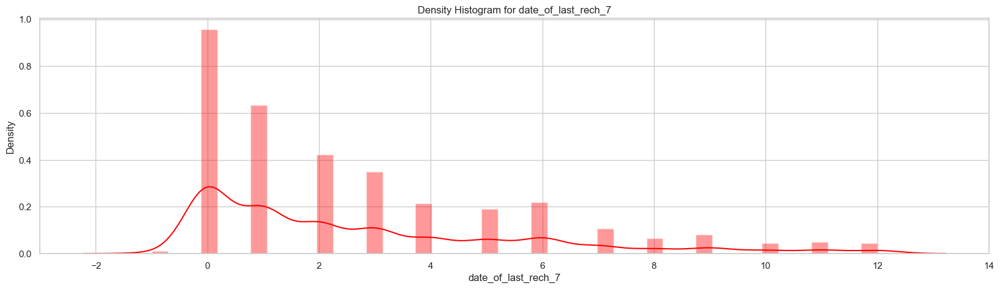

count               19537.00
mean                    2.70
std                     2.96
min                    -1.00
25%                     0.00
50%                     2.00
75%                     4.00
max                    12.00
Name: date_of_last_rech_7, dtype: float64
Customers Date_of_last_rech_7 ranges between 0.0 and 5.0



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col std_og_t2t_mou_6


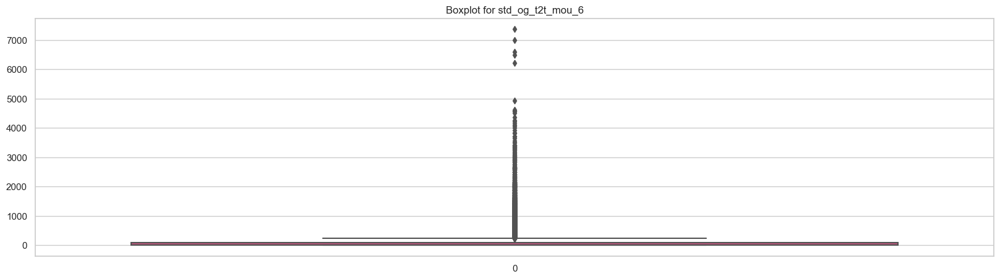

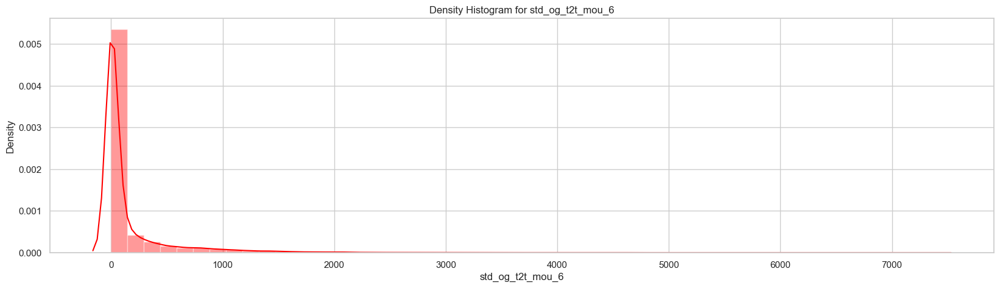

count               21001.00
mean                  156.57
std                   398.27
min                     0.00
25%                     0.00
50%                     1.88
75%                    96.26
max                  7366.58
Name: std_og_t2t_mou_6, dtype: float64


Now drop outliers from the col series and check the plots




46

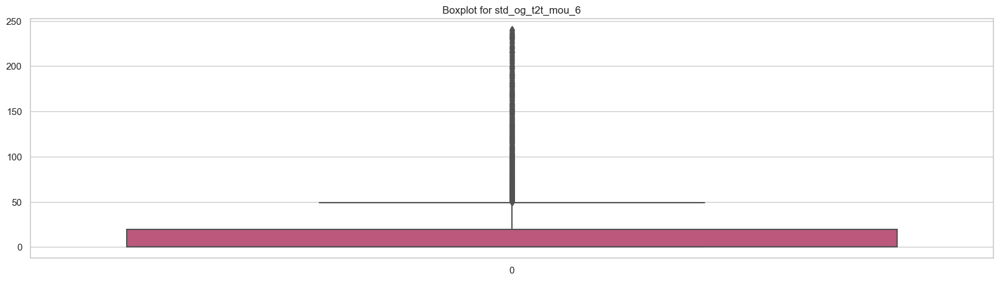

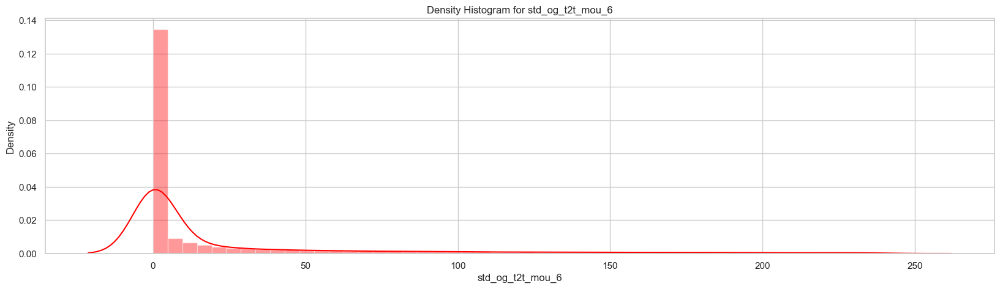

count               17492.00
mean                   24.51
std                    49.94
min                     0.00
25%                     0.00
50%                     0.00
75%                    19.72
max                   240.58
Name: std_og_t2t_mou_6, dtype: float64
Customers Std_og_t2t_mou_6 ranges between 0.0 and 96.26



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col roam_og_mou_7


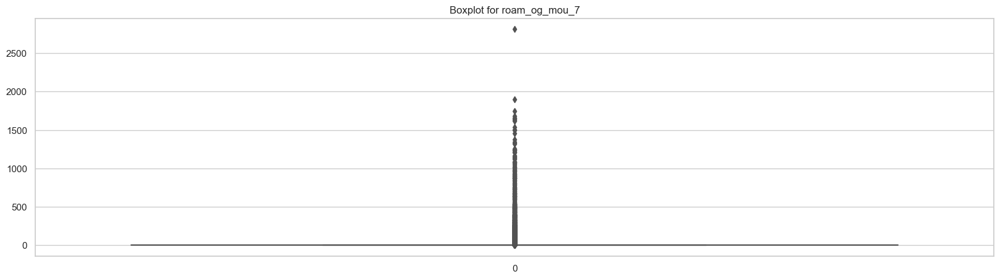

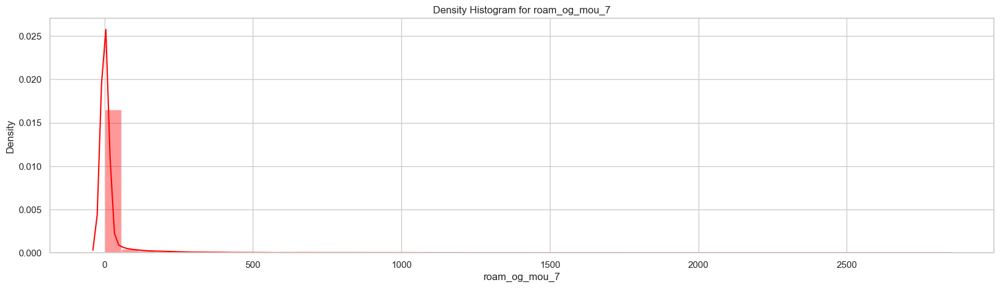

count               21001.00
mean                   19.65
std                    95.95
min                     0.00
25%                     0.00
50%                     0.00
75%                     0.00
max                  2812.04
Name: roam_og_mou_7, dtype: float64


Now drop outliers from the col series and check the plots




41

Exception caught for col roam_og_mou_7 error 0 cannot continue
Customers Roam_og_mou_7 ranges between 0.0 and 0.0



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col std_og_t2m_mou_6


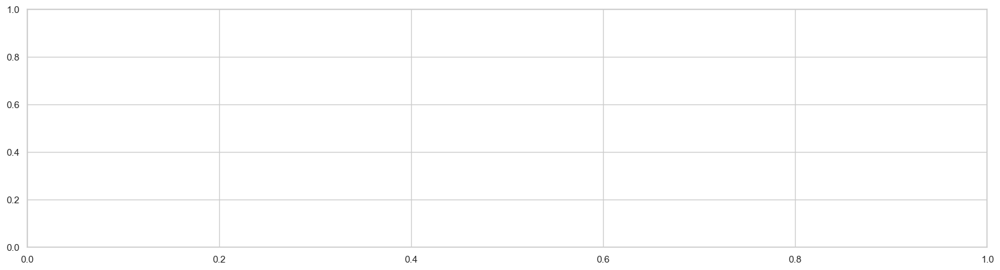

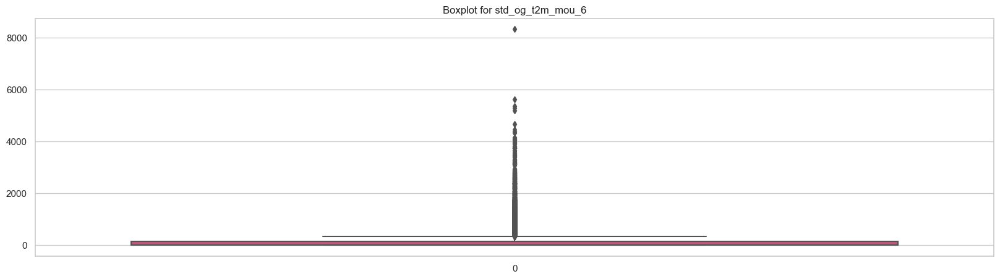

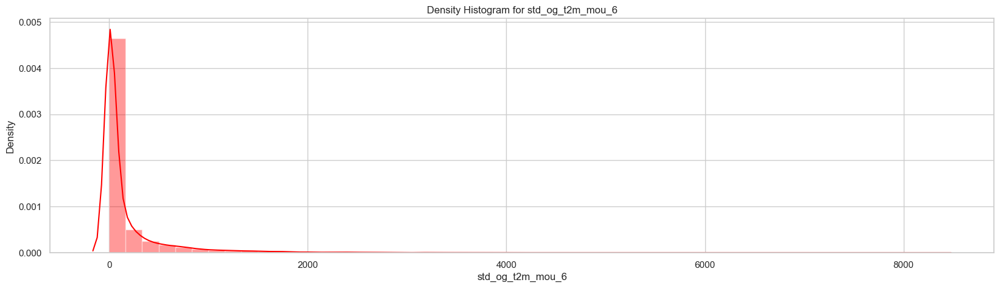

count               21001.00
mean                  169.76
std                   398.51
min                     0.00
25%                     0.00
50%                    13.69
75%                   138.38
max                  8314.76
Name: std_og_t2m_mou_6, dtype: float64


Now drop outliers from the col series and check the plots




47

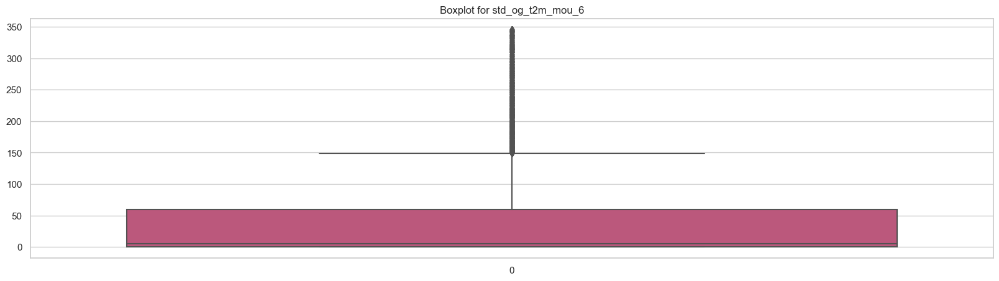

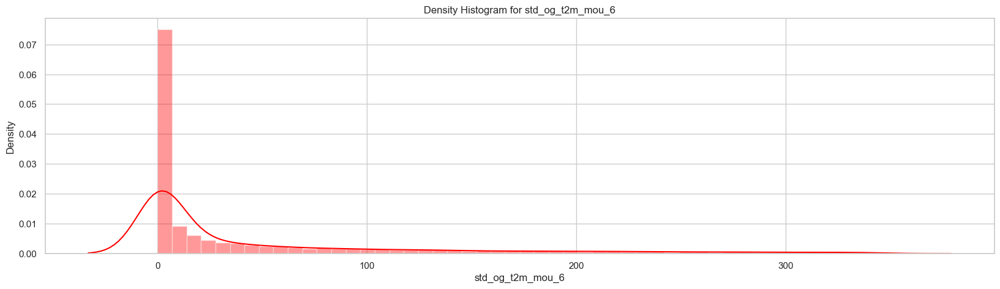

count               18068.00
mean                   46.97
std                    78.37
min                     0.00
25%                     0.00
50%                     5.59
75%                    59.48
max                   345.81
Name: std_og_t2m_mou_6, dtype: float64
Customers Std_og_t2m_mou_6 ranges between 0.0 and 138.38



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col date_of_last_rech_8


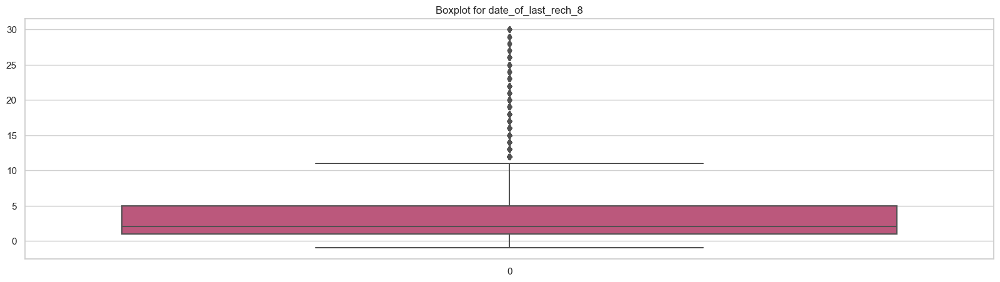

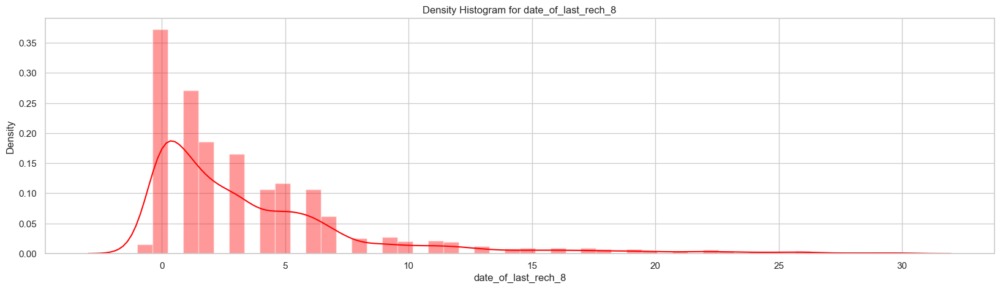

count               21001.00
mean                    3.81
std                     4.85
min                    -1.00
25%                     1.00
50%                     2.00
75%                     5.00
max                    30.00
Name: date_of_last_rech_8, dtype: float64


Now drop outliers from the col series and check the plots




47

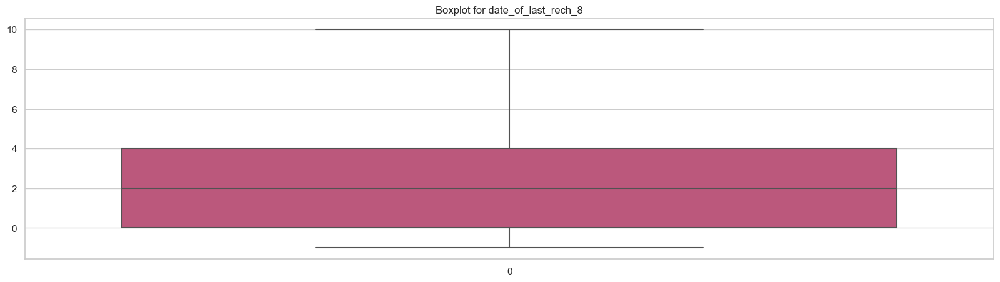

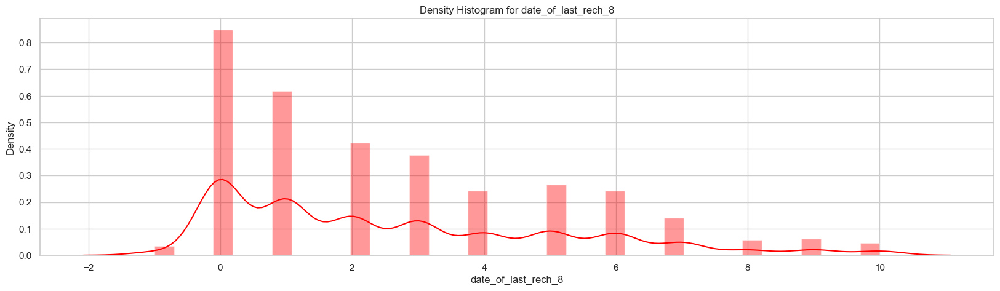

count               19207.00
mean                    2.62
std                     2.58
min                    -1.00
25%                     0.00
50%                     2.00
75%                     4.00
max                    10.00
Name: date_of_last_rech_8, dtype: float64
Customers Date_of_last_rech_8 ranges between 1.0 and 5.0



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col roam_og_mou_8


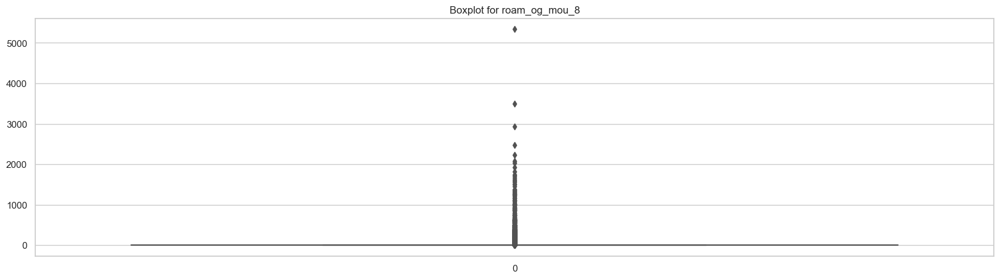

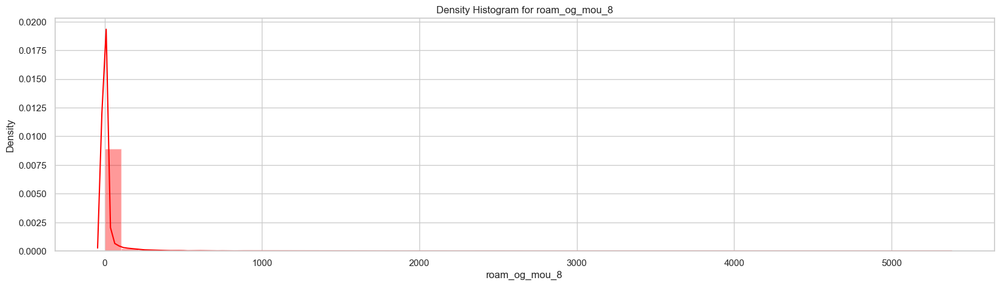

count               21001.00
mean                   20.19
std                   107.91
min                     0.00
25%                     0.00
50%                     0.00
75%                     0.00
max                  5337.04
Name: roam_og_mou_8, dtype: float64


Now drop outliers from the col series and check the plots




41

Exception caught for col roam_og_mou_8 error 0 cannot continue
Customers Roam_og_mou_8 ranges between 0.0 and 0.0



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col roam_ic_mou_7


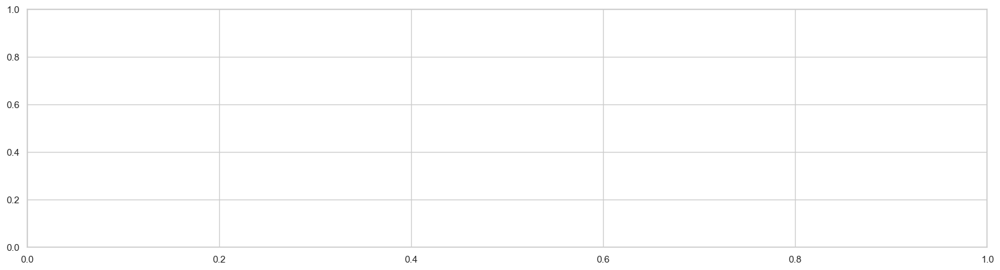

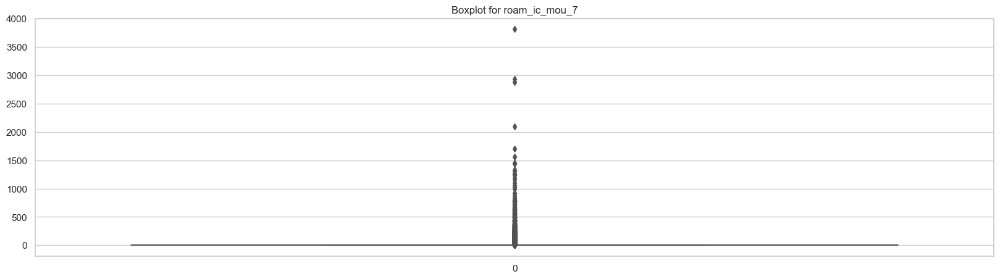

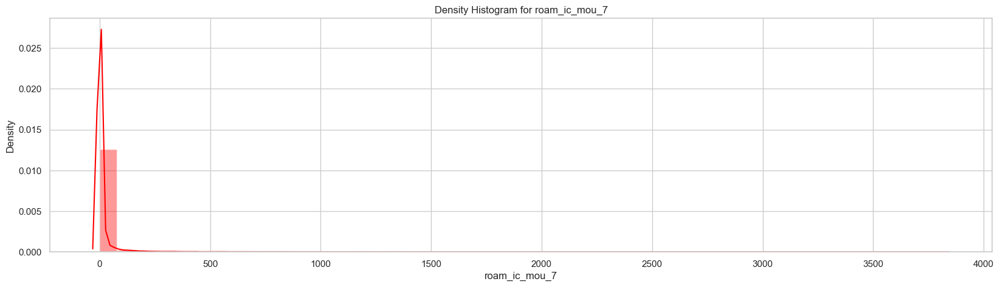

count               21001.00
mean                   12.23
std                    76.50
min                     0.00
25%                     0.00
50%                     0.00
75%                     0.00
max                  3813.29
Name: roam_ic_mou_7, dtype: float64


Now drop outliers from the col series and check the plots




41

Exception caught for col roam_ic_mou_7 error 0 cannot continue
Customers Roam_ic_mou_7 ranges between 0.0 and 0.0



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col roam_og_mou_6


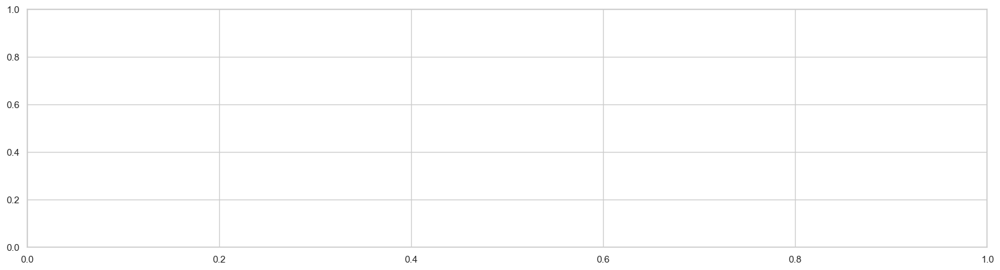

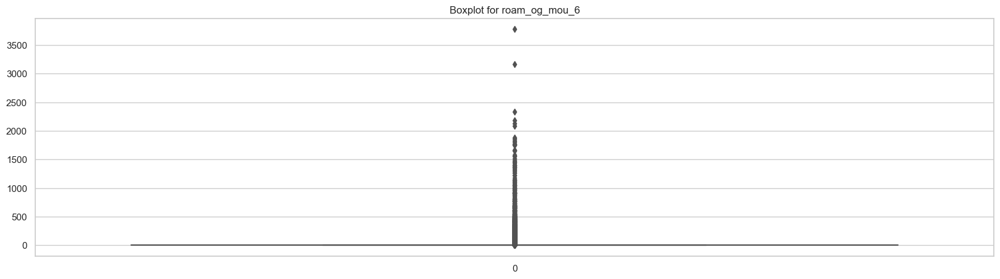

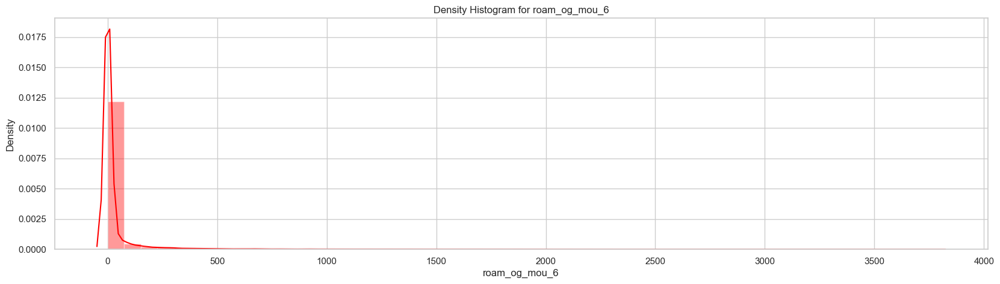

count               21001.00
mean                   26.40
std                   117.99
min                     0.00
25%                     0.00
50%                     0.00
75%                     0.00
max                  3775.11
Name: roam_og_mou_6, dtype: float64


Now drop outliers from the col series and check the plots




41

Exception caught for col roam_og_mou_6 error 0 cannot continue
Customers Roam_og_mou_6 ranges between 0.0 and 0.0



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col roam_ic_mou_8


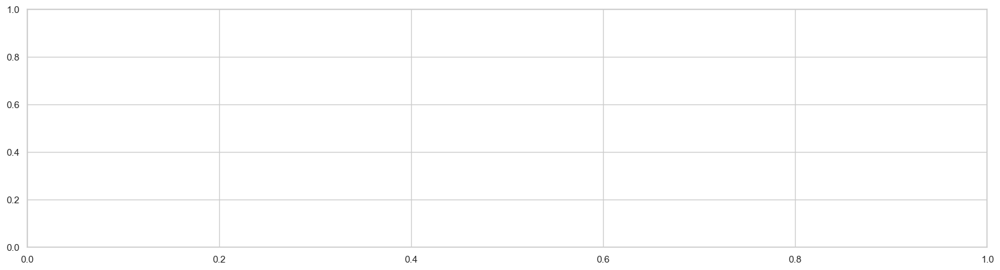

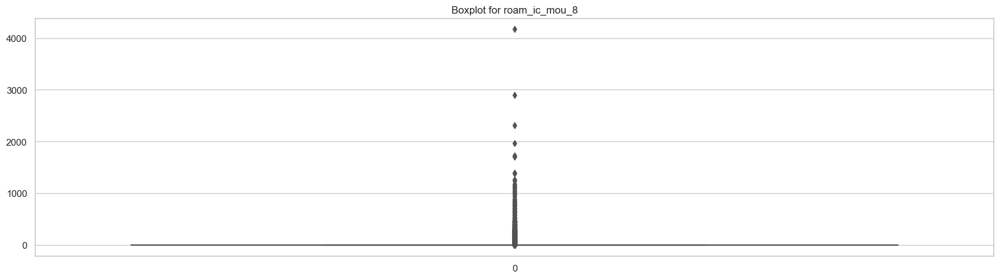

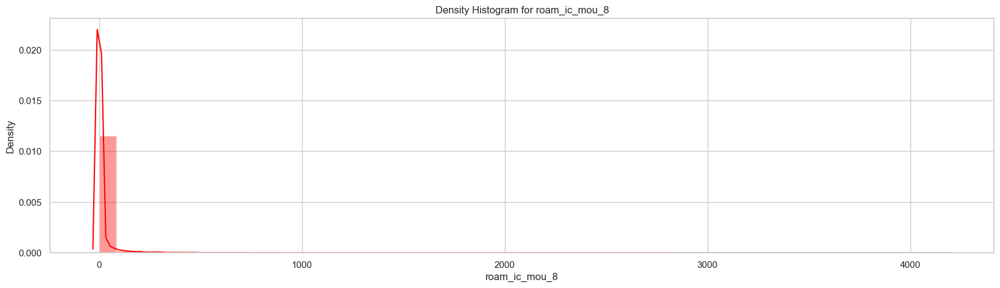

count               21001.00
mean                   12.54
std                    75.06
min                     0.00
25%                     0.00
50%                     0.00
75%                     0.00
max                  4169.81
Name: roam_ic_mou_8, dtype: float64


Now drop outliers from the col series and check the plots




41

Exception caught for col roam_ic_mou_8 error 0 cannot continue
Customers Roam_ic_mou_8 ranges between 0.0 and 0.0



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col onnet_mou_6


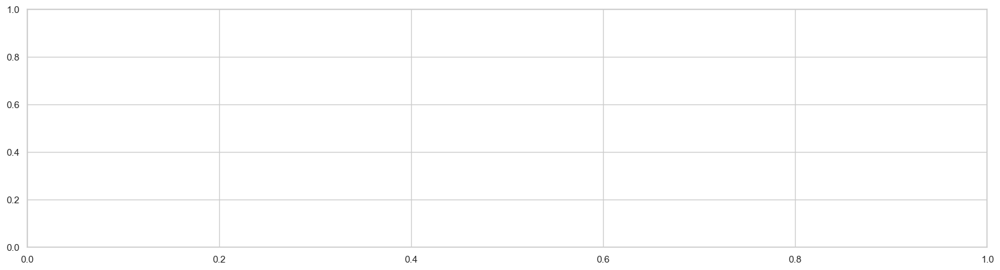

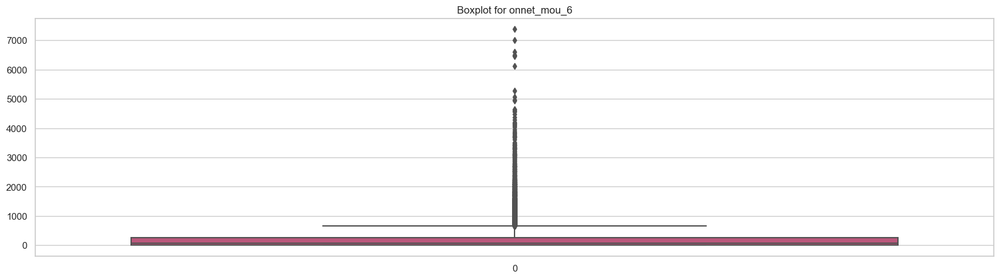

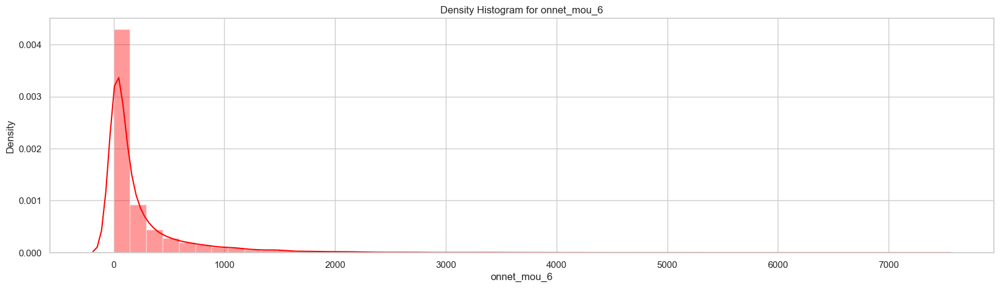

count               21001.00
mean                  249.03
std                   456.53
min                     0.00
25%                    14.28
50%                    77.59
75%                   268.46
max                  7376.71
Name: onnet_mou_6, dtype: float64


Now drop outliers from the col series and check the plots




44

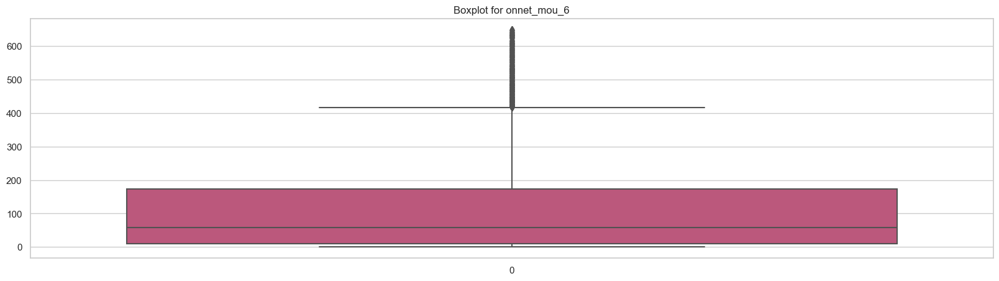

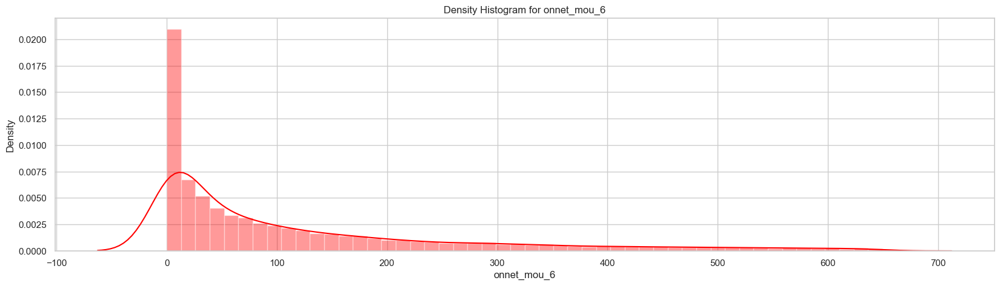

count               18644.00
mean                  120.06
std                   149.71
min                     0.00
25%                    10.52
50%                    57.65
75%                   172.64
max                   649.56
Name: onnet_mou_6, dtype: float64
Customers Onnet_mou_6 ranges between 14.28 and 268.46



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col roam_ic_mou_6


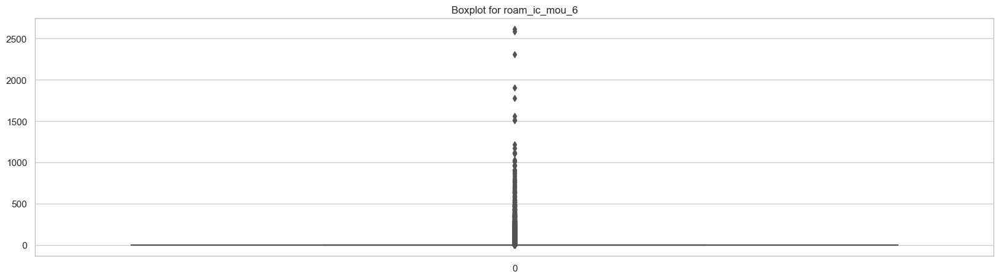

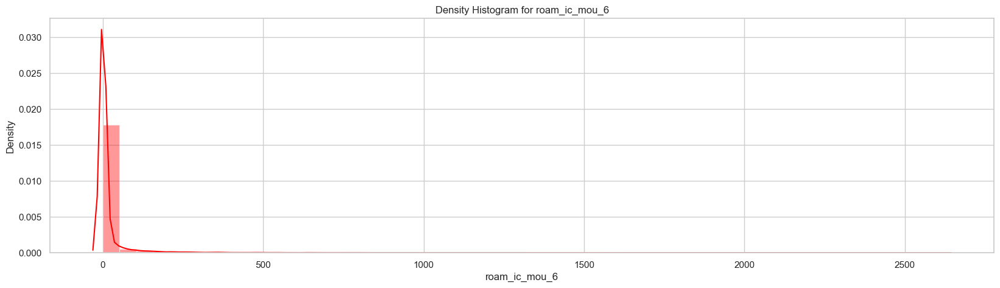

count               21001.00
mean                   15.43
std                    74.71
min                     0.00
25%                     0.00
50%                     0.00
75%                     0.00
max                  2613.31
Name: roam_ic_mou_6, dtype: float64


Now drop outliers from the col series and check the plots




41

Exception caught for col roam_ic_mou_6 error 0 cannot continue
Customers Roam_ic_mou_6 ranges between 0.0 and 0.0



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col total_og_mou_6


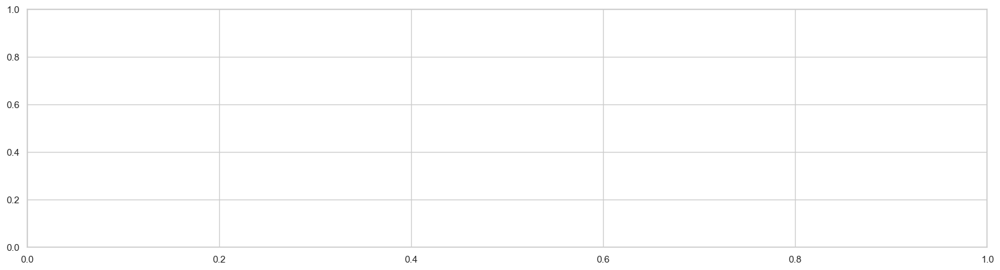

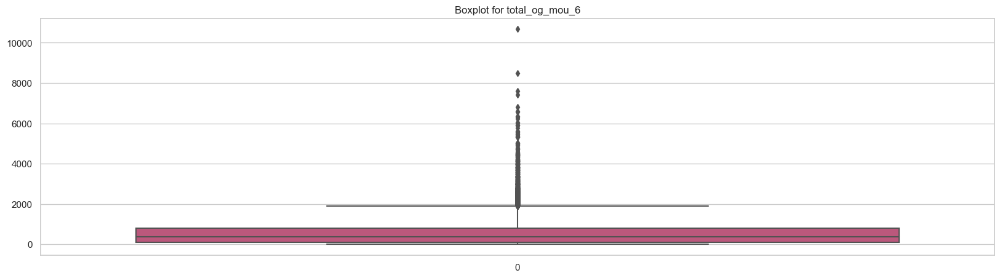

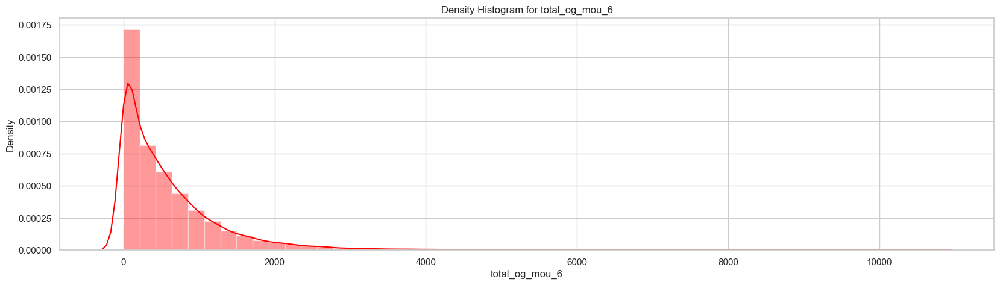

count               21001.00
mean                  582.95
std                   689.60
min                     0.00
25%                    98.38
50%                   373.48
75%                   816.16
max                 10674.03
Name: total_og_mou_6, dtype: float64


Now drop outliers from the col series and check the plots




47

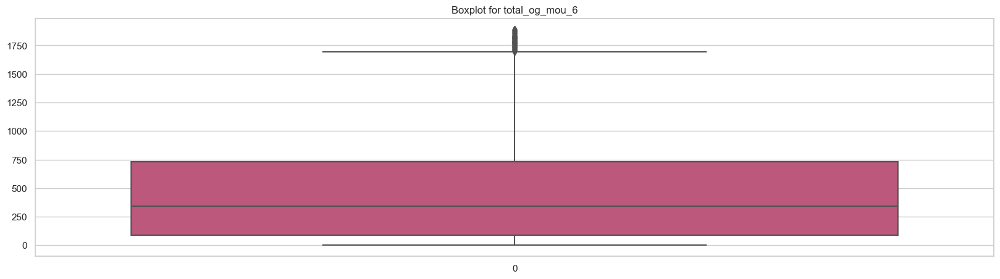

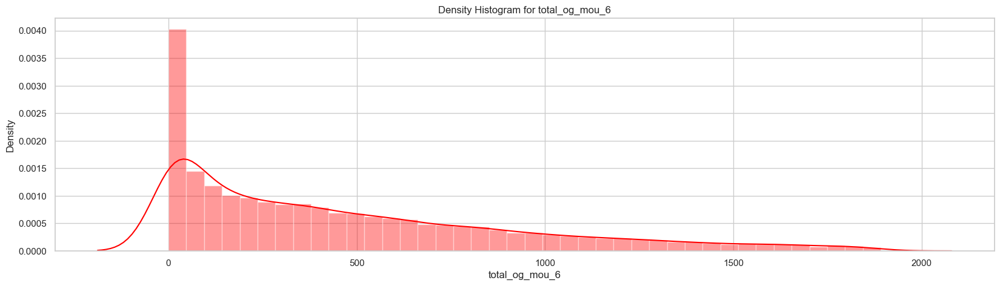

count               19942.00
mean                  470.38
std                   454.62
min                     0.00
25%                    87.95
50%                   342.59
75%                   729.39
max                  1891.48
Name: total_og_mou_6, dtype: float64
Customers Total_og_mou_6 ranges between 98.38 and 816.16



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col total_rech_num_6


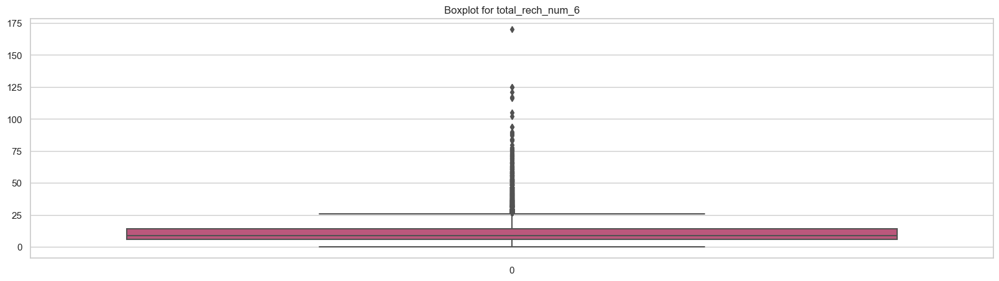

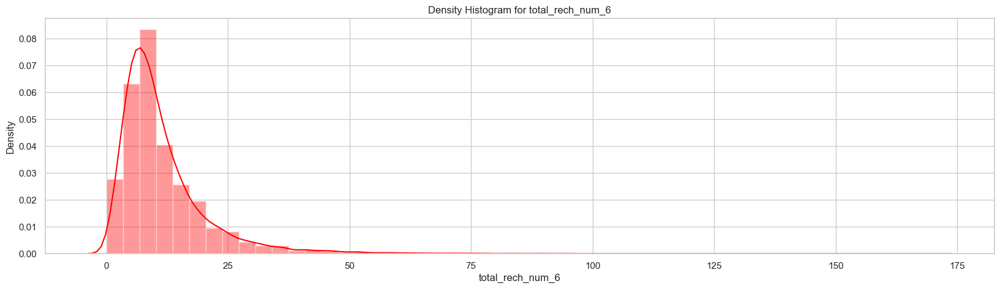

count               21001.00
mean                   11.41
std                     9.16
min                     0.00
25%                     6.00
50%                     9.00
75%                    14.00
max                   170.00
Name: total_rech_num_6, dtype: float64


Now drop outliers from the col series and check the plots




45

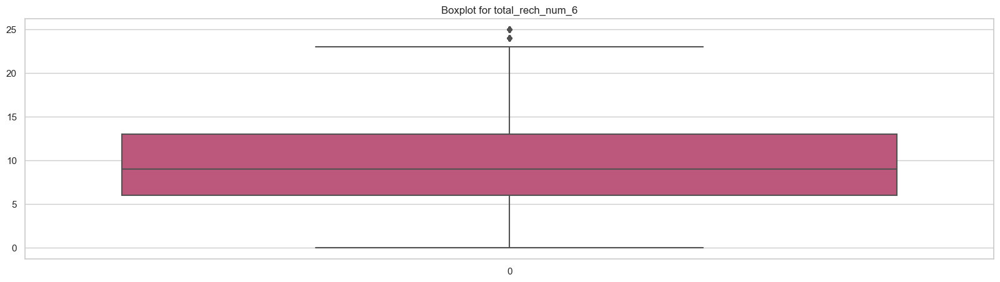

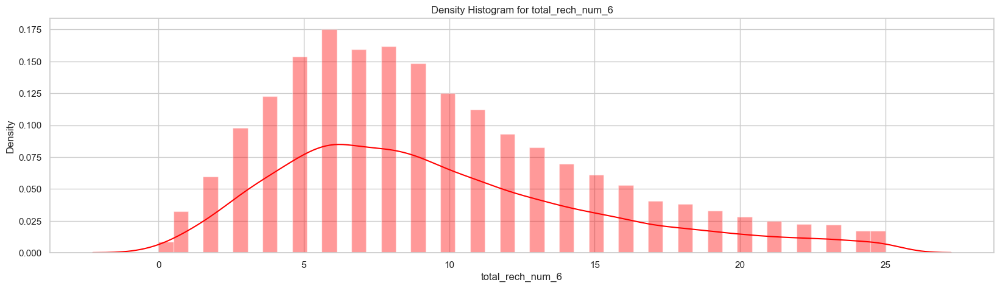

count               19605.00
mean                    9.62
std                     5.44
min                     0.00
25%                     6.00
50%                     9.00
75%                    13.00
max                    25.00
Name: total_rech_num_6, dtype: float64
Customers Total_rech_num_6 ranges between 6.0 and 14.0



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col arpu_6


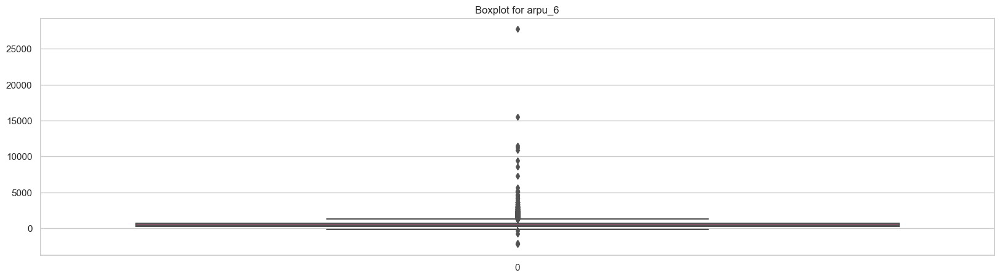

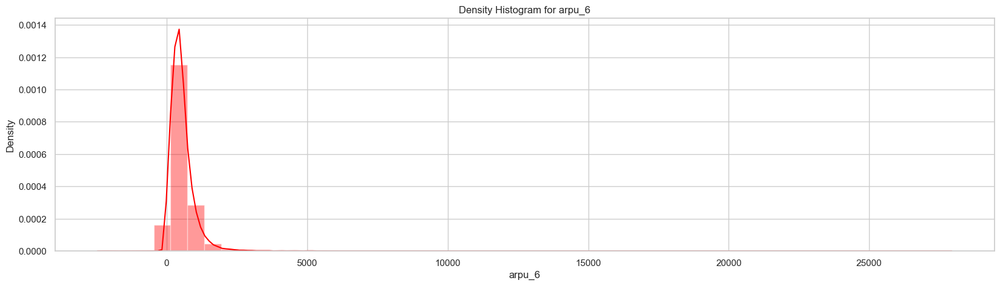

count               21001.00
mean                  538.23
std                   480.75
min                 -2258.71
25%                   279.28
50%                   460.45
75%                   684.41
max                 27731.09
Name: arpu_6, dtype: float64


Now drop outliers from the col series and check the plots




42

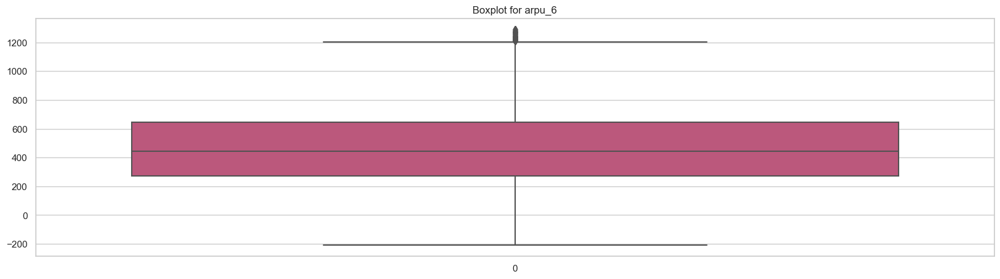

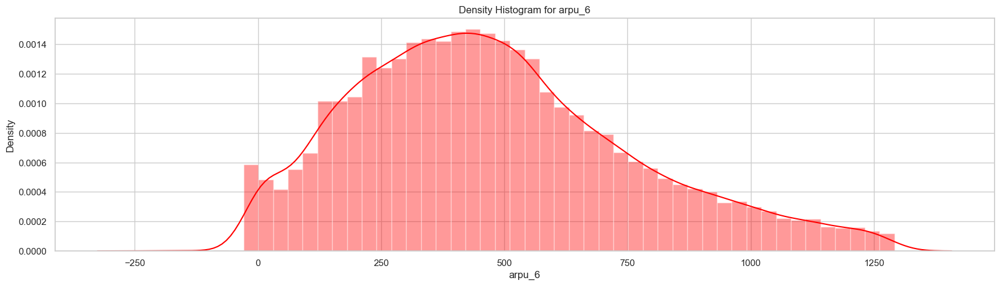

count               20080.00
mean                  477.89
std                   280.35
min                  -209.47
25%                   270.37
50%                   444.56
75%                   644.24
max                  1291.83
Name: arpu_6, dtype: float64
Customers Arpu_6 ranges between 279.284 and 684.408



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col date_of_last_rech_6


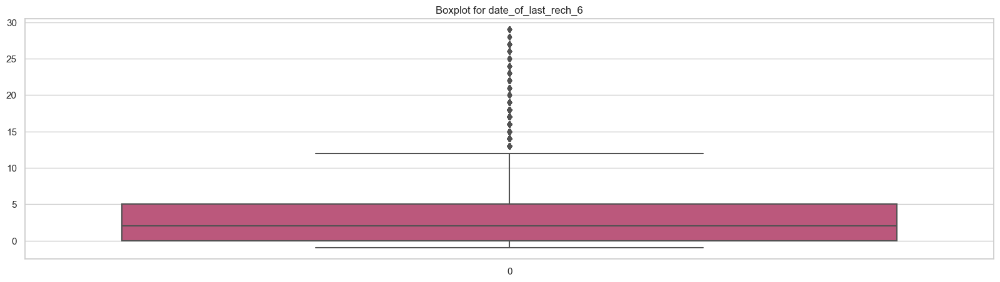

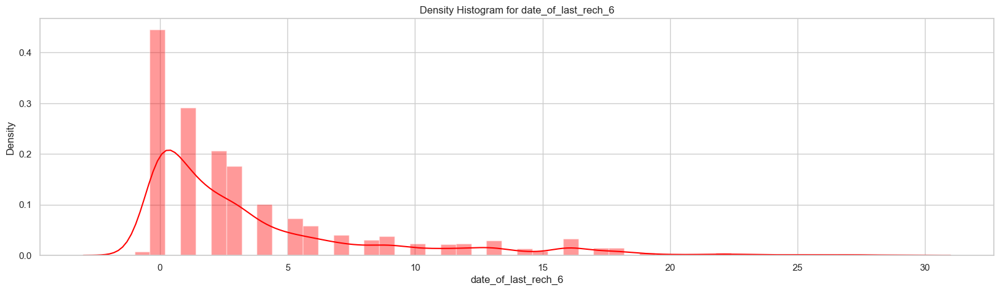

count               21001.00
mean                    3.73
std                     4.89
min                    -1.00
25%                     0.00
50%                     2.00
75%                     5.00
max                    29.00
Name: date_of_last_rech_6, dtype: float64


Now drop outliers from the col series and check the plots




47

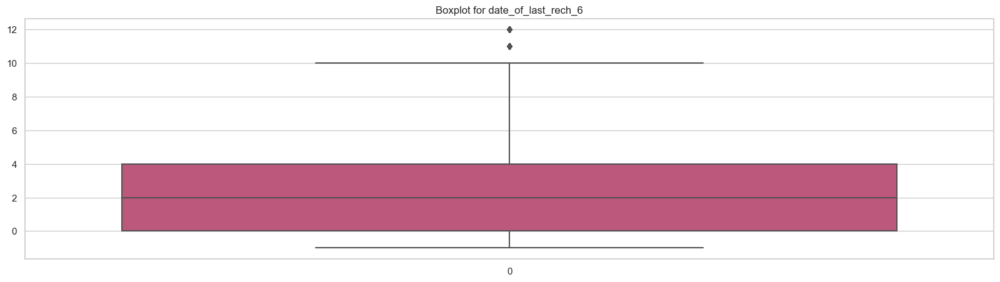

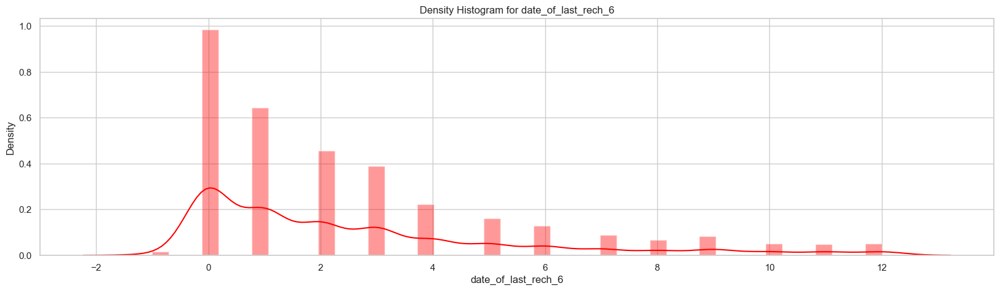

count               19277.00
mean                    2.57
std                     2.94
min                    -1.00
25%                     0.00
50%                     2.00
75%                     4.00
max                    12.00
Name: date_of_last_rech_6, dtype: float64
Customers Date_of_last_rech_6 ranges between 0.0 and 5.0



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col total_rech_amt_6


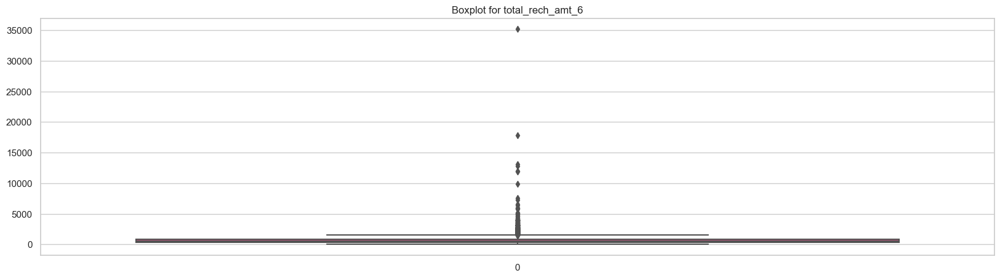

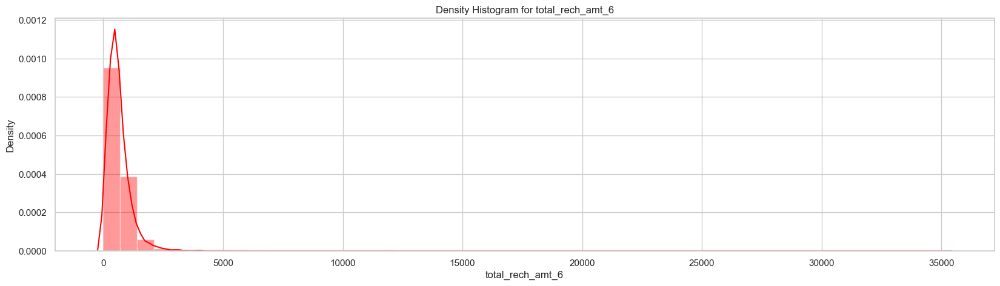

count               21001.00
mean                  634.71
std                   583.74
min                     0.00
25%                   318.00
50%                   537.00
75%                   811.00
max                 35190.00
Name: total_rech_amt_6, dtype: float64


Now drop outliers from the col series and check the plots




48

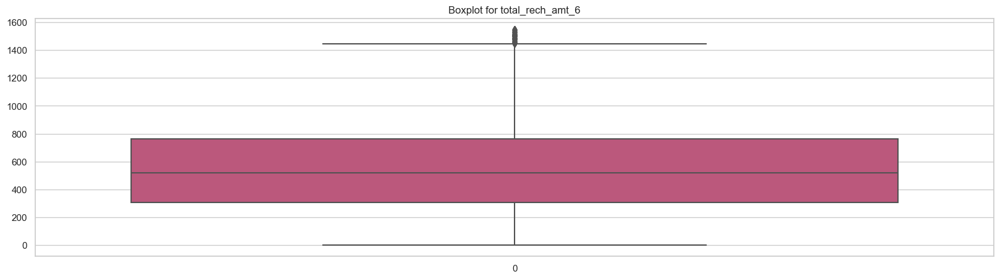

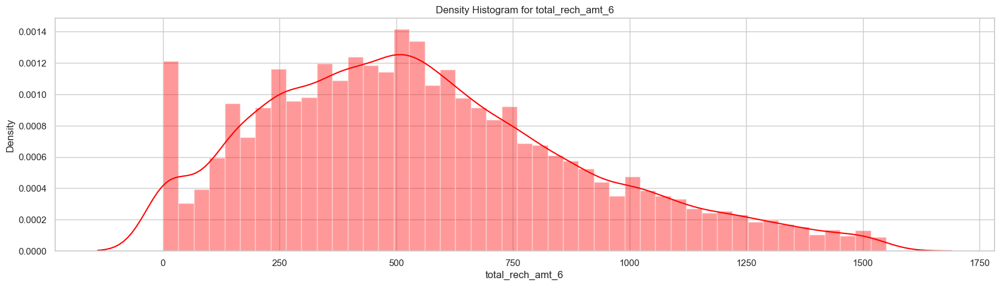

count               20099.00
mean                  561.08
std                   339.27
min                     0.00
25%                   308.00
50%                   519.00
75%                   762.00
max                  1550.00
Name: total_rech_amt_6, dtype: float64
Customers Total_rech_amt_6 ranges between 318.0 and 811.0



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col offnet_mou_6


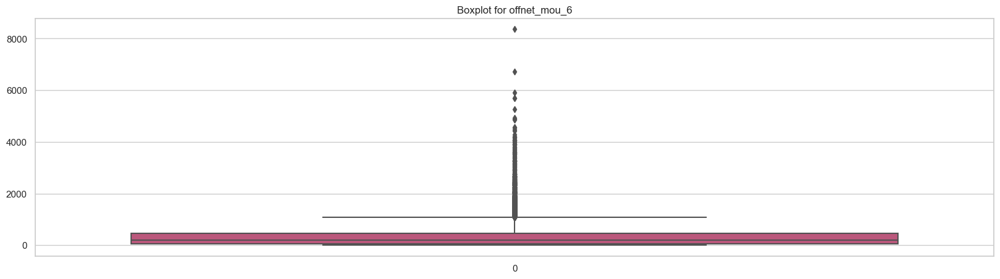

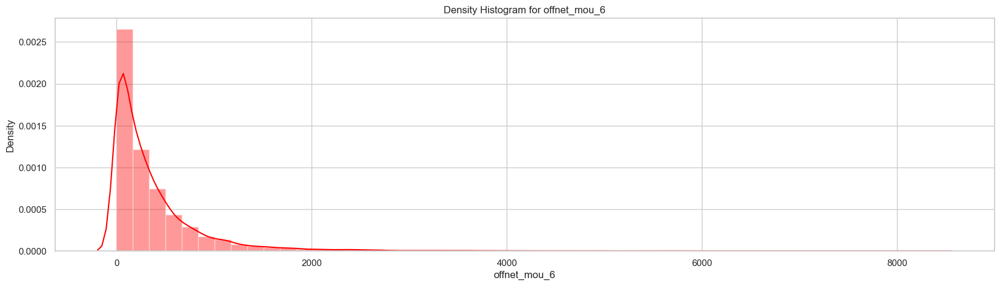

count               21001.00
mean                  358.43
std                   475.51
min                     0.00
25%                    62.81
50%                   207.31
75%                   467.26
max                  8362.36
Name: offnet_mou_6, dtype: float64


Now drop outliers from the col series and check the plots




45

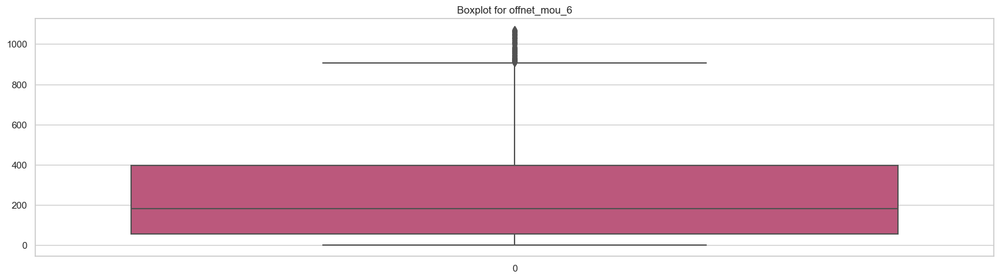

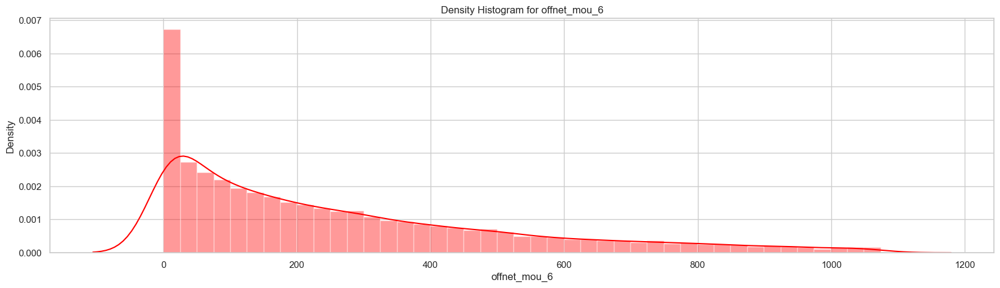

count               19579.00
mean                  260.85
std                   254.11
min                     0.00
25%                    55.41
50%                   182.79
75%                   395.35
max                  1073.84
Name: offnet_mou_6, dtype: float64
Customers Offnet_mou_6 ranges between 62.81 and 467.26



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col std_og_t2t_mou_7


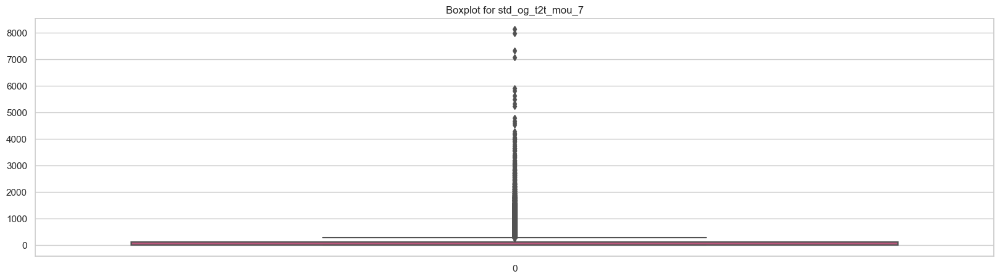

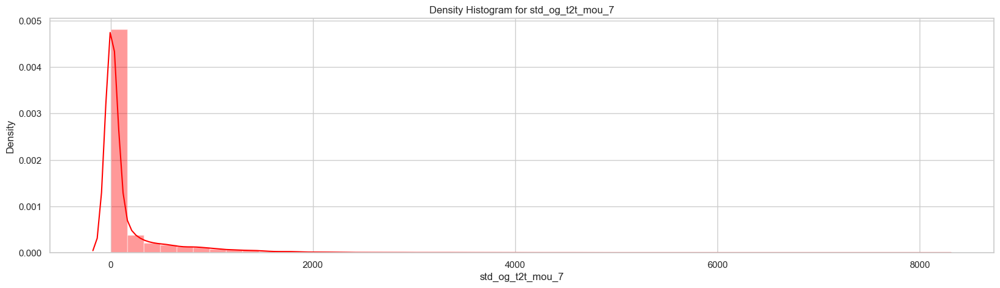

count               21001.00
mean                  173.32
std                   426.15
min                     0.00
25%                     0.00
50%                     2.68
75%                   111.76
max                  8133.66
Name: std_og_t2t_mou_7, dtype: float64


Now drop outliers from the col series and check the plots




47

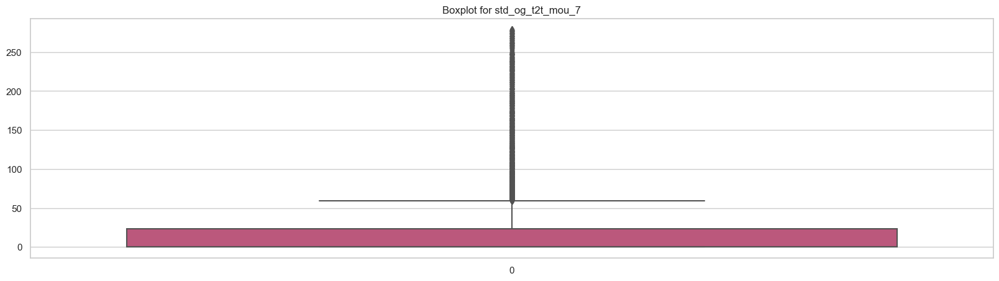

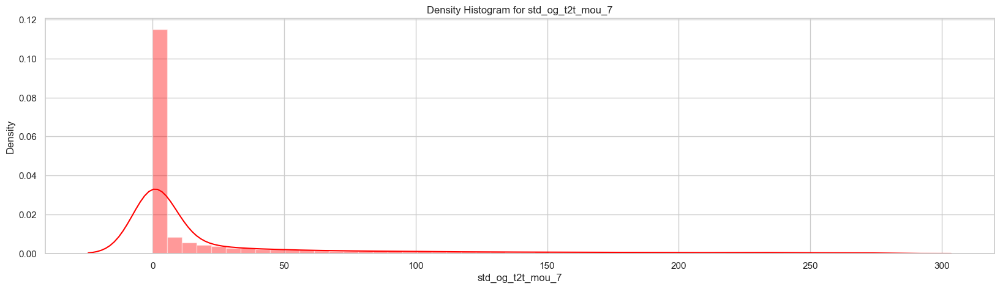

count               17468.00
mean                   28.45
std                    57.70
min                     0.00
25%                     0.00
50%                     0.00
75%                    23.68
max                   279.06
Name: std_og_t2t_mou_7, dtype: float64
Customers Std_og_t2t_mou_7 ranges between 0.0 and 111.76



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col std_og_mou_7


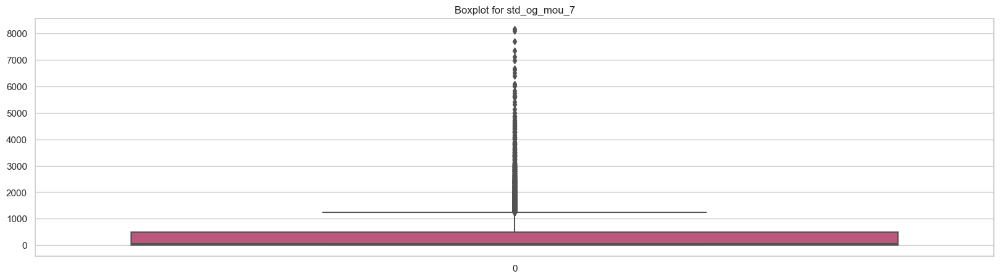

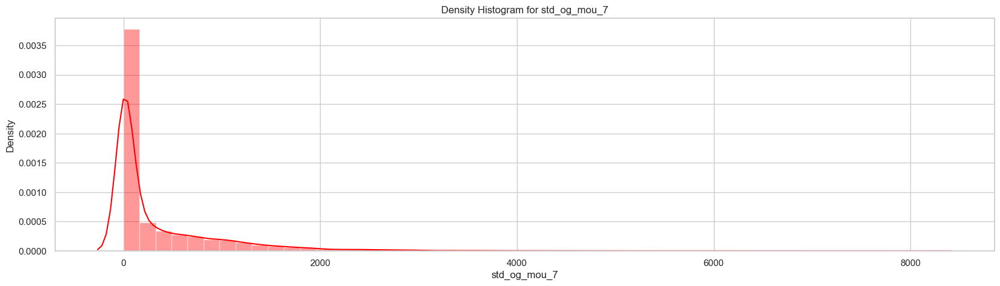

count               21001.00
mean                  363.01
std                   639.39
min                     0.00
25%                     0.00
50%                    42.78
75%                   497.63
max                  8155.53
Name: std_og_mou_7, dtype: float64


Now drop outliers from the col series and check the plots




43

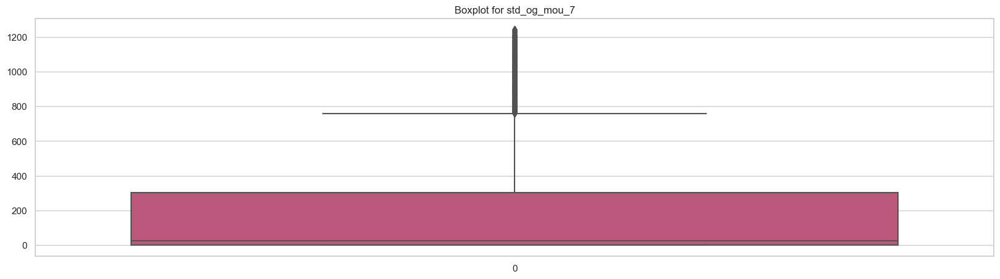

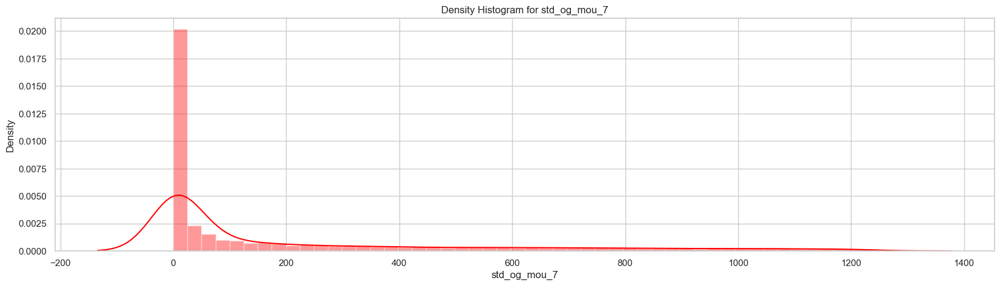

count               19158.00
mean                  207.47
std                   321.47
min                     0.00
25%                     0.00
50%                    24.23
75%                   302.57
max                  1243.84
Name: std_og_mou_7, dtype: float64
Customers Std_og_mou_7 ranges between 0.0 and 497.63



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col std_ic_t2t_mou_6


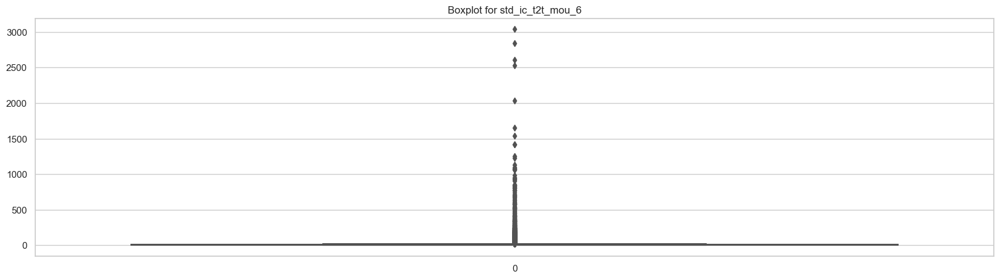

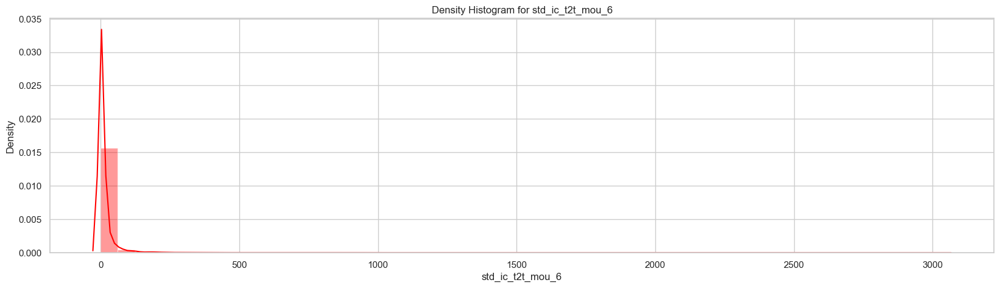

count               21001.00
mean                   14.02
std                    69.09
min                     0.00
25%                     0.00
50%                     0.23
75%                     7.66
max                  3038.34
Name: std_ic_t2t_mou_6, dtype: float64


Now drop outliers from the col series and check the plots




45

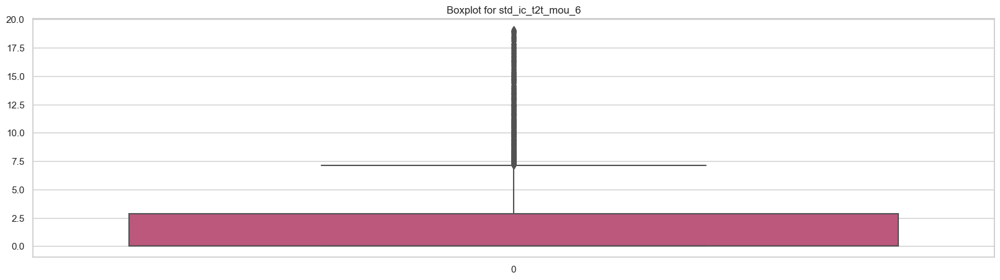

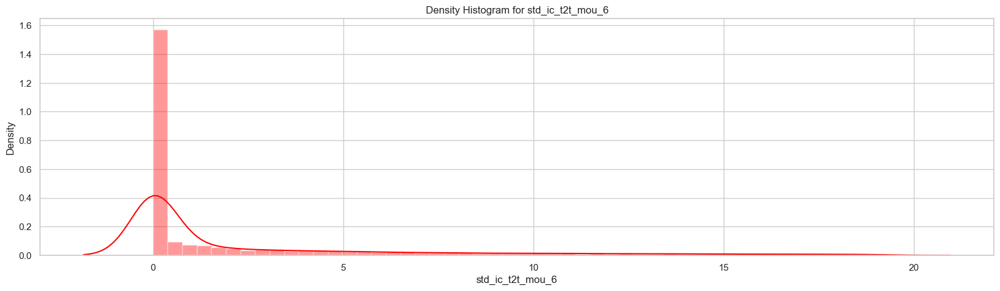

count               17975.00
mean                    2.39
std                     4.32
min                     0.00
25%                     0.00
50%                     0.00
75%                     2.84
max                    19.13
Name: std_ic_t2t_mou_6, dtype: float64
Customers Std_ic_t2t_mou_6 ranges between 0.0 and 7.66



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col og_others_6


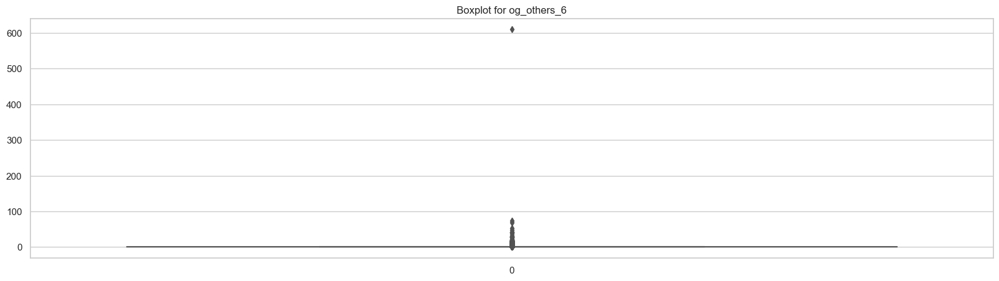

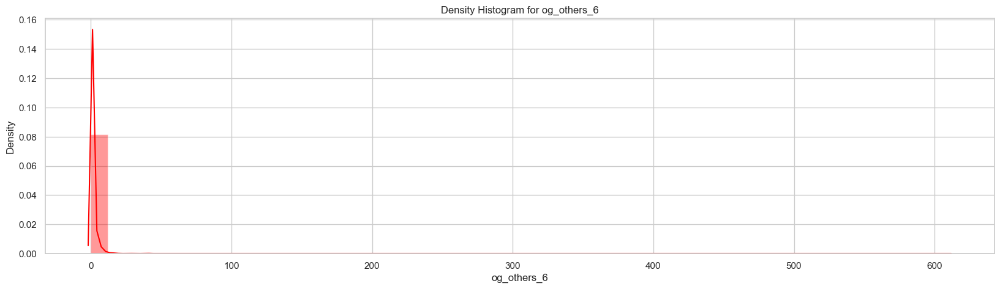

count               21001.00
mean                    0.64
std                     4.70
min                     0.00
25%                     0.00
50%                     0.00
75%                     0.00
max                   609.81
Name: og_others_6, dtype: float64


Now drop outliers from the col series and check the plots




39

Exception caught for col og_others_6 error 0 cannot continue
Customers Og_others_6 ranges between 0.0 and 0.0



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col spl_og_mou_6


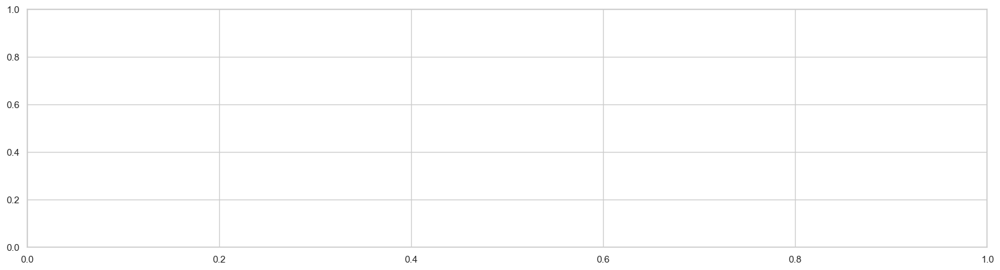

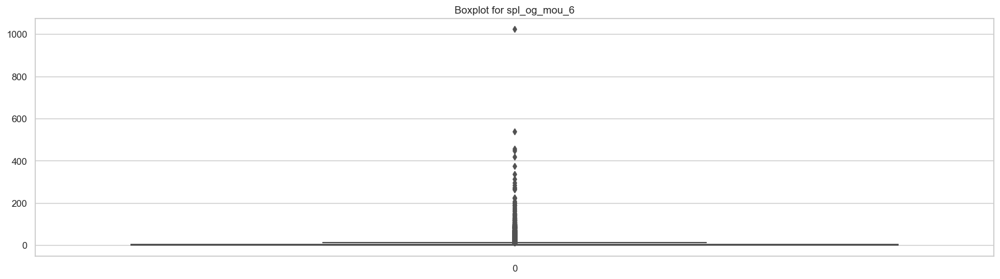

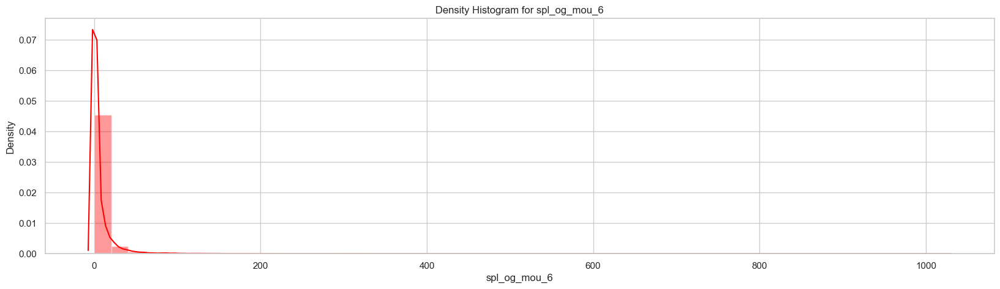

count               21001.00
mean                    5.60
std                    17.54
min                     0.00
25%                     0.00
50%                     0.10
75%                     4.85
max                  1023.21
Name: spl_og_mou_6, dtype: float64


Now drop outliers from the col series and check the plots




41

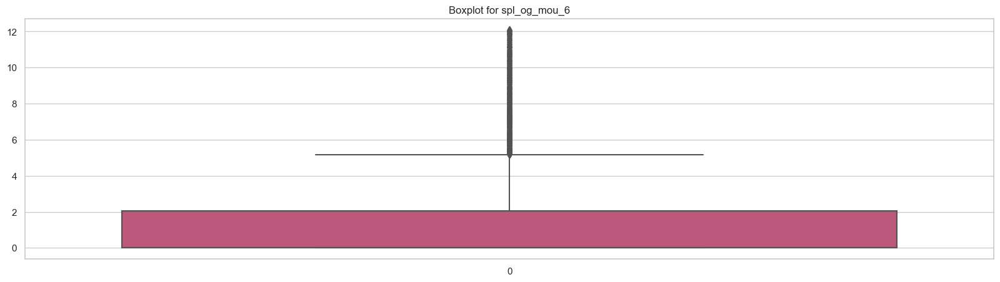

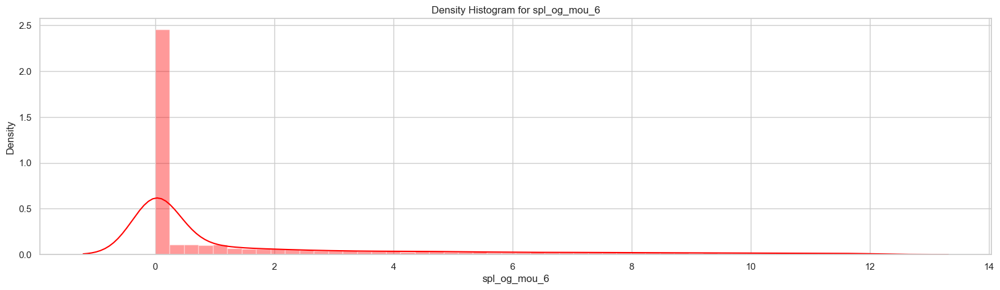

count               18301.00
mean                    1.65
std                     2.87
min                     0.00
25%                     0.00
50%                     0.00
75%                     2.06
max                    12.11
Name: spl_og_mou_6, dtype: float64
Customers Spl_og_mou_6 ranges between 0.0 and 4.85



> <hr style='width: 80%;height: 5px;color: blue;'>

Name of col isd_og_mou_6


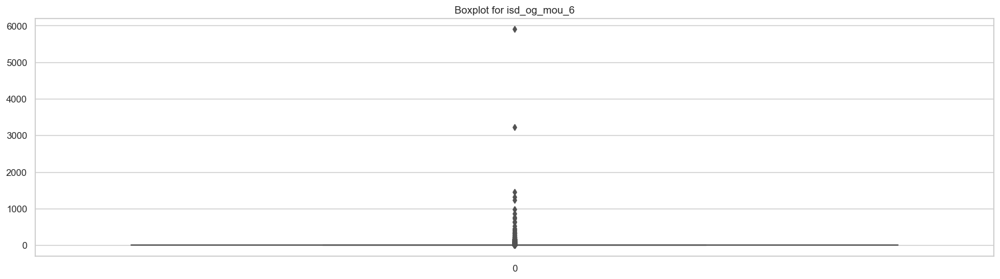

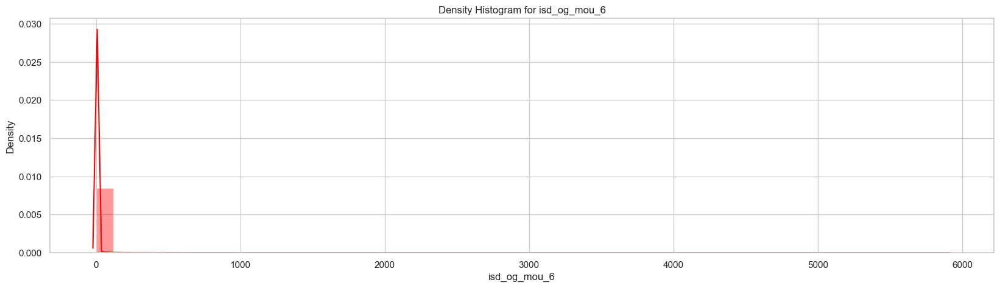

count               21001.00
mean                    2.29
std                    52.96
min                     0.00
25%                     0.00
50%                     0.00
75%                     0.00
max                  5900.66
Name: isd_og_mou_6, dtype: float64


Now drop outliers from the col series and check the plots




40

Exception caught for col isd_og_mou_6 error 0 cannot continue
Customers Isd_og_mou_6 ranges between 0.0 and 0.0



> <hr style='width: 80%;height: 5px;color: blue;'>

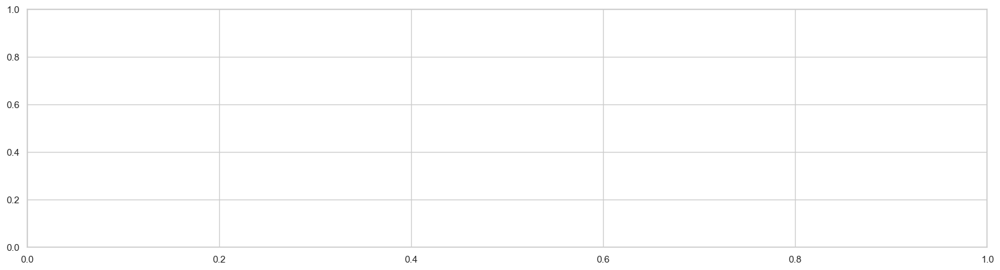

In [39]:

#Invoke the function for all col in num_variables:
#for num in data.select_dtypes(exclude = 'object').columns:
file = open("Univariate_Analysis.txt", "w")

for num in  nlargest_cols:
    if num == 'churn_probability':
        continue
    try :
#         print("######################################################################################### ")
        print(f"Name of col {num}")
        create_boxplot_and_distplot(num, churn_filtered)
    
        print("\n\nNow drop outliers from the col series and check the plots\n\n")
    
        df_new,q1,q3 = drop_outliers_from_series(num, churn_filtered)
        file.write(f"{num} ranges between {q1} and {q3}\n")

    except  Exception as err:
        print ("Exception caught for col {0} : {1}".format(col, err))
        print ("Skipping this col for further analysis")
        continue
    
    try :
        create_boxplot_and_distplot(num, df_new)
    except  Exception as err:
        print ("Exception caught for col {0} : {1}".format(col, err))
        print ("Skipping this col for further analysis")
        continue
    
    print(f"Customers {num.capitalize()} ranges between {q1} and {q3}\n")
    insert_line_break()


file.close()


Univariate data consolidated in a table with after excluding all 0 values:

| Variable             | Range               |
|----------------------|---------------------|
| std_og_mou_6         | 0.0 - 408.06        |
| date_of_last_rech_7  | 0.0 - 5.0           |
| std_og_t2t_mou_6     | 0.0 - 96.26         |
| std_og_t2m_mou_6     | 0.0 - 138.38        |
| date_of_last_rech_8  | 1.0 - 5.0           |
| onnet_mou_6          | 14.28 - 268.46      |
| total_og_mou_6       | 98.38 - 816.16      |
| total_rech_num_6     | 6.0 - 14.0          |
| arpu_6               | 279.284 - 684.408   |
| date_of_last_rech_6  | 0.0 - 5.0           |
| total_rech_amt_6     | 318.0 - 811.0       |
| offnet_mou_6         | 62.81 - 467.26      |
| std_og_t2t_mou_7     | 0.0 - 111.76        |



- In the data analysis, a range of key variables was examined, revealing significant variation across several metrics. 
<br>
- Notably, parameters such as "total_og_mou_6" and "arpu_6" exhibited considerable ranges, indicating diverse usage patterns and customer spending within these categories. 
<br>
- On the other hand, some attributes, like "roam_og_mou_7" and "roam_ic_mou_8," showed a narrower range, suggesting limited mobility activity during specific time periods. 
<br>
- Overall, this comprehensive exploration provides valuable insights for understanding customer behavior and patterns within a telecommunications dataset.

## Bivariate Analysis

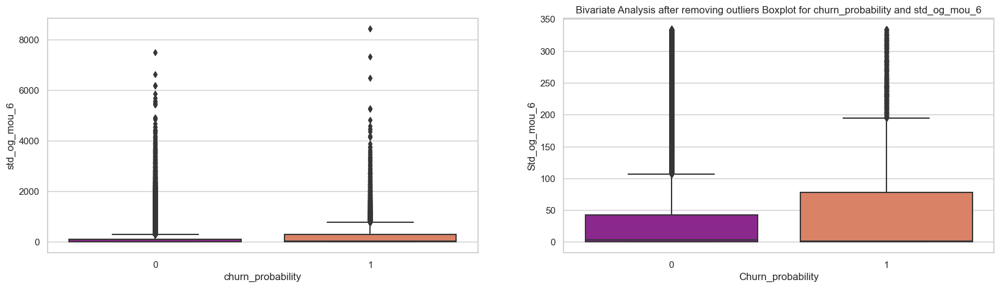

|<center> **Quantile** | **Churn Customers** | **All Customers** |
|----------------------|----------------|---------|
| **std_og_mou_6** | Q1 = 0.0 | Q1 = 0.0 |
|                                      | Q3 = 77.88 | Q3 = 133.89 </center>|

> <hr style='width: 80%;height: 5px;color: blue;'>

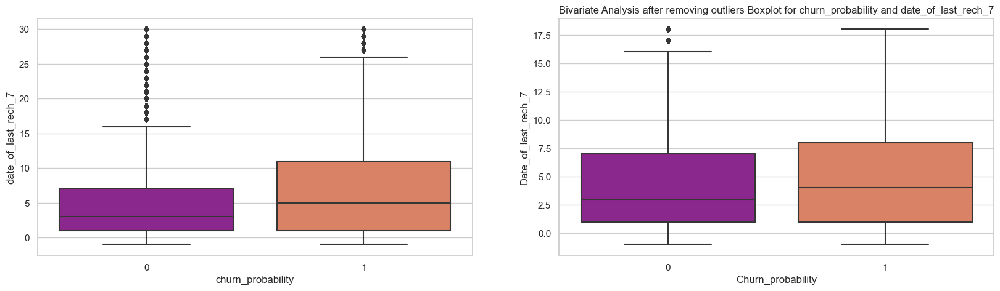

|<center> **Quantile** | **Churn Customers** | **All Customers** |
|----------------------|----------------|---------|
| **date_of_last_rech_7** | Q1 = 1.0 | Q1 = 1.0 |
|                                      | Q3 = 8.0 | Q3 = 8.0 </center>|

> <hr style='width: 80%;height: 5px;color: blue;'>

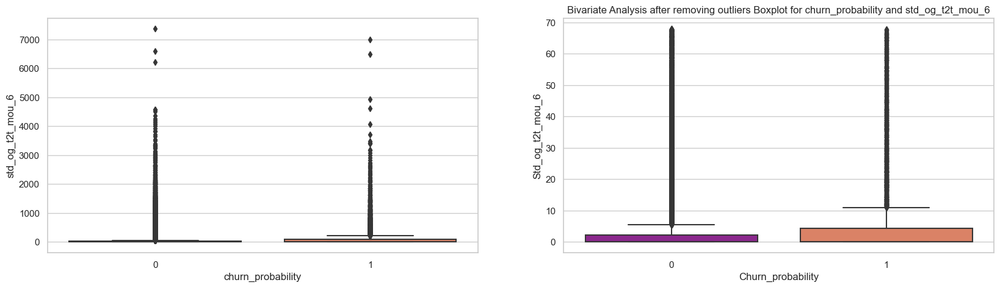

|<center> **Quantile** | **Churn Customers** | **All Customers** |
|----------------------|----------------|---------|
| **std_og_t2t_mou_6** | Q1 = 0.0 | Q1 = 0.0 |
|                                      | Q3 = 4.4 | Q3 = 27.16 </center>|

> <hr style='width: 80%;height: 5px;color: blue;'>

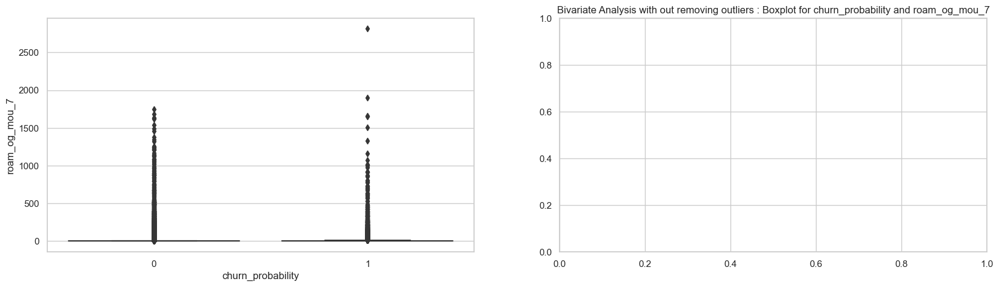

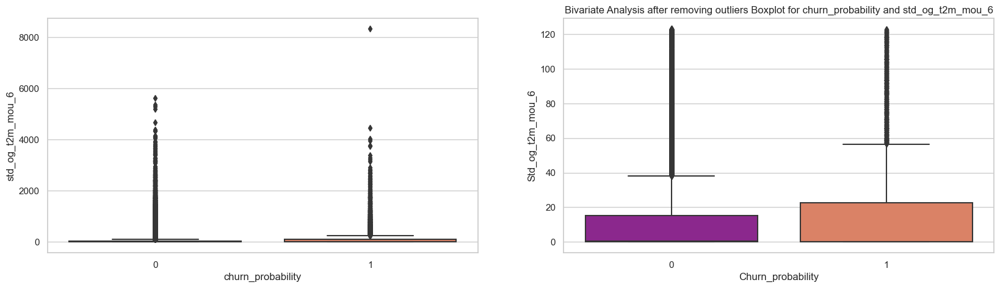

|<center> **Quantile** | **Churn Customers** | **All Customers** |
|----------------------|----------------|---------|
| **std_og_t2m_mou_6** | Q1 = 0.0 | Q1 = 0.0 |
|                                      | Q3 = 22.61 | Q3 = 49.15 </center>|

> <hr style='width: 80%;height: 5px;color: blue;'>

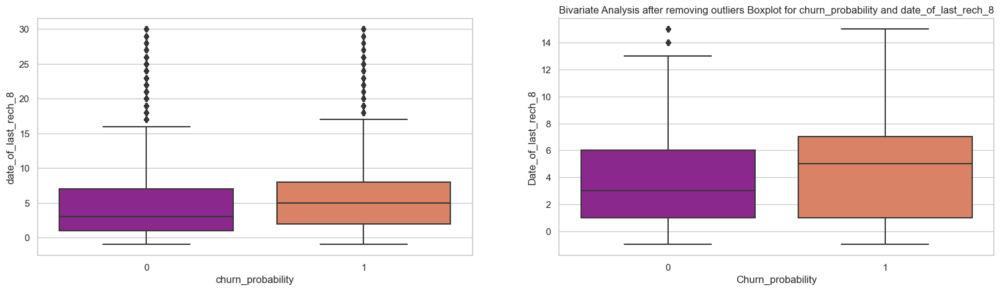

|<center> **Quantile** | **Churn Customers** | **All Customers** |
|----------------------|----------------|---------|
| **date_of_last_rech_8** | Q1 = 1.0 | Q1 = 1.0 |
|                                      | Q3 = 7.0 | Q3 = 7.0 </center>|

> <hr style='width: 80%;height: 5px;color: blue;'>

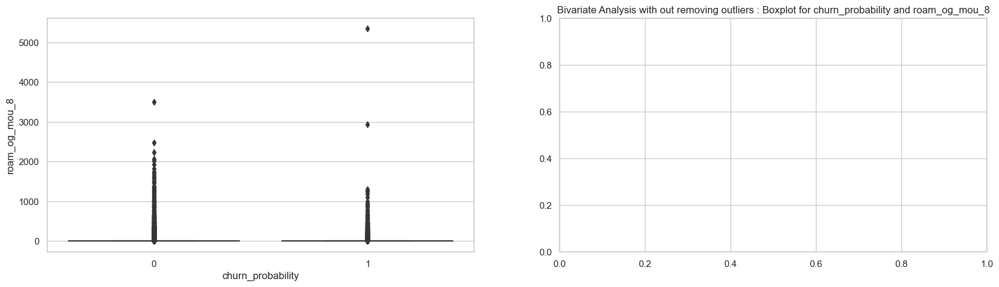

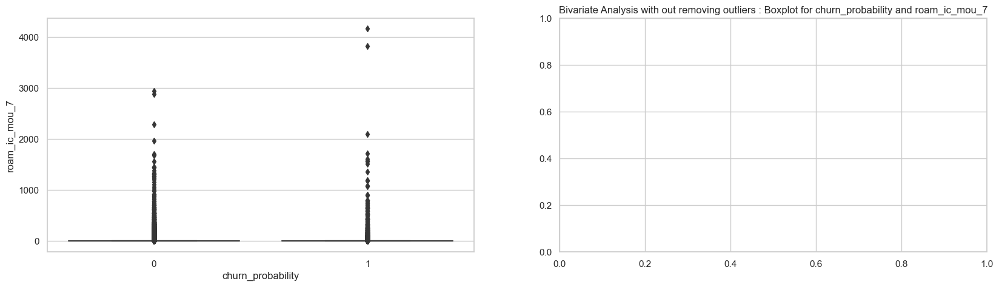

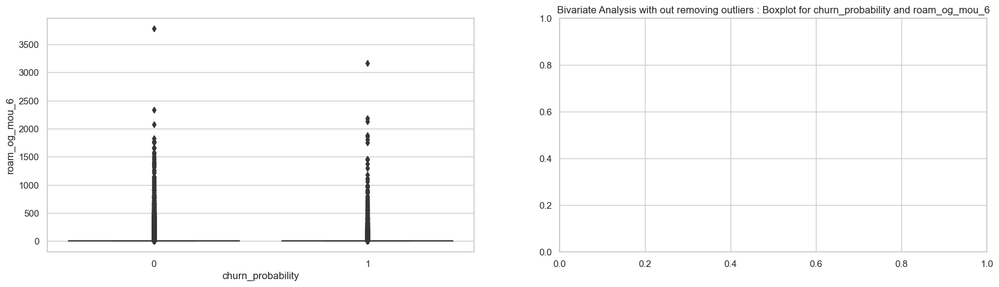

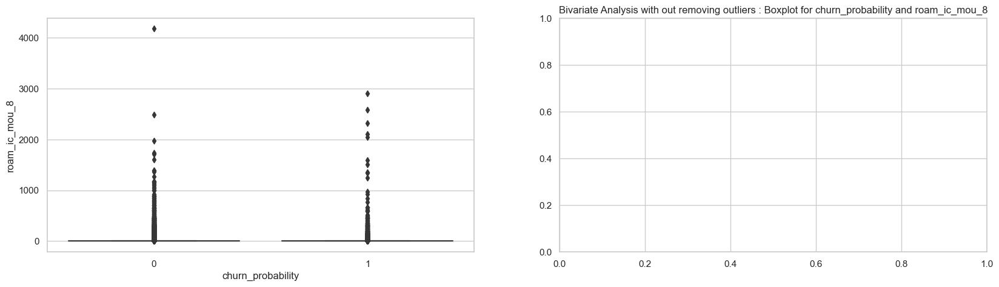

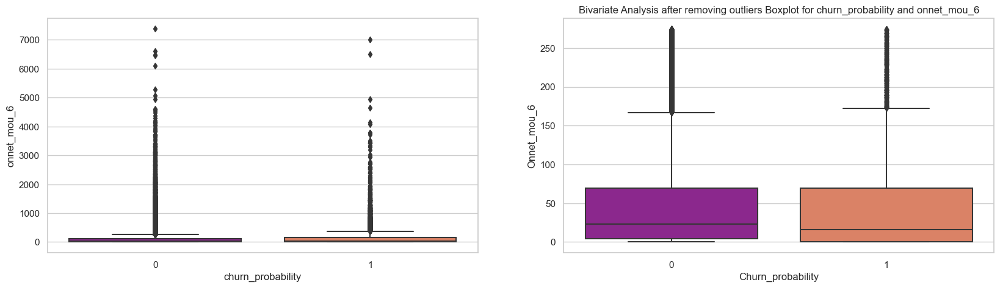

|<center> **Quantile** | **Churn Customers** | **All Customers** |
|----------------------|----------------|---------|
| **onnet_mou_6** | Q1 = 0.0 | Q1 = 5.43 |
|                                      | Q3 = 69.05 | Q3 = 113.1 </center>|

> <hr style='width: 80%;height: 5px;color: blue;'>

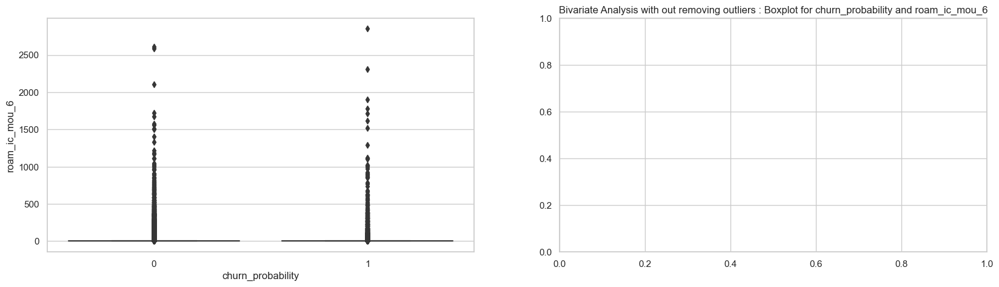

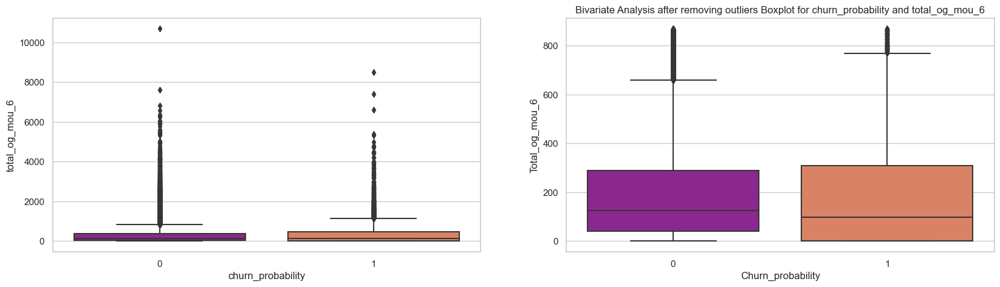

|<center> **Quantile** | **Churn Customers** | **All Customers** |
|----------------------|----------------|---------|
| **total_og_mou_6** | Q1 = 0.0 | Q1 = 44.78 |
|                                      | Q3 = 307.71 | Q3 = 374.3 </center>|

> <hr style='width: 80%;height: 5px;color: blue;'>

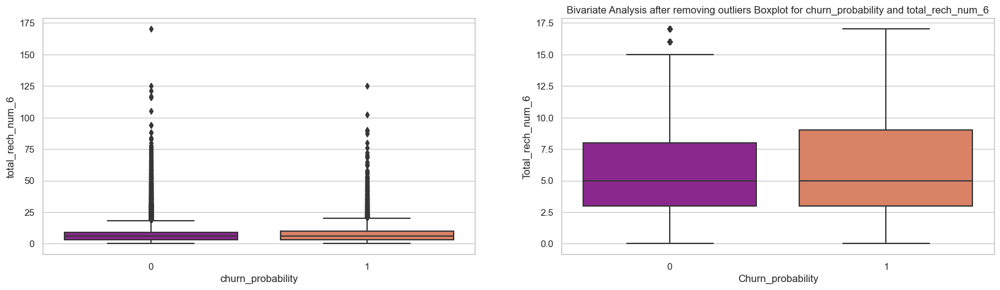

|<center> **Quantile** | **Churn Customers** | **All Customers** |
|----------------------|----------------|---------|
| **total_rech_num_6** | Q1 = 3.0 | Q1 = 3.0 |
|                                      | Q3 = 9.0 | Q3 = 9.0 </center>|

> <hr style='width: 80%;height: 5px;color: blue;'>

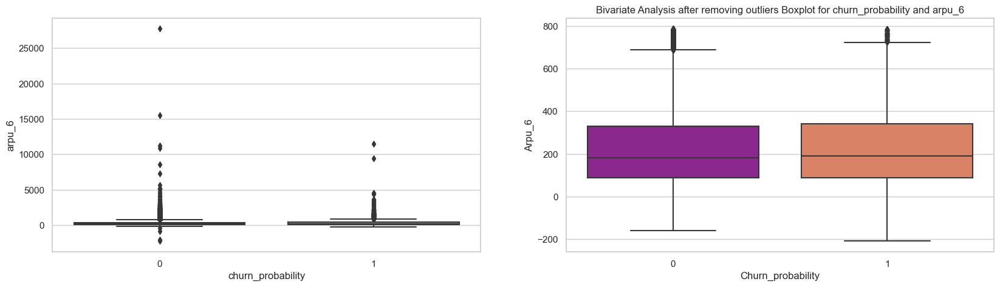

|<center> **Quantile** | **Churn Customers** | **All Customers** |
|----------------------|----------------|---------|
| **arpu_6** | Q1 = 87.25 | Q1 = 93.58 |
|                                      | Q3 = 341.71 | Q3 = 370.79 </center>|

> <hr style='width: 80%;height: 5px;color: blue;'>

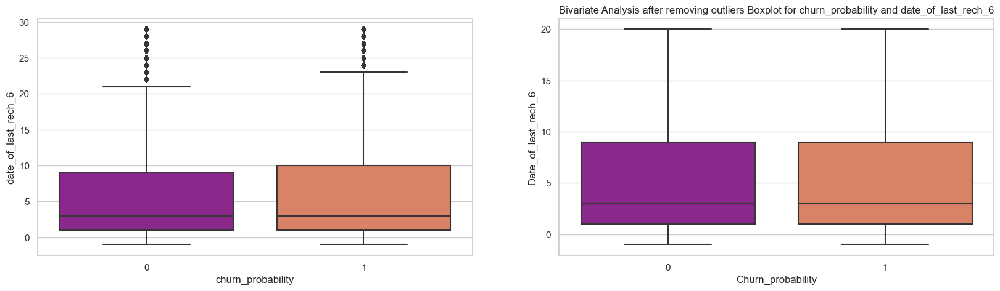

|<center> **Quantile** | **Churn Customers** | **All Customers** |
|----------------------|----------------|---------|
| **date_of_last_rech_6** | Q1 = 1.0 | Q1 = 1.0 |
|                                      | Q3 = 9.0 | Q3 = 9.0 </center>|

> <hr style='width: 80%;height: 5px;color: blue;'>

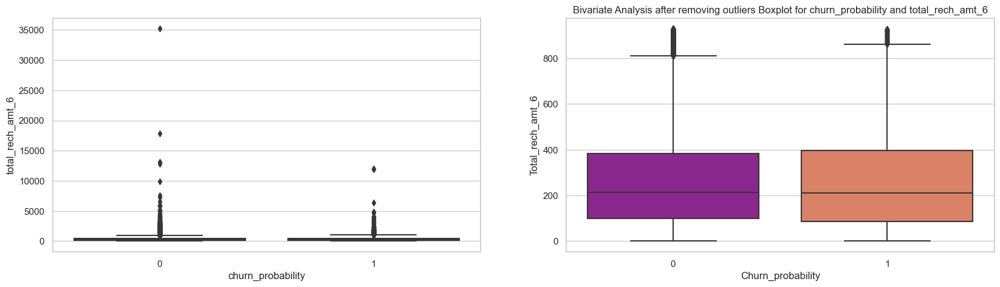

|<center> **Quantile** | **Churn Customers** | **All Customers** |
|----------------------|----------------|---------|
| **total_rech_amt_6** | Q1 = 86.0 | Q1 = 110.0 |
|                                      | Q3 = 396.0 | Q3 = 438.0 </center>|

> <hr style='width: 80%;height: 5px;color: blue;'>

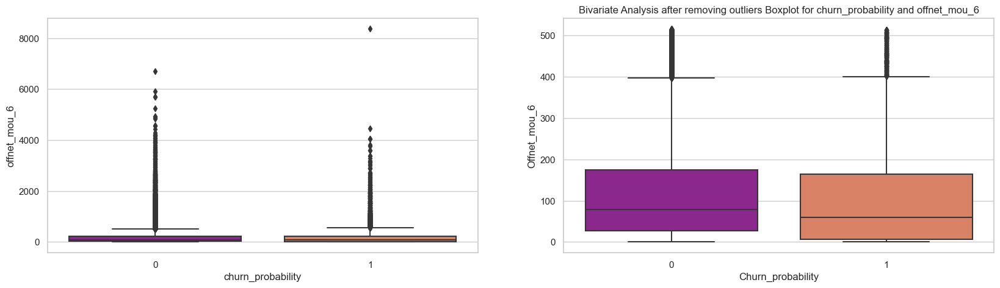

|<center> **Quantile** | **Churn Customers** | **All Customers** |
|----------------------|----------------|---------|
| **offnet_mou_6** | Q1 = 6.0 | Q1 = 28.79 |
|                                      | Q3 = 164.03 | Q3 = 223.54 </center>|

> <hr style='width: 80%;height: 5px;color: blue;'>

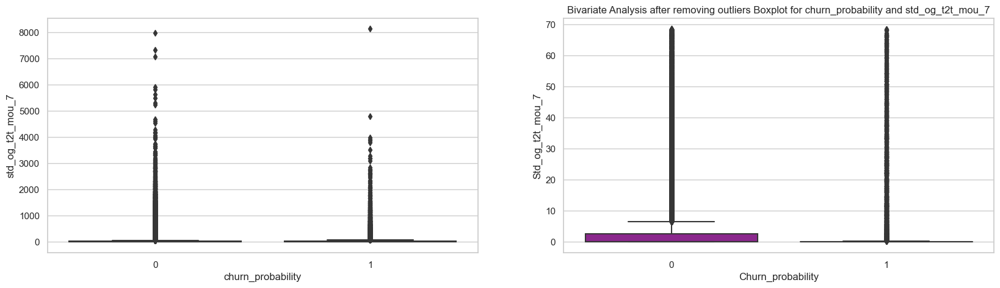

|<center> **Quantile** | **Churn Customers** | **All Customers** |
|----------------------|----------------|---------|
| **std_og_t2t_mou_7** | Q1 = 0.0 | Q1 = 0.0 |
|                                      | Q3 = 0.13 | Q3 = 27.44 </center>|

> <hr style='width: 80%;height: 5px;color: blue;'>

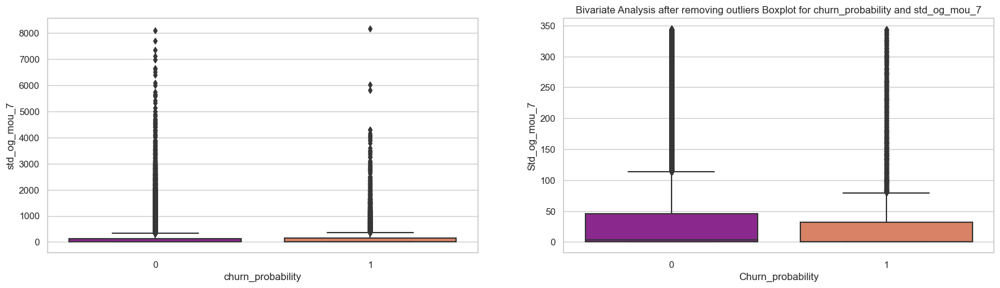

|<center> **Quantile** | **Churn Customers** | **All Customers** |
|----------------------|----------------|---------|
| **std_og_mou_7** | Q1 = 0.0 | Q1 = 0.0 |
|                                      | Q3 = 31.84 | Q3 = 137.78 </center>|

> <hr style='width: 80%;height: 5px;color: blue;'>

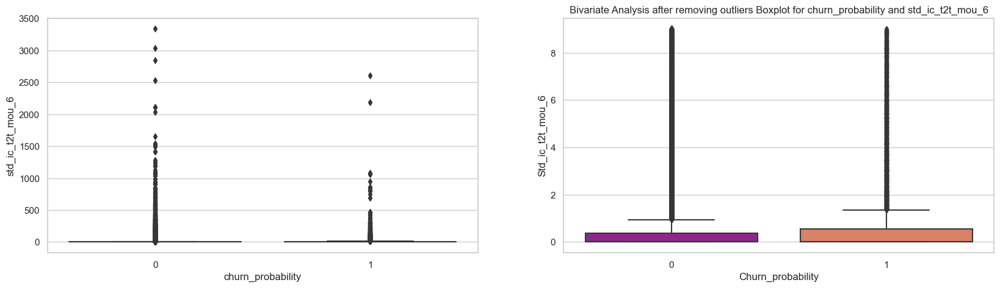

|<center> **Quantile** | **Churn Customers** | **All Customers** |
|----------------------|----------------|---------|
| **std_ic_t2t_mou_6** | Q1 = 0.0 | Q1 = 0.0 |
|                                      | Q3 = 0.55 | Q3 = 3.61 </center>|

> <hr style='width: 80%;height: 5px;color: blue;'>

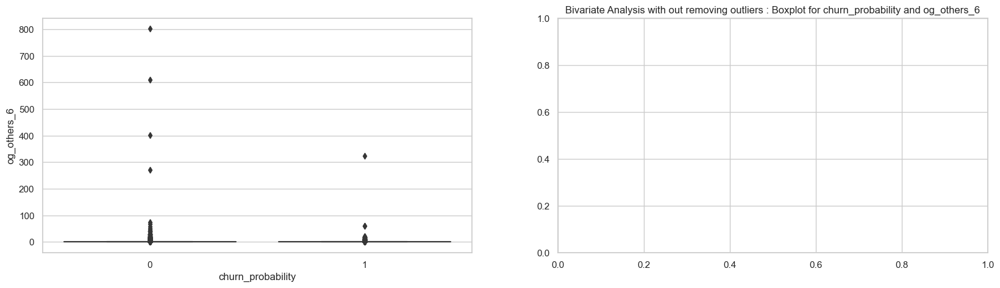

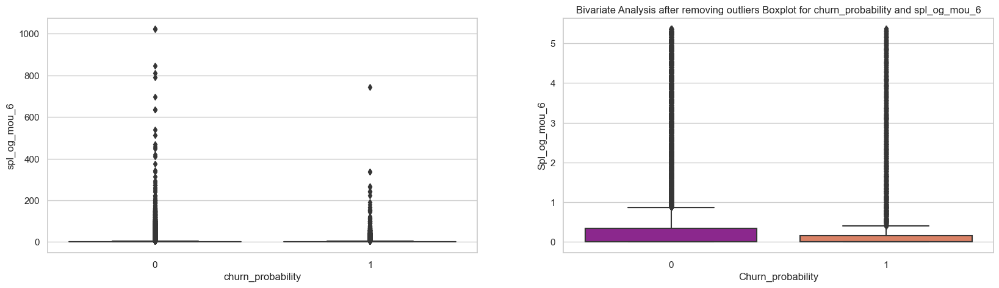

|<center> **Quantile** | **Churn Customers** | **All Customers** |
|----------------------|----------------|---------|
| **spl_og_mou_6** | Q1 = 0.0 | Q1 = 0.0 |
|                                      | Q3 = 0.16 | Q3 = 2.15 </center>|

> <hr style='width: 80%;height: 5px;color: blue;'>

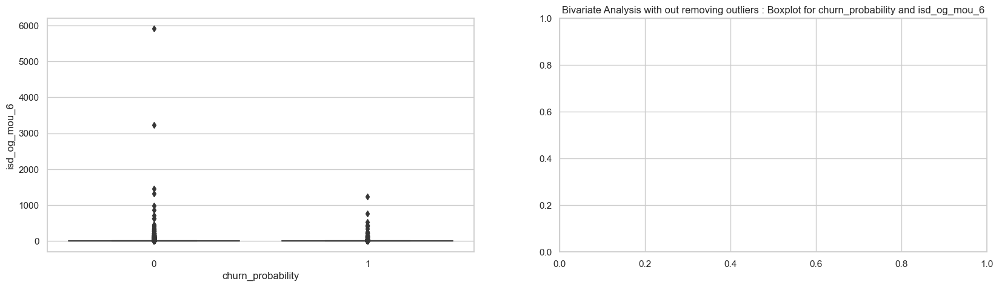

In [40]:
# or we can fetch nlargest highly correlated features and do analysis ?


for col in  nlargest_cols:
    try:
        if col == "churn_probability":
            continue
        chart_with_and_without_outliers('churn_probability', col, data)
    except Exception as err:
#         print(err)
        pass


### Findings

#### Bivariate Analysis on Categorical columns for high value customers

- arpu_6 - Values from -210 to 15 have higher churn rate than the average churn rate of 6%
- offnet_mou_6 - Values from -859 to 1073 have higher churn rate than the average churn rate of 6%
- roam_ic_mou_6 - As the values increases the churn rate increases
- loc_og_t2c_mou_6 - Values from 135 to 217 have higher churn rate than the average churn rate of 6%
- std_og_t2t_mou_6 - Values from 120 to 240 have higher churn rate than the average churn rate of 6%
- std_og_t2m_mou_6 - Values from 155 to 345 have higher churn rate than the average churn rate of 6%
- std_og_mou_6 - Values from 612 to 969 have higher churn rate than the average churn rate of 6%
- isd_og_mou_6 - Values from 295 to 1475 have higher churn rate than the average churn rate of 6%
- isd_og_mou_6 - Values from 295 to 1475 have higher churn rate than the average churn rate of 6%
- total_og_mou_6 - As the values increases the churn rate increases
- loc_ic_t2t_mou_6, loc_ic_t2m_mou_6, loc_ic_t2f_mou_6, loc_ic_mou_6, total_ic_mou_6 - As the values increases the churn rate decreases
- total_rech_num_6, total_rech_amt_6, av_rech_amt_data_6 - As the values increases the churn rate increases
- vbc_3g_6 - As the values increases the churn rate decreases

{'arpu',
 'av_rech_amt_data',
 'date_of_last_rech',
 'date_of_last_rech_data',
 'ic_others',
 'isd_ic_mou',
 'isd_og_mou',
 'last_day_rch_amt',
 'loc_ic_mou',
 'loc_ic_t2f_mou',
 'loc_ic_t2m_mou',
 'loc_ic_t2t_mou',
 'loc_og_mou',
 'loc_og_t2c_mou',
 'loc_og_t2f_mou',
 'loc_og_t2m_mou',
 'loc_og_t2t_mou',
 'max_rech_amt',
 'max_rech_data',
 'monthly_2g',
 'monthly_3g',
 'offnet_mou',
 'og_others',
 'onnet_mou',
 'roam_ic_mou',
 'roam_og_mou',
 'sachet_2g',
 'sachet_3g',
 'spl_ic_mou',
 'spl_og_mou',
 'std_ic_mou',
 'std_ic_t2f_mou',
 'std_ic_t2m_mou',
 'std_ic_t2t_mou',
 'std_og_mou',
 'std_og_t2f_mou',
 'std_og_t2m_mou',
 'std_og_t2t_mou',
 'total_ic_mou',
 'total_og_mou',
 'total_rech_amt',
 'total_rech_data',
 'total_rech_num',
 'vbc_3g',
 'vol_2g_mb',
 'vol_3g_mb'}

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                      std_ic_t2t_mou_6     std_ic_t2t_mou_7  \
churn_probability                                             
0                                13.56                14.92   
1                                21.23                17.77   

                      std_ic_t2t_mou_8  
churn_probability                       
0                                15.17  
1                                 5.83  


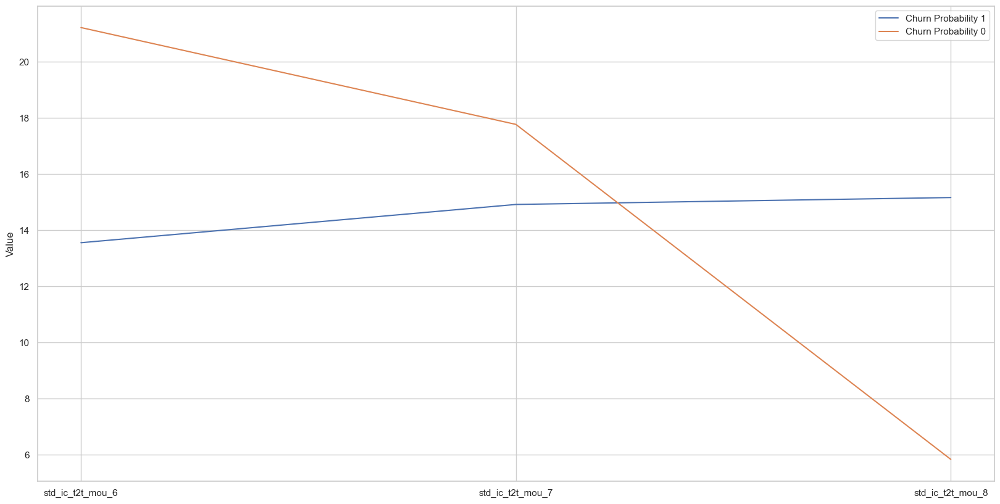

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                      loc_og_t2m_mou_6     loc_og_t2m_mou_7  \
churn_probability                                             
0                               161.39               164.24   
1                               107.89                93.78   

                      loc_og_t2m_mou_8  
churn_probability                       
0                               164.11  
1                                41.35  


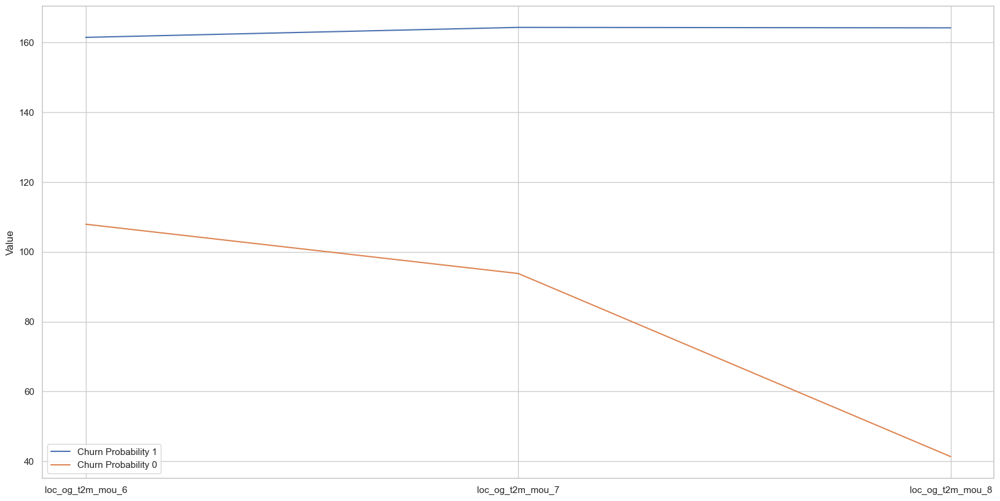

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                    av_rech_amt_data_6   av_rech_amt_data_7  \
churn_probability                                             
0                               128.02               141.03   
1                               127.97               112.23   

                    av_rech_amt_data_8  
churn_probability                       
0                               144.72  
1                                55.03  


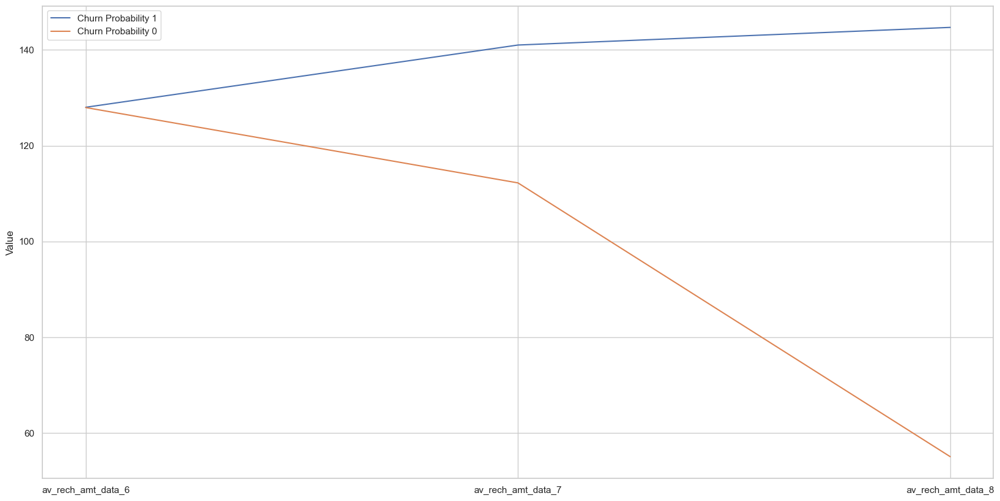

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                      std_og_t2t_mou_6     std_og_t2t_mou_7  \
churn_probability                                             
0                               146.48               166.37   
1                               315.08               282.44   

                      std_og_t2t_mou_8  
churn_probability                       
0                               166.38  
1                               123.42  


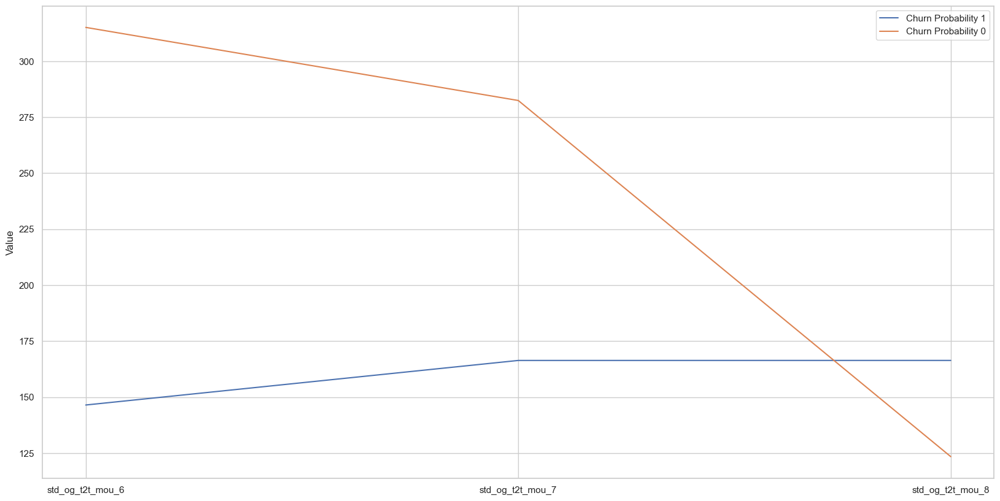

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                           og_others_6          og_others_7  \
churn_probability                                             
0                                 0.63                 0.03   
1                                 0.75                 0.01   

                           og_others_8  
churn_probability                       
0                                 0.07  
1                                 0.00  


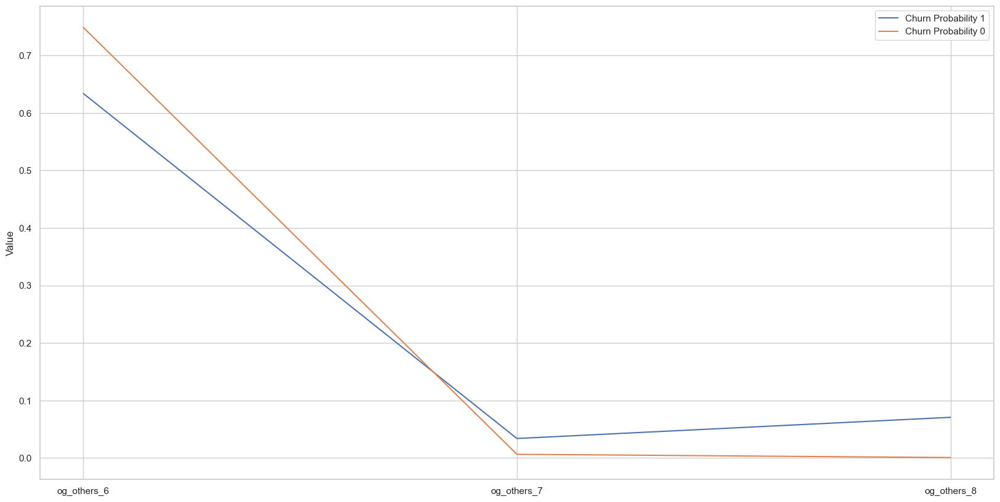

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                        max_rech_amt_6       max_rech_amt_7  \
churn_probability                                             
0                               162.48               167.50   
1                               181.06               180.97   

                        max_rech_amt_8  
churn_probability                       
0                               175.74  
1                               126.15  


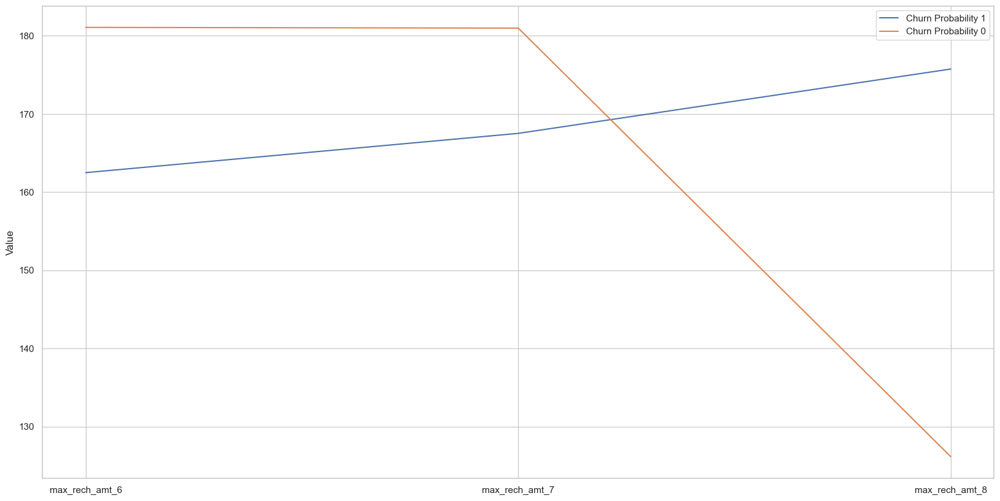

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                   date_of_last_rech_6  date_of_last_rech_7  \
churn_probability                                             
0                                 3.75                 3.56   
1                                 3.38                 5.09   

                   date_of_last_rech_8  
churn_probability                       
0                                 3.64  
1                                 6.49  


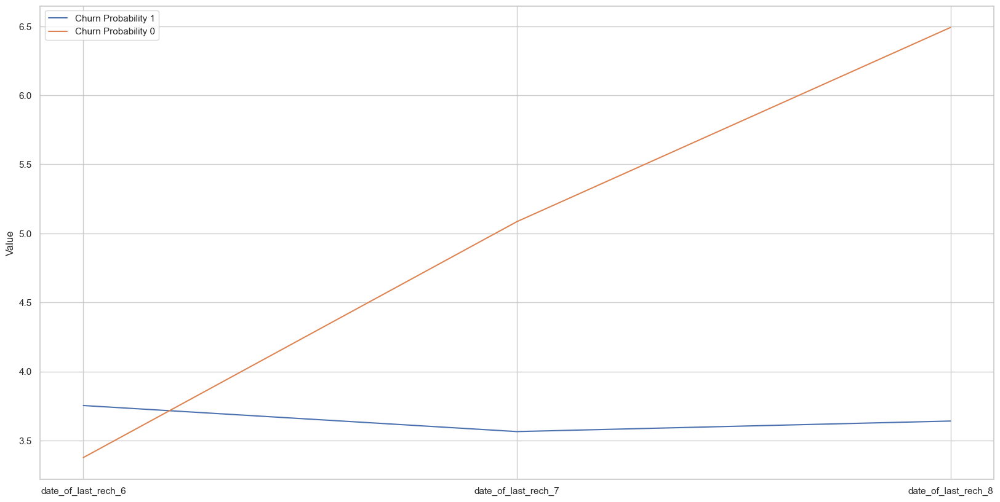

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                          spl_og_mou_6         spl_og_mou_7  \
churn_probability                                             
0                                 5.50                 7.02   
1                                 7.14                 8.27   

                          spl_og_mou_8  
churn_probability                       
0                                 7.44  
1                                 3.58  


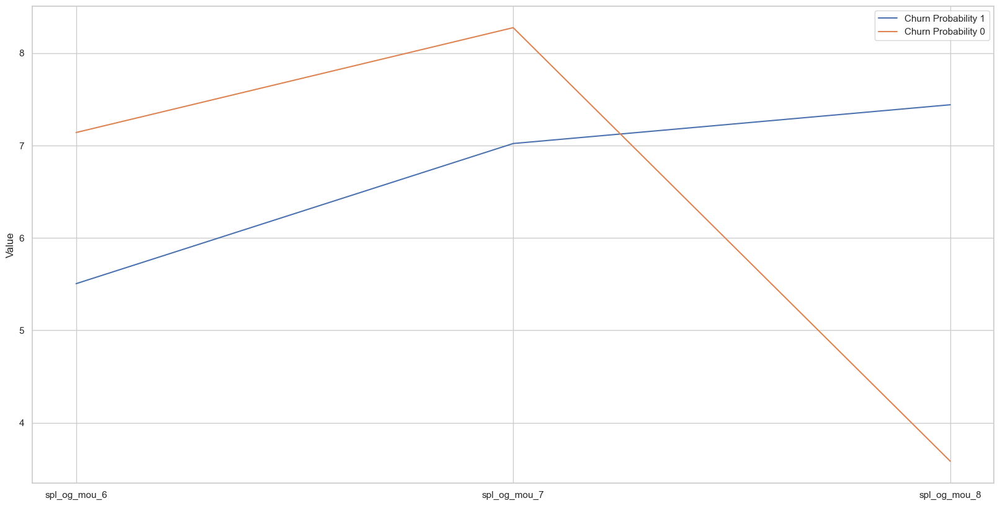

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                      total_rech_amt_6     total_rech_amt_7  \
churn_probability                                             
0                               622.26               646.59   
1                               830.23               719.03   

                      total_rech_amt_8  
churn_probability                       
0                               657.86  
1                               373.77  


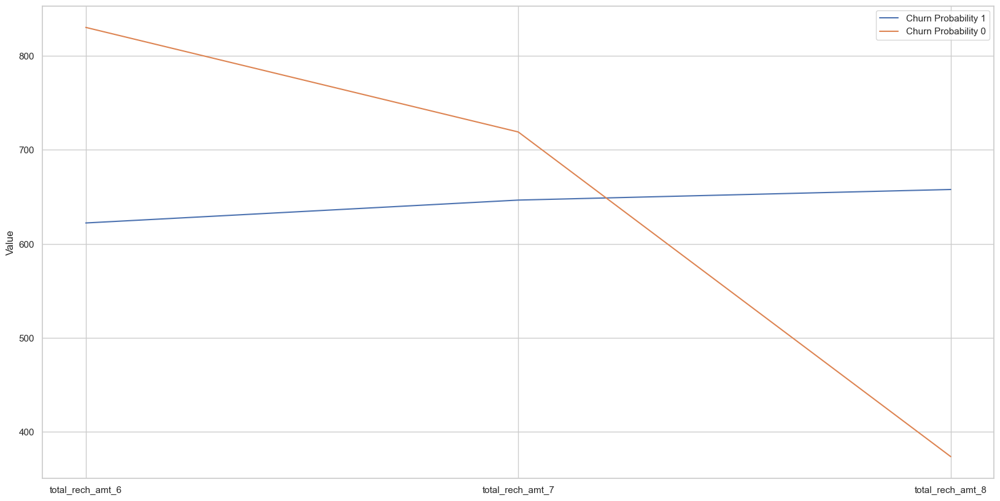

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                          loc_og_mou_6         loc_og_mou_7  \
churn_probability                                             
0                               251.32               258.22   
1                               168.99               146.13   

                          loc_og_mou_8  
churn_probability                       
0                               256.01  
1                                65.11  


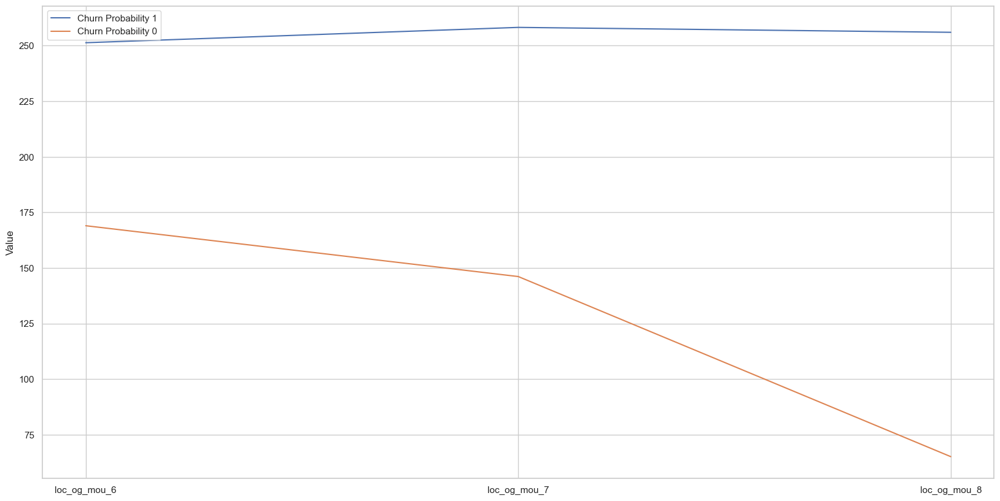

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                          isd_og_mou_6         isd_og_mou_7  \
churn_probability                                             
0                                 2.07                 2.14   
1                                 5.60                 3.99   

                          isd_og_mou_8  
churn_probability                       
0                                 2.29  
1                                 2.56  


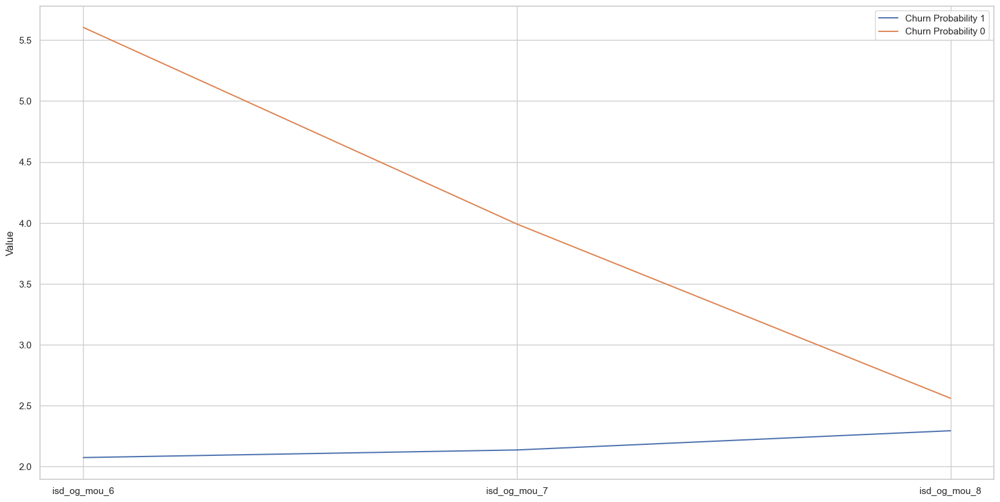

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                           sachet_2g_6          sachet_2g_7  \
churn_probability                                             
0                                 1.03                 1.22   
1                                 1.17                 1.05   

                           sachet_2g_8  
churn_probability                       
0                                 1.28  
1                                 0.41  


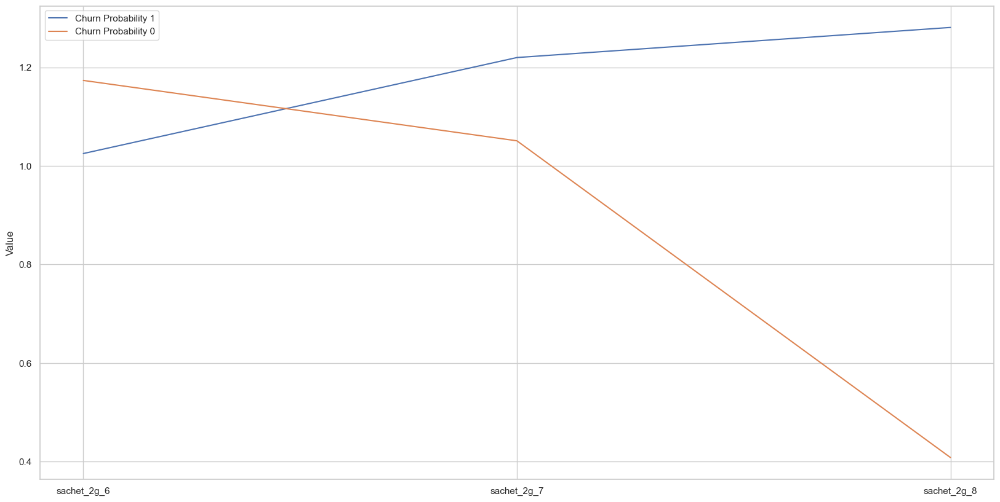

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                      std_ic_t2f_mou_6     std_ic_t2f_mou_7  \
churn_probability                                             
0                                 2.70                 2.81   
1                                 1.40                 1.51   

                      std_ic_t2f_mou_8  
churn_probability                       
0                                 2.61  
1                                 0.67  


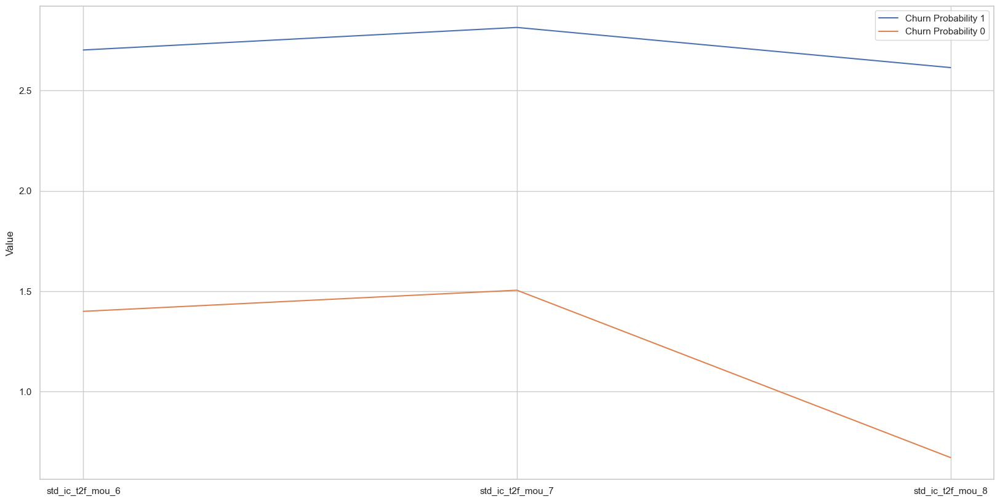

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                         roam_ic_mou_6        roam_ic_mou_7  \
churn_probability                                             
0                                14.51                10.95   
1                                29.77                32.35   

                         roam_ic_mou_8  
churn_probability                       
0                                11.29  
1                                32.11  


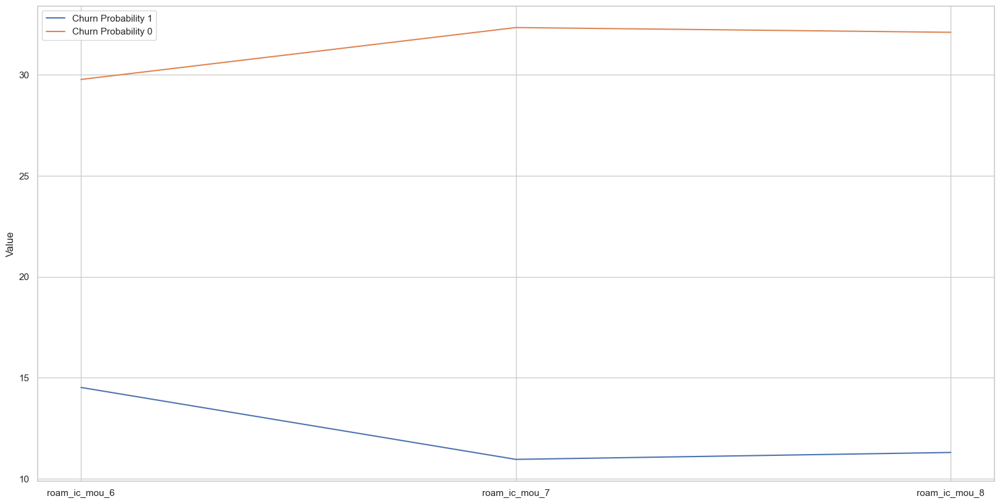

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                          isd_ic_mou_6         isd_ic_mou_7  \
churn_probability                                             
0                                10.50                11.67   
1                                11.19                10.61   

                          isd_ic_mou_8  
churn_probability                       
0                                11.88  
1                                 7.60  


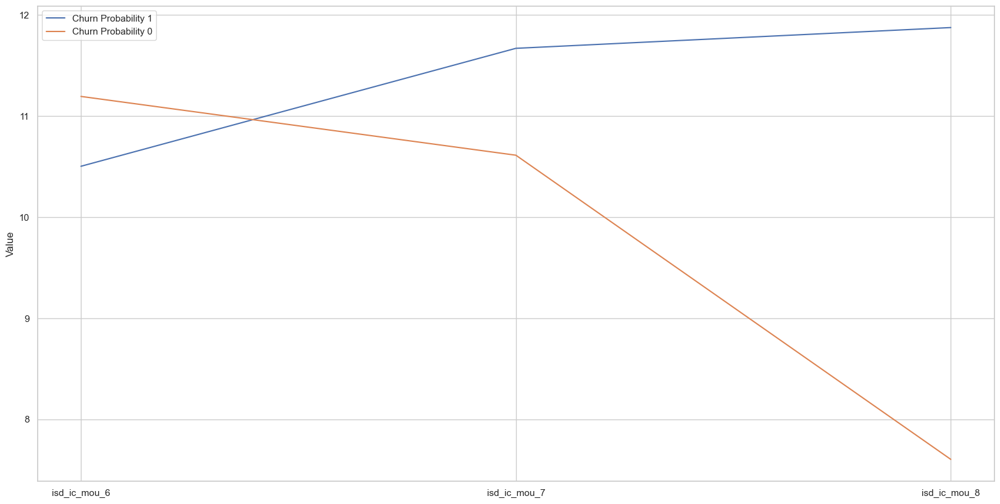

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                              vbc_3g_6             vbc_3g_7  \
churn_probability                                             
0                               189.90               182.21   
1                                59.27               120.83   

                              vbc_3g_8  
churn_probability                       
0                               161.02  
1                               138.26  


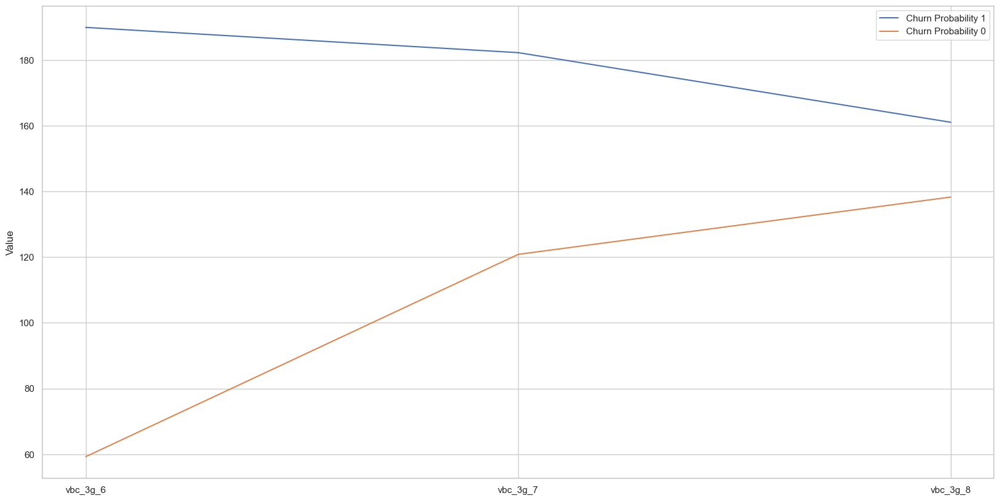

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                      loc_ic_t2m_mou_6     loc_ic_t2m_mou_7  \
churn_probability                                             
0                               149.12               153.34   
1                               102.51                84.33   

                      loc_ic_t2m_mou_8  
churn_probability                       
0                               156.88  
1                                38.92  


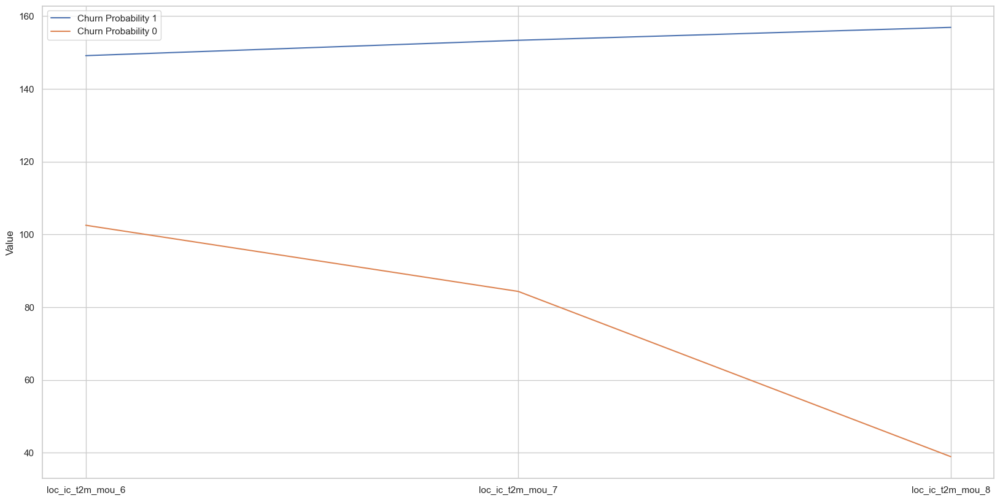

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                          loc_ic_mou_6         loc_ic_mou_7  \
churn_probability                                             
0                               229.52               237.06   
1                               152.69               127.38   

                          loc_ic_mou_8  
churn_probability                       
0                               239.96  
1                                58.01  


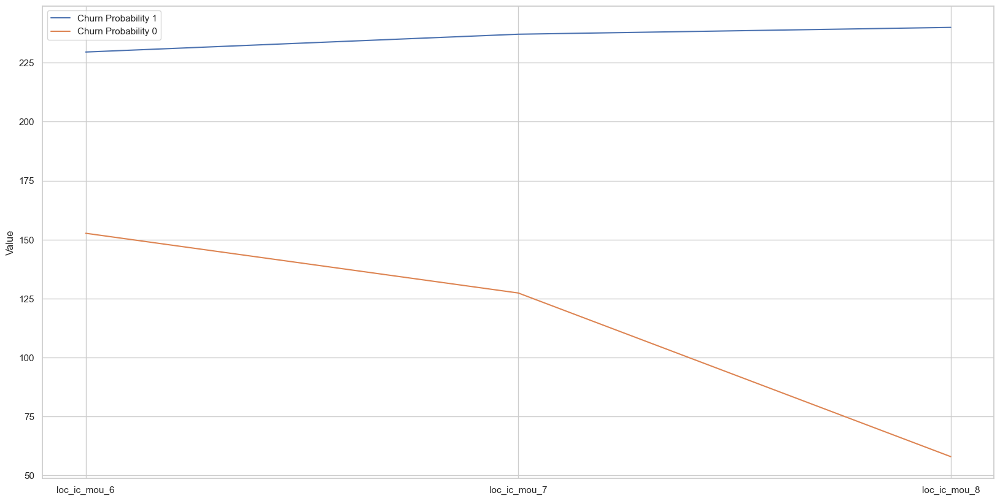

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                        total_ic_mou_6       total_ic_mou_7  \
churn_probability                                             
0                               285.36               298.34   
1                               218.95               186.36   

                        total_ic_mou_8  
churn_probability                       
0                               301.15  
1                                84.85  


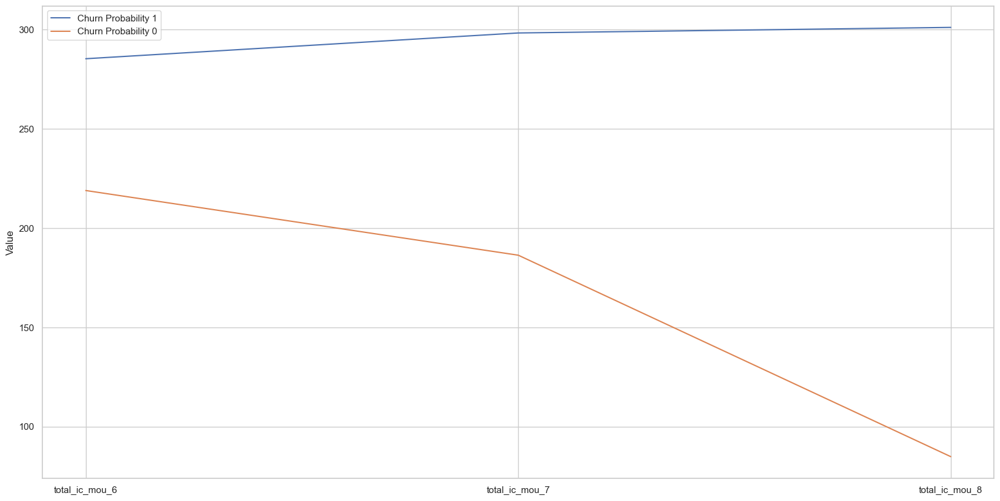

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                           vol_2g_mb_6          vol_2g_mb_7  \
churn_probability                                             
0                               124.78               127.85   
1                               109.53                98.00   

                           vol_2g_mb_8  
churn_probability                       
0                               127.52  
1                                36.92  


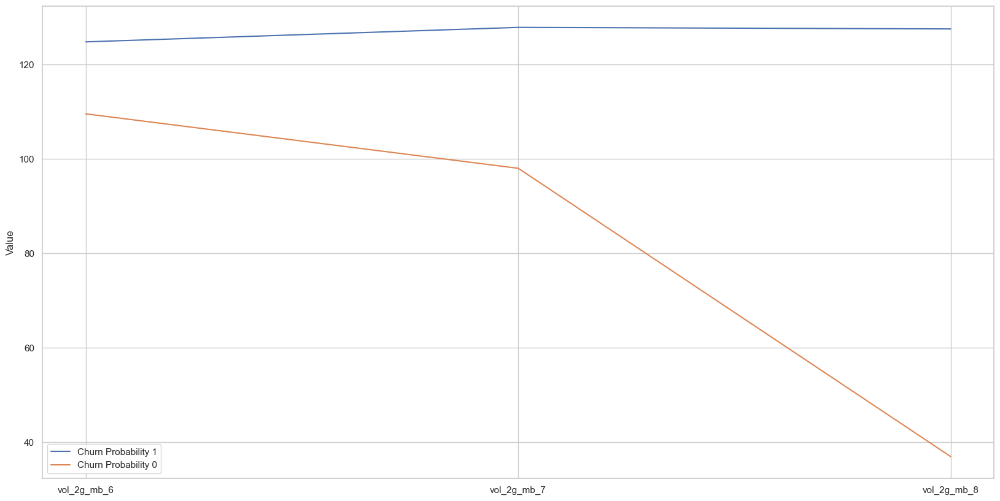

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                         roam_og_mou_6        roam_og_mou_7  \
churn_probability                                             
0                                24.43                17.27   
1                                57.29                56.91   

                         roam_og_mou_8  
churn_probability                       
0                                17.87  
1                                56.77  


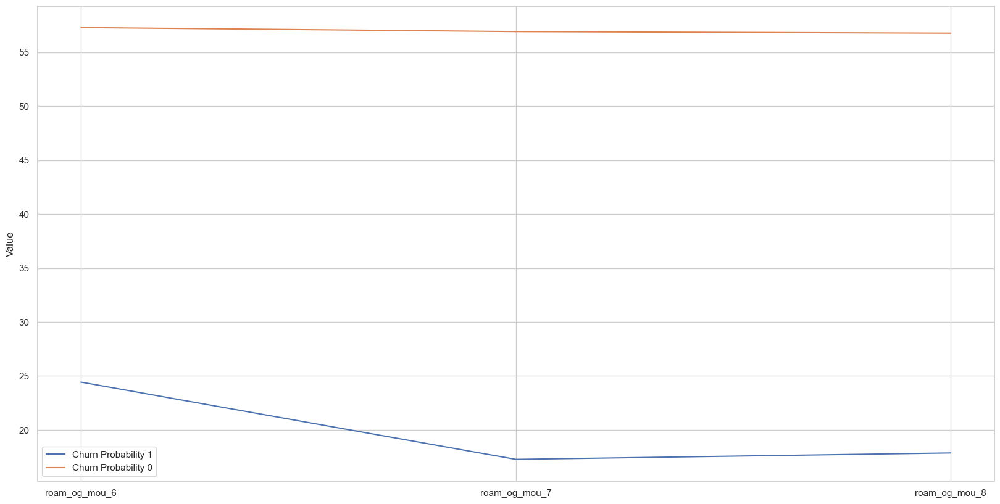

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                   date_of_last_rech_data_6  date_of_last_rech_data_7  \
churn_probability                                                       
0                                      5.05                      5.39   
1                                      3.81                      4.35   

                   date_of_last_rech_data_8  
churn_probability                            
0                                      5.74  
1                                      3.45  


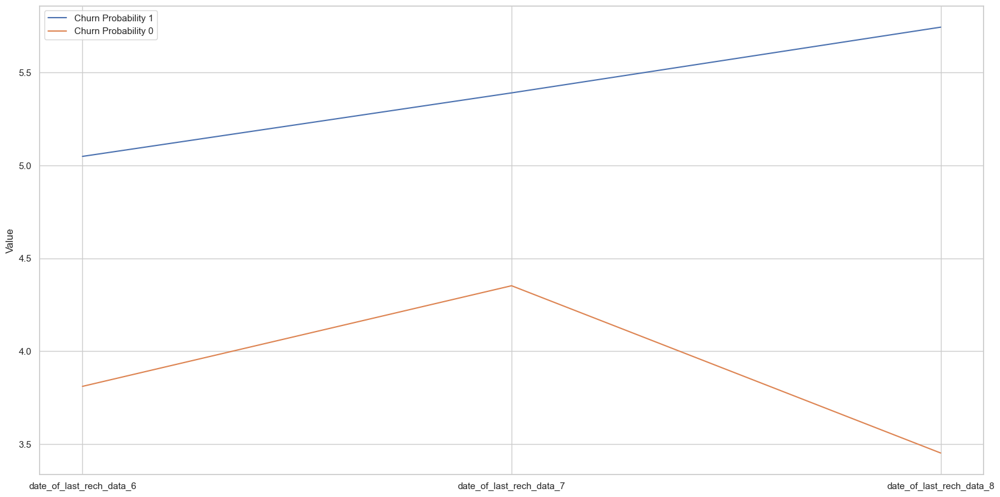

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                          offnet_mou_6         offnet_mou_7  \
churn_probability                                             
0                               351.24               371.53   
1                               471.24               426.11   

                          offnet_mou_8  
churn_probability                       
0                               370.42  
1                               187.38  


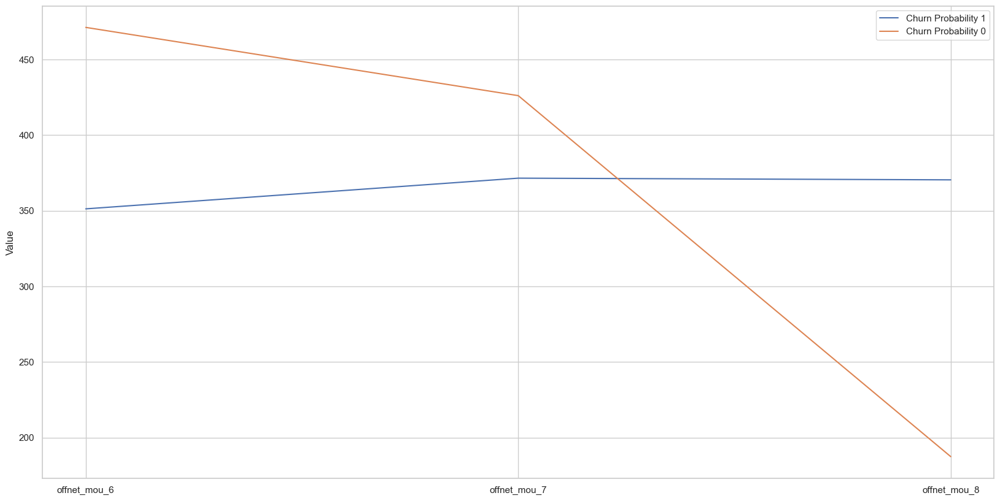

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                          std_og_mou_6         std_og_mou_7  \
churn_probability                                             
0                               308.67               349.81   
1                               631.96               570.28   

                          std_og_mou_8  
churn_probability                       
0                               348.02  
1                               231.28  


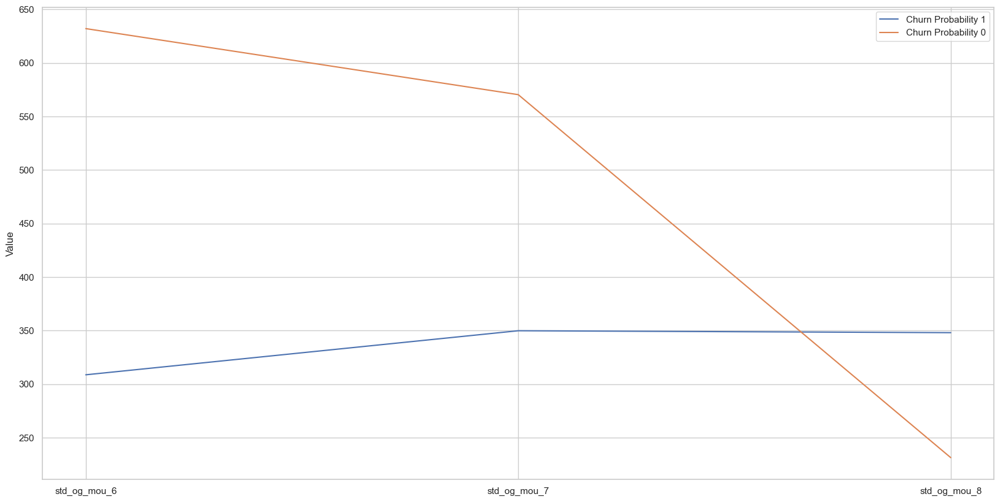

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                          spl_ic_mou_6         spl_ic_mou_7  \
churn_probability                                             
0                                 0.06                 0.02   
1                                 0.06                 0.01   

                          spl_ic_mou_8  
churn_probability                       
0                                 0.03  
1                                 0.00  


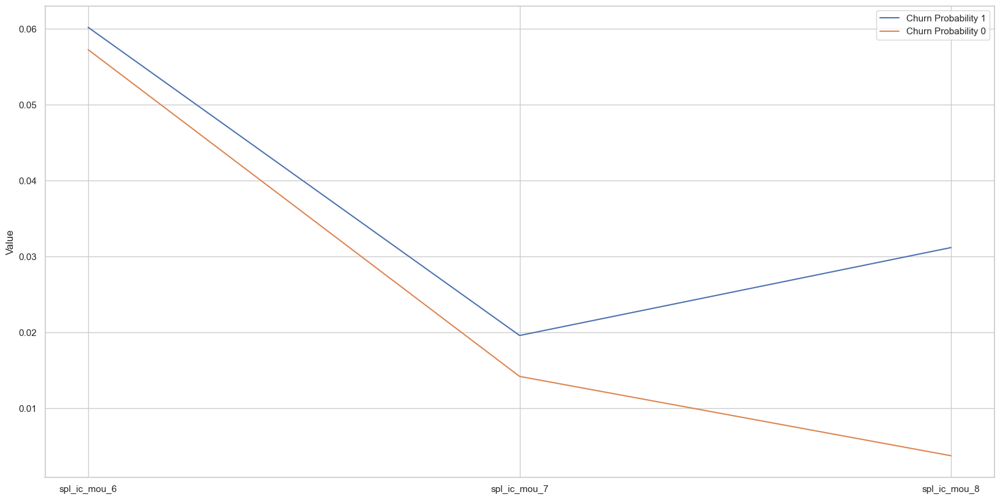

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                           onnet_mou_6          onnet_mou_7  \
churn_probability                                             
0                               239.63               260.51   
1                               396.77               355.59   

                           onnet_mou_8  
churn_probability                       
0                               258.64  
1                               169.76  


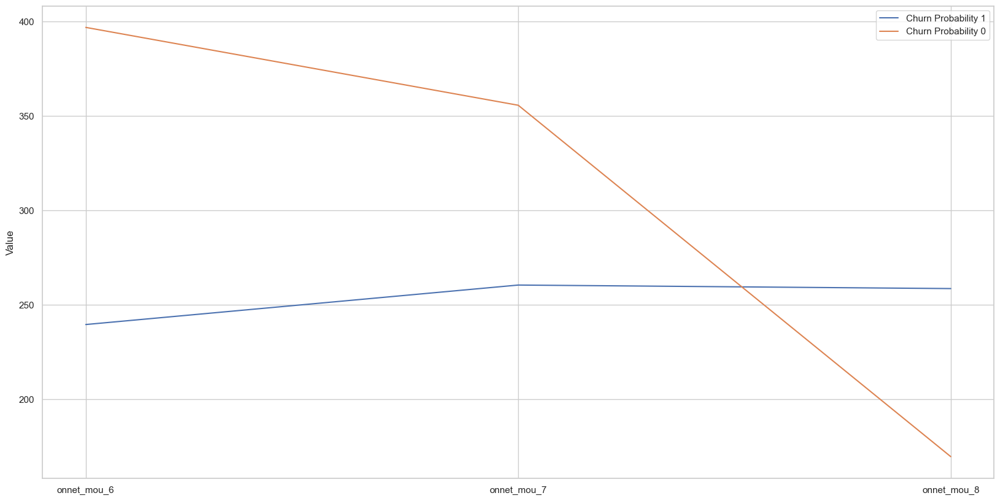

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                          monthly_2g_6         monthly_2g_7  \
churn_probability                                             
0                                 0.18                 0.19   
1                                 0.08                 0.08   

                          monthly_2g_8  
churn_probability                       
0                                 0.19  
1                                 0.04  


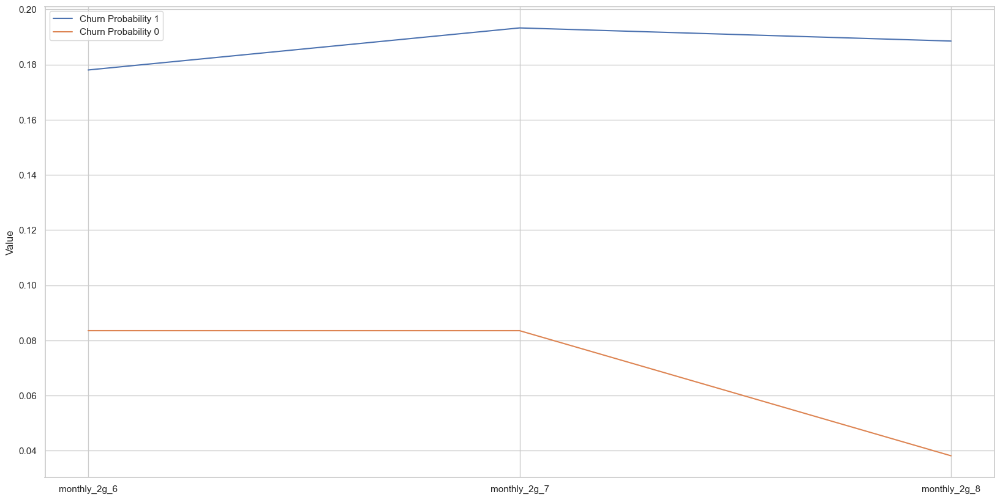

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                                arpu_6               arpu_7  \
churn_probability                                             
0                               527.88               550.99   
1                               700.87               616.04   

                                arpu_8  
churn_probability                       
0                               561.65  
1                               340.15  


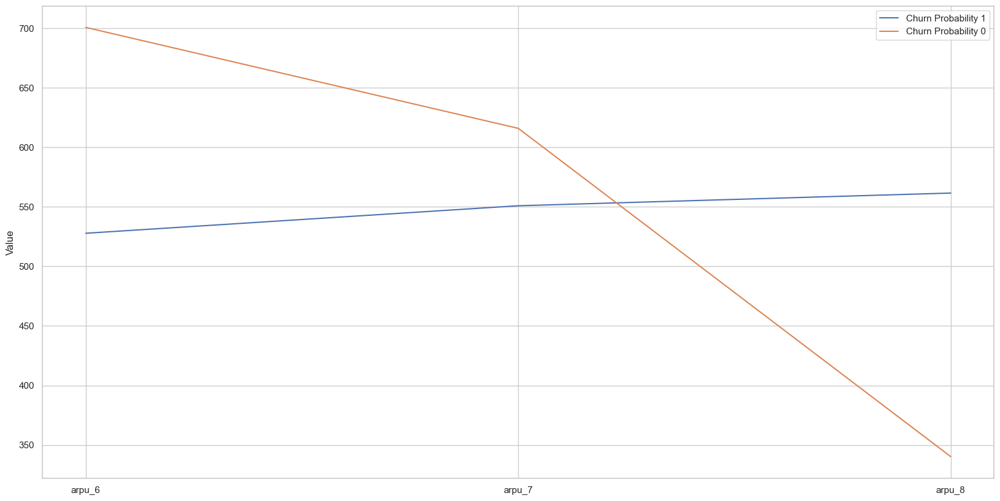

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                      loc_og_t2t_mou_6     loc_og_t2t_mou_7  \
churn_probability                                             
0                                83.57                87.39   
1                                57.28                48.85   

                      loc_og_t2t_mou_8  
churn_probability                       
0                                85.54  
1                                21.55  


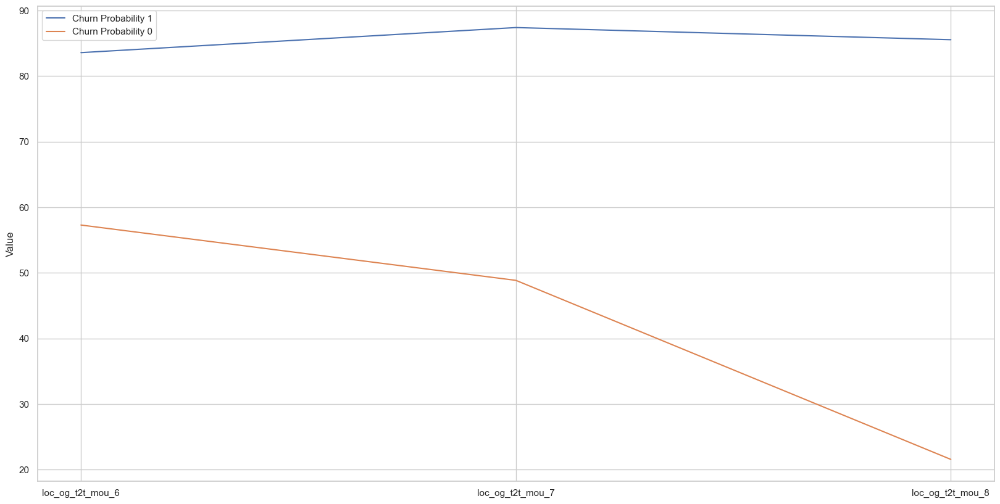

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                      loc_og_t2c_mou_6     loc_og_t2c_mou_7  \
churn_probability                                             
0                                 1.53                 1.82   
1                                 1.69                 2.41   

                      loc_og_t2c_mou_8  
churn_probability                       
0                                 1.89  
1                                 1.20  


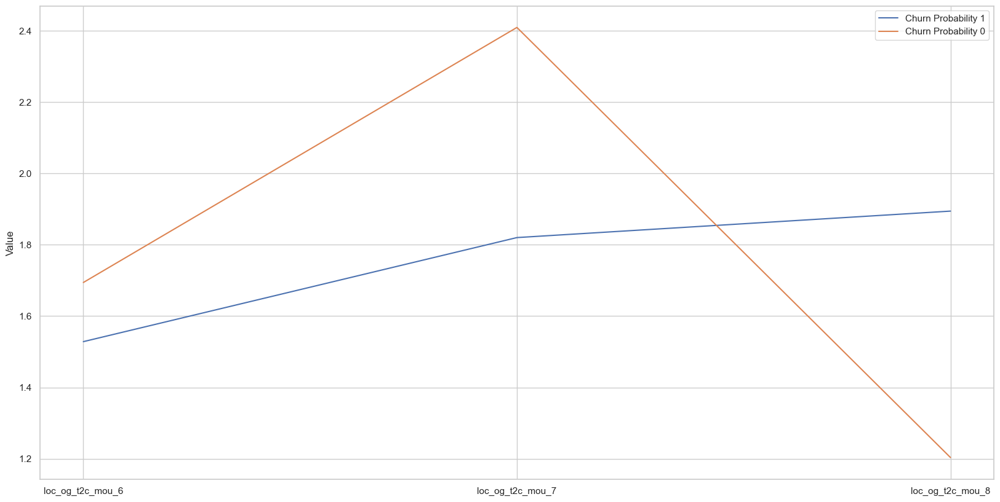

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                       max_rech_data_6      max_rech_data_7  \
churn_probability                                             
0                                76.83                80.50   
1                                72.78                65.25   

                       max_rech_data_8  
churn_probability                       
0                                83.53  
1                                38.60  


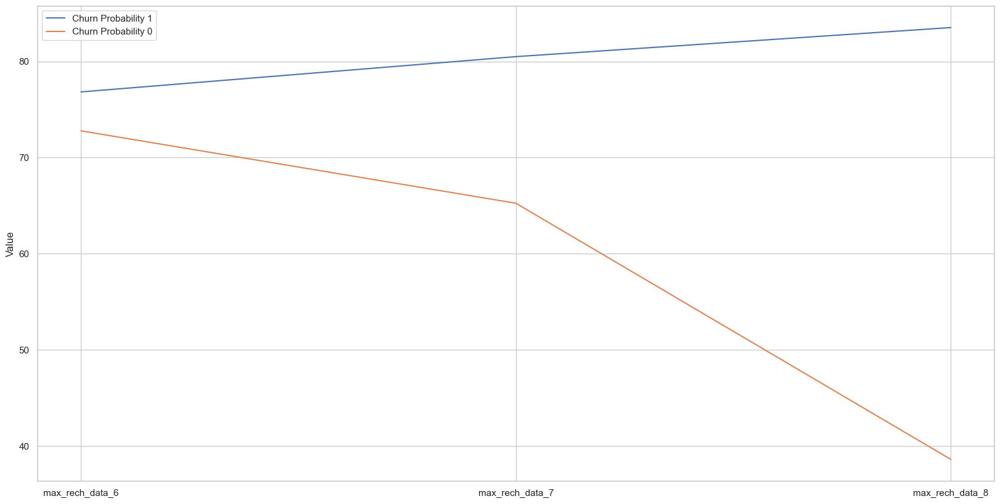

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                          std_ic_mou_6         std_ic_mou_7  \
churn_probability                                             
0                                44.06                47.98   
1                                54.20                47.56   

                          std_ic_mou_8  
churn_probability                       
0                                47.92  
1                                18.70  


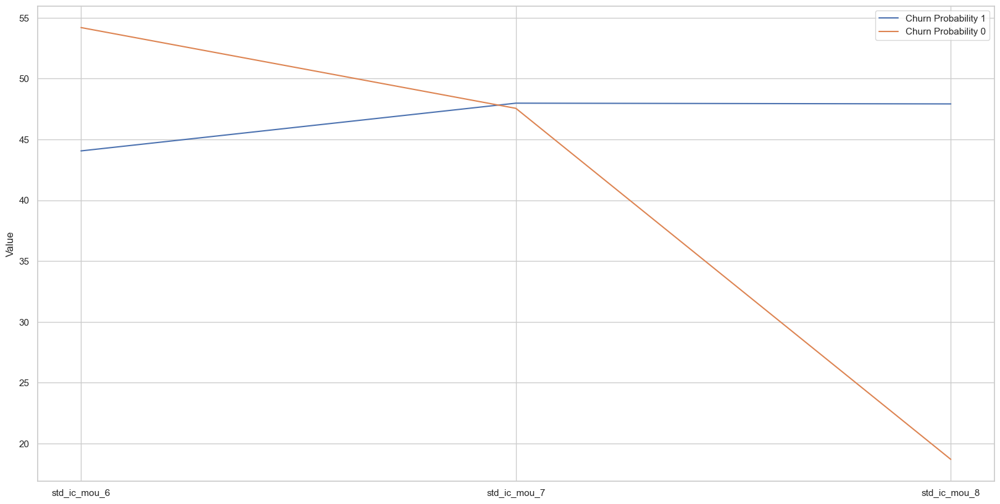

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                      std_ic_t2m_mou_6     std_ic_t2m_mou_7  \
churn_probability                                             
0                                27.80                30.25   
1                                31.57                28.27   

                      std_ic_t2m_mou_8  
churn_probability                       
0                                30.14  
1                                12.19  


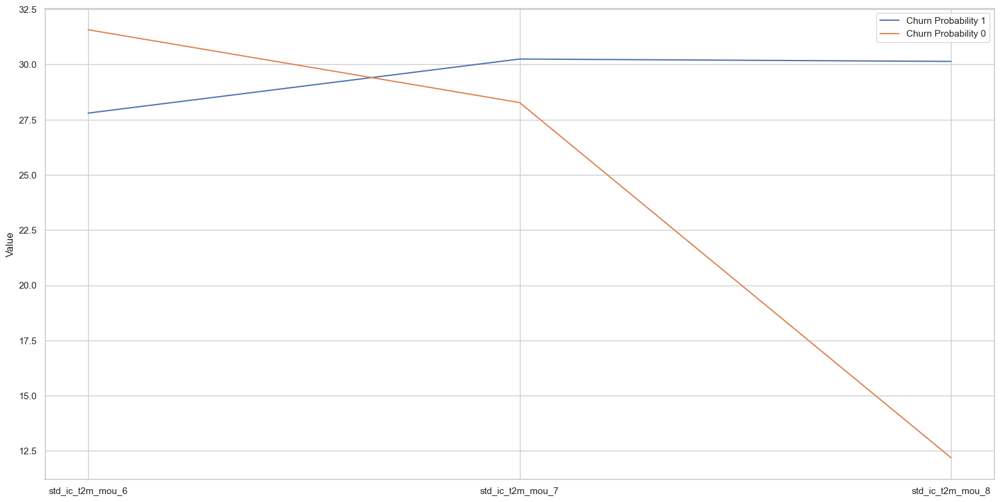

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                          monthly_3g_6         monthly_3g_7  \
churn_probability                                             
0                                 0.21                 0.23   
1                                 0.25                 0.19   

                          monthly_3g_8  
churn_probability                       
0                                 0.24  
1                                 0.11  


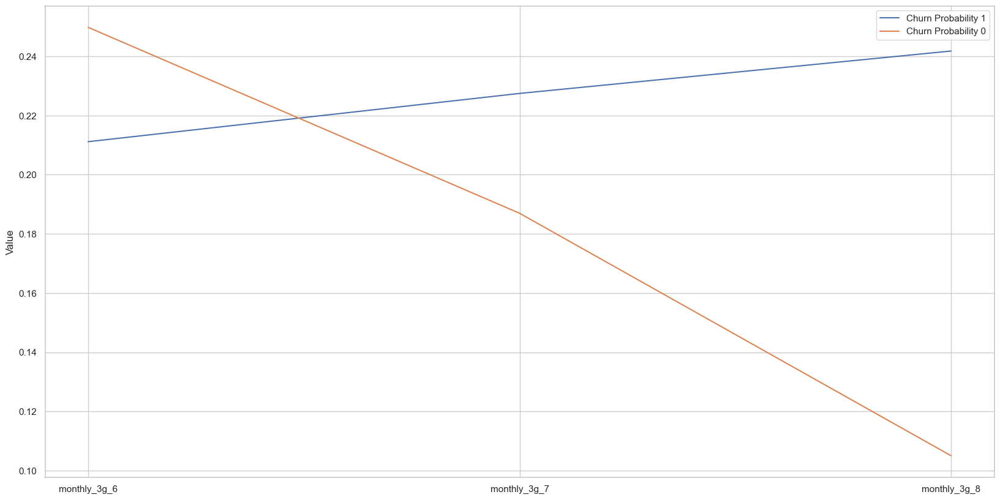

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                           ic_others_6          ic_others_7  \
churn_probability                                             
0                                 1.21                 1.60   
1                                 0.81                 0.79   

                           ic_others_8  
churn_probability                       
0                                 1.36  
1                                 0.54  


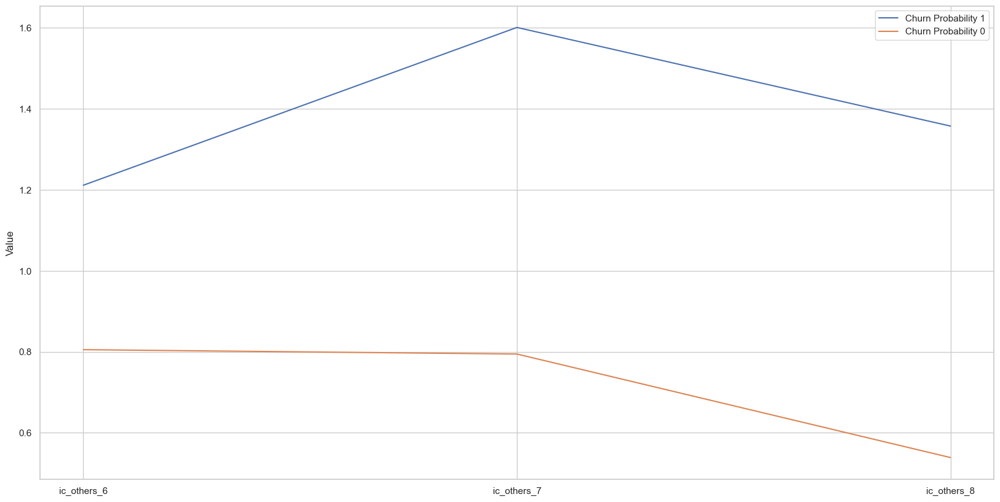

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                           vol_3g_mb_6          vol_3g_mb_7  \
churn_probability                                             
0                               343.45               378.98   
1                               363.74               294.08   

                           vol_3g_mb_8  
churn_probability                       
0                               403.19  
1                               152.06  


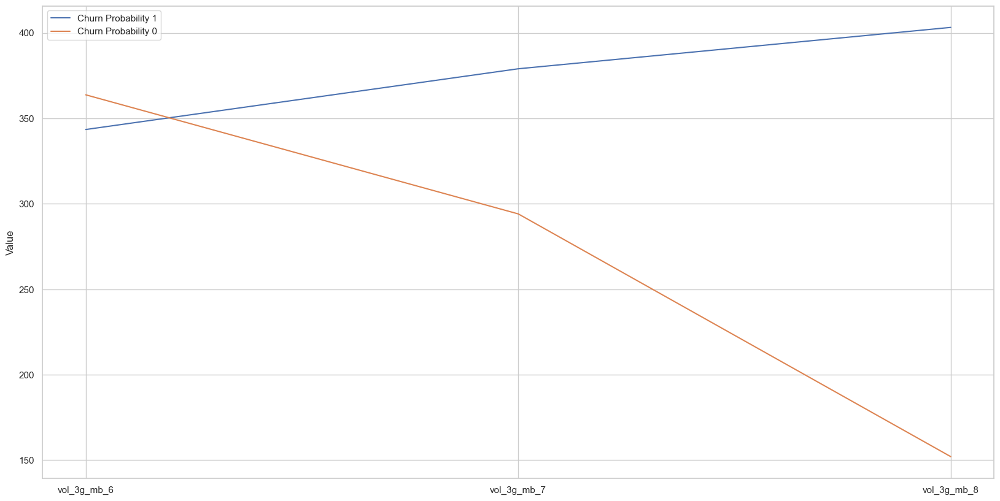

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                           sachet_3g_6          sachet_3g_7  \
churn_probability                                             
0                                 0.20                 0.23   
1                                 0.28                 0.25   

                           sachet_3g_8  
churn_probability                       
0                                 0.25  
1                                 0.09  


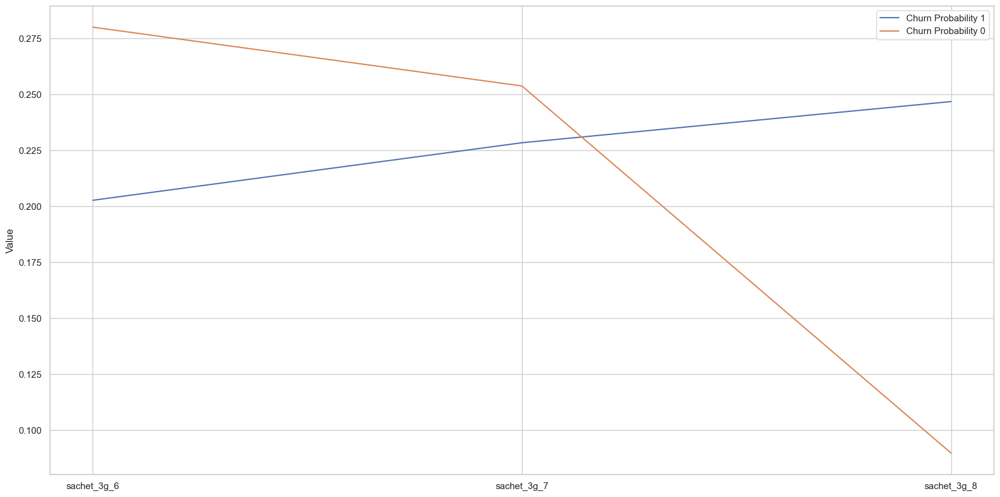

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                    last_day_rch_amt_6   last_day_rch_amt_7  \
churn_probability                                             
0                                96.97                97.80   
1                               117.54                96.09   

                    last_day_rch_amt_8  
churn_probability                       
0                               102.75  
1                                54.29  


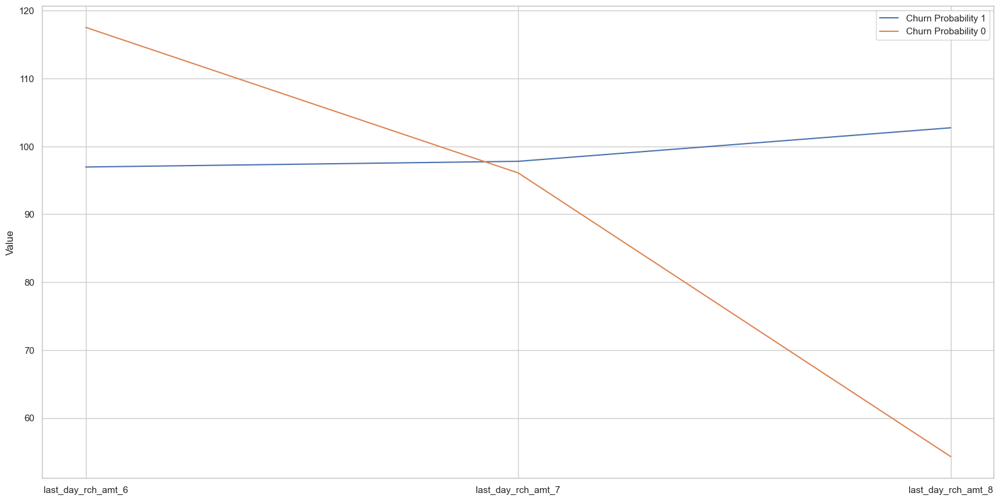

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                      total_rech_num_6     total_rech_num_7  \
churn_probability                                             
0                                11.27                11.66   
1                                13.55                12.19   

                      total_rech_num_8  
churn_probability                       
0                                11.14  
1                                 6.51  


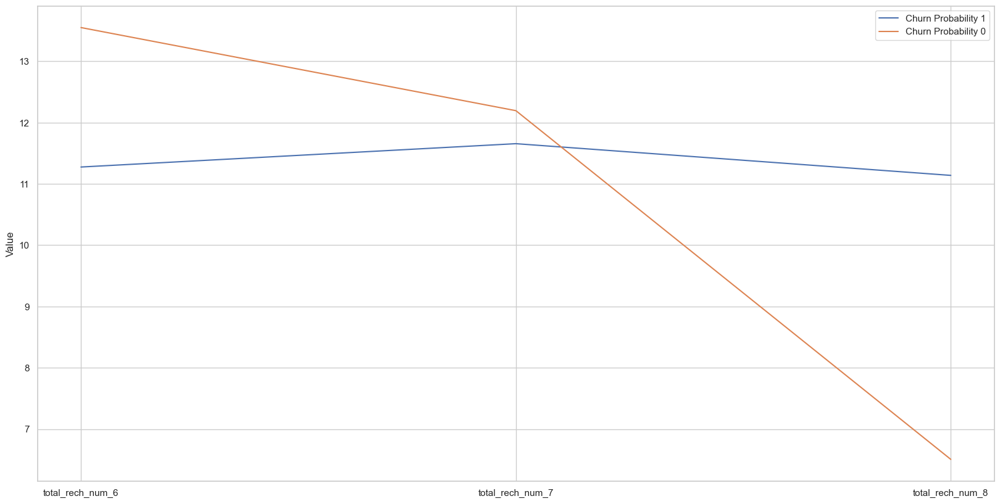

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                      std_og_t2m_mou_6     std_og_t2m_mou_7  \
churn_probability                                             
0                               160.46               181.71   
1                               315.93               286.71   

                      std_og_t2m_mou_8  
churn_probability                       
0                               179.93  
1                               107.44  


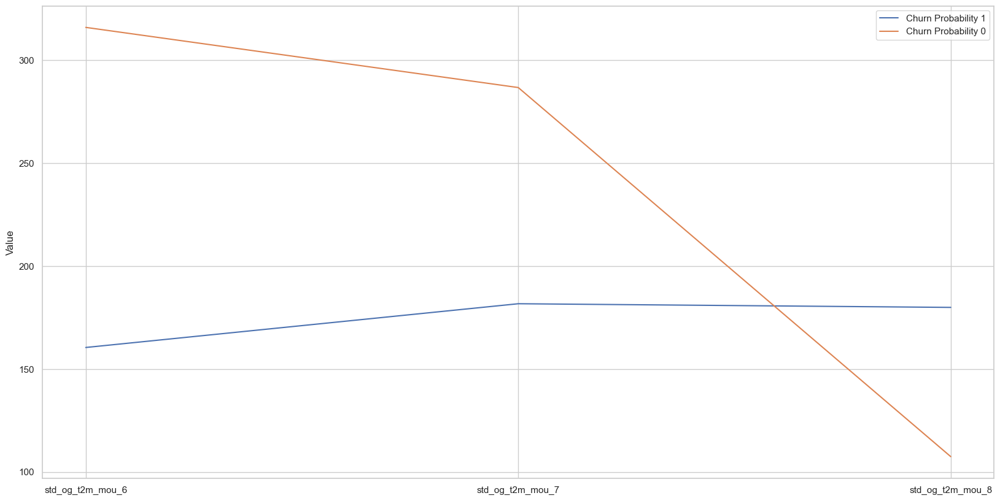

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                      std_og_t2f_mou_6     std_og_t2f_mou_7  \
churn_probability                                             
0                                 1.73                 1.73   
1                                 0.94                 1.12   

                      std_og_t2f_mou_8  
churn_probability                       
0                                 1.71  
1                                 0.42  


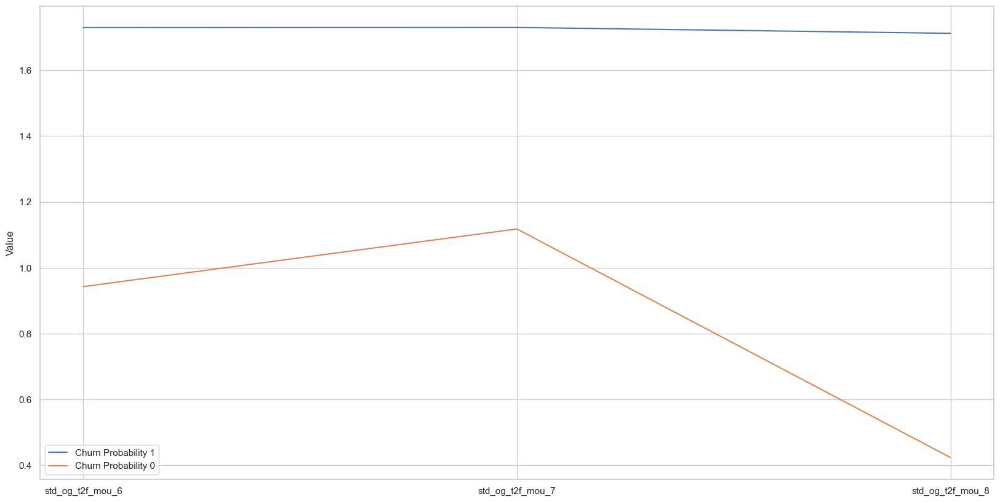

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                      loc_ic_t2t_mou_6     loc_ic_t2t_mou_7  \
churn_probability                                             
0                                64.63                66.89   
1                                42.27                35.63   

                      loc_ic_t2t_mou_8  
churn_probability                       
0                                67.38  
1                                15.72  


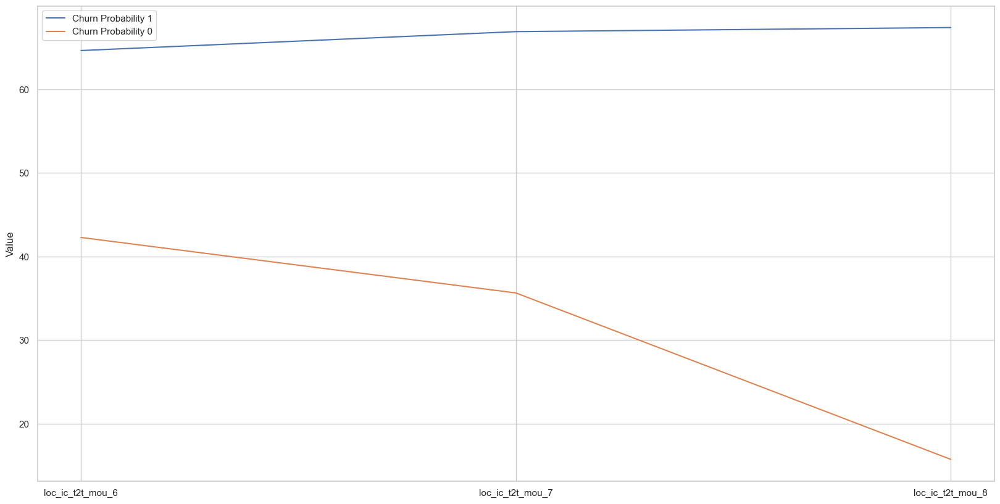

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                     total_rech_data_6    total_rech_data_7  \
churn_probability                                             
0                                 1.62                 1.87   
1                                 1.79                 1.59   

                     total_rech_data_8  
churn_probability                       
0                                 1.96  
1                                 0.64  


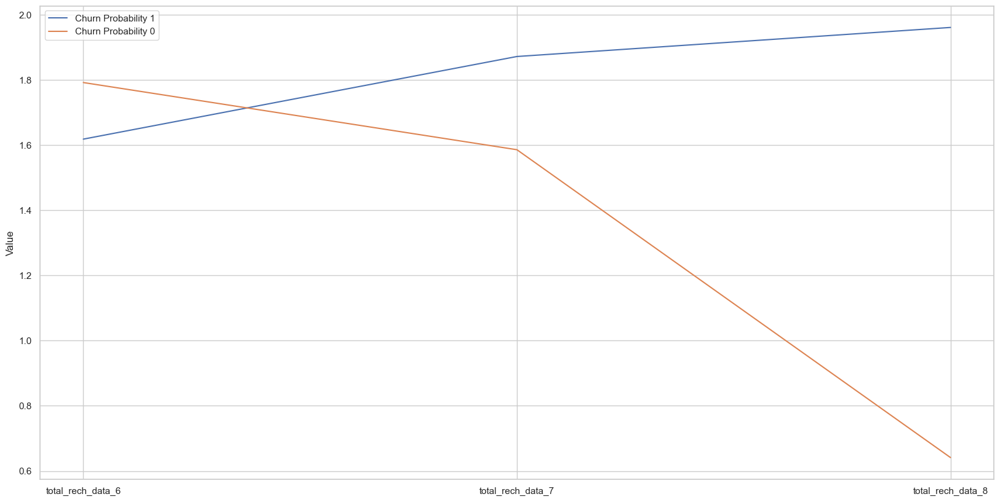

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                        total_og_mou_6       total_og_mou_7  \
churn_probability                                             
0                               568.21               617.23   
1                               814.46               728.68   

                        total_og_mou_8  
churn_probability                       
0                               613.84  
1                               302.54  


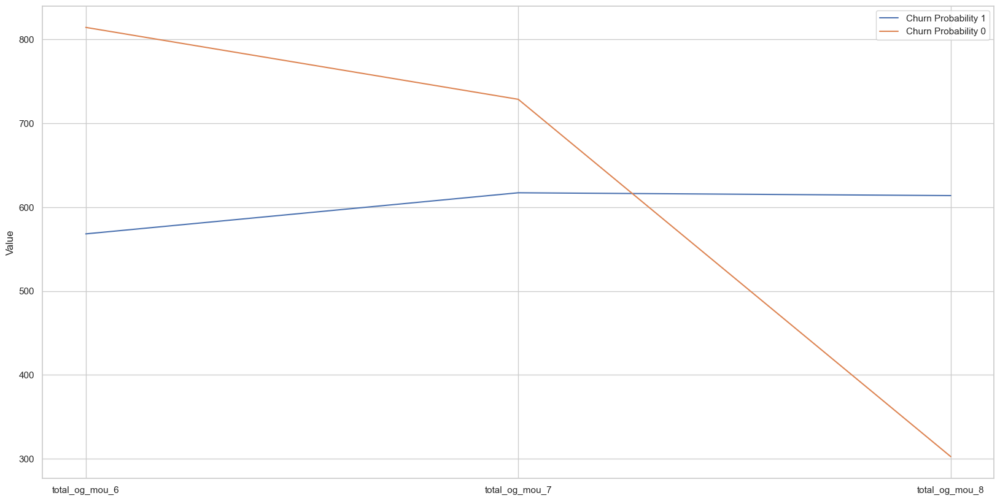

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                      loc_ic_t2f_mou_6     loc_ic_t2f_mou_7  \
churn_probability                                             
0                                15.76                16.82   
1                                 7.90                 7.41   

                      loc_ic_t2f_mou_8  
churn_probability                       
0                                15.68  
1                                 3.36  


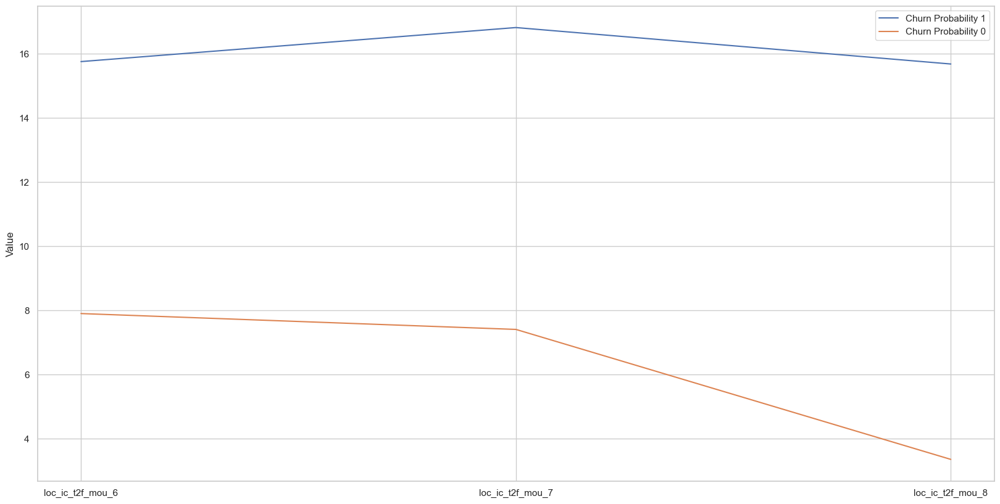

<Figure size 2000x1000 with 0 Axes>

<Axes: ylabel='0'>

<Axes: ylabel='0'>

Text(0, 0.5, 'Value')

                      loc_og_t2f_mou_6     loc_og_t2f_mou_7  \
churn_probability                                             
0                                 6.35                 6.57   
1                                 3.81                 3.49   

                      loc_og_t2f_mou_8  
churn_probability                       
0                                 6.35  
1                                 2.20  


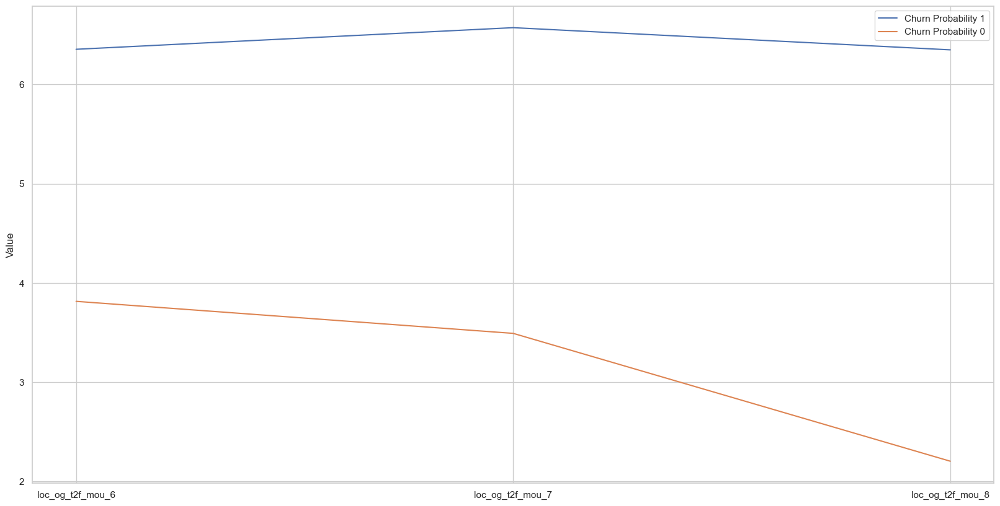

In [41]:
col_group_name = set()
for col in churn_filtered.columns:
    if col[-1] == '6' or col[-1] == '7' or col[-1] == '8':
        col_group_name.add(col[0:-2])
col_group_name

for col in col_group_name:
    df = churn_filtered.groupby('churn_probability')[[col+"_6",col+"_7",col+"_8"]].mean()
    plt.figure(figsize=(20,10))

    sns.lineplot(data=df.iloc[0],legend=True , label='Churn Probability 1')
    sns.lineplot(data=df.iloc[1] , label='Churn Probability 0')
    plt.ylabel("Value")
    print(df)
    plt.show()

In [42]:
def plot_mean_bar_chart(df,columns_list):
    df_0 = df[df.churn_probability==0].filter(columns_list)
    df_1 = df[df.churn_probability==1].filter(columns_list)

    mean_df_0 = pd.DataFrame([df_0.mean()],index=['Non Churn'])
    mean_df_1 = pd.DataFrame([df_1.mean()],index=['Churn'])

    frames = [mean_df_0, mean_df_1]
    mean_bar = pd.concat(frames)

    mean_bar.T.plot.bar(figsize=(10,5),rot=0)
    plt.show()
    
    return mean_bar

['monthly_2g_6',
 'monthly_2g_7',
 'monthly_2g_8',
 'monthly_3g_6',
 'monthly_3g_7',
 'monthly_3g_8']

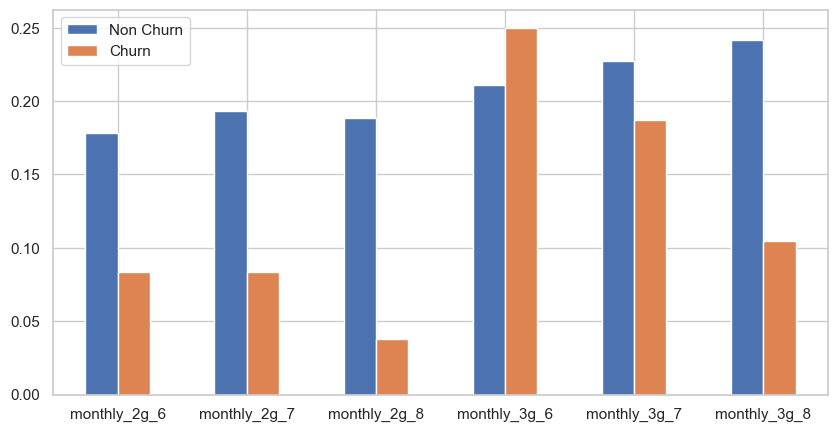

,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8
Non Churn,0.18,0.19,0.19,0.21,0.23,0.24
Churn,0.08,0.08,0.04,0.25,0.19,0.11


In [43]:
# Checking monthly 2G/3G service schemes
month_subscribe_2g_3g=churn_filtered.columns[churn_filtered.columns.str.contains('monthly_2g|monthly_3g',regex=True)]
month_subscribe_2g_3g.tolist()


#Plotting the graph for Telecom High Value Customer and Monthly Subscribtion Data
plot_mean_bar_chart(churn_filtered,month_subscribe_2g_3g)

### Average Revenue Per User

In [44]:
# Checking columns for average revenue per user
arpu_cols = churn_filtered.columns[churn_filtered.columns.str.contains('arpu_')]

# Plotting arpu
#chart_with_and_without_outliers('churn_probability', arpu_cols, churn_filtered)

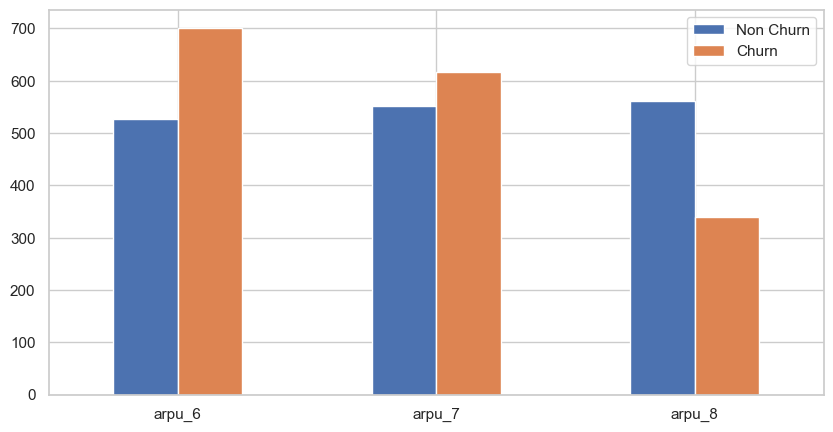

,arpu_6,arpu_7,arpu_8
Non Churn,527.88,550.99,561.65
Churn,700.87,616.04,340.15


In [45]:
plot_mean_bar_chart(churn_filtered, arpu_cols)


### Findings
Bivariate Analysis on Categorical columns for high value customers

* <b>The mean value decreases steaply for churn customers and mean value doesn't change for non churn customers across months - </b><br>offnet_mou, total_rech_num, total_og_mou, std_ic_mou, arpu, onnet_mou, std_ic_t2m_mou, std_og_mou, std_ic_t2t_mou, loc_og_t2t_mou, isd_og_mou, total_rech_amt, loc_ic_mou, std_ic_t2f_mou, total_ic_mou, loc_og_t2m_mou, loc_ic_t2m_mou, vol_2g_mb, std_og_t2m_mou, loc_og_mou, std_og_t2t_mou, last_day_rch_amt


* <b>The mean value lower for churn customers and mean value higher for non churn customers across months -</b><br> loc_og_t2f_mou, ic_others, loc_ic_t2f_mou, monthly_2g, loc_ic_t2t_mou, loc_og_t2t_mou, date_of_last_rech_data, night_pck_user, loc_ic_mou, std_ic_t2f_mou, std_og_t2f_mou, roam_og_mou, roam_ic_mou, total_ic_mou, loc_og_t2m_mou, loc_ic_t2m_mou, loc_og_mou


* <b>The mean value decreases steaply for churn customers and mean value increases for non churn customers across months -</b><br>vol_3g_mb, max_rech_data, fb_user, sachet_2g, monthly_3g, night_pck_user, av_rech_amt_data, max_rech_amt, isd_ic_mou, sachet_3g, total_rech_data 


* <b>The mean value increases steaplly for churn customers and mean value decreases for non churn customers across months -</b><br>vbc_3g

* <b>The mean value increases steaplly for churn customers and mean value doesn't change for non churn customers across months -</b><br>date_of_last_rech

## HeatMap For more insights

<Figure size 2000x1600 with 0 Axes>

Index(['churn_probability', 'std_og_mou_6', 'date_of_last_rech_7',
       'std_og_t2t_mou_6', 'roam_og_mou_7', 'std_og_t2m_mou_6',
       'date_of_last_rech_8', 'roam_og_mou_8', 'roam_ic_mou_7',
       'roam_og_mou_6', 'roam_ic_mou_8', 'onnet_mou_6', 'roam_ic_mou_6',
       'total_og_mou_6', 'total_rech_num_6', 'arpu_6', 'date_of_last_rech_6',
       'total_rech_amt_6', 'offnet_mou_6', 'std_og_t2t_mou_7'],
      dtype='object')

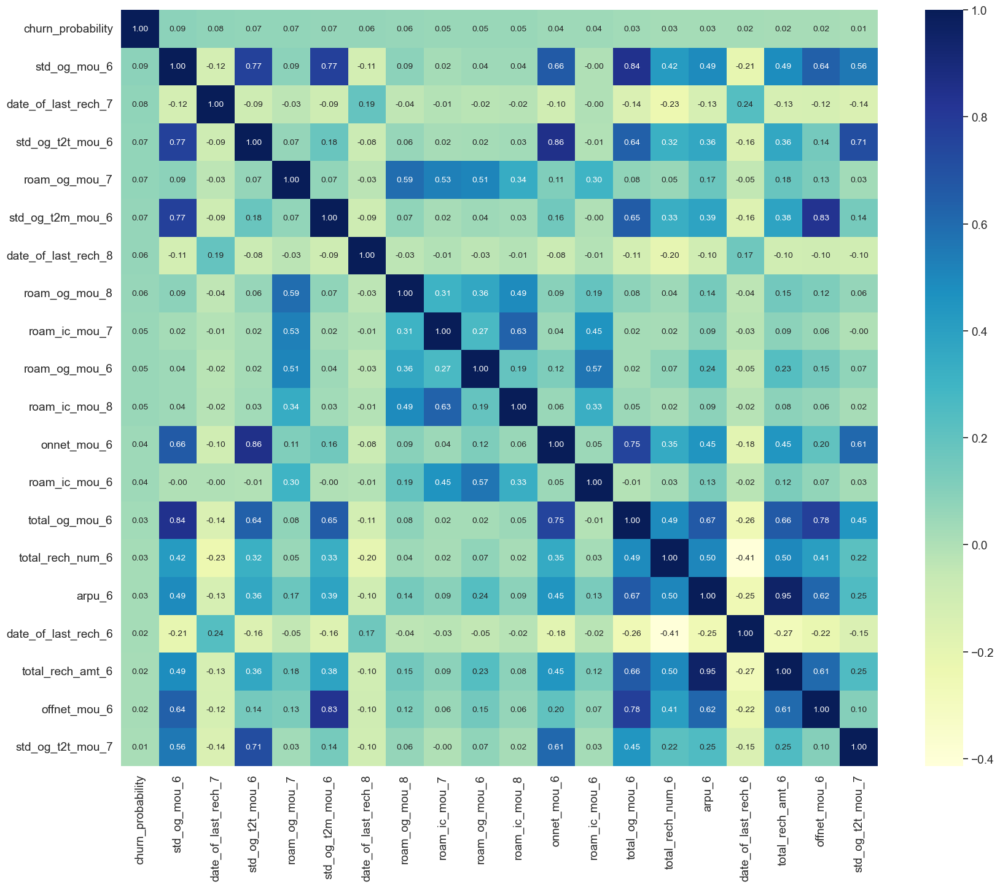

In [46]:
k = 20 #number of variables for heatmap
plt.figure(figsize=(20,16))
nlargest_cols = corrmat.nlargest(k, 'churn_probability')['churn_probability'].index
nlargest_cols
cm = np.corrcoef(data[nlargest_cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cmap="YlGnBu", cbar=True, square=True, fmt='.2f', annot=True, annot_kws={'size': 10}, yticklabels=nlargest_cols.values, xticklabels=nlargest_cols.values)
plt.show()

In [47]:
# create corr matrix
#df_corr_matrix = churn_imputed.corr().abs()

# Select top features from correlation matrix
#top_feat = df_corr_matrix.where(np.triu(np.ones(df_corr_matrix.shape), k=1).astype(bool))
#top_feat
# select one feature from a set with correlation greater than 0.8
#drop_feat = [column for column in top_feat.columns if any(top_feat[column] > 0.8)]
#drop_feat

In [48]:
# drop features from dataframe 
churn_imputed.shape
#churn_imputed.drop(drop_feat, axis=1, inplace=True)

(69999, 141)

In [49]:
churn_imputed.shape

(69999, 141)

In [50]:
churn_rate = (sum(churn_imputed['churn_probability'])/len(churn_imputed['churn_probability'].index))*100
churn_rate

10.188716981671167

In [51]:
churn_imputed.head()

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_6,vbc_3g_7,vbc_3g_8,churn_probability
0,0,31.28,87.01,7.53,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.00,0.00,0.00,0.00,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.00,0.00,0.00,0.00,65.09,204.99,1.01,0.00,0.00,0.00,8.20,0.63,0.00,0.38,0.00,0.00,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.00,0.00,0.00,7.46,27.58,15.18,11.84,53.04,40.56,0.00,0.00,0.66,0.00,0.00,0.00,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,8,21,7,65,65,0,-1,-1,-1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,1958,0.00,0.00,0.00,0
1,1,0.00,122.79,42.95,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,30.73,31.66,0.00,0.00,0.00,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.44,39.44,25.04,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,18,21,5,0,0,0,-1,23,-1,0.00,1.00,0.00,0.00,145.00,0.00,0.00,145.00,0.00,0.00,352.91,0.00,0.00,3.96,0.00,0,0,0,0,0,0,0,1,0,0,0,0,710,0.00,0.00,0.00,0
2,2,60.81,103.18,0.00,0.53,15.93,0.00,53.99,82.05,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.00,0.00,0.00,0.00,28.94,84.99,0.00,0.00,0.00,0.00,2.89,1.38,0.00,0.00,0.00,0.00,56.49,99.36,0.00,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.00,0.00,0.00,29.91,2.48,6.38,124.29,33.83,36.64,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.25,2,4,2,70,120,0,70,70,0,19,9,7,70,50,0,-1,-1,-1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0

Let's look at each variable's datatype:

In [52]:
churn_imputed.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 141 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    id                        int64  
 1    arpu_6                    float64
 2    arpu_7                    float64
 3    arpu_8                    float64
 4    onnet_mou_6               float64
 5    onnet_mou_7               float64
 6    onnet_mou_8               float64
 7    offnet_mou_6              float64
 8    offnet_mou_7              float64
 9    offnet_mou_8              float64
 10   roam_ic_mou_6             float64
 11   roam_ic_mou_7             float64
 12   roam_ic_mou_8             float64
 13   roam_og_mou_6             float64
 14   roam_og_mou_7             float64
 15   roam_og_mou_8             float64
 16   loc_og_t2t_mou_6          float64
 17   loc_og_t2t_mou_7          float64
 18   loc_og_t2t_mou_8          float64
 19   loc_og_t2m_mou_6          float64
 20   loc_

Let's also summarize the features using the df.describe method:

In [53]:
churn_imputed.describe(percentiles=[0.25, 0.5, 0.75, 0.90, 0.95, 0.99], include="all")

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_6,vbc_3g_7,vbc_3g_8,churn_probability
count,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00,69999.00
mean,34999.00,283.13,278.19,278.86,127.89,128.75,125.94,191.01,189.59,186.15,9.38,6.75,6.63,13.63,9.46,9.25,45.05,44.39,43.27,89.55,87.31,86.30,3.60,3.63,3.47,1.08,1.31,1.35,138.20,135.35,133.05,77.43,80.56,79.06,84.67,88.02,85.79,1.08,1.04,1.00,163.18,169.63,165.85,0.81,0.78,0.80,3.80,4.79,4.78,0.44,0.02,0.03,306.45,310.57,304.51,46.14,46.04,44.76,102.92,102.40,102.43,11.57,12.08,11.10,160.64,160.54,158.30,9.10,9.49,9.39,19.91,20.85,19.97,2.06,2.11,1.97,31.08,32.46,31.33,199.71,201.88,198.49,0.06,0.03,0.04,7.10,7.86,7.91,0.82,0.98,0.91,7.57,7.71,7.22,328.14,322.38,323.85,104.57,104.14,107.54,5.76,5.38,5.33,63.43,59.29,62.49,2.

## Create X, y and then Train test split

Lets create X and y datasets and skip "circle_id" since it has only 1 unique value

In [66]:
# Putting feature variable to X
#X = churn_imputed.drop(['churn_probability','id'],axis=1)
X = churn_imputed.drop(['churn_probability'],axis=1)

# Putting response variable to y
y = churn_imputed['churn_probability']

X.shape, y.shape

((69999, 140), (69999,))

In [67]:
X

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_6,vbc_3g_7,vbc_3g_8
0,0,31.28,87.01,7.53,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.00,0.00,0.00,0.00,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.00,0.00,0.00,0.00,65.09,204.99,1.01,0.00,0.00,0.00,8.20,0.63,0.00,0.38,0.00,0.00,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.00,0.00,0.00,7.46,27.58,15.18,11.84,53.04,40.56,0.00,0.00,0.66,0.00,0.00,0.00,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,8,21,7,65,65,0,-1,-1,-1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,1958,0.00,0.00,0.00
1,1,0.00,122.79,42.95,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,30.73,31.66,0.00,0.00,0.00,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.44,39.44,25.04,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,18,21,5,0,0,0,-1,23,-1,0.00,1.00,0.00,0.00,145.00,0.00,0.00,145.00,0.00,0.00,352.91,0.00,0.00,3.96,0.00,0,0,0,0,0,0,0,1,0,0,0,0,710,0.00,0.00,0.00
2,2,60.81,103.18,0.00,0.53,15.93,0.00,53.99,82.05,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.00,0.00,0.00,0.00,28.94,84.99,0.00,0.00,0.00,0.00,2.89,1.38,0.00,0.00,0.00,0.00,56.49,99.36,0.00,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.00,0.00,0.00,29.91,2.48,6.38,124.29,33.83,36.64,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.25,2,4,2,70,120,0,70,70,0,19,9,7,70,50,0,-1,-1,-1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,882

Splitting train and test data to avoid any contamination of the test data

In [68]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((55999, 140), (14000, 140), (55999,), (14000,))

In [69]:
X_train.head()

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_6,vbc_3g_7,vbc_3g_8
47221,47221,13.25,316.65,699.88,7.04,424.08,1448.89,0.00,84.44,121.18,3.73,13.44,0.00,7.04,14.44,0.00,0.00,0.33,1.89,0.00,21.03,11.88,0.00,0.00,0.00,0.00,0.00,0.00,0.00,21.36,13.78,0.00,410.83,1446.99,0.00,62.93,105.76,0.00,0.00,0.00,0.00,473.76,1552.76,0.00,0.00,0.00,0.00,4.78,3.53,0.00,0.00,0.00,0.00,499.91,1570.08,0.00,10.33,2.59,0.00,26.03,24.64,0.00,4.20,0.00,0.00,40.56,27.24,0.00,19.43,1.70,0.00,0.00,0.00,0.00,0.00,0.00,0.00,19.43,1.70,0.00,59.99,29.44,0.00,0.00,0.50,0.00,0.00,0.00,0.00,0.00,0.00,2,16,14,0,376,804,0,110,130,17,5,1,0,110,50,-1,-1,-1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,805,0.00,0.00,0.00
56539,56539,416.06,426.40,451.21,32.83,33.11,40.48,323.03,290.06,336.76,12.38,6.03,1.16,10.34,0.00,0.00,32.38,29.64,40.33,301.68,289.38,334.91,1.66,0.28,0.48,0.00,0.00,0.00,335.73,319.31,375.73,0.45,3.46,0.15,2.41,0.39,0.39,0.00,0.00,0.71,2.86,3.86,1.26,0.00,0.00,0.00,10.46,7.48,7.53,5.56,0.00,0.00,354.63,330.66,384.53,30.09,32.38,55.48,201.59,282.61,277.49,17.08,22.83,18.36,248.78,337.83,351.34,8.96,2.45,3.46,11.13,5.96,6.09,7.08,0.00,13.69,27.18,8.41,23.26,276.48,346.24,374.61,0.29,0.00,0.00,0.00,0.00,0.00,0.21,0.00,0.00,20,19,17,470,490,540,50,50,50,1,0,3,10,0,30,-1,-1,-1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,970,0.00,0.00,0.00
13530,13530,151.44,0.00,256.58,215.14,0.00,188.84,79.48,0.00,180.44,13.53,18.61,6.59,22.19,0.00,3.99,48.21,0.00,58.13,54.93,0.00,125.84,0.00,0.00,0.00,0.00,0.00,0.00,103.14,0.00,183.98,144.73,0.00,127.48,24.54,0.00,50.16,0.00,0.00,0.00,169.28,0.00,177.64,0.00,0.00,0.00,0.00,0.00,6.29,0.00,0.00,0.00,272.43,0.00,367.93,54.04,0.00,152.43,106.09,0.00,225.53,0.00,0.00,0.63,160.14,0.00,378.59,4.70,0.00,0.00,7.56,0.00,6.65,0.00,0.00,0.00,12.26,0.00,6.65,172.68,0.00,385.24,0.26,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4,2,8,150,0,397,120,0,100,6,7,0,0,

In [70]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 55999 entries, 47221 to 28377
Columns: 140 entries, id to vbc_3g_8
dtypes: float64(108), int64(32)
memory usage: 60.2 MB


## Scaling the features using the StandardScaler

Lets also scale the features by scaling them with Standard scaler (few other alternates are min-max scaling and Z-scaling).

In [71]:
cols = X_train.columns

In [72]:
scaler = StandardScaler()

X_train[cols] = scaler.fit_transform(X_train[cols])

In [73]:
X_train

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_6,vbc_3g_7,vbc_3g_8
47221,0.60,-0.80,0.11,1.17,-0.41,0.96,4.32,-0.61,-0.33,-0.20,-0.10,0.12,-0.12,-0.09,0.09,-0.15,-0.30,-0.29,-0.27,-0.56,-0.44,-0.49,-0.28,-0.28,-0.28,-0.20,-0.17,-0.22,-0.56,-0.47,-0.49,-0.31,1.26,5.26,-0.34,-0.10,0.07,-0.13,-0.12,-0.13,-0.42,0.75,3.42,-0.03,-0.03,-0.03,-0.24,0.00,-0.07,-0.09,-0.01,-0.02,-0.66,0.39,2.63,-0.33,-0.25,-0.32,-0.62,-0.47,-0.47,-0.30,-0.19,-0.30,-0.64,-0.48,-0.54,-0.19,0.18,-0.14,-0.27,-0.25,-0.25,-0.13,-0.14,-0.13,-0.32,-0.12,-0.28,-0.69,-0.48,-0.59,-0.36,-0.24,3.53,-0.12,-0.13,-0.13,-0.07,-0.08,-0.08,-0.79,1.17,0.94,-0.81,0.13,1.10,-0.88,0.05,0.18,1.83,-0.06,-0.71,-0.66,0.53,-0.12,-0.45,-0.45,-0.46,-0.35,-0.36,-0.35,-0.41,-0.41,-0.42,-0.38,-0.39,-0.40,-0.24,-0.24,-0.23,-0.22,-0.24,-0.24,-0.27,-0.27,-0.27,-0.26,-0.27,-0.28,-0.21,-0.20,-0.21,-0.14,-0.13,-0.13,-0.43,-0.25,-0.25,-0.23
56539,1.07,0.40,0.42,0.48,-0.32,-0.31,-0.28,0.42,0.31,0.47,0.05,-0.01,-0.10,-0.05,-0.16,-0.15,-0.09,-0.10,-0.02,1.34,1.33,1.65,-0.15,-0.26,-0.24,-0.20,-0.17,-0.22,0.80,0.76,1.00,-0.31,-0.29,-0.30,-0.33,-0.33,-0.32,-0.13,-0.12,-0.04,-0.42,-0.41,-0.41,-0.03,-0.03,-0.03,0.43,0.12,0.16,0.99,-0.01,-0.02,0.10,0.04,0.17,-0.12,-0.10,0.09,0.59,1.10,1.05,0.15,0.26,0.20,0.35,0.71,0.79,-0.00,-0.13,-0.11,-0.12,-0.18,-0.17,0.32,-0.14,0.76,-0.04,-0.22,-0.07,0.27,0.49,0.62,1.40,-0.24,-0.29,-0.12,-0.13,-0.13,-0.05,-0.08,-0.08,1.76,1.60,1.36,0.35,0.40,0.49,-0.46,-0.45,-0.46,-0.78,-0.93,-0.38,-0.55,-0.62,-0.32,-0.45,-0.45,-0.46,-0.35,-0.36,-0.35,-0.41,-0.41,-0.42,-0.38,-0.39,-0.40,-0.24,-0.24,-0.23,-0.22,-0.24,-0.24,-0.27,-0.27,-0.27,-0.26,-0.27,-0.28,-0.21,-0.20,-0.21,-0.14,-0.13,-0.13,-0.26,-0.25,-0.25,-0.23
13530,-1.06,-0.39,-0.79,-0.06,0.29,-0.42,0.21,-0.36,-0.59,-0.02,0.07,0.22,-0.00,0.12,-0.16,-0.08,0.02,-0.30,0.10,-0.22,-0.57,0.26,-0.28,-0.28,-0.28,-0.20,-0.17,-0.22,-0.14,-0.56,0.21,0.27,-0.31,0.19,-0.24,-0.33,-0.14,-0.13,-0.12,-0.13,0.01,-0.42,0.03,-0.03,-0.03,-0.03,-0.24,-0.21,0.09,-0.09,-0.01,-0.02,

In [74]:
X_test[cols] = scaler.transform(X_test[cols])

In [75]:
X_test

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_6,vbc_3g_7,vbc_3g_8
19981,-0.74,1.24,0.73,-0.77,-0.38,-0.40,-0.41,3.46,1.95,-0.58,-0.16,-0.12,-0.12,-0.19,-0.16,-0.15,-0.26,-0.25,-0.28,1.79,0.77,-0.57,-0.28,-0.28,-0.28,-0.20,-0.17,-0.22,0.98,0.31,-0.55,-0.27,-0.31,-0.30,3.22,1.98,-0.32,-0.13,-0.12,-0.13,1.92,1.09,-0.41,-0.03,-0.03,-0.03,0.08,-0.21,-0.28,-0.09,-0.01,-0.02,2.11,1.06,-0.64,-0.31,-0.30,-0.34,-0.04,0.13,-0.62,-0.30,-0.25,-0.30,-0.24,-0.12,-0.65,-0.19,-0.17,-0.18,-0.24,-0.15,-0.25,-0.13,-0.14,-0.13,-0.30,-0.22,-0.30,-0.34,-0.22,-0.70,4.07,-0.24,-0.29,-0.12,-0.13,-0.13,-0.07,-0.08,-0.08,1.76,2.31,-1.01,1.06,0.70,-0.74,0.81,-0.31,-0.86,-0.61,-0.58,-1.03,-0.14,-0.52,-0.61,-0.45,-0.45,-0.46,-0.35,-0.36,-0.35,-0.41,-0.41,-0.42,-0.38,-0.39,-0.40,-0.24,-0.24,-0.23,-0.22,-0.24,-0.24,-0.27,-0.27,-0.27,-0.26,-0.27,-0.28,-0.21,-0.20,-0.21,-0.14,-0.13,-0.13,-0.77,-0.25,-0.25,-0.23
35566,0.03,0.29,0.43,0.32,-0.05,0.04,0.10,0.61,1.23,1.11,1.46,-0.12,-0.12,1.35,-0.16,-0.15,0.19,0.50,0.23,0.67,2.16,2.52,-0.23,0.00,-0.28,-0.09,-0.15,-0.22,0.53,1.66,1.70,-0.19,-0.22,-0.01,-0.01,0.29,-0.04,-0.13,-0.12,-0.13,-0.13,0.04,-0.03,-0.03,-0.03,-0.03,-0.17,-0.21,-0.22,-0.09,-0.01,-0.02,0.16,0.86,0.82,0.25,0.06,0.19,0.80,1.74,2.41,-0.30,0.19,-0.29,0.62,1.21,1.71,-0.05,-0.14,-0.16,0.86,0.44,0.42,-0.10,0.09,-0.13,0.61,0.27,0.22,0.72,1.10,1.51,-0.36,-0.24,-0.29,-0.12,-0.13,-0.13,-0.07,-0.08,-0.08,0.63,0.61,0.38,0.23,0.44,0.30,0.05,0.05,0.18,-0.29,-0.41,-0.05,-0.66,-0.62,0.66,0.30,0.12,0.51,1.91,2.73,1.65,-0.11,-0.12,-0.13,0.34,0.65,0.30,-0.24,-0.24,0.04,-0.22,-0.24,-0.24,-0.27,-0.27,-0.27,2.40,3.38,2.17,-0.21,-0.20,-0.21,-0.14,-0.13,-0.13,1.37,-0.25,-0.25,-0.23
15645,-0.96,0.06,-0.09,0.15,-0.36,-0.39,-0.41,-0.28,-0.18,-0.32,-0.16,-0.12,0.58,-0.19,-0.16,0.11,-0.15,-0.25,-0.28,-0.16,-0.03,-0.30,1.53,2.46,-0.10,0.20,-0.17,-0.22,-0.11,-0.05,-0.37,-0.31,-0.31,-0.30,-0.34,-0.31,-0.32,0.28,0.28,2.20,-0.42,-0.40,-0.37,0.04,-0.01,-0.03,0.39,0.25,0.33,0.41,-0.01,-0.02,-0.38,-0.35,-0.49,0.14,0.

### Handling imabalance in the dataset

#### Using SMOTE to balance the dataset

In [76]:
# using SMOTE to handle class imbalance
counter = Counter(y_train)
print('Before',counter)
# oversampling the train dataset using SMOTE
smt = SMOTETomek(random_state=42)
X_train, y_train = smt.fit_resample(X_train, y_train)

counter = Counter(y_train)
print('After',counter)

Before Counter({0: 50289, 1: 5710})
After Counter({0: 50279, 1: 50279})


## Building Models

In [77]:
#methods to calculate metrics
def calculate_metrics(actual,predicted):
    accuracy = round (metrics.accuracy_score(actual,predicted), 2)
    recall = round(metrics.recall_score(actual,predicted), 2)
    f1 = round(metrics.f1_score(actual,predicted),2)
    precision = round(precision_score(actual,predicted),2)
    print("Accuracy score :", accuracy)
    print("Recall score :", recall)
    print("F1 score :", f1)
    #print("Confusion matrix : ")
    confusion_matrix = metrics.confusion_matrix(actual,predicted)
    #print(confusion_matrix)
    TP = confusion_matrix[1,1] # true positive 
    TN = confusion_matrix[0,0] # true negatives
    FP = confusion_matrix[0,1] # false positives
    FN = confusion_matrix[1,0] # false negatives
    return confusion_matrix, accuracy, precision, recall, f1
    
def calculate_metrics_prob(actual,predicted_prob):
    auc = metrics.roc_auc_score(actual,predicted_prob)
    print("AUC score :",auc)
    return auc

def plot_confusion_matrix(cm):
    """
    This function prints and plots the confusion matrix.
    """
    classes=[0,1]
    cmap=plt.cm.Blues
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title('Confusion matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=0)
    plt.yticks(tick_marks, classes)
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

def plot_roc_curve(y_test, y_pred):
    # Plotting AUC curve
    logit_roc_auc = metrics.roc_auc_score(y_test, y_pred)
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred, drop_intermediate =True)
    plt.figure(figsize=(8,8))
    plt.plot(fpr, tpr, label='Default(area = %0.2f)' % logit_roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('FPR -False Positive Rate')
    plt.ylabel('TPR - True Positive Rate')
    plt.title('Receiver operating characteristic (ROC curve)')
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.show()

    print("Area under curve is:", round(metrics.roc_auc_score(y_test, y_pred),2))
    print("Recall for our model is:" , round(metrics.recall_score(y_test, y_pred),2))
    print("Accuracy on test set is:" , round(metrics.accuracy_score(y_test, y_pred),2))
    print("Confusion matrix for our model is:" , metrics.confusion_matrix(y_test, y_pred))
    
#common method to predict on train and test data
def predict(model_name, model,X_train,X_test,y_train,y_test):
    print("MODEL REPORT :")
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    y_pred_prob_train = model.predict_proba(X_train)[:,1]
    y_pred_prob_test = model.predict_proba(X_test)[:,1]
    
    print("TRAIN METRICS")
    cp_train, _, _, _, _ = calculate_metrics(y_train, y_pred_train)
    _ = calculate_metrics_prob(y_train, y_pred_prob_train)
    plot_confusion_matrix(cp_train)
    plt.show()
    print("TEST METRICS")
    cp_test, accuracy, precision, recall, f1 = calculate_metrics(y_test, y_pred_test)
    auc = calculate_metrics_prob(y_test, y_pred_prob_test)
    plot_confusion_matrix(cp_test)
    plt.show()
    
    print("TRAIN PLOTS")
    plot_roc_curve(y_train, y_pred_train)
    print("TEST PLOTS")
    plot_roc_curve(y_test, y_pred_test)
    
    if (len(model_name) > 0) :
        data = [[model_name, accuracy, precision, recall,  auc, f1]] 
        df = pd.DataFrame(data, columns = ['Model', 'Accuracy','Precision','Recall','AUC','F1'])
        add_to_global_summary(df)

### We can look at recall metric to see the correct number of churn customers and accuracy for the overall performance¶

## Logistic Regression (1st Model)


In [78]:
# Logistic regression model

logreg = LogisticRegression(class_weight='balanced')
logreg = logreg.fit(X_train,y_train)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.84
Recall score : 0.88
F1 score : 0.85
AUC score : 0.9126363105648756


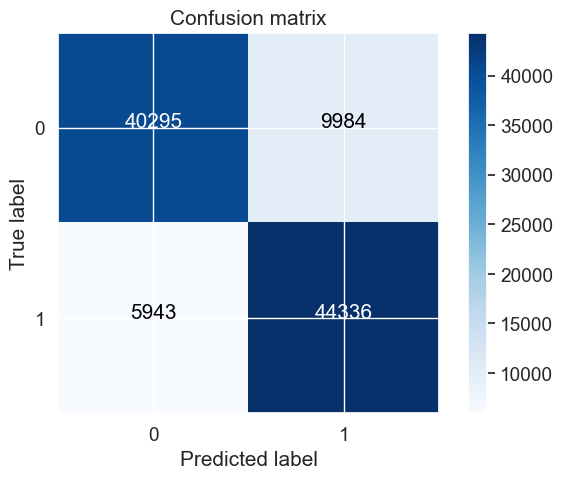

TEST METRICS
Accuracy score : 0.81
Recall score : 0.86
F1 score : 0.47
AUC score : 0.8969020652898069


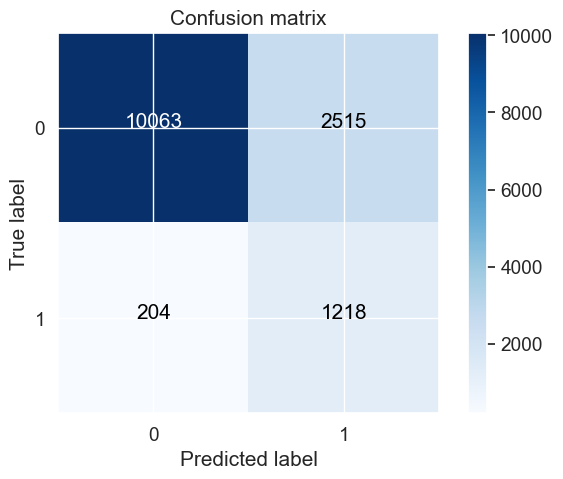

TRAIN PLOTS


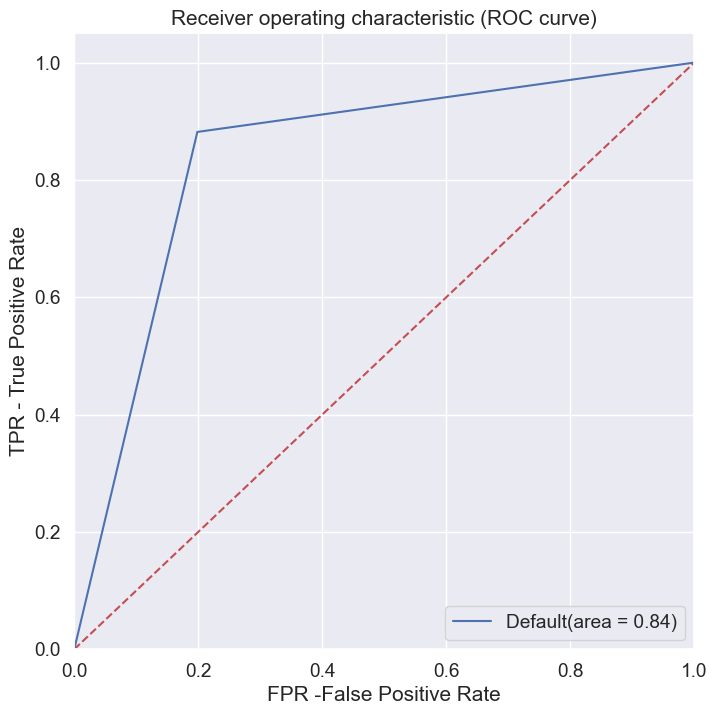

Area under curve is: 0.84
Recall for our model is: 0.88
Accuracy on test set is: 0.84
Confusion matrix for our model is: [[40295  9984]
 [ 5943 44336]]
TEST PLOTS


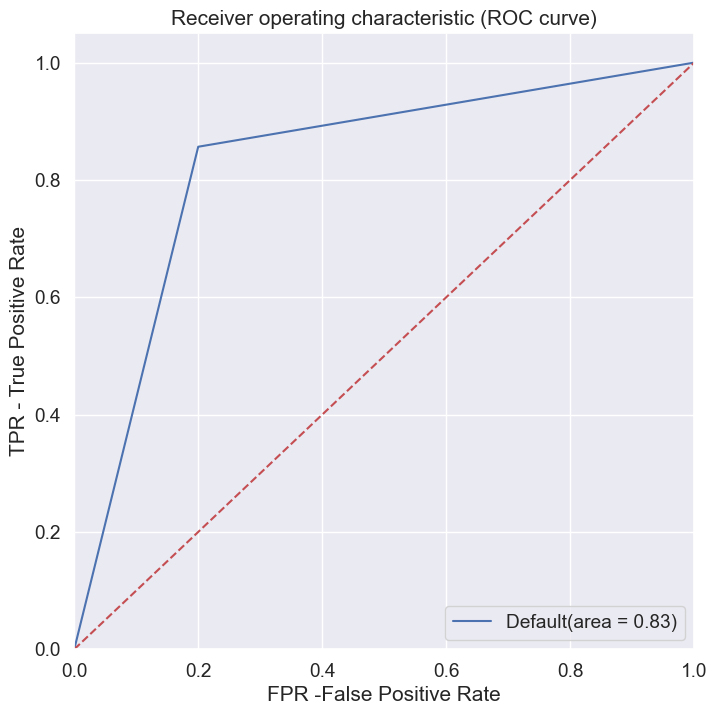

Area under curve is: 0.83
Recall for our model is: 0.86
Accuracy on test set is: 0.81
Confusion matrix for our model is: [[10063  2515]
 [  204  1218]]


In [79]:
predict("", logreg,X_train,X_test,y_train,y_test)

## RFE + Logistic Regression (2nd Model)

In [80]:
#rfelogreg = LogisticRegression(class_weight='balanced')

#rfe = RFE(rfelogreg, n_features_to_select= 15)             # running RFE with 30 variables as output
#rfe = rfe.fit(X_train, y_train)

#col_top15 = X_train.columns[rfe.support_]

#col_top15

In [81]:
#col_top15 = ['arpu_6', 'offnet_mou_8', 'roam_og_mou_8', 'loc_og_t2t_mou_8',
#       'std_og_t2m_mou_8', 'og_others_8', 'loc_ic_t2m_mou_8',
#       'loc_ic_t2f_mou_8', 'loc_ic_mou_8', 'total_ic_mou_7', 'total_ic_mou_8',
#       'spl_ic_mou_8', 'total_rech_num_8', 'last_day_rch_amt_8', 'fb_user_8']

col_top15 = ['arpu_6', 'offnet_mou_8', 'roam_og_mou_8', 'loc_og_t2t_mou_8',
       'std_og_t2m_mou_8', 'og_others_8', 'loc_ic_t2m_mou_8',
       'loc_ic_t2f_mou_8', 'loc_ic_mou_8', 'total_ic_mou_7', 'total_ic_mou_8',
       'spl_ic_mou_8', 'total_rech_num_8', 'last_day_rch_amt_8']

In [82]:
# Logistic regression model
logreg_top15 = LogisticRegression(class_weight='balanced')
logreg_top15 = logreg_top15.fit(X_train[col_top15],y_train)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.83
Recall score : 0.88
F1 score : 0.83
AUC score : 0.903977865999024


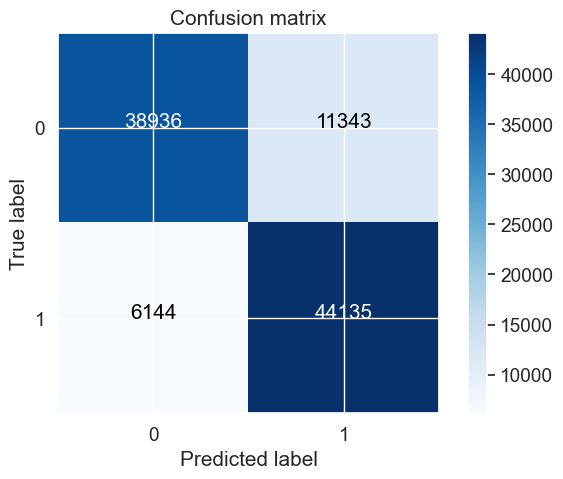

TEST METRICS
Accuracy score : 0.78
Recall score : 0.86
F1 score : 0.45
AUC score : 0.8942696588757322


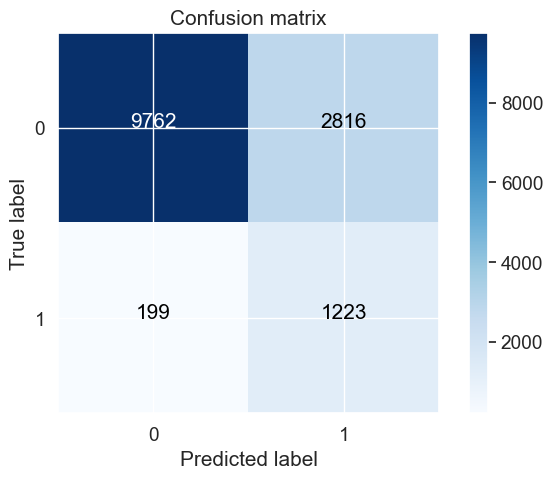

TRAIN PLOTS


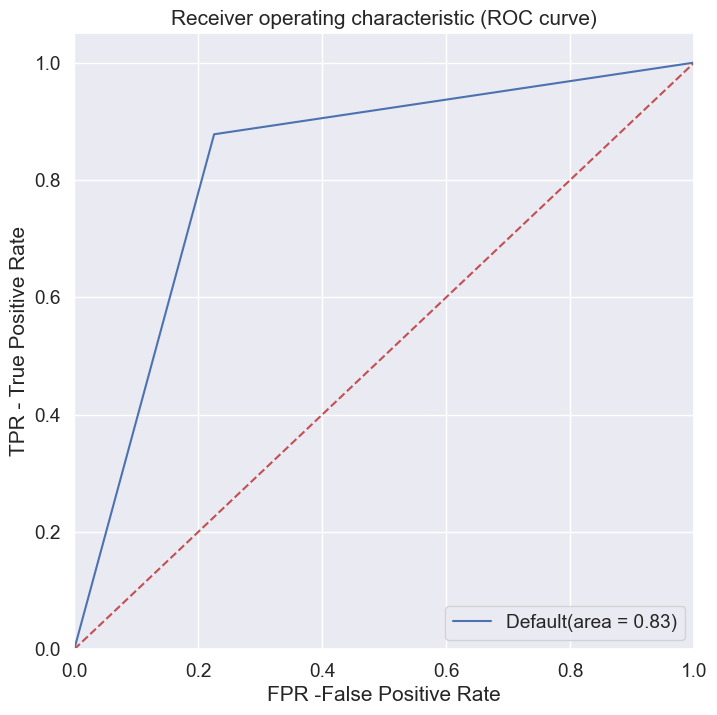

Area under curve is: 0.83
Recall for our model is: 0.88
Accuracy on test set is: 0.83
Confusion matrix for our model is: [[38936 11343]
 [ 6144 44135]]
TEST PLOTS


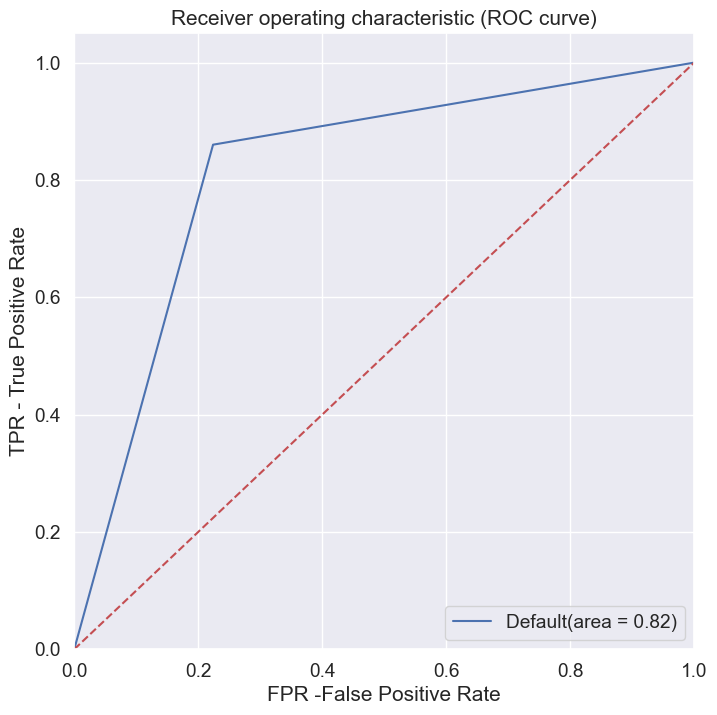

Area under curve is: 0.82
Recall for our model is: 0.86
Accuracy on test set is: 0.78
Confusion matrix for our model is: [[9762 2816]
 [ 199 1223]]


In [83]:
predict("", logreg_top15,X_train[col_top15],X_test[col_top15],y_train,y_test)

## RFE + Logistic Regression + Manual Threshold Tunning (3rd Model)

In [84]:
y_train_pred_df = pd.DataFrame()

In [85]:
logreg_top15.predict_proba(X_train[col_top15])

array([[0.98705096, 0.01294904],
       [0.99710069, 0.00289931],
       [0.99546426, 0.00453574],
       ...,
       [0.01756283, 0.98243717],
       [0.22778587, 0.77221413],
       [0.12147055, 0.87852945]])

In [86]:
y_train_pred_df["y_train"] = y_train
y_train_pred_df["y_pred_train"] = logreg_top15.predict(X_train[col_top15])
y_train_pred_df["y_prob_train"] = logreg_top15.predict_proba(X_train[col_top15])[:,1]

# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.y_prob_train.map(lambda x: 1 if x > i else 0)

In [87]:
y_train_pred_df.head()

,y_train,y_pred_train,y_prob_train,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0,0.01,1,0,0,0,0,0,0,0,0,0
1,0,0,0.00,1,0,0,0,0,0,0,0,0,0
2,0,0,0.00,1,0,0,0,0,0,0,0,0,0
3,1,0,0.00,1,0,0,0,0,0,0,0,0,0
4,0,1,0.65,1,1,1,1,1,1,1,0,0,0


In [88]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame(columns = ['prob','accuracy','sensi','speci'])
# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_df.y_train, y_train_pred_df[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

                     prob             accuracy                sensi  \
0.00                 0.00                 0.50                 1.00   
0.10                 0.10                 0.69                 0.97   
0.20                 0.20                 0.74                 0.95   
0.30                 0.30                 0.77                 0.93   
0.40                 0.40                 0.80                 0.91   
0.50                 0.50                 0.83                 0.88   
0.60                 0.60                 0.84                 0.84   
0.70                 0.70                 0.84                 0.77   
0.80                 0.80                 0.75                 0.54   
0.90                 0.90                 0.53                 0.07   

                    speci  
0.00                 0.00  
0.10                 0.41  
0.20                 0.52  
0.30                 0.62  
0.40                 0.70  
0.50                 0.77  
0.60                 0

<Axes: xlabel='prob'>

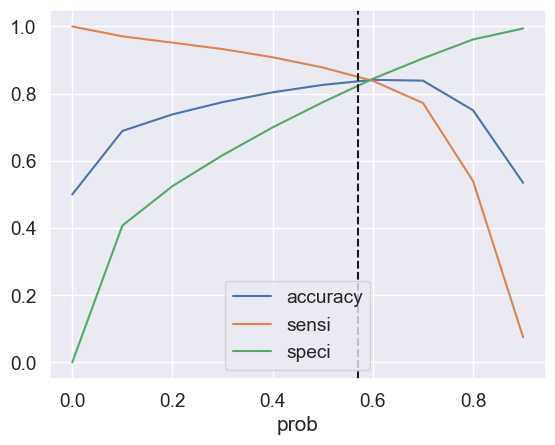

In [89]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.axvline(x = 0.57, color='k', linestyle='--')
plt.show()

In [90]:
y_train_pred_df['final_predicted'] = y_train_pred_df.y_prob_train.map(lambda x: 1 if x > 0.6 else 0)
y_train_pred_df.head()

,y_train,y_pred_train,y_prob_train,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0,0.01,1,0,0,0,0,0,0,0,0,0,0
1,0,0,0.00,1,0,0,0,0,0,0,0,0,0,0
2,0,0,0.00,1,0,0,0,0,0,0,0,0,0,0
3,1,0,0.00,1,0,0,0,0,0,0,0,0,0,0
4,0,1,0.65,1,1,1,1,1,1,1,0,0,0,1


In [91]:
calculate_metrics(y_train, y_train_pred_df.final_predicted)
calculate_metrics_prob(y_train, y_train_pred_df.y_prob_train)

Accuracy score : 0.84
Recall score : 0.84
F1 score : 0.84


(array([[42443,  7836],
        [ 8142, 42137]], dtype=int64),
 0.84,
 0.84,
 0.84,
 0.84)

AUC score : 0.903977865999024


0.903977865999024

In [92]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df["y_test"] = y_test
y_test_pred_df["y_prob_test"] = logreg_top15.predict_proba(X_test[col_top15])[:,1]
y_test_pred_df["final_predicted"] = y_test_pred_df.y_prob_test.map(lambda x: 1 if x > 0.6 else 0)
calculate_metrics(y_test, y_test_pred_df.final_predicted)
calculate_metrics_prob(y_test, y_test_pred_df.y_prob_test)

Accuracy score : 0.84
Recall score : 0.83
F1 score : 0.52


(array([[10610,  1968],
        [  243,  1179]], dtype=int64),
 0.84,
 0.37,
 0.83,
 0.52)

AUC score : 0.8942696588757322


0.8942696588757322

## Decision Tree (4rd Model)

In [93]:
#dt = DecisionTreeClassifier(random_state=42,class_weight='balanced')

# Create the parameter grid based on the results of random search 
#params = {
#    'max_depth': [2, 3, 5, 10, 20],
#    'min_samples_leaf': [20, 50, 100, 200],
#    'criterion': ["gini", "entropy"]
#}

# Instantiate the grid search model
#grid_search = GridSearchCV(estimator=dt, 
#                           param_grid=params, 
#                           cv=5, n_jobs=-1, verbose=1, scoring = "accuracy")

In [94]:
#grid_search.fit(X_train, y_train)

In [95]:
#grid_search.best_estimator_

In [96]:
#dt_best = grid_search.best_estimator_
dt_best = DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=3, min_samples_leaf=100, random_state=42)
dt_best.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=3, min_samples_leaf=100, random_state=42)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.86
Recall score : 0.86
F1 score : 0.86
AUC score : 0.9202491834658453


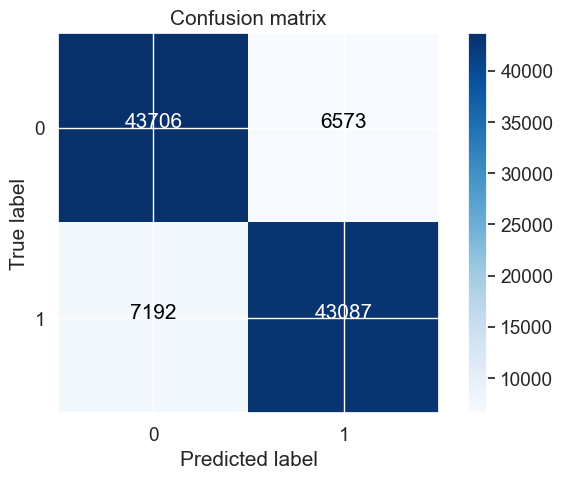

TEST METRICS
Accuracy score : 0.86
Recall score : 0.83
F1 score : 0.55
AUC score : 0.9070685560638884


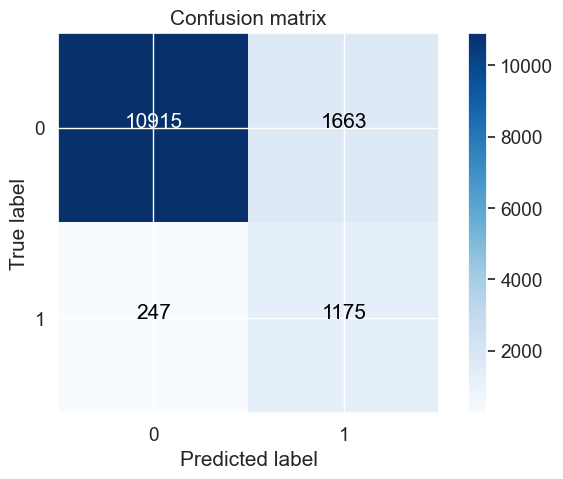

TRAIN PLOTS


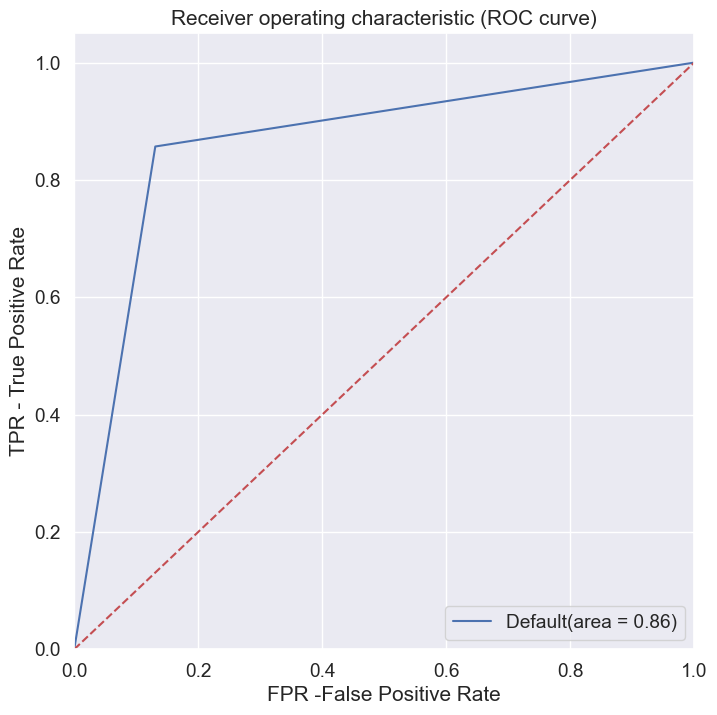

Area under curve is: 0.86
Recall for our model is: 0.86
Accuracy on test set is: 0.86
Confusion matrix for our model is: [[43706  6573]
 [ 7192 43087]]
TEST PLOTS


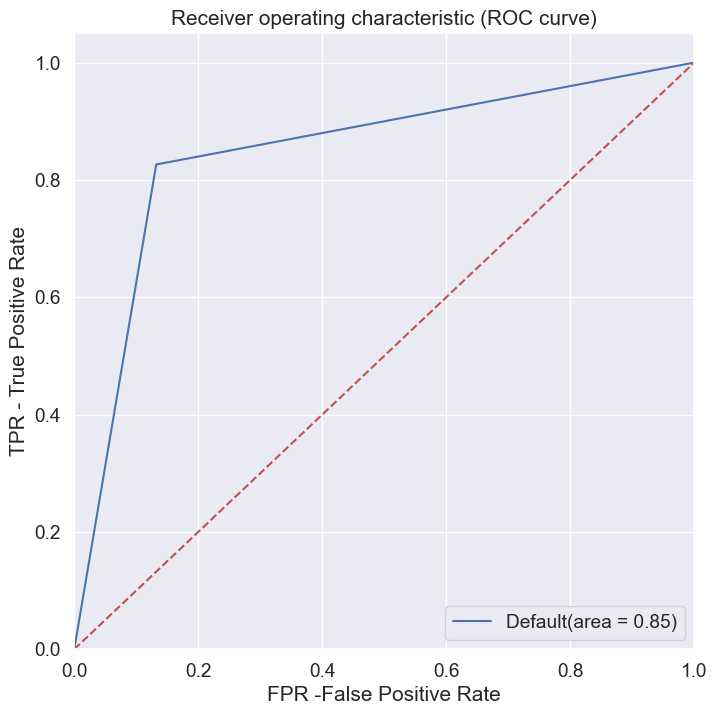

Area under curve is: 0.85
Recall for our model is: 0.83
Accuracy on test set is: 0.86
Confusion matrix for our model is: [[10915  1663]
 [  247  1175]]


In [97]:
predict("", dt_best,X_train,X_test,y_train,y_test)

## Decision Tree (4.2 Model)

In [98]:
dt = DecisionTreeClassifier(random_state=42)

# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [20, 50, 100, 200],
    'criterion': ["gini", "entropy"]
}

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=5, n_jobs=-1, verbose=1, scoring = "accuracy")

In [99]:
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 40 candidates, totalling 200 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [20, 50, 100, 200]},
             scoring='accuracy', verbose=1)

In [100]:
dt_best_gs = grid_search.best_estimator_

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.94
Recall score : 0.94
F1 score : 0.94
AUC score : 0.988790086273545


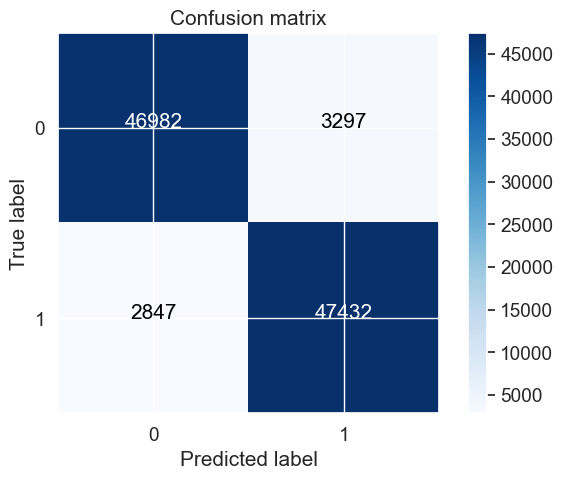

TEST METRICS
Accuracy score : 0.9
Recall score : 0.76
F1 score : 0.6
AUC score : 0.8961793737597783


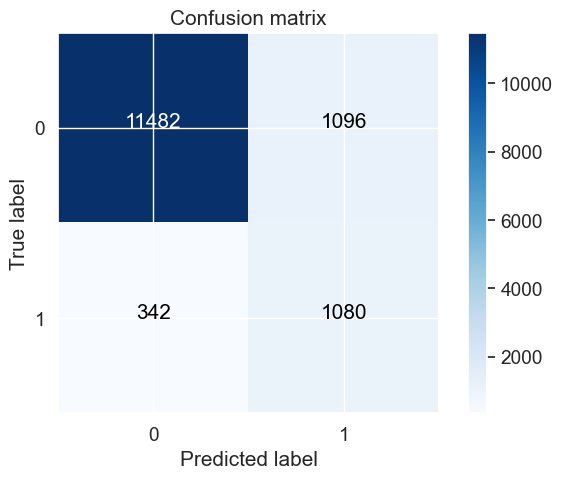

TRAIN PLOTS


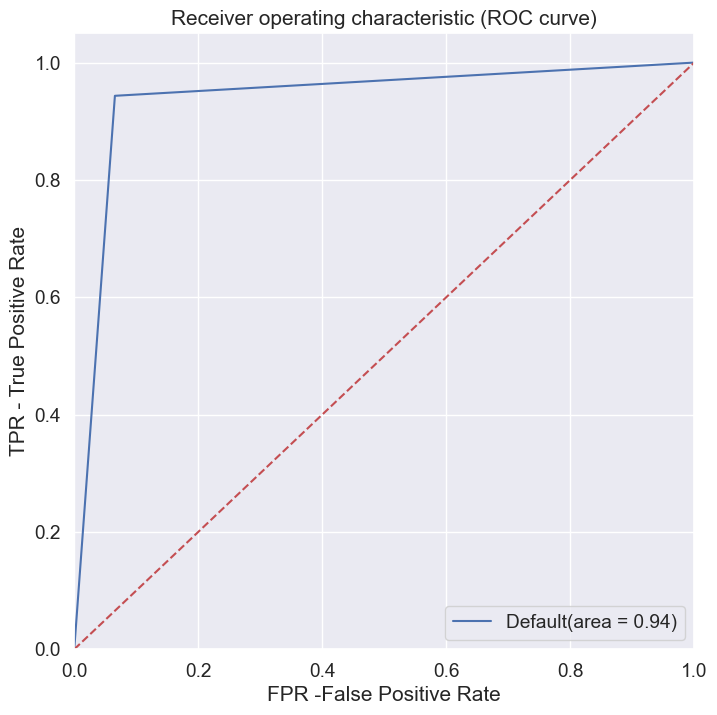

Area under curve is: 0.94
Recall for our model is: 0.94
Accuracy on test set is: 0.94
Confusion matrix for our model is: [[46982  3297]
 [ 2847 47432]]
TEST PLOTS


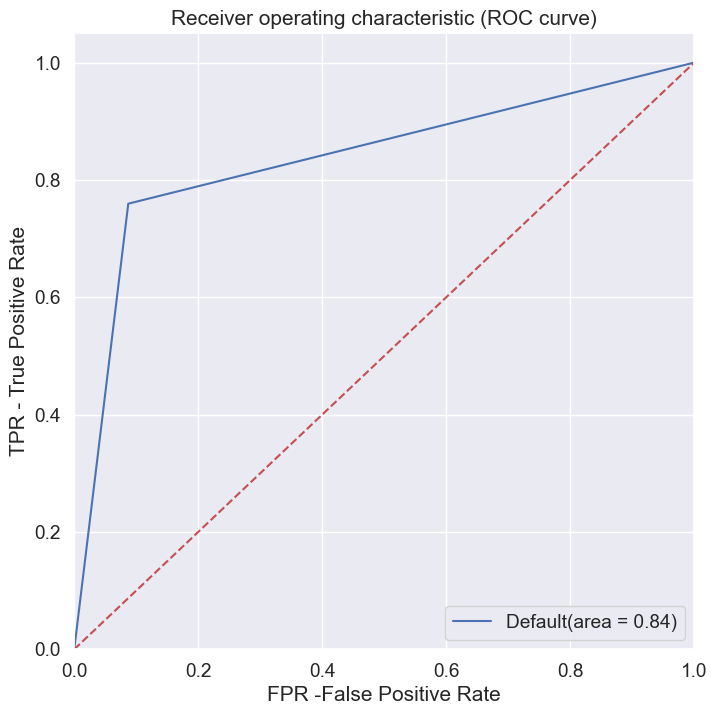

Area under curve is: 0.84
Recall for our model is: 0.76
Accuracy on test set is: 0.9
Confusion matrix for our model is: [[11482  1096]
 [  342  1080]]


In [101]:
predict("", dt_best_gs,X_train,X_test,y_train,y_test)

## GradientBoosting (5th Model)

In [102]:
gb = GradientBoostingClassifier(random_state=100) # default 

In [103]:
# Fit the model to our train and target
gb.fit(X_train, y_train)

GradientBoostingClassifier(random_state=100)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.93
Recall score : 0.93
F1 score : 0.93
AUC score : 0.9827625528225507


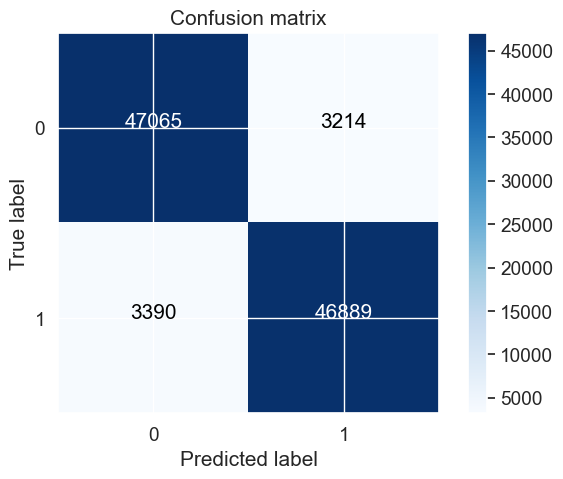

TEST METRICS
Accuracy score : 0.92
Recall score : 0.78
F1 score : 0.67
AUC score : 0.9399636283654691


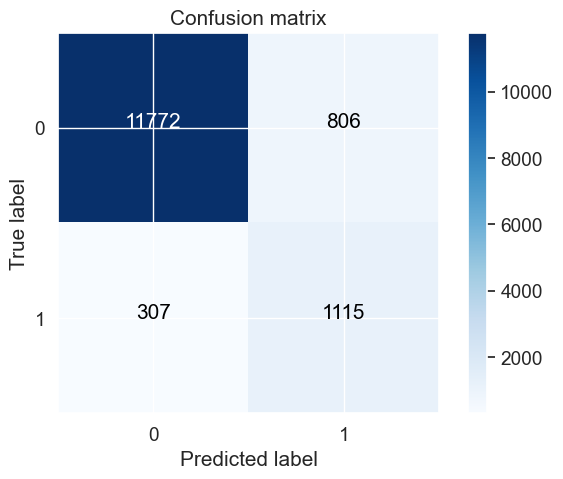

TRAIN PLOTS


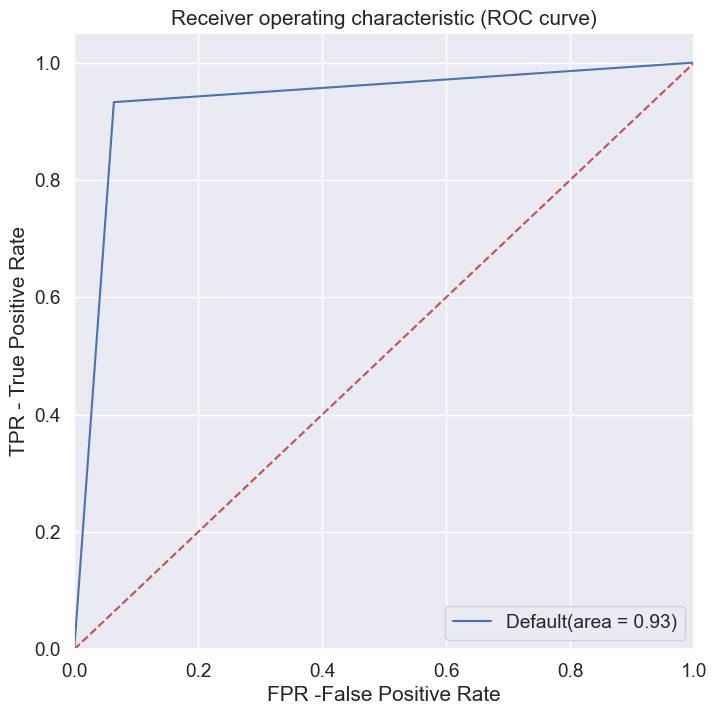

Area under curve is: 0.93
Recall for our model is: 0.93
Accuracy on test set is: 0.93
Confusion matrix for our model is: [[47065  3214]
 [ 3390 46889]]
TEST PLOTS


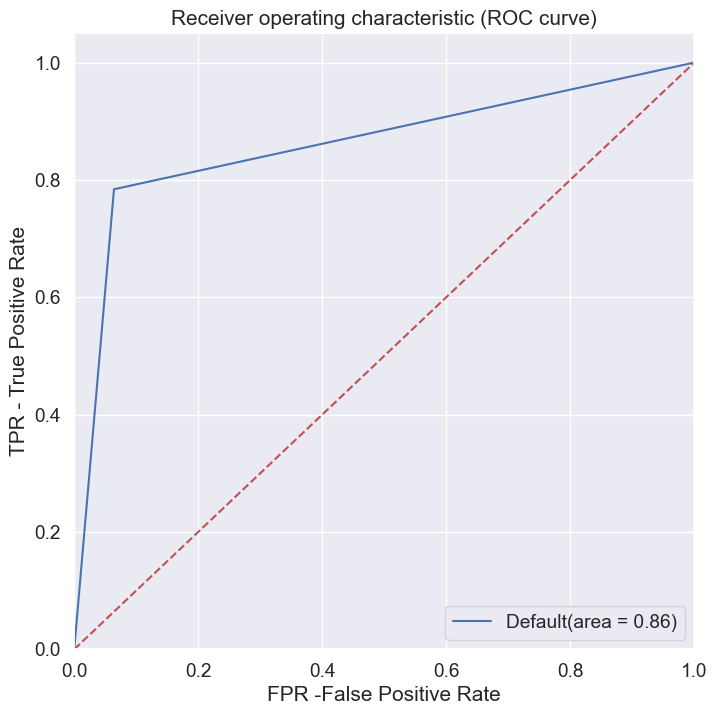

Area under curve is: 0.86
Recall for our model is: 0.78
Accuracy on test set is: 0.92
Confusion matrix for our model is: [[11772   806]
 [  307  1115]]


In [104]:
predict("", gb,X_train,X_test,y_train,y_test)

## PCA 

<Figure size 1000x1000 with 0 Axes>

Text(0.5, 1.0, 'Cumulative Explained Variance as a Function of the Number of Components')

Text(0, 0.5, 'Cumulative Explained variance')

Text(0.5, 0, 'Principal components')

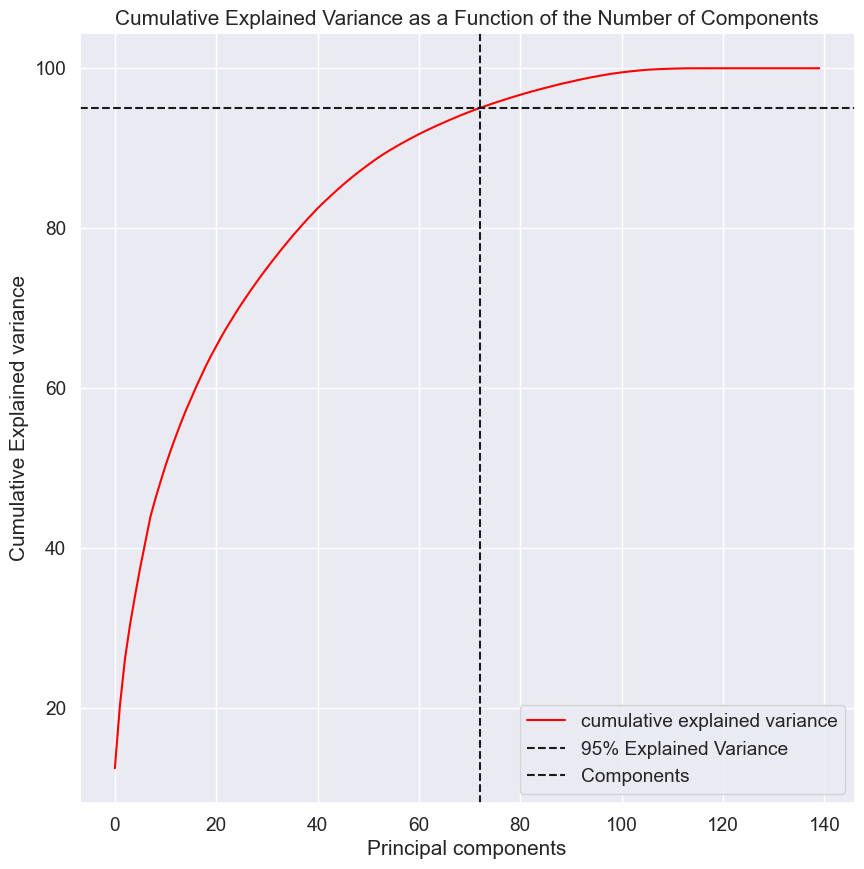

In [105]:
pca = PCA()
pca = pca.fit(X_train)
cumsum = np.cumsum(pca.explained_variance_ratio_)*100
d = [n for n in range(len(cumsum))]
plt.figure(figsize=(10, 10))
plt.plot(d,cumsum, color = 'red',label='cumulative explained variance')
plt.title('Cumulative Explained Variance as a Function of the Number of Components')
plt.ylabel('Cumulative Explained variance')
plt.xlabel('Principal components')
plt.axhline(y = 95, color='k', linestyle='--', label = '95% Explained Variance')
plt.axvline(x = 72, color='k', linestyle='--', label = 'Components')
plt.legend(loc='best')
plt.show()

In [106]:
from sklearn.decomposition import PCA
pca = PCA(0.95) 
pca.fit(X_train)
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

PCA(n_components=0.95)

<Figure size 1500x1500 with 0 Axes>

<Axes: >

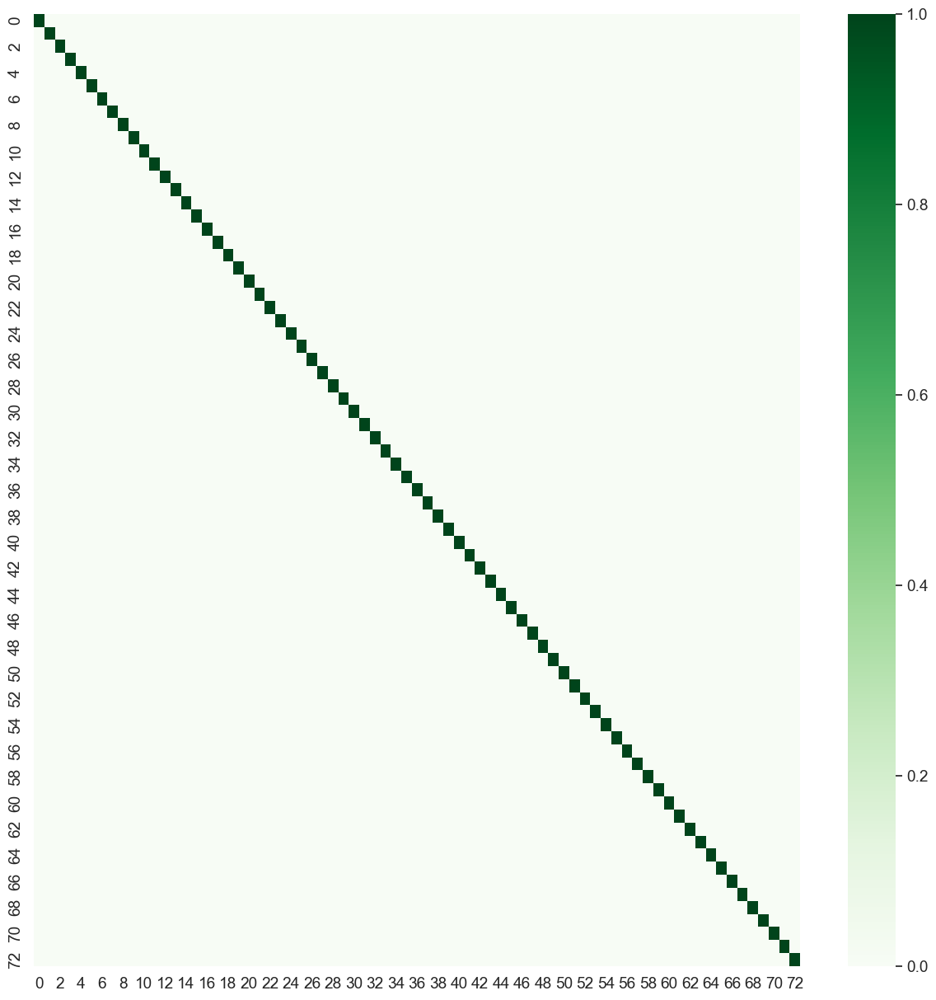

In [107]:
plt.figure(figsize=[15,15])
sns.heatmap(np.corrcoef(X_train_pca.transpose()), cmap='Greens')


In [108]:
X_train_pca.shape

(100558, 73)

In [109]:
X_test_pca.shape

(14000, 73)

## PCA + Logistic Regression (6th Model)

In [110]:
# Logistic regression model
logreg_pca = LogisticRegression(class_weight='balanced')
logreg_pca = logreg_pca.fit(X_train_pca,y_train)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.84
Recall score : 0.88
F1 score : 0.84
AUC score : 0.9098113965627914


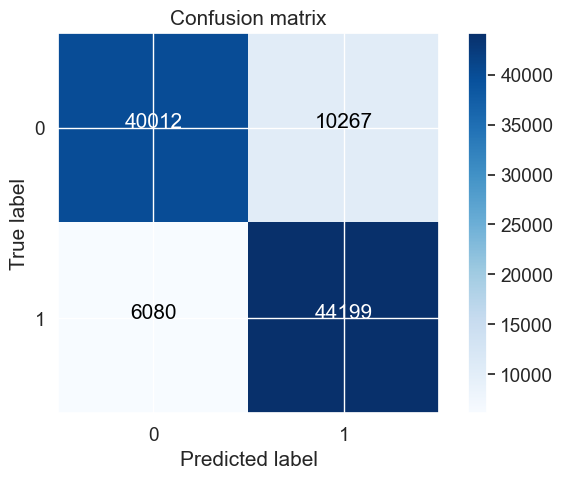

TEST METRICS
Accuracy score : 0.8
Recall score : 0.86
F1 score : 0.47
AUC score : 0.8934306188176216


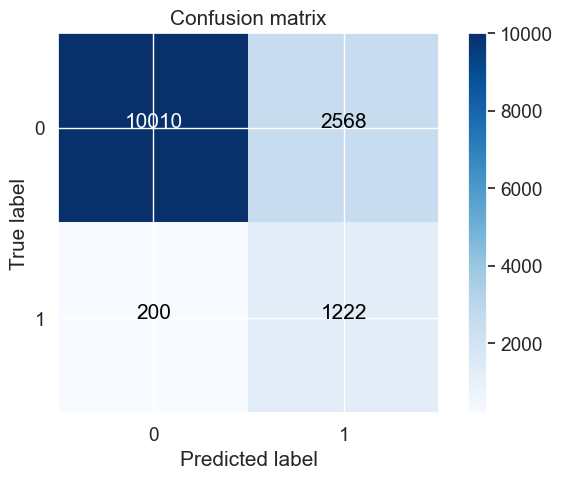

TRAIN PLOTS


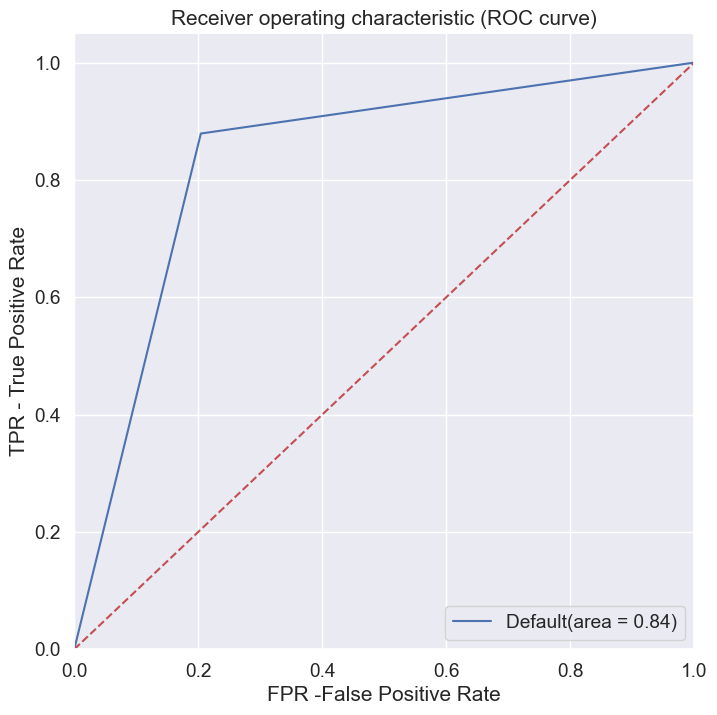

Area under curve is: 0.84
Recall for our model is: 0.88
Accuracy on test set is: 0.84
Confusion matrix for our model is: [[40012 10267]
 [ 6080 44199]]
TEST PLOTS


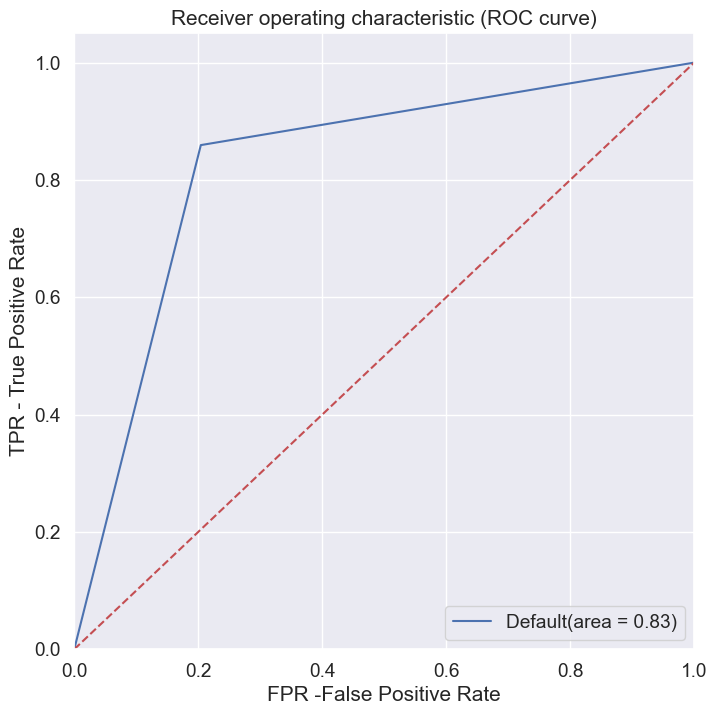

Area under curve is: 0.83
Recall for our model is: 0.86
Accuracy on test set is: 0.8
Confusion matrix for our model is: [[10010  2568]
 [  200  1222]]


In [111]:
predict("", logreg_pca,X_train_pca,X_test_pca,y_train,y_test)

In [112]:
y_train_pred_df = pd.DataFrame()

In [113]:
logreg_pca.predict_proba(X_train_pca)

array([[0.99353183, 0.00646817],
       [0.99408102, 0.00591898],
       [0.99463017, 0.00536983],
       ...,
       [0.01872262, 0.98127738],
       [0.1488564 , 0.8511436 ],
       [0.10991237, 0.89008763]])

In [114]:
y_train_pred_df["y_train"] = y_train
y_train_pred_df["y_pred_train"] = logreg_pca.predict(X_train_pca)
y_train_pred_df["y_prob_train"] = logreg_pca.predict_proba(X_train_pca)[:,1]

# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.y_prob_train.map(lambda x: 1 if x > i else 0)

In [115]:
y_train_pred_df.head()

,y_train,y_pred_train,y_prob_train,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0,0.01,1,0,0,0,0,0,0,0,0,0
1,0,0,0.01,1,0,0,0,0,0,0,0,0,0
2,0,0,0.01,1,0,0,0,0,0,0,0,0,0
3,1,0,0.00,1,0,0,0,0,0,0,0,0,0
4,0,1,0.79,1,1,1,1,1,1,1,1,0,0


In [116]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame(columns = ['prob','accuracy','sensi','speci'])
# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_df.y_train, y_train_pred_df[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

                     prob             accuracy                sensi  \
0.00                 0.00                 0.50                 1.00   
0.10                 0.10                 0.71                 0.97   
0.20                 0.20                 0.76                 0.95   
0.30                 0.30                 0.79                 0.93   
0.40                 0.40                 0.82                 0.91   
0.50                 0.50                 0.84                 0.88   
0.60                 0.60                 0.84                 0.83   
0.70                 0.70                 0.84                 0.77   
0.80                 0.80                 0.78                 0.61   
0.90                 0.90                 0.56                 0.14   

                    speci  
0.00                 0.00  
0.10                 0.44  
0.20                 0.56  
0.30                 0.65  
0.40                 0.73  
0.50                 0.80  
0.60                 0

<Axes: xlabel='prob'>

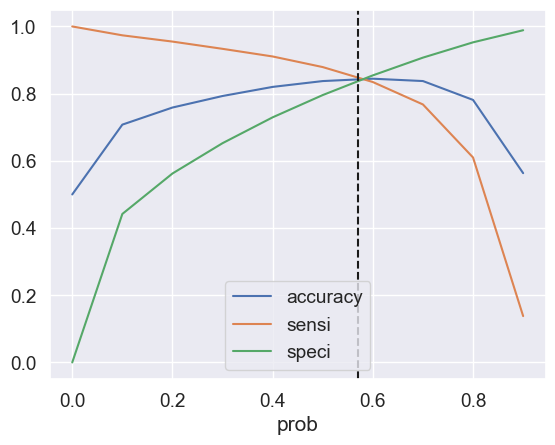

In [117]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.axvline(x = 0.57, color='k', linestyle='--')
plt.show()

In [118]:
y_train_pred_df['final_predicted'] = y_train_pred_df.y_prob_train.map(lambda x: 1 if x > 0.6 else 0)
y_train_pred_df.head()

,y_train,y_pred_train,y_prob_train,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0,0.01,1,0,0,0,0,0,0,0,0,0,0
1,0,0,0.01,1,0,0,0,0,0,0,0,0,0,0
2,0,0,0.01,1,0,0,0,0,0,0,0,0,0,0
3,1,0,0.00,1,0,0,0,0,0,0,0,0,0,0
4,0,1,0.79,1,1,1,1,1,1,1,1,0,0,1


In [119]:
calculate_metrics(y_train, y_train_pred_df.final_predicted)
calculate_metrics_prob(y_train, y_train_pred_df.y_prob_train)

Accuracy score : 0.84
Recall score : 0.83
F1 score : 0.84


(array([[42959,  7320],
        [ 8319, 41960]], dtype=int64),
 0.84,
 0.85,
 0.83,
 0.84)

AUC score : 0.9098113965627914


0.9098113965627914

In [120]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df["y_test"] = y_test
y_test_pred_df["y_prob_test"] = logreg_pca.predict_proba(X_test_pca)[:,1]
y_test_pred_df["final_predicted"] = y_test_pred_df.y_prob_test.map(lambda x: 1 if x > 0.6 else 0)
calculate_metrics(y_test, y_test_pred_df.final_predicted)
calculate_metrics_prob(y_test, y_test_pred_df.y_prob_test)

Accuracy score : 0.85
Recall score : 0.81
F1 score : 0.53


(array([[10775,  1803],
        [  273,  1149]], dtype=int64),
 0.85,
 0.39,
 0.81,
 0.53)

AUC score : 0.8934306188176216


0.8934306188176216

## PCA + Decision Tree (7th Model)

In [121]:
#dt_pca = DecisionTreeClassifier(random_state=42,class_weight='balanced')

# Create the parameter grid based on the results of random search 
#params = {
#    'max_depth': [2, 3, 5, 10, 20, 30, 40],
#    'min_samples_leaf': [20, 50, 100, 200, 350, 500],
#    'criterion': ["gini", "entropy"]
#}

# Instantiate the grid search model
#grid_search = GridSearchCV(estimator=dt_pca, param_grid=params, cv=5, n_jobs=-1, verbose=1, scoring = "accuracy")

In [122]:
#%%time
#grid_search.fit(X_train_pca, y_train)

In [123]:
#dt_pca_best = grid_search.best_estimator_
dt_pca_best = DecisionTreeClassifier(class_weight='balanced', criterion='entropy',max_depth=3, min_samples_leaf=20, random_state=42)
dt_pca_best.fit(X_train_pca, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=3, min_samples_leaf=20, random_state=42)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.77
Recall score : 0.72
F1 score : 0.75
AUC score : 0.8033386968679525


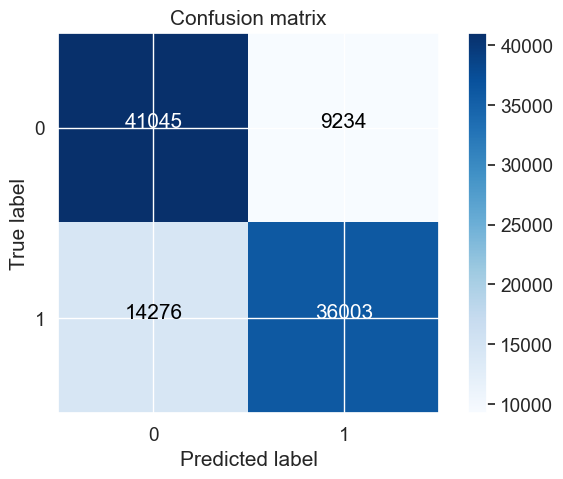

TEST METRICS
Accuracy score : 0.8
Recall score : 0.69
F1 score : 0.41
AUC score : 0.7879264612447022


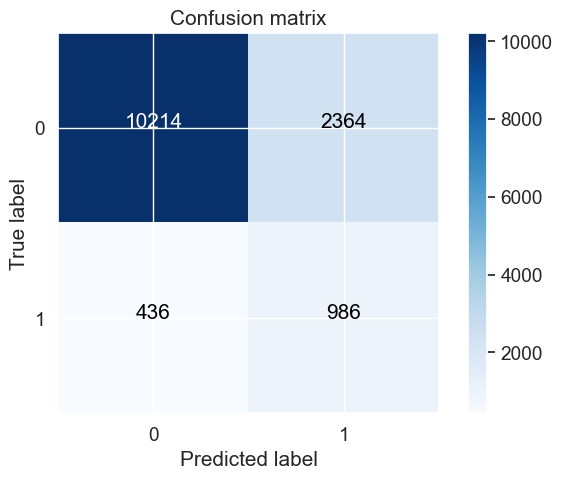

TRAIN PLOTS


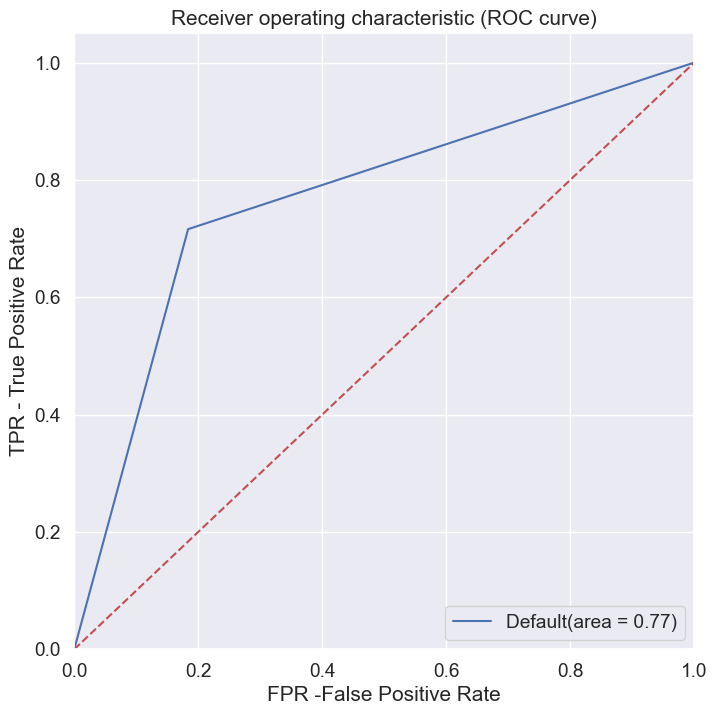

Area under curve is: 0.77
Recall for our model is: 0.72
Accuracy on test set is: 0.77
Confusion matrix for our model is: [[41045  9234]
 [14276 36003]]
TEST PLOTS


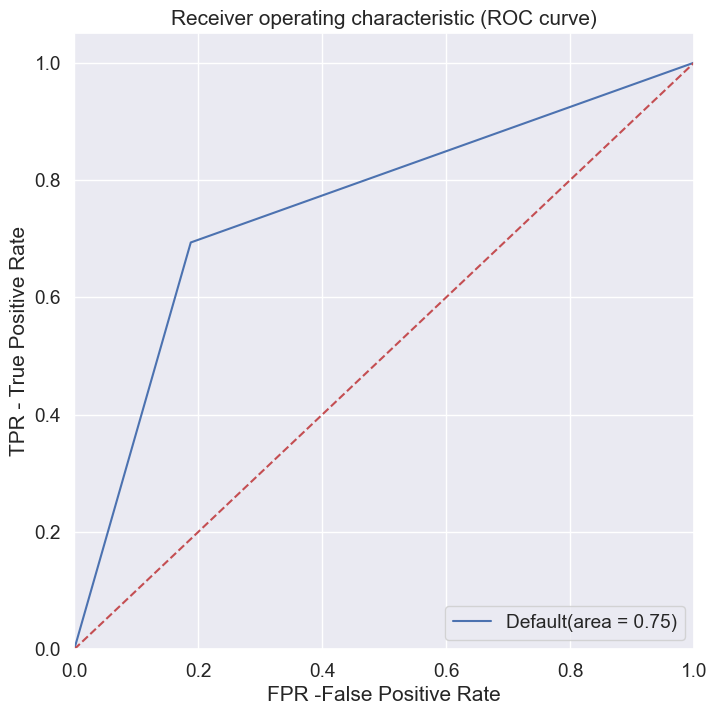

Area under curve is: 0.75
Recall for our model is: 0.69
Accuracy on test set is: 0.8
Confusion matrix for our model is: [[10214  2364]
 [  436   986]]


In [124]:
predict("", dt_pca_best,X_train_pca,X_test_pca,y_train,y_test)

## PCA + Gradient Boosting (8th Model)

In [125]:
gb_pca = GradientBoostingClassifier(random_state=100) # default 

In [126]:
# Fit the model to our train and target
gb_pca.fit(X_train_pca, y_train)

GradientBoostingClassifier(random_state=100)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.86
Recall score : 0.87
F1 score : 0.86
AUC score : 0.9267685663626036


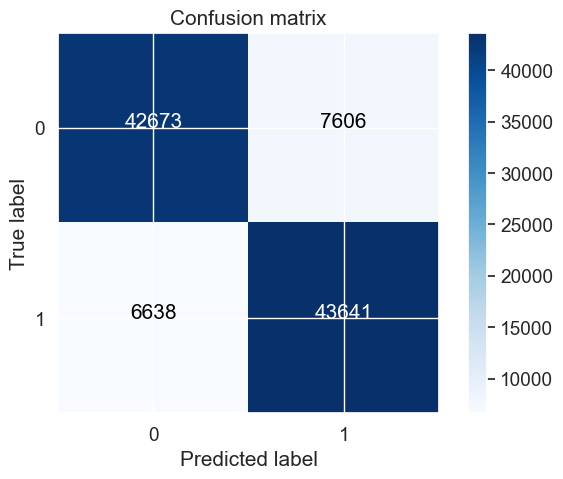

TEST METRICS
Accuracy score : 0.84
Recall score : 0.83
F1 score : 0.51
AUC score : 0.9025191385221757


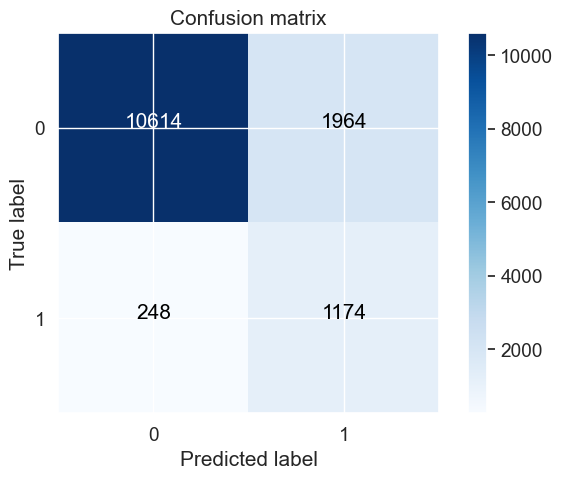

TRAIN PLOTS


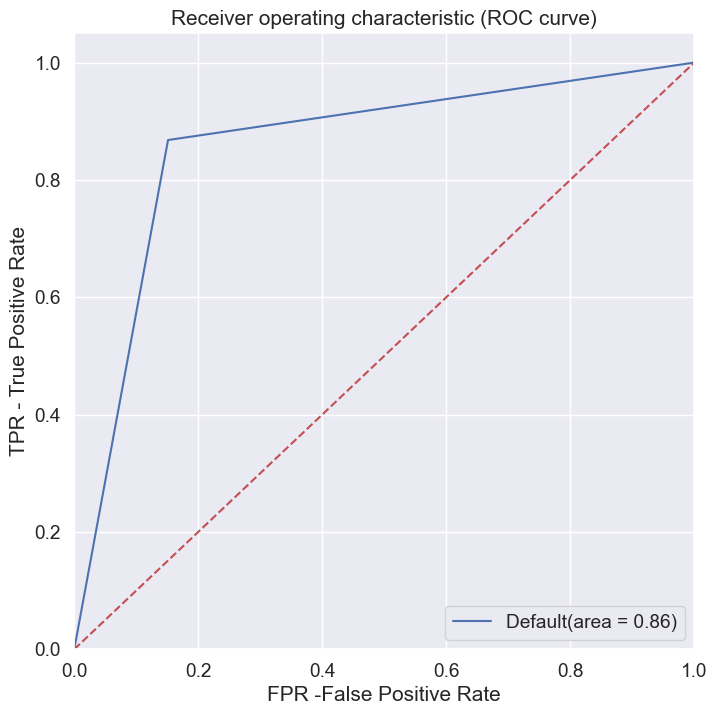

Area under curve is: 0.86
Recall for our model is: 0.87
Accuracy on test set is: 0.86
Confusion matrix for our model is: [[42673  7606]
 [ 6638 43641]]
TEST PLOTS


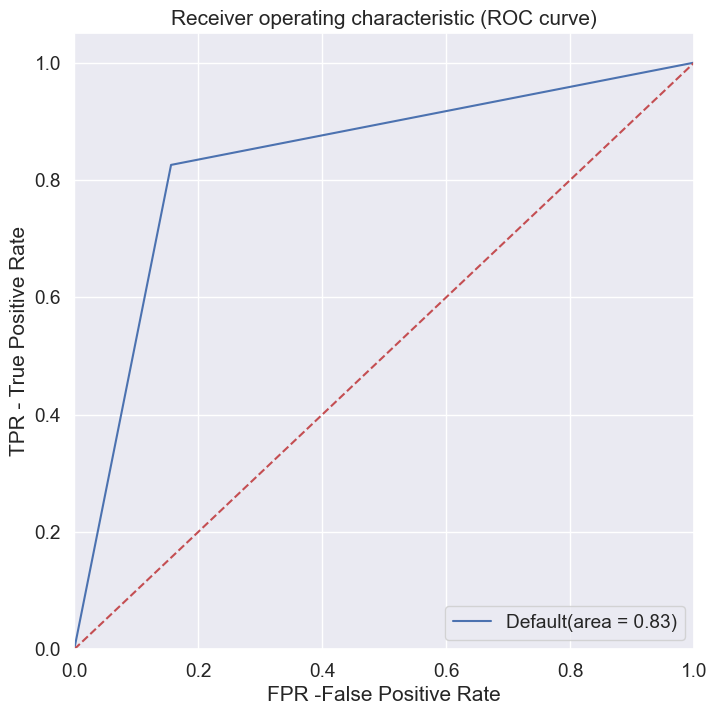

Area under curve is: 0.83
Recall for our model is: 0.83
Accuracy on test set is: 0.84
Confusion matrix for our model is: [[10614  1964]
 [  248  1174]]


In [127]:
predict("", gb_pca,X_train_pca,X_test_pca,y_train,y_test)

## PCA + RandomForest (9th Model)

In [128]:
#rf = RandomForestClassifier(random_state=42, n_jobs=-1,class_weight='balanced')

#params = {
#    'max_depth': [2,5,10,20,30],
#    'min_samples_leaf': [20,40,80,150,200,300,500]
#}

#grid_search = GridSearchCV(estimator=rf,param_grid=params,cv = 5,n_jobs=-1, verbose=4, scoring="accuracy")

#%%time
#grid_search.fit(X_train_pca, y_train)

#grid_search.best_score_

In [129]:
#rf_pca_best = grid_search.best_estimator_
rf_pca_best = RandomForestClassifier(class_weight='balanced', max_depth=20,min_samples_leaf=20, n_jobs=-1, random_state=42)
rf_pca_best.fit(X_train_pca, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=20,
                       min_samples_leaf=20, n_jobs=-1, random_state=42)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.93
Recall score : 0.94
F1 score : 0.93
AUC score : 0.9836050002781649


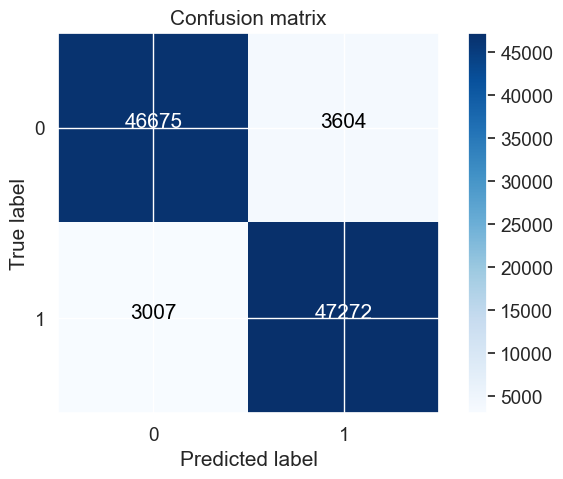

TEST METRICS
Accuracy score : 0.89
Recall score : 0.75
F1 score : 0.57
AUC score : 0.9065154392987198


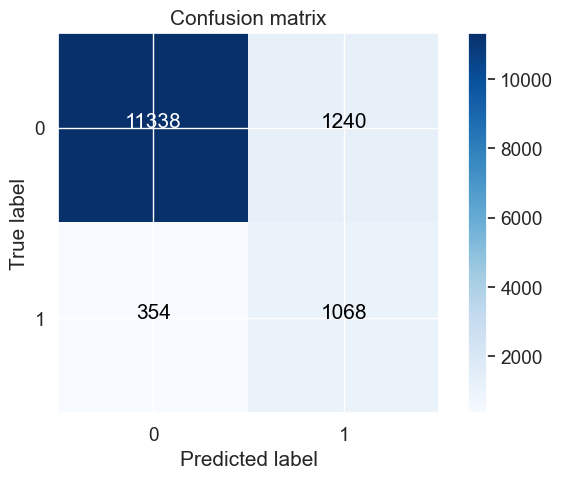

TRAIN PLOTS


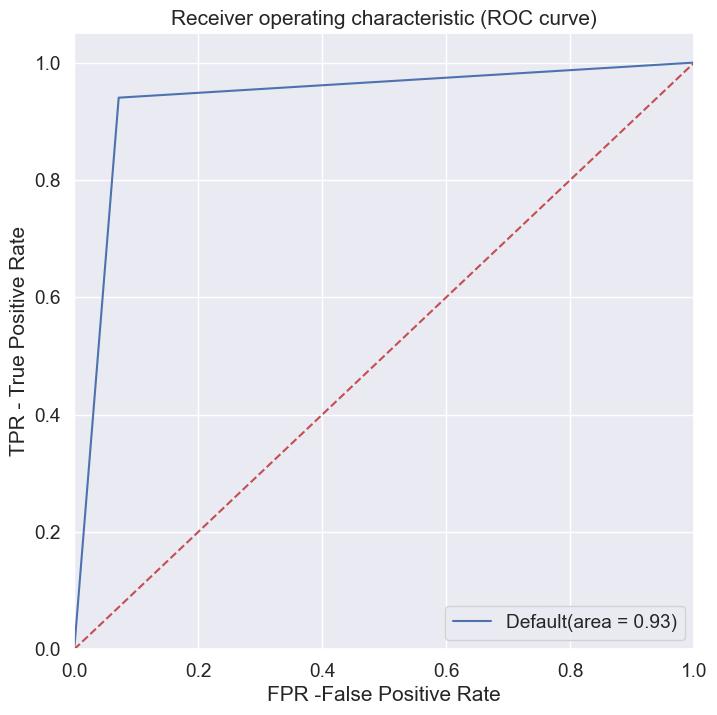

Area under curve is: 0.93
Recall for our model is: 0.94
Accuracy on test set is: 0.93
Confusion matrix for our model is: [[46675  3604]
 [ 3007 47272]]
TEST PLOTS


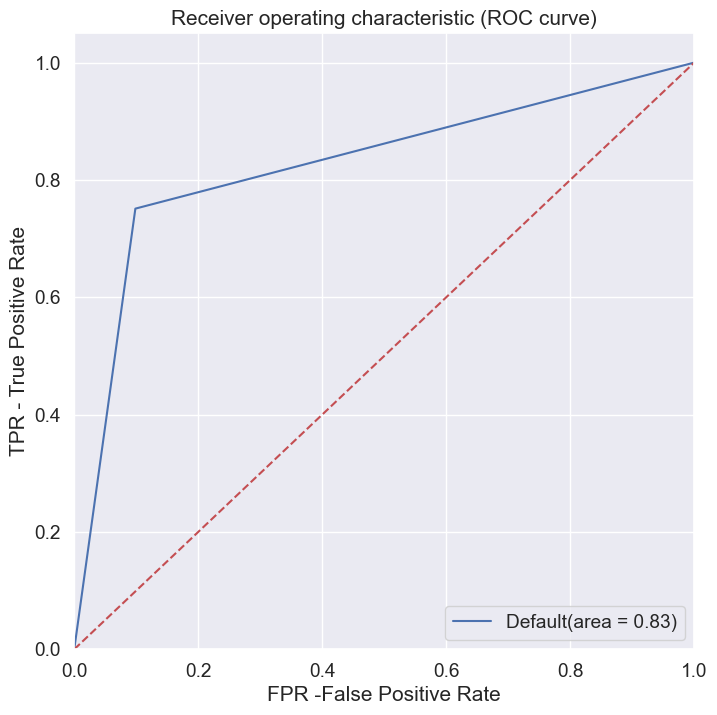

Area under curve is: 0.83
Recall for our model is: 0.75
Accuracy on test set is: 0.89
Confusion matrix for our model is: [[11338  1240]
 [  354  1068]]


In [130]:
predict("", rf_pca_best,X_train_pca,X_test_pca,y_train,y_test)

## Evaluating the model on the final test data

In [131]:
churn_test

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
0,69999,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,91.88,65.33,64.44,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.00,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.00,0.00,0.00,0.00,0.00,0.00,48.93,7.68,28.48,0.00,0.00,0.00,0.00,0.00,0.03,0.00,0.00,0.00,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.00,0.00,0.00,0.00,0.00,0.00,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.00,0.00,0.00,5,5,4,103,90,60,50,30,30,6/21/2014,7/26/2014,8/24/2014,30,30,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,0.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1692,0.00,0.00,0.00
1,70000,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,414.17,515.57,360.87,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.00,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.00,0.00,0.00,0.00,0.00,0.00,0.00,23.76,17.68,0.00,0.00,0.80,0.00,0.00,0.00,0.00,0.00,0.00,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.00,0.00,0.00,5,4,5,500,500,500,250,250,250,6/

In [132]:
churn_test_imputed = impute_churn_data(churn_test)

Imputing data with 0
Droping  circle_id
circle_id  not present
Droping  loc_og_t2o_mou
loc_og_t2o_mou  not present
Droping  std_og_t2o_mou
std_og_t2o_mou  not present
Droping  loc_ic_t2o_mou
loc_ic_t2o_mou  not present
Droping  last_date_of_month_6
last_date_of_month_6  not present
Droping  last_date_of_month_7
last_date_of_month_7  not present
Droping  last_date_of_month_8
last_date_of_month_8  not present
Droping  std_og_t2c_mou_6
std_og_t2c_mou_6  not present
Droping  std_og_t2c_mou_7
std_og_t2c_mou_7  not present
Droping  std_og_t2c_mou_8
std_og_t2c_mou_8  not present
Droping  std_ic_t2o_mou_6
std_ic_t2o_mou_6  not present
Droping  std_ic_t2o_mou_7
std_ic_t2o_mou_7  not present
Droping  std_ic_t2o_mou_8
std_ic_t2o_mou_8  not present
Converting date columns to days from last date of the month


Index(['count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8',
       'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'arpu_3g_6',
       'arpu_3g_7', 'arpu_3g_8', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8',
       'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'fb_user_6',
       'fb_user_7', 'fb_user_8'],
      dtype='object')

List of missing data in %  terms:


fb_user_6                                 74.72
night_pck_user_6                          74.72
count_rech_3g_6                           74.72
count_rech_2g_6                           74.72
arpu_3g_6                                 74.72
arpu_2g_6                                 74.72
count_rech_3g_7                           74.31
fb_user_7                                 74.31
count_rech_2g_7                           74.31
arpu_3g_7                                 74.31
night_pck_user_7                          74.31
arpu_2g_7                                 74.31
night_pck_user_8                          73.59
count_rech_3g_8                           73.59
fb_user_8                                 73.59
arpu_3g_8                                 73.59
count_rech_2g_8                           73.59
arpu_2g_8                                 73.59
loc_ic_t2m_mou_8                           5.58
std_og_t2m_mou_8                           5.58
std_og_t2f_mou_8                        

Index(['count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8',
       'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'arpu_3g_6',
       'arpu_3g_7', 'arpu_3g_8', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8',
       'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'fb_user_6',
       'fb_user_7', 'fb_user_8'],
      dtype='object')

18

Index(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou',
       'last_date_of_month_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8',
       'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6',
       'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7',
       'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7',
       'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7',
       'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7',
       'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7',
       'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8',
       'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8',
       'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8',
       'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8',
       'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8',
       'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6',
       'isd_og_mou_7', 'isd_og_mou_8'

List of missing data in %  terms:


loc_ic_mou_8                               5.58
loc_og_t2t_mou_8                           5.58
loc_og_t2f_mou_8                           5.58
loc_og_t2c_mou_8                           5.58
loc_og_mou_8                               5.58
std_og_t2t_mou_8                           5.58
std_og_t2m_mou_8                           5.58
std_og_t2f_mou_8                           5.58
std_og_t2c_mou_8                           5.58
std_og_mou_8                               5.58
isd_og_mou_8                               5.58
spl_og_mou_8                               5.58
loc_ic_t2t_mou_8                           5.58
loc_ic_t2m_mou_8                           5.58
loc_ic_t2f_mou_8                           5.58
std_ic_t2t_mou_8                           5.58
std_ic_t2m_mou_8                           5.58
std_ic_t2f_mou_8                           5.58
std_ic_t2o_mou_8                           5.58
std_ic_mou_8                               5.58
spl_ic_mou_8                            

Imputing data with -1
Imputing the other columns of the month with 0
renaming columns


Index(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou'], dtype='object')

List of missing data in %  terms:


loc_og_t2o_mou                             1.05
std_og_t2o_mou                             1.05
loc_ic_t2o_mou                             1.05
id                                         0.00
total_rech_num_8                           0.00
isd_ic_mou_7                               0.00
isd_ic_mou_8                               0.00
ic_others_6                                0.00
ic_others_7                                0.00
ic_others_8                                0.00
total_rech_num_6                           0.00
total_rech_num_7                           0.00
total_rech_amt_7                           0.00
total_rech_amt_6                           0.00
spl_ic_mou_8                               0.00
total_rech_amt_8                           0.00
max_rech_amt_6                             0.00
max_rech_amt_7                             0.00
max_rech_amt_8                             0.00
date_of_last_rech_6                        0.00
isd_ic_mou_6                            

(30000, 153)

In [133]:
churn_solution = pd.DataFrame()
churn_solution['id'] = churn_test_imputed['id']

feature_names=X_train.columns.tolist()


In [134]:
# Putting feature variable to X
X_finaltest = churn_test_imputed[feature_names]

In [135]:
X_finaltest.head(10)

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_6,vbc_3g_7,vbc_3g_8
0,69999,91.88,65.33,64.44,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.00,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.00,0.00,0.00,48.93,7.68,28.48,0.00,0.00,0.00,0.00,0.00,0.03,0.00,0.00,0.00,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.00,0.00,0.00,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.00,0.00,0.00,5,5,4,103,90,60,50,30,30,9,5,7,30,30,0,-1,-1,-1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,1692,0.00,0.00,0.00
1,70000,414.17,515.57,360.87,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.00,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.00,0.00,0.00,0.00,23.76,17.68,0.00,0.00,0.80,0.00,0.00,0.00,0.00,0.00,0.00,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.00,0.00,0.00,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.00,0.00,0.00,5,4,5,500,500,500,250,250,250,11,15,7,250,0,0,-1,-1,-1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,2533,0.00,0.00,0.00
2,70001,329.84,434.88,746.24,7.54,7.86,8.40,16.98,45.81,45.04,22.81,103.38,26.08,24.53,53.68,54.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,6,9,5,500,1000,1000,300,500,500,1,4,3,0,0,0,-1,-1,-1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.

In [136]:
X_finaltest_pca = pca.transform(X_finaltest)

## Prediction churn using all the models and checking performance

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.84
Recall score : 0.88
F1 score : 0.85
AUC score : 0.9126363105648756


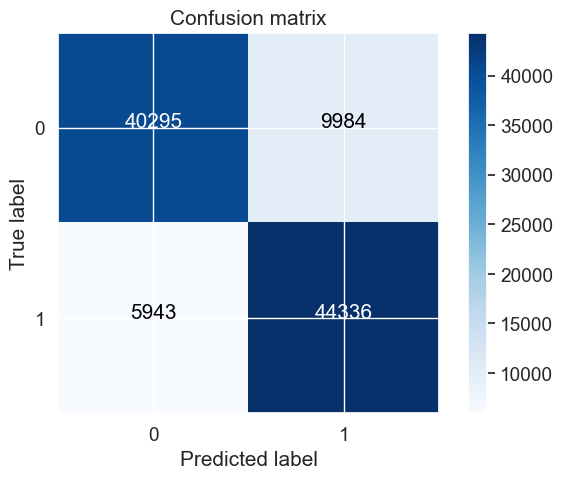

TEST METRICS
Accuracy score : 1.0
Recall score : 1.0
F1 score : 1.0
AUC score : 1.0


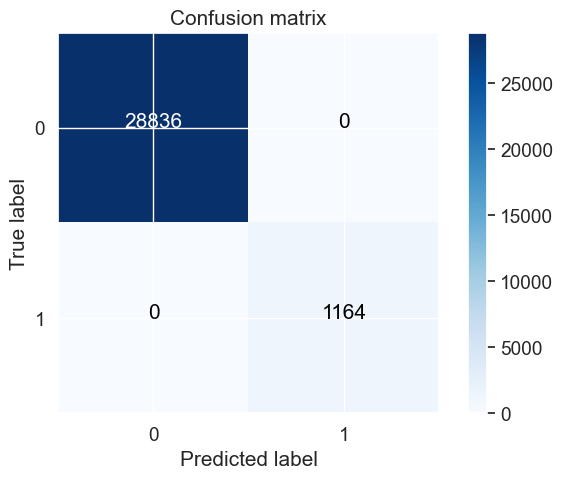

TRAIN PLOTS


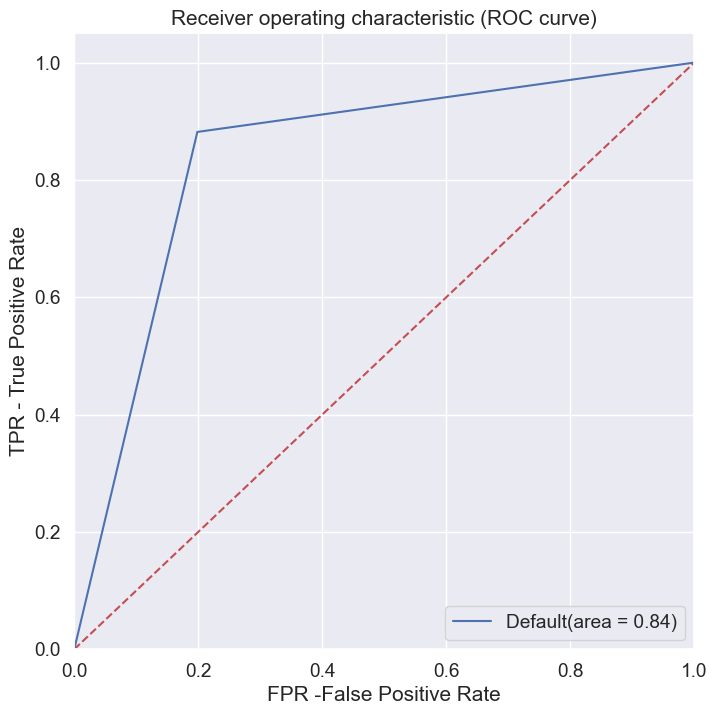

Area under curve is: 0.84
Recall for our model is: 0.88
Accuracy on test set is: 0.84
Confusion matrix for our model is: [[40295  9984]
 [ 5943 44336]]
TEST PLOTS


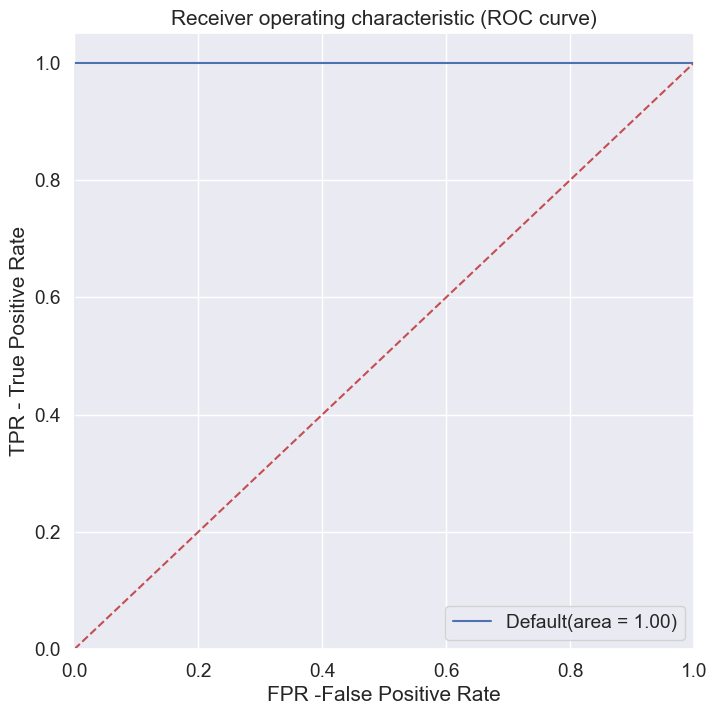

Area under curve is: 1.0
Recall for our model is: 1.0
Accuracy on test set is: 1.0
Confusion matrix for our model is: [[28836     0]
 [    0  1164]]


In [137]:
y_finaltest = logreg.predict(X_finaltest)
predict("LogisticReg", logreg,X_train,X_finaltest,y_train,y_finaltest)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.83
Recall score : 0.88
F1 score : 0.83
AUC score : 0.903977865999024


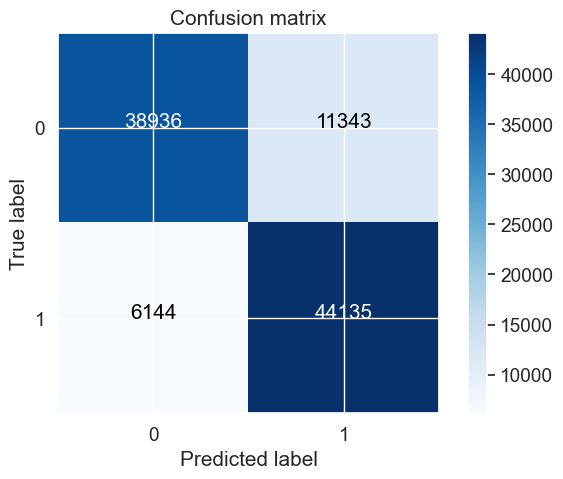

TEST METRICS
Accuracy score : 1.0
Recall score : 1.0
F1 score : 1.0
AUC score : 1.0


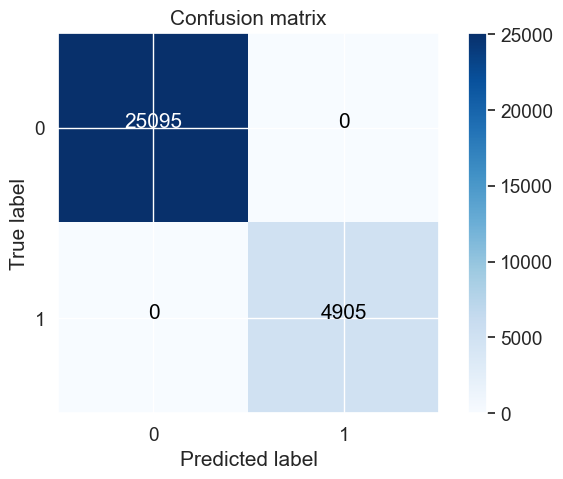

TRAIN PLOTS


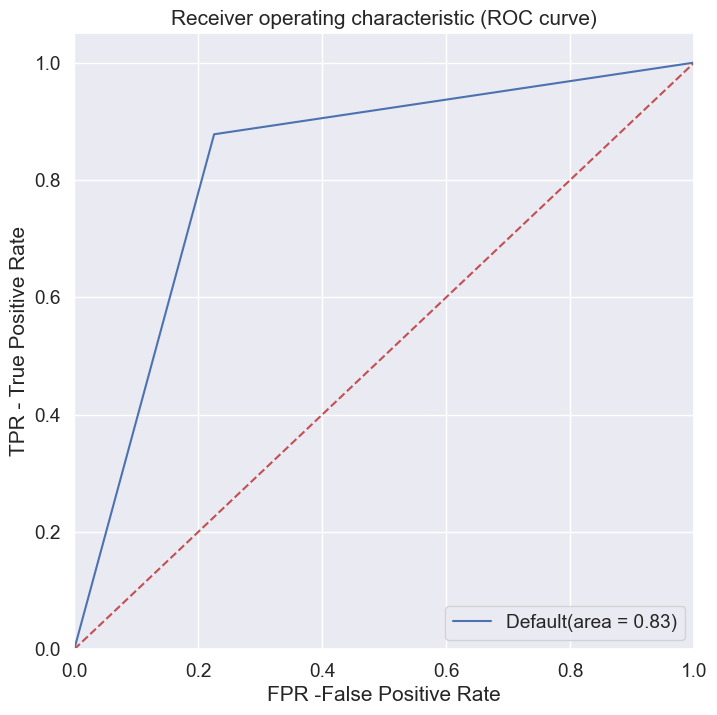

Area under curve is: 0.83
Recall for our model is: 0.88
Accuracy on test set is: 0.83
Confusion matrix for our model is: [[38936 11343]
 [ 6144 44135]]
TEST PLOTS


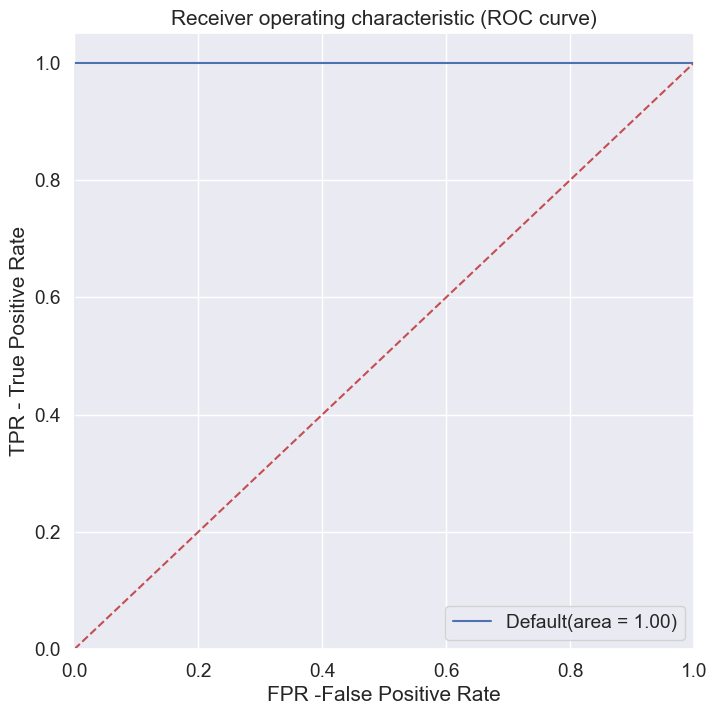

Area under curve is: 1.0
Recall for our model is: 1.0
Accuracy on test set is: 1.0
Confusion matrix for our model is: [[25095     0]
 [    0  4905]]


In [138]:
X_finaltest = churn_test_imputed[col_top15]
y_finaltest = logreg_top15.predict(X_finaltest)
predict("LogisticRegRFE", logreg_top15,X_train[col_top15],X_finaltest[col_top15],y_train,y_finaltest)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.94
Recall score : 0.94
F1 score : 0.94
AUC score : 0.988790086273545


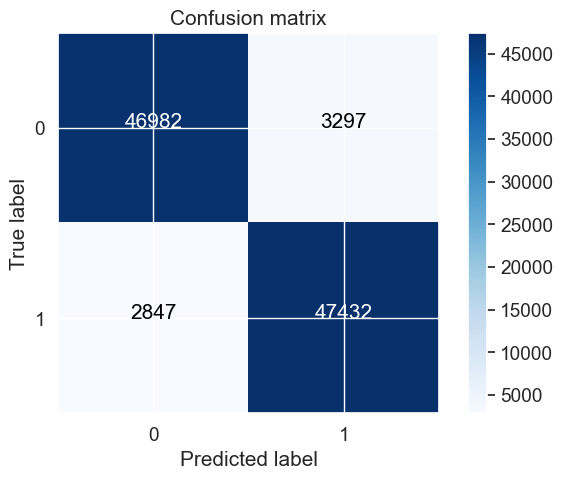

TEST METRICS
Accuracy score : 0.64
Recall score : 0.3
F1 score : 0.21
AUC score : 0.3435570763819199


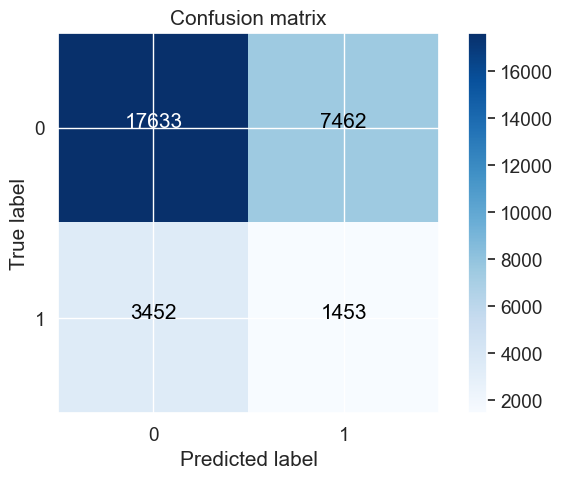

TRAIN PLOTS


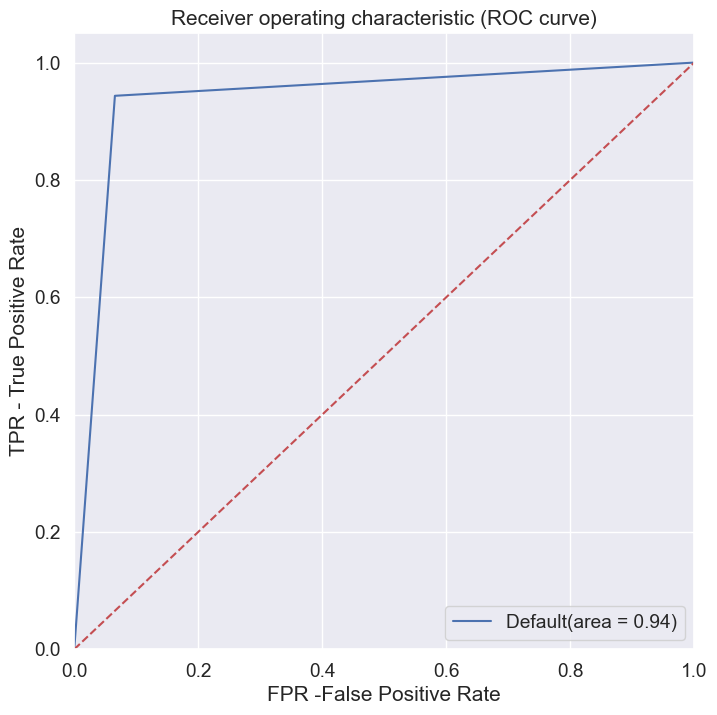

Area under curve is: 0.94
Recall for our model is: 0.94
Accuracy on test set is: 0.94
Confusion matrix for our model is: [[46982  3297]
 [ 2847 47432]]
TEST PLOTS


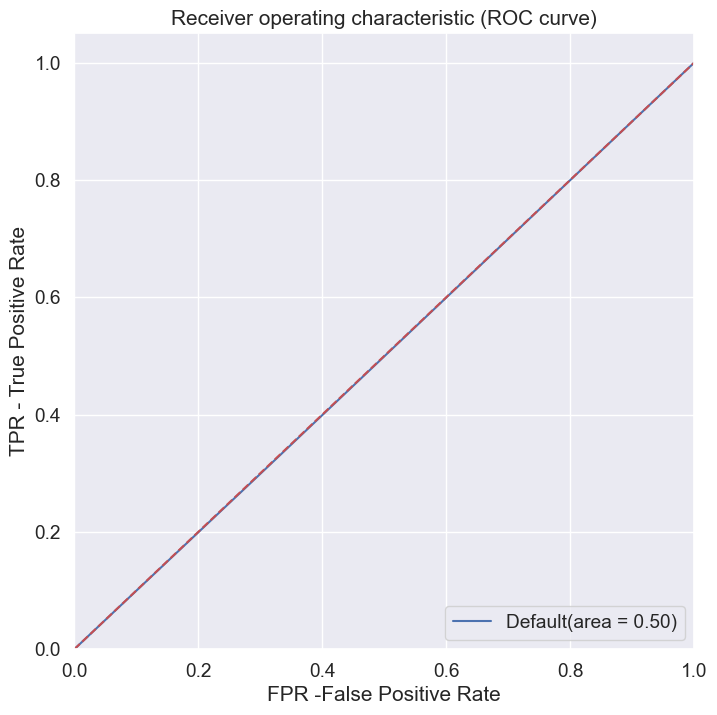

Area under curve is: 0.5
Recall for our model is: 0.3
Accuracy on test set is: 0.64
Confusion matrix for our model is: [[17633  7462]
 [ 3452  1453]]


In [139]:
X_finaltest = churn_test_imputed[feature_names]
predict("DecisionTreeHypTuned", dt_best_gs,X_train,X_finaltest,y_train,y_finaltest)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.86
Recall score : 0.86
F1 score : 0.86
AUC score : 0.9202491834658453


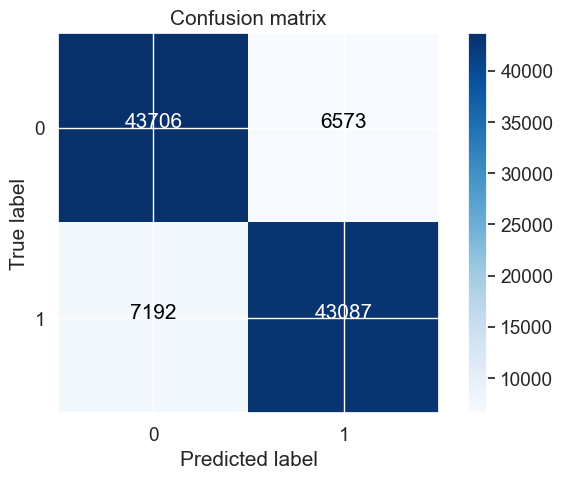

TEST METRICS
Accuracy score : 0.15
Recall score : 0.84
F1 score : 0.25
AUC score : 0.4291772000343648


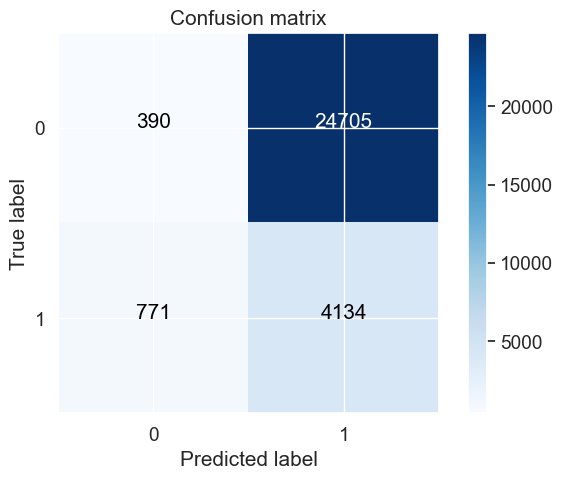

TRAIN PLOTS


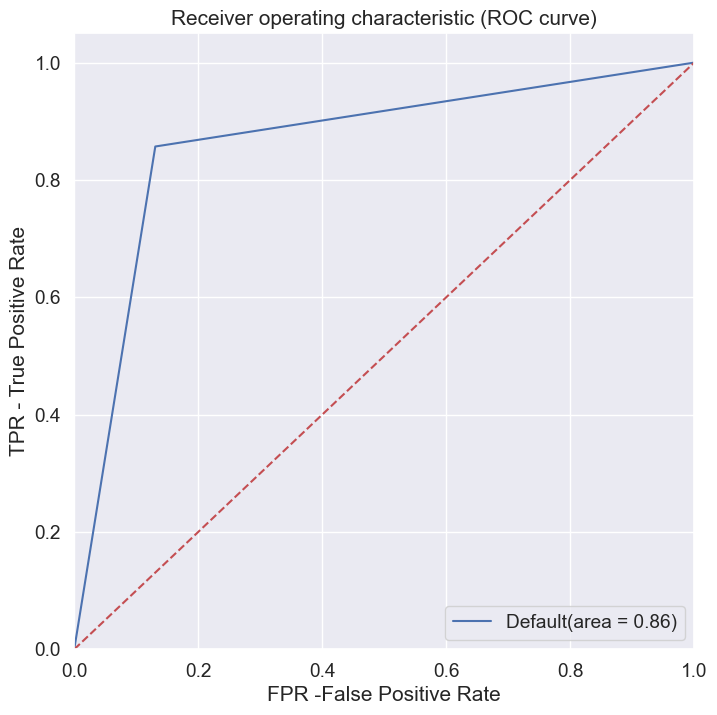

Area under curve is: 0.86
Recall for our model is: 0.86
Accuracy on test set is: 0.86
Confusion matrix for our model is: [[43706  6573]
 [ 7192 43087]]
TEST PLOTS


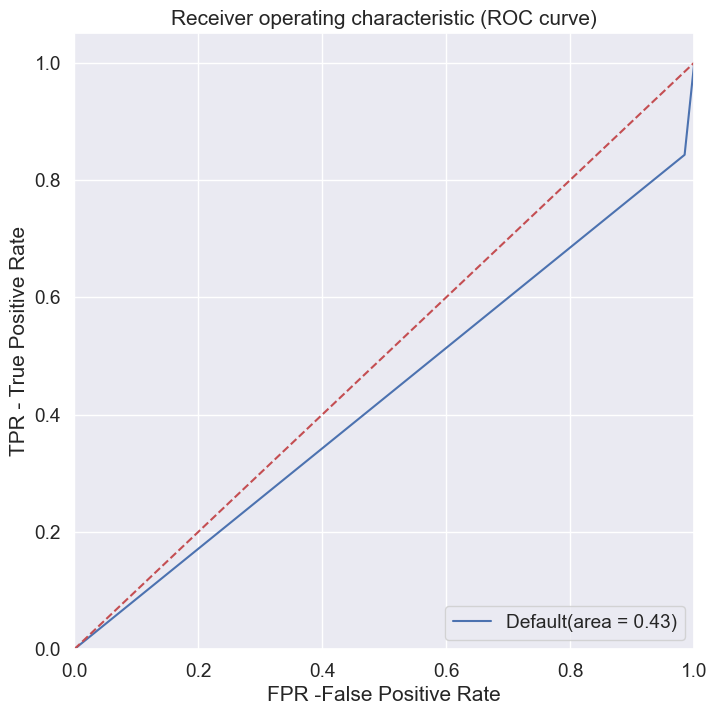

Area under curve is: 0.43
Recall for our model is: 0.84
Accuracy on test set is: 0.15
Confusion matrix for our model is: [[  390 24705]
 [  771  4134]]


In [140]:
X_finaltest = churn_test_imputed[feature_names]
predict("DecisionTree", dt_best,X_train,X_finaltest,y_train,y_finaltest)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.93
Recall score : 0.93
F1 score : 0.93
AUC score : 0.9827625528225507


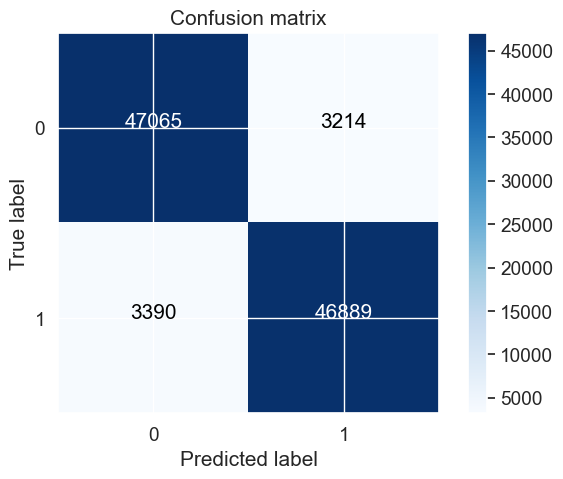

TEST METRICS
Accuracy score : 0.21
Recall score : 0.86
F1 score : 0.26
AUC score : 0.6475745073917888


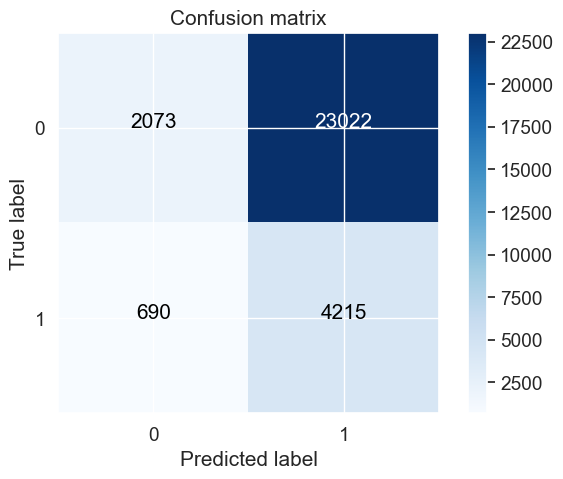

TRAIN PLOTS


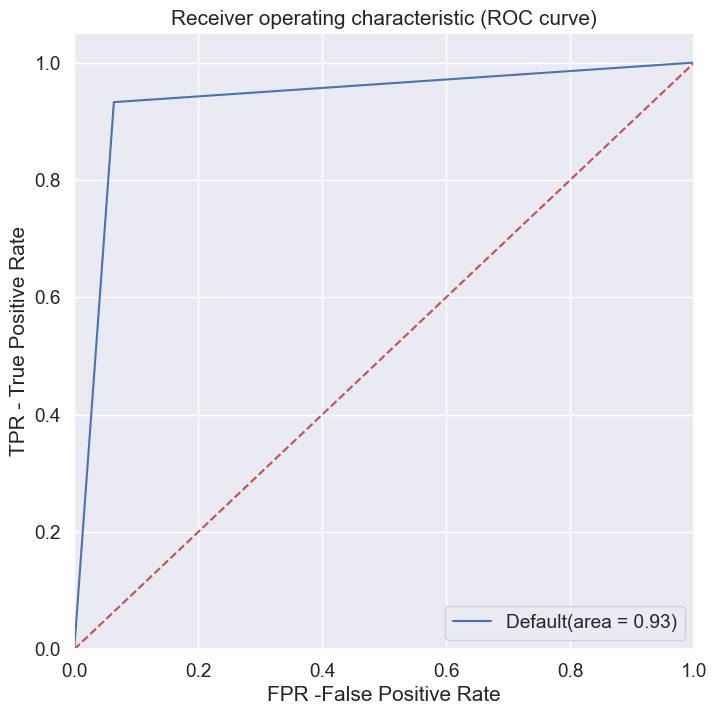

Area under curve is: 0.93
Recall for our model is: 0.93
Accuracy on test set is: 0.93
Confusion matrix for our model is: [[47065  3214]
 [ 3390 46889]]
TEST PLOTS


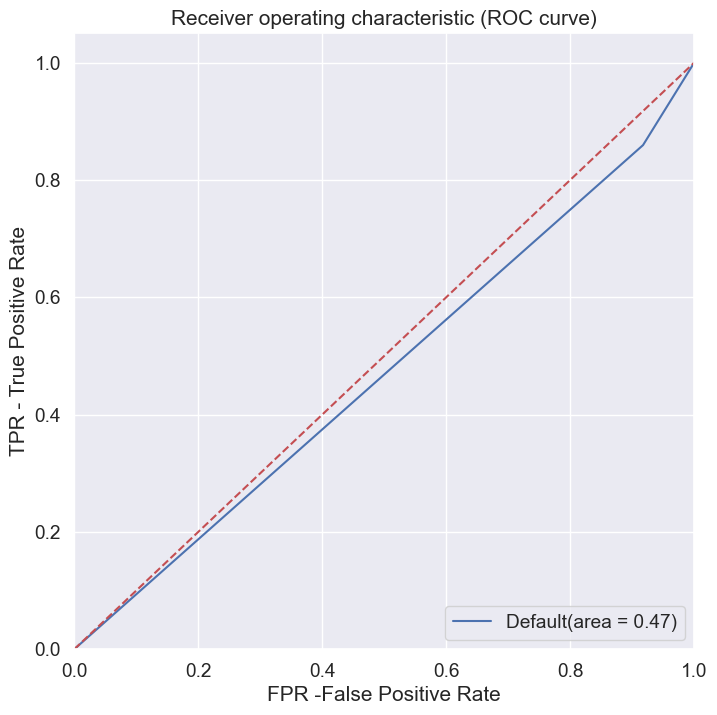

Area under curve is: 0.47
Recall for our model is: 0.86
Accuracy on test set is: 0.21
Confusion matrix for our model is: [[ 2073 23022]
 [  690  4215]]


In [141]:
predict("GradientBoosting_Default", gb,X_train,X_finaltest,y_train,y_finaltest)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.77
Recall score : 0.72
F1 score : 0.75
AUC score : 0.8033386968679525


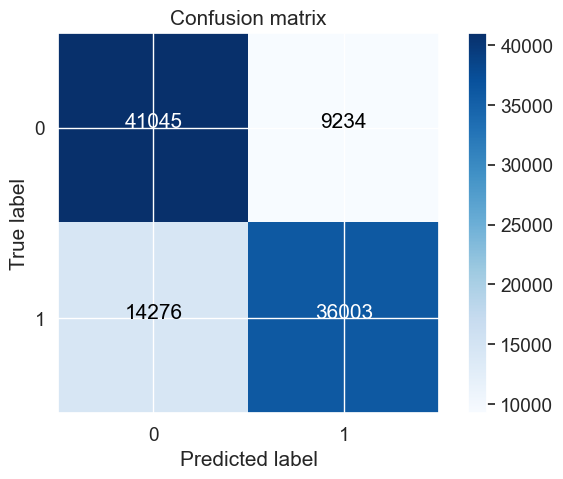

TEST METRICS
Accuracy score : 0.8
Recall score : 0.46
F1 score : 0.43
AUC score : 0.6980803019880215


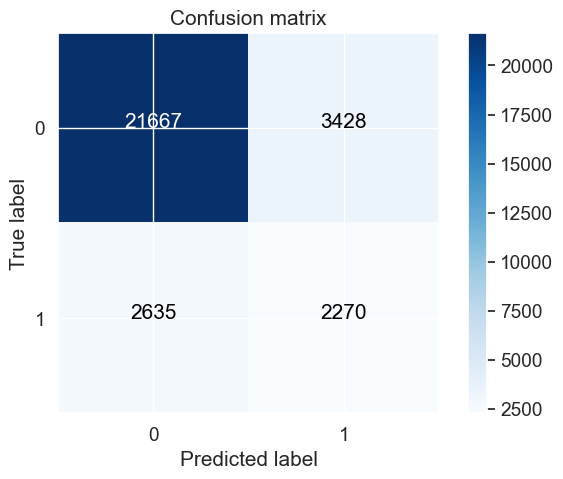

TRAIN PLOTS


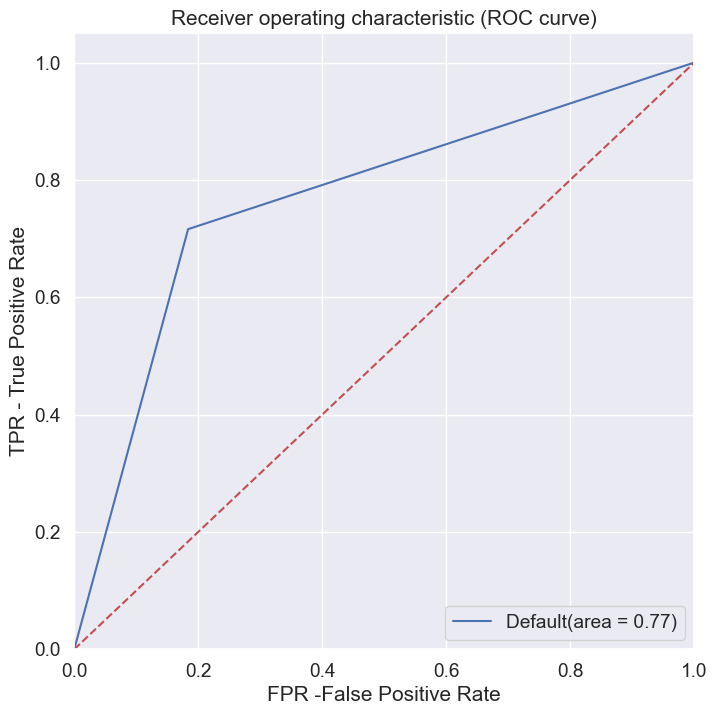

Area under curve is: 0.77
Recall for our model is: 0.72
Accuracy on test set is: 0.77
Confusion matrix for our model is: [[41045  9234]
 [14276 36003]]
TEST PLOTS


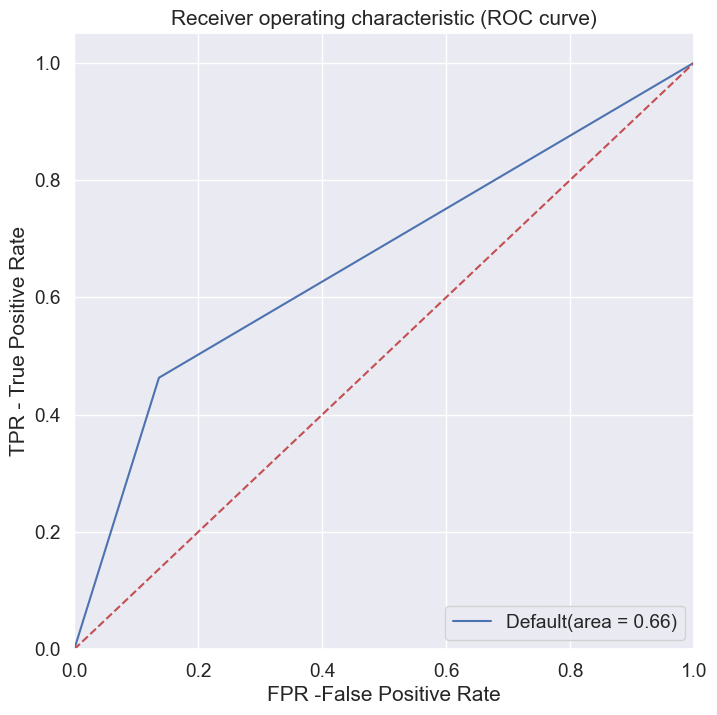

Area under curve is: 0.66
Recall for our model is: 0.46
Accuracy on test set is: 0.8
Confusion matrix for our model is: [[21667  3428]
 [ 2635  2270]]


In [142]:
predict("DecisionTree_PCA", dt_pca_best,X_train_pca,X_finaltest_pca,y_train,y_finaltest)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.86
Recall score : 0.87
F1 score : 0.86
AUC score : 0.9267685663626036


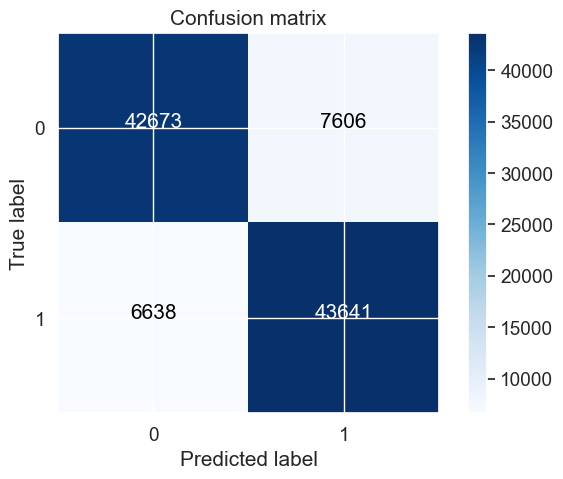

TEST METRICS
Accuracy score : 0.32
Recall score : 0.84
F1 score : 0.29
AUC score : 0.6215184581972806


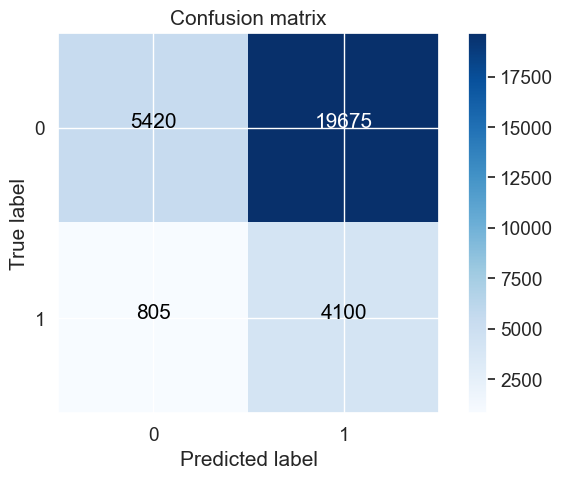

TRAIN PLOTS


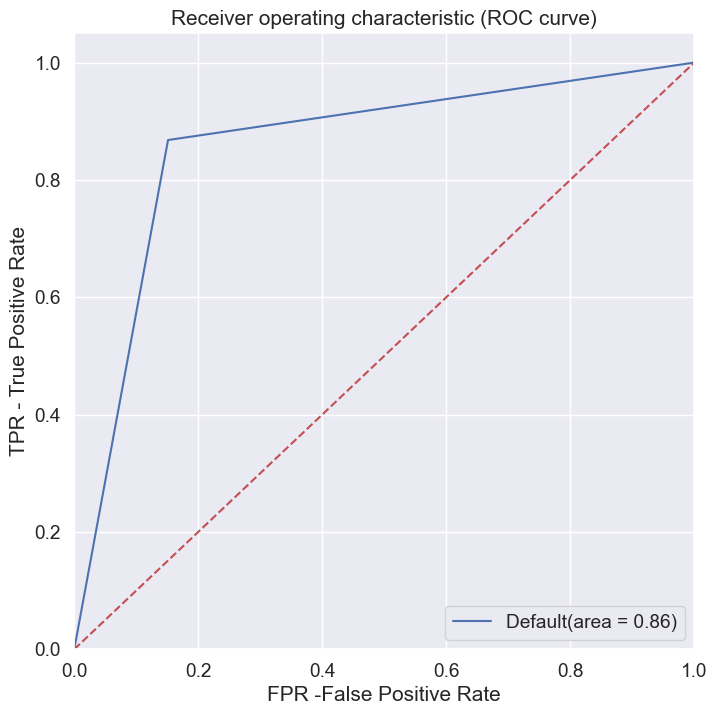

Area under curve is: 0.86
Recall for our model is: 0.87
Accuracy on test set is: 0.86
Confusion matrix for our model is: [[42673  7606]
 [ 6638 43641]]
TEST PLOTS


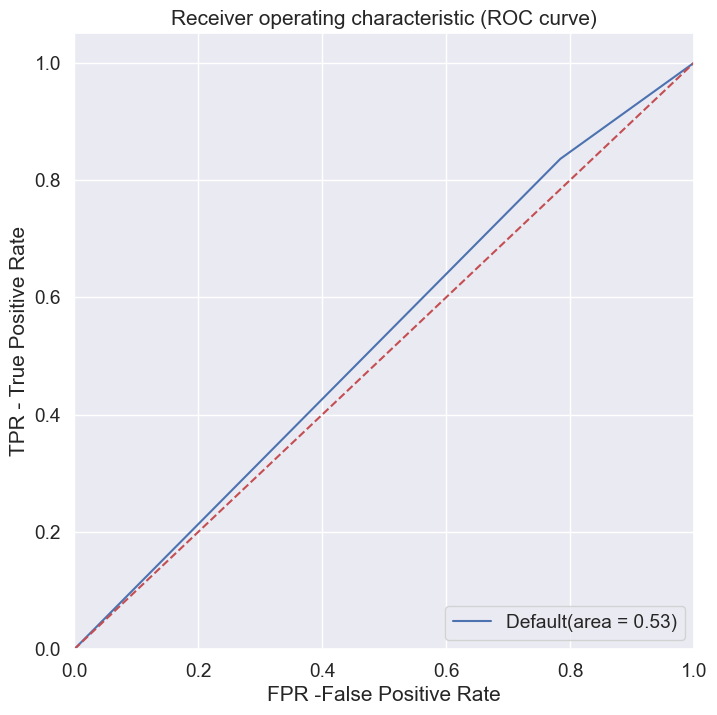

Area under curve is: 0.53
Recall for our model is: 0.84
Accuracy on test set is: 0.32
Confusion matrix for our model is: [[ 5420 19675]
 [  805  4100]]


In [143]:
predict("GradientBoosting_PCA",gb_pca,X_train_pca,X_finaltest_pca,y_train,y_finaltest)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.93
Recall score : 0.94
F1 score : 0.93
AUC score : 0.9836050002781649


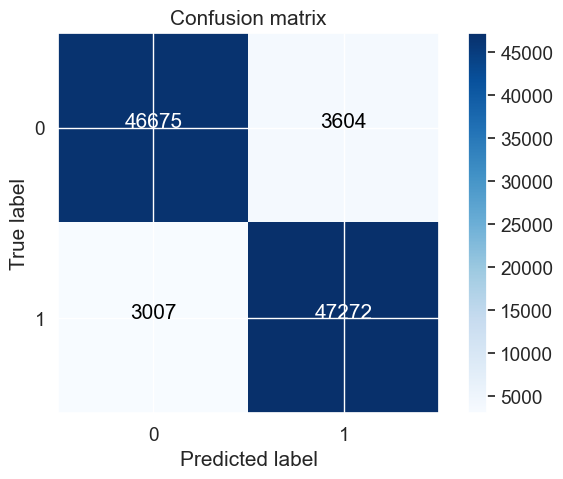

TEST METRICS
Accuracy score : 0.84
Recall score : 0.11
F1 score : 0.18
AUC score : 0.676701244750072


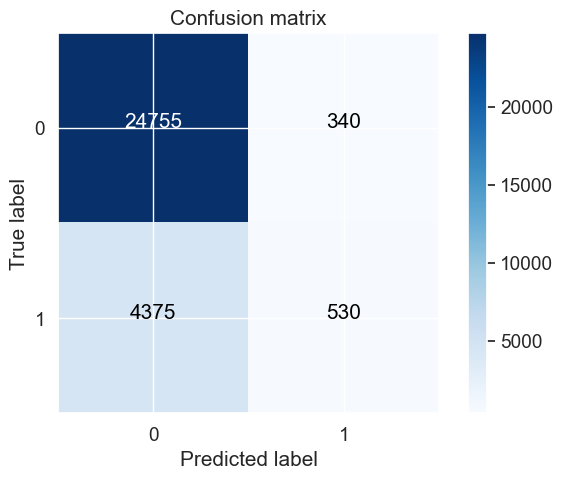

TRAIN PLOTS


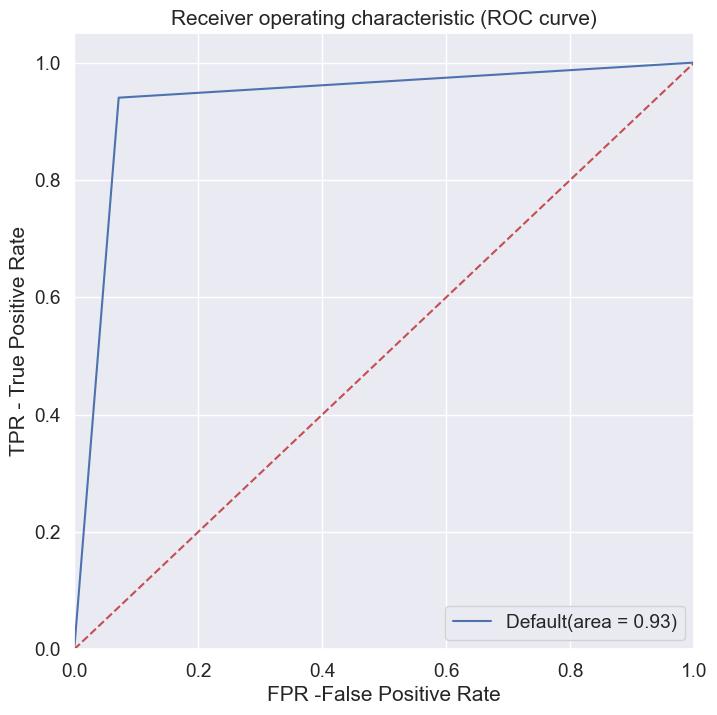

Area under curve is: 0.93
Recall for our model is: 0.94
Accuracy on test set is: 0.93
Confusion matrix for our model is: [[46675  3604]
 [ 3007 47272]]
TEST PLOTS


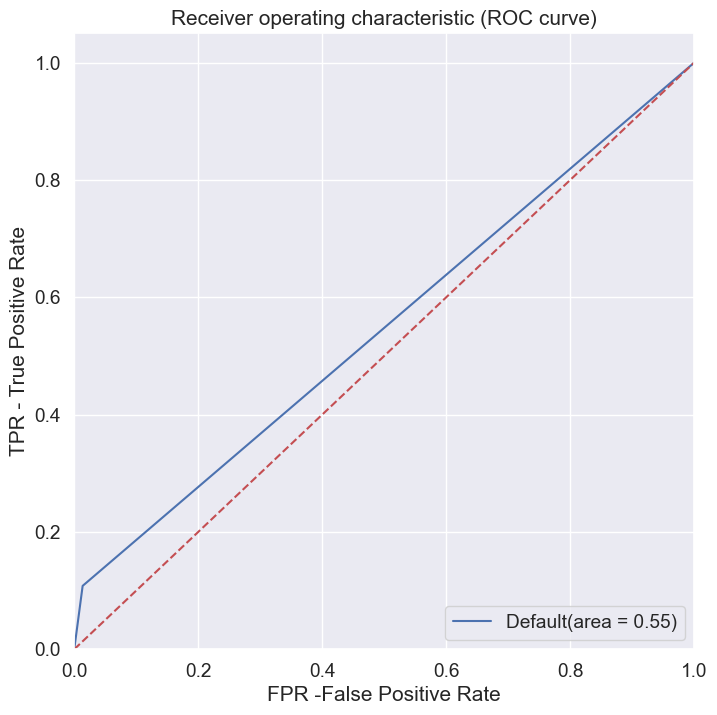

Area under curve is: 0.55
Recall for our model is: 0.11
Accuracy on test set is: 0.84
Confusion matrix for our model is: [[24755   340]
 [ 4375   530]]


In [144]:
predict("RandomForest_PCA", rf_pca_best,X_train_pca,X_finaltest_pca,y_train,y_finaltest)

In [145]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df["y_test"] = y_finaltest
y_test_pred_df["y_prob_test"] = dt_pca_best.predict_proba(X_finaltest_pca)[:,1]
y_test_pred_df["final_predicted"] = y_test_pred_df.y_prob_test.map(lambda x: 1 if x > 0.6 else 0)
calculate_metrics(y_finaltest, y_test_pred_df.final_predicted)
calculate_metrics_prob(y_finaltest, y_test_pred_df.y_prob_test)

Accuracy score : 0.8
Recall score : 0.46
F1 score : 0.43


(array([[21667,  3428],
        [ 2635,  2270]], dtype=int64),
 0.8,
 0.4,
 0.46,
 0.43)

AUC score : 0.6980803019880215


0.6980803019880215

In [146]:
y_finaltest_pred_df = pd.DataFrame()
y_finaltest_pred_df["y_test"] = y_finaltest
y_finaltest_pred_df["y_prob_test"] = logreg_top15.predict_proba(X_finaltest[col_top15])[:,1]
#y_finaltest_pred_df["y_prob_test"] = dt_best.predict_proba(X_finaltest)[:,1]
y_finaltest_pred_df["final_predicted"] = y_finaltest_pred_df.y_prob_test.map(lambda x: 1 if x > 0.6 else 0)
calculate_metrics(y_finaltest, y_finaltest_pred_df.final_predicted)
calculate_metrics_prob(y_finaltest, y_finaltest_pred_df.y_prob_test)

Accuracy score : 1.0
Recall score : 1.0
F1 score : 1.0


(array([[25095,     0],
        [   17,  4888]], dtype=int64),
 1.0,
 1.0,
 1.0,
 1.0)

AUC score : 1.0


1.0

## Final Model we can select the model with highest Recall value as we need to detect more number churn customers

In [147]:
churn_submission = churn_solution.copy()
churn_submission["churn_probability"] = y_finaltest_pred_df.y_prob_test.map(lambda x: 1 if x > 0.6 else 0)

In [148]:
churn_submission.head()

,id,churn_probability
0,69999,0
1,70000,0
2,70001,1
3,70002,0
4,70003,0


In [149]:
filename = 'Submission.csv'
churn_submission.to_csv(filename, index=False)
print('Internal submission file generated:' + filename)

Internal submission file generated:Submission.csv


## For Kaggle competetion we can chosse the model with highest accuracy

In [150]:
Kaggle_submission = churn_solution.copy()
Kaggle_submission["churn_probability"] = y_test_pred_df.y_prob_test.map(lambda x: 1 if x > 0.6 else 0)

In [151]:
filename = 'Badari_SaurabhBhargava.csv'
Kaggle_submission.to_csv(filename, index=False)
print('Kaggle submission file generated:' + filename)

Kaggle submission file generated:Badari_SaurabhBhargava.csv


## Feature Importance

In [152]:
col_top15

['arpu_6',
 'offnet_mou_8',
 'roam_og_mou_8',
 'loc_og_t2t_mou_8',
 'std_og_t2m_mou_8',
 'og_others_8',
 'loc_ic_t2m_mou_8',
 'loc_ic_t2f_mou_8',
 'loc_ic_mou_8',
 'total_ic_mou_7',
 'total_ic_mou_8',
 'spl_ic_mou_8',
 'total_rech_num_8',
 'last_day_rch_amt_8']

In [153]:
# create dataframe
feature_importance = pd.DataFrame({'variables': X.columns, 'importance_percentage': dt_best.feature_importances_*100})
feature_importance = feature_importance[['variables', 'importance_percentage']]

# sort features
feature_importance = feature_importance.sort_values('importance_percentage', ascending=False).reset_index(drop=True)
print("Sum of importance=", feature_importance.importance_percentage.sum())
feature_importance.head(15)

Sum of importance= 99.99999999999999


,variables,importance_percentage
0,total_ic_mou_8,70.60
1,roam_og_mou_8,18.41
2,last_day_rch_amt_8,4.15
3,date_of_last_rech_8,2.75
4,total_rech_data_8,2.12
5,total_rech_amt_8,1.97
6,total_rech_num_6,0.00
7,total_rech_num_7,0.00
8,total_rech_num_8,0.00
9,total_rech_amt_6,0.00


In [154]:
# create dataframe
feature_importance = pd.DataFrame({'variables': X.columns, 'importance_percentage': gb.feature_importances_*100})
feature_importance = feature_importance[['variables', 'importance_percentage']]

# sort features
feature_importance = feature_importance.sort_values('importance_percentage', ascending=False).reset_index(drop=True)
print("Sum of importance=", feature_importance.importance_percentage.sum())
feature_importance.head(15)

Sum of importance= 99.99999999999999


,variables,importance_percentage
0,total_ic_mou_8,40.77
1,loc_ic_mou_8,18.36
2,roam_og_mou_8,10.60
3,date_of_last_rech_8,4.56
4,last_day_rch_amt_8,4.56
5,roam_ic_mou_8,2.97
6,total_rech_amt_8,2.07
7,total_rech_num_8,1.50
8,spl_ic_mou_8,1.43
9,total_rech_data_8,1.35


## Conclusion

**Exploratory Data Analysis (EDA) Findings on Continuous Variables:**
1. NIGHT_PCK_USER - The churn rate experiences an increase from month 6 to 8 for night_pck_user when its value is -1.
2. MONTHTLY_2g - The churn rate exhibits an increase from month 6 to 8 for monthly_2g when its value is 0.
3. MONTHTLY_3g - The churn rate sees a rise from month 6 to 8 for monthly_3g when its value is 0.

**Exploratory Data Analysis (EDA) Findings on Categorical Variables:**
1. arpu_6 - Values within the range of -210 to 15 display a higher churn rate compared to the average churn rate of 6%.
2. offnet_mou_6 - Churn rates are higher for values ranging from -859 to 1073 when compared to the average churn rate of 6%.
3. roam_ic_mou_6 - Churn rate increases with higher values.
4. loc_og_t2c_mou_6 - Values between 135 to 217 are associated with a higher churn rate compared to the average churn rate of 6%.
5. std_og_t2t_mou_6 - Values within the range of 120 to 240 exhibit a higher churn rate than the average churn rate of 6%.
6. std_og_t2m_mou_6 - Churn rates are elevated for values within the range of 155 to 345 when compared to the average churn rate of 6%.
7. std_og_mou_6 - Values ranging from 612 to 969 result in a higher churn rate compared to the average churn rate of 6%.
8. isd_og_mou_6 - Churn rates are higher for values within the range of 295 to 1475 compared to the average churn rate of 6%.
9. total_og_mou_6 - Churn rate increases as the values increase.
10. loc_ic_t2t_mou_6, loc_ic_t2m_mou_6, loc_ic_t2f_mou_6, loc_ic_mou_6, total_ic_mou_6 - Churn rates decrease as the values increase.
11. total_rech_num_6, total_rech_amt_6, av_rech_amt_data_6 - Churn rate increases as the values increase.
12. vbc_3g_6 - Churn rate decreases as the values increase.
13. arpu_7, offnet_mou_7 - Churn rate increases with higher values.
14. offnet_mou_7 - Churn rates are higher for values within the range of 1056 to 3874 compared to the average churn rate of 6%.
15. std_og_t2t_mou_7 - Churn rate increases with higher values.
16. std_og_t2m_mou_7 - Churn rate increases with higher values.
17. std_og_mou_7 - Churn rate increases with higher values.
18. total_og_mou_7 - Churn rate increases with higher values.
19. vbc_3g_7 - Values ranging from 4582 to 5041 have a higher churn rate compared to the average churn rate of 6%.
20. arpu_8, onnet_mou_8 - Churn rate increases with higher values.
21. total_rech_amt_8 - Values from 30 to 33 have a higher churn rate compared to the average churn rate of 6%.
22. max_rech_data_8 - Values from 466 to 155 have a higher churn rate compared to the average churn rate of 6%.
23. av_rech_amt_data_8, vol_3g_mb_8, vbc_3g_8 - High values are associated with a higher churn rate compared to the average churn rate of 6%.
24. aon - Churn rate decreases as the values increase.

**For the following variables, the mean value displays a sharp decline for churn customers, while it remains stable for non-churn customers over the months:**

1. offnet_mou
2. total_rech_num
3. total_og_mou
4. std_ic_mou
5. arpu
6. onnet_mou
7. std_ic_t2m_mou
8. std_og_mou
9. std_ic_t2t_mou
10. loc_og_t2t_mou
11. isd_og_mou
12. total_rech_amt
13. loc_ic_mou
14. std_ic_t2f_mou
15. total_ic_mou
16. loc_og_t2m_mou
17. loc_ic_t2m_mou
18. vol_2g_mb
19. std_og_t2m_mou
20. loc_og_mou
21. std_og_t2t_mou
22. last_day_rch_amt

**For the following variables, the mean value is lower for churn customers and higher for non-churn customers over the months:**

1. loc_og_t2f_mou
2. ic_others
3. loc_ic_t2f_mou
4. monthly_2g
5. loc_ic_t2t_mou
6. loc_og_t2t_mou
7. date_of_last_rech_data
8. night_pck_user
9. loc_ic_mou
10. std_ic_t2f_mou
11. std_og_t2f_mou
12. roam_og_mou
13. roam_ic_mou
14. total_ic_mou
15. loc_og_t2m_mou
16. loc_ic_t2m_mou
17. loc_og_mou

**For the following variables, the mean value experiences a sharp decrease for churn customers, while it increases for non-churn customers across the months:**

1. vol_3g_mb
2. max_rech_data
3. fb_user
4. sachet_2g
5. monthly_3g
6. night_pck_user
7. av_rech_amt_data
8. max_rech_amt
9. isd_ic_mou
10. sachet_3g
11. total_rech_data

**The mean value increases steadily for churn customers, while it decreases for non-churn customers across the months for the variable:**
1. vbc_3g

**The mean value increases steadily for churn customers, and it remains unchanged for non-churn customers across the months for the following variable:**

1. date_of_last_rech

**Table for Churn Customers, showing the first quartile (Q1) and third quartile (Q3) values for the relevant metrics with NaN data removed:**

|  **Metric**          |**Churn Customer Q1** | **Churn Customer Q3** |
|----------------------|--------------------|--------------------|
| std_og_mou_6         | 0.0                | 77.88              |
| date_of_last_rech_7 | 1.0                | 8.0                |
| std_og_t2t_mou_6     | 0.0                | 4.4                |
| std_og_t2m_mou_6     | 0.0                | 22.61              |
| date_of_last_rech_8 | 1.0                | 7.0                |
| onnet_mou_6         | 0.0                | 69.05              |
| total_og_mou_6       | 0.0                | 307.71             |
| total_rech_num_6    | 3.0                | 9.0                |
| arpu_6               | 87.25              | 341.71             |
| date_of_last_rech_6 | 1.0                | 9.0                |
| total_rech_amt_6    | 86.0               | 396.0              |
| offnet_mou_6        | 6.0                | 164.03             |


Table for All Customers, showing the first quartile (Q1) and third quartile (Q3) values for the relevant metrics with NaN data removed:

| Metric               | **All Customer Q1** | **All Customer Q3** |
|----------------------|-----------------|-----------------|
| std_og_mou_6         | 0.0             | 133.89          |
| date_of_last_rech_7 | 1.0             | 8.0             |
| std_og_t2t_mou_6     | 0.0             | 27.16           |
| std_og_t2m_mou_6     | 0.0             | 49.15           |
| date_of_last_rech_8 | 1.0             | 7.0             |
| onnet_mou_6         | 5.43            | 113.1           |
| total_og_mou_6       | 44.78           | 374.3           |
| total_rech_num_6    | 3.0             | 9.0             |
| arpu_6               | 93.58           | 370.79          |
| date_of_last_rech_6 | 1.0             | 9.0             |
| total_rech_amt_6    | 110.0           | 438.0           |
| offnet_mou_6        | 28.79           | 223.54          |
| std_og_t2t_mou_7     | 0.0             | 27.44           |

<p><strong>Final Model :</strong></p>
<p>Selecting the RFE (Recursive Feature Elimination) combined with Logistic Regression and fine-tuning the threshold as the ultimate model for predicting customer churn is a strategic decision based on the following key factors:</p>
<ol>
<li>RFE Feature Elimination: RFE excels in reducing the number of features, resulting in a simpler, more robust, and generalized model. By eliminating less important variables, the model becomes more streamlined and interpretable.</li>

<li>Enhanced Recall: This model prioritizes achieving a high recall value, which ensures the ability to detect churn customers with a greater level of accuracy. This is crucial for identifying and capturing as many churn instances as possible, reducing the chances of missing potential churners.</li>
</ol>

In [155]:
for i,col in enumerate(col_top15): 
    print(col+' '+str(logreg_top15.coef_[0][i]))

arpu_6 0.4072823104647084
offnet_mou_8 -1.3727701391280933
roam_og_mou_8 0.4178593158284275
loc_og_t2t_mou_8 -0.2897000671742238
std_og_t2m_mou_8 1.1757619115529967
og_others_8 -2.325325211605418
loc_ic_t2m_mou_8 -0.19439984581883207
loc_ic_t2f_mou_8 -0.6908662748170992
loc_ic_mou_8 -2.0083734859997366
total_ic_mou_7 0.5747692534090149
total_ic_mou_8 -0.9857389203123665
spl_ic_mou_8 -0.9369834560050265
total_rech_num_8 -0.7846591992001711
last_day_rch_amt_8 -0.7898548248895891


## Model Insights

In [156]:
consolidate_summary.sort_values(by=['Accuracy', 'Recall','Recall', 'AUC'],ascending=True).reset_index()

,index,Model,Accuracy,Precision,Recall,AUC,F1
0,0,DecisionTree,0.15,0.14,0.84,0.43,0.25
1,0,GradientBoosting_Default,0.21,0.15,0.86,0.65,0.26
2,0,GradientBoosting_PCA,0.32,0.17,0.84,0.62,0.29
3,0,DecisionTreeHypTuned,0.64,0.16,0.30,0.34,0.21
4,0,DecisionTree_PCA,0.80,0.40,0.46,0.70,0.43
5,0,RandomForest_PCA,0.84,0.61,0.11,0.68,0.18
6,0,LogisticReg,1.00,1.00,1.00,1.00,1.00
7,0,LogisticRegRFE,1.00,1.00,1.00,1.00,1.00
